In [1]:
import numpy as np
import pandas as pd
import pickle
import os
import torch
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
torch.use_deterministic_algorithms(False)
torch.backends.cudnn.benchmark = False

In [3]:
torch.cuda.is_available()

True

In [4]:
outcome='pd_true'

In [5]:
import torch

cuda = torch.device('cuda')     # Default CUDA device
cuda0 = torch.device('cuda:0')
cuda1 = torch.device('cuda:1')  


# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device(cuda)

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(cuda))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 2 GPU(s) available.
We will use the GPU: NVIDIA A100 80GB PCIe


In [6]:
prefix = '../../'

In [7]:
all_reports = pd.read_csv(prefix + 'timc_recist_labeled_dataset_id.csv')
all_reports['report_length'] = all_reports.report_text.str.len()
all_reports['date'] = pd.to_datetime(all_reports.date)
all_reports = all_reports.sort_values(by=['obs','dfci_mrn','date'])
all_reports['text'] = all_reports["report_text"]
all_reports['text'] = all_reports.text.str.lower().str.replace("\r|\n", " ")
all_reports['text'] = all_reports.text.str.replace(r"\s+", ' ')

In [8]:
%%capture
diagnoses = pd.read_csv('../../timc_data/timepointreport.csv', low_memory=False, on_bad_lines='skip')
#diagnoses = pd.read_csv('../../timc_data/timepointreport.csv', low_memory=False)



diagnoses = diagnoses[['MRN','Protocol','Condition']].groupby(['MRN','Protocol']).first().reset_index().rename(columns={'MRN':'BWH_MRN', 'Protocol':'protocol'})
diagnoses.info()


mrn_crosswalk = pd.read_csv('/data/clin_notes_outcomes/profile_3-2024/structured_data/REQ_KK71_105304_F5_PT_INFO_STATUS_REGISTRATION.csv', low_memory=False)[['BWH_MRN','DFCI_MRN', 'GENDER_NM']]
demographics = pd.read_csv('/data/clin_notes_outcomes/profile_3-2024/structured_data/REQ_KK71_105304_F5_DEMOGRAPHICS_REGISTRATION.csv')[['DFCI_MRN','IDM_RACE_NM','HISPANIC_IND']].groupby('DFCI_MRN').first().reset_index()
demographics['white_race'] = np.where(demographics.IDM_RACE_NM == 'White', 1, 0)
mrn_crosswalk = pd.merge(mrn_crosswalk, demographics, on='DFCI_MRN')

In [9]:
#mrn_crosswalk.GENDER_NM.value_counts(), mrn_crosswalk.IDM_RACE_NM.value_counts(), mrn_crosswalk.HISPANIC_IND.value_counts()

In [10]:
diagnoses = pd.merge(diagnoses, mrn_crosswalk, on = 'BWH_MRN').groupby(['DFCI_MRN','protocol']).first().reset_index().rename(columns={'DFCI_MRN':'dfci_mrn'})[['dfci_mrn','GENDER_NM','white_race','HISPANIC_IND','protocol','Condition']]

In [11]:
diagnoses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8648 entries, 0 to 8647
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dfci_mrn      8648 non-null   int64 
 1   GENDER_NM     8648 non-null   object
 2   white_race    8648 non-null   int64 
 3   HISPANIC_IND  8648 non-null   object
 4   protocol      8648 non-null   object
 5   Condition     8623 non-null   object
dtypes: int64(2), object(4)
memory usage: 405.5+ KB


In [12]:
# remove duplicates
all_reports = all_reports.drop_duplicates(subset=['dfci_mrn','text'])

In [13]:
all_reports.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63899 entries, 0 to 63914
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Unnamed: 0               63899 non-null  int64         
 1   dfci_mrn                 63899 non-null  int64         
 2   date                     63899 non-null  datetime64[ns]
 3   report_text              63899 non-null  object        
 4   protocol                 63899 non-null  object        
 5   overall_response         63899 non-null  object        
 6   narrative_text           63896 non-null  object        
 7   impression_text          35806 non-null  object        
 8   drop_this_obs            63899 non-null  bool          
 9   split                    63899 non-null  object        
 10  obs                      63899 non-null  int64         
 11  overall_response_factor  63899 non-null  int64         
 12  report_length            63899 non-nu

In [14]:
all_reports.shape

(63899, 14)

In [15]:
all_reports = pd.merge(diagnoses, all_reports, on=['dfci_mrn','protocol'])
all_reports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63716 entries, 0 to 63715
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   dfci_mrn                 63716 non-null  int64         
 1   GENDER_NM                63716 non-null  object        
 2   white_race               63716 non-null  int64         
 3   HISPANIC_IND             63716 non-null  object        
 4   protocol                 63716 non-null  object        
 5   Condition                63235 non-null  object        
 6   Unnamed: 0               63716 non-null  int64         
 7   date                     63716 non-null  datetime64[ns]
 8   report_text              63716 non-null  object        
 9   overall_response         63716 non-null  object        
 10  narrative_text           63713 non-null  object        
 11  impression_text          35760 non-null  object        
 12  drop_this_obs            63716 n

In [16]:
all_reports['starttime'] = all_reports.groupby('obs').date.transform('first')
all_reports['time'] =  (all_reports['date'] - all_reports['starttime']).dt.days

In [17]:
all_reports.shape

(63716, 20)

In [18]:
all_reports.overall_response_factor.value_counts()

overall_response_factor
3    20048
0    15892
1    15377
4     9161
2     3238
Name: count, dtype: int64

In [19]:
all_reports.overall_response.value_counts()

overall_response
SD    20048
BL    15892
PR    15377
PD     9161
CR     3238
Name: count, dtype: int64

In [20]:
all_reports['prcr_true'] = np.where(all_reports.overall_response.isin(['PR','CR']), 1, 0)
all_reports['pd_true'] = np.where(all_reports.overall_response == 'PD', 1, 0)

# baseline scans get coded as -1 for both the PD and PRCR outcomes.
all_reports['outcome'] = np.where(all_reports.overall_response == 'BL', -1, 0)
all_reports['outcome'] = np.where(all_reports[outcome]==1, 1, all_reports['outcome'])
print(all_reports.outcome.value_counts())
print(all_reports.prcr_true.value_counts())
print(all_reports.pd_true.value_counts())
all_reports['is_bl'] = np.where(all_reports.overall_response == 'BL', True, False)

good_obs = all_reports.groupby('obs').is_bl.all().reset_index()
good_obs = good_obs[good_obs.is_bl == False]

all_reports = pd.merge(all_reports, good_obs[['obs']], on='obs')

print(all_reports.outcome.value_counts())
print(all_reports.prcr_true.value_counts())
print(all_reports.pd_true.value_counts())

outcome
 0    38663
-1    15892
 1     9161
Name: count, dtype: int64
prcr_true
0    45101
1    18615
Name: count, dtype: int64
pd_true
0    54555
1     9161
Name: count, dtype: int64
outcome
 0    38663
-1    12594
 1     9161
Name: count, dtype: int64
prcr_true
0    41803
1    18615
Name: count, dtype: int64
pd_true
0    51257
1     9161
Name: count, dtype: int64


In [21]:
cancer_list = all_reports.groupby('dfci_mrn').first().reset_index(drop=True).Condition.value_counts()
percentages = cancer_list/cancer_list.sum()
cancer_types = pd.DataFrame({'cancer_type':cancer_list.index, 'proportion':percentages}).reset_index(drop=True)
cancer_types.to_csv('cancer_type_distribution.csv')
cancer_types.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   cancer_type  91 non-null     object 
 1   proportion   91 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.6+ KB


In [22]:
percentages

Condition
Breast                                0.211721
Ovarian                               0.106733
Lung Non-Small                        0.094514
Chronic Lymphocytic Leukemia (CLL)    0.055362
Renal Cell                            0.040399
                                        ...   
Neuroblastoma                         0.000249
Epithelioid Hemangioendothelioma      0.000249
Glioblastoma                          0.000249
Testicular Cancer                     0.000249
Double Hit Lymphoma                   0.000249
Name: count, Length: 91, dtype: float64

In [23]:
top_five_cancers = all_reports.Condition.value_counts().head(5).index.tolist()
#head(5).tolist()
top_five_cancers

['Breast',
 'Ovarian',
 'Lung Non-Small',
 'Chronic Lymphocytic Leukemia (CLL)',
 'Renal Cell']

In [24]:
#training = all_reports[all_reports['split'] == 'train']
validation = all_reports[all_reports['split'] == 'validation']
test = all_reports[all_reports['split'] == 'test']

In [25]:
from torch.utils import data
import torch.nn.functional as F
from transformers import AutoTokenizer

class RecistDataset(data.Dataset):
    def __init__(self, pandas_dataset):
        self.data = pandas_dataset
        self.max_doc_len = 512
        self.tokenizer = AutoTokenizer.from_pretrained("medicalai/ClinicalBERT")
        self.observations = self.data.obs.unique()
        
    def __len__(self):
        # how many observations (pt-trial combos) in the dataset
        return len(self.observations)
    
    def __getitem__(self, index):
        # get data for observation corresponding to index passed
        thisobs = self.observations[index]
        obs = self.data[self.data.obs == thisobs].copy().reset_index(drop=True)
        
        obs['date'] = pd.to_datetime(obs['date'])
        obs = obs.sort_values(by=['date'])

        start_times = torch.tensor(obs.time / 365, dtype=torch.float32)

    
        y_outcome = torch.tensor(obs['outcome'], dtype=torch.float32)

        text = obs.text.tolist()
        
        
        encoded_list = self.tokenizer(text, padding='max_length', max_length=self.max_doc_len, truncation=True)
        input_ids = torch.tensor(encoded_list['input_ids'], dtype=torch.long)
        attention_mask = torch.tensor(encoded_list['attention_mask'], dtype=torch.long) 
        
        return input_ids, attention_mask, start_times, y_outcome

    

        

/homes10/klkehl/miniconda3/envs/vllm2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [26]:
#model 
import math
from transformers import AutoModel
from torch.nn import functional as F
import torch.nn as nn
from torch import Tensor
from torch.utils.data import DataLoader
from torch.nn import LSTM, Linear, Embedding, Conv1d, MaxPool1d, GRU, LSTMCell, GRUCell, Dropout, AdaptiveMaxPool1d
from recistmodels import HTransformer
    
    

###### from: https://pytorch.org/tutorials/beginner/transformer_tutorial.html
class PositionalEncoding(nn.Module):

    def __init__(self, d_model: int, dropout: float = 0.0, max_len: int = 150):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: Tensor) -> Tensor:
        """
        Arguments:
            x: Tensor, shape ``[seq_len, batch_size, embedding_dim]``
        """
        x = x + self.pe[:x.size(0)]
        return self.dropout(x)

    
class RecistModel(nn.Module):


    def __init__(self):
        super(RecistModel, self).__init__()
        
        self.day_tensor_dim = 768
        self.per_doc_hidden_dim = 256
        
        self.final_hidden_dim = 128
        self.class_output_dim=1
      
        self.note_bert = AutoModel.from_pretrained('medicalai/ClinicalBERT')
            
        self.per_doc_hidden = Linear(self.day_tensor_dim, self.per_doc_hidden_dim)
        
        self.day_transformer = HTransformer(emb=self.per_doc_hidden_dim, heads=4, depth=1)
        
        self.day_position_encoding = PositionalEncoding(self.per_doc_hidden_dim)
        
        self.final_hidden = Linear(self.per_doc_hidden_dim, self.final_hidden_dim)
        
        self.recist_out = Linear(self.final_hidden_dim, self.class_output_dim)

        

        

    def forward(self, input_ids, mask, start_times):

        
        input_ids = input_ids.squeeze(0)
        mask = mask.squeeze(0)
        start_times = start_times.squeeze(0) # now (num_docs,)
        
        main = self.note_bert(input_ids, mask)
        main = main.last_hidden_state[:,0,:].squeeze(1)
              
        main = self.per_doc_hidden(main)

        # batch = sequence_length, embedding
        # permute to get position encoding along temporal dimension


        # add a single batch dimension, then position encode, then remove batch dimension
        main = main.unsqueeze(1)
        main = self.day_position_encoding(main)
        main = main.squeeze(1)
        
        # figure out unique start times.
        unique_start_times = torch.unique(start_times)
        
        # loop over unique start times
        day_tensor_list = []
        for start_time in unique_start_times:
            day_input = main[start_times == start_time]
            
            # batch of 1 axis back
            day_input = day_input.unsqueeze(0)

            day_output = torch.max(day_input, axis=1)[0]

            day_tensor_list.append(day_output)
        day_tensors = torch.cat(day_tensor_list)
        

        # batch axis back for hierarchical transformer
        day_tensors = day_tensors.unsqueeze(0)
        main = self.day_transformer(day_tensors)
        main = self.final_hidden(main)
        main = F.relu(main)
        
        # remove batch axis again
        main = main.squeeze(0)
        main = self.recist_out(main).squeeze(1)
               
        return main


In [27]:
validation_full = validation[validation['text'].notna()]
test_full = test[test['text'].notna()]


In [28]:
top_five_cancers

['Breast',
 'Ovarian',
 'Lung Non-Small',
 'Chronic Lymphocytic Leukemia (CLL)',
 'Renal Cell']

In [29]:
model_paths = ['/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt',
               '/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt']

In [30]:
from utils_102023 import eval_model

validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9161163877581788
Outcome probability: 0.22811059907834103
Average precision score: 0.78
Best F1: 0.7614678899082569


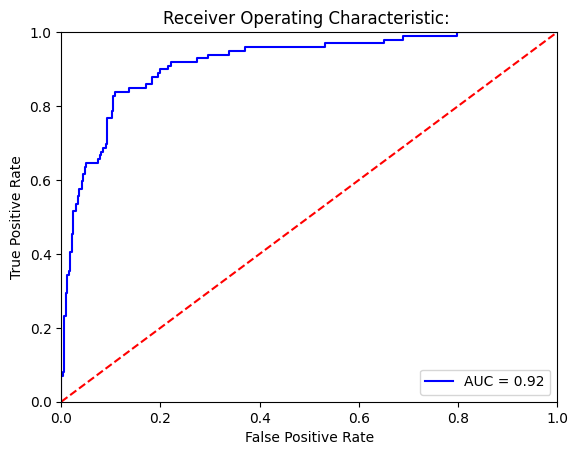

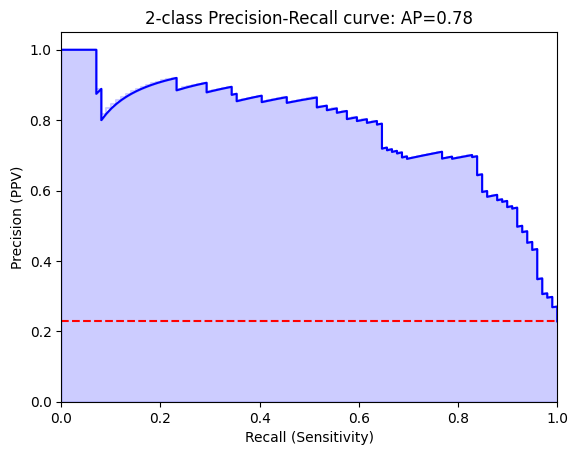

Threshold for best F1:
-0.37571797
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[299  36]
 [ 16  83]]


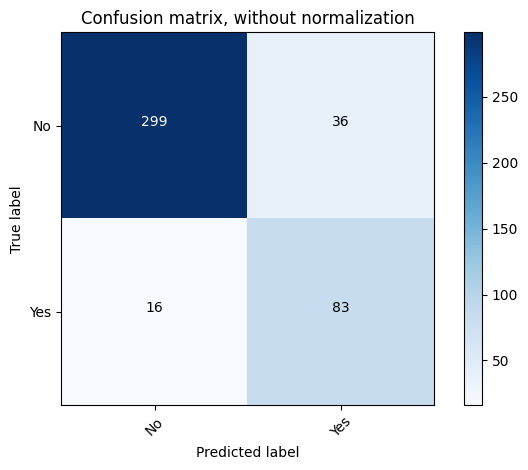

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.89      0.92       335
         Yes       0.70      0.84      0.76        99

    accuracy                           0.88       434
   macro avg       0.82      0.87      0.84       434
weighted avg       0.89      0.88      0.88       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[309  26]
 [ 34  65]]


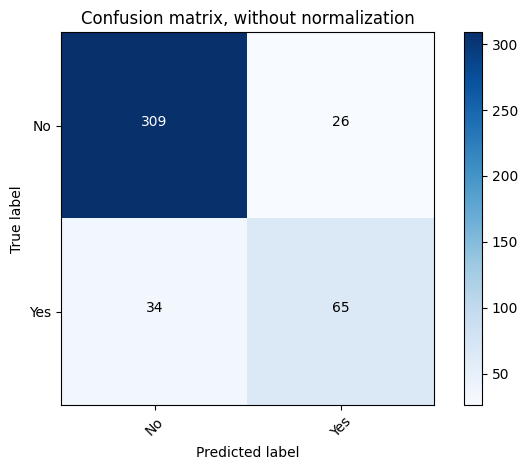

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.92      0.91       335
         Yes       0.71      0.66      0.68        99

    accuracy                           0.86       434
   macro avg       0.81      0.79      0.80       434
weighted avg       0.86      0.86      0.86       434



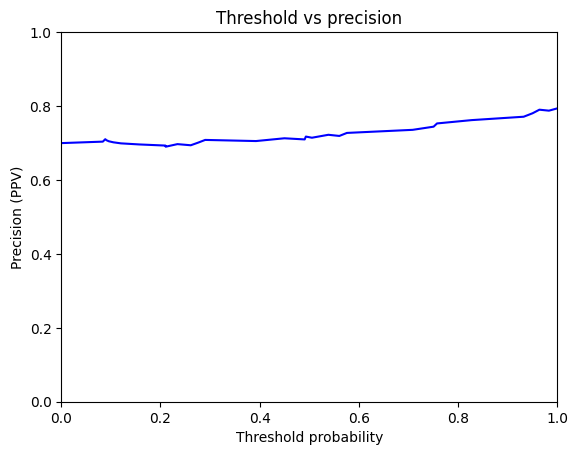

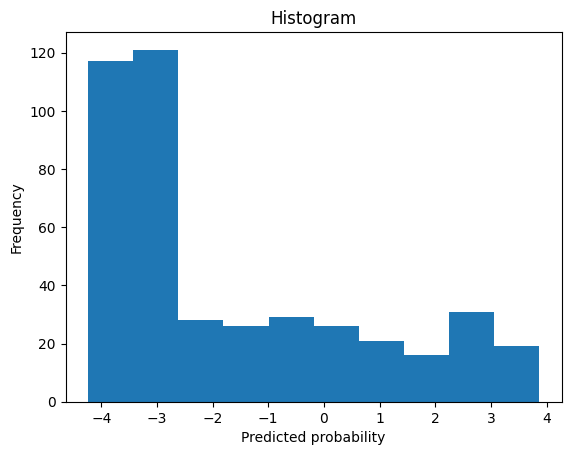

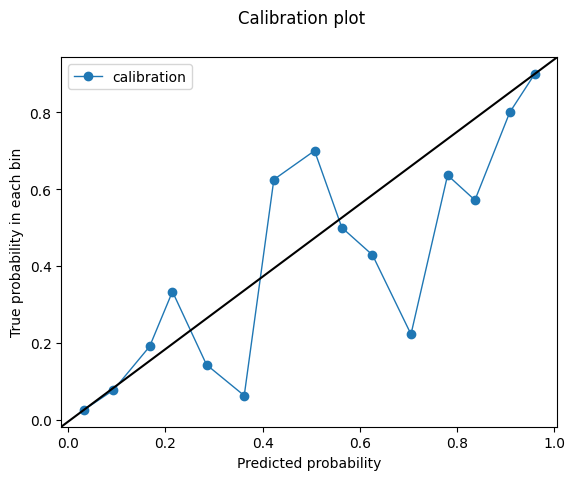

-0.37571797
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.920307553143374
Outcome probability: 0.22811059907834103
Average precision score: 0.79
Best F1: 0.7373737373737375


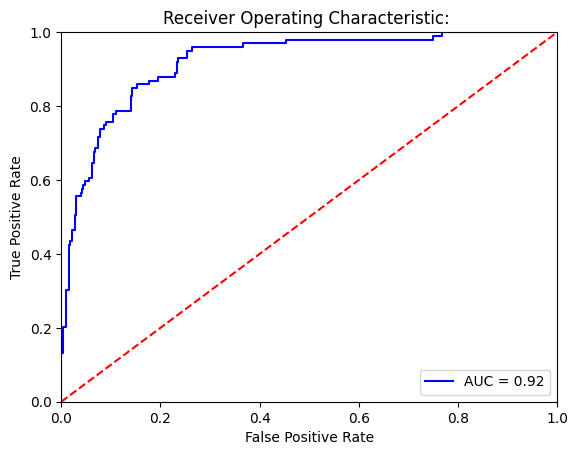

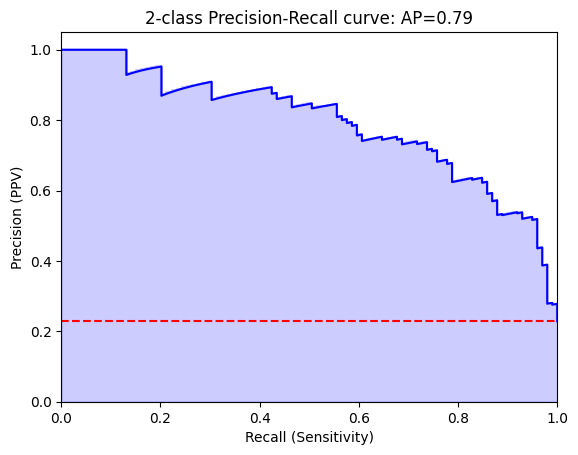

Threshold for best F1:
-0.14260562
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[309  26]
 [ 26  73]]


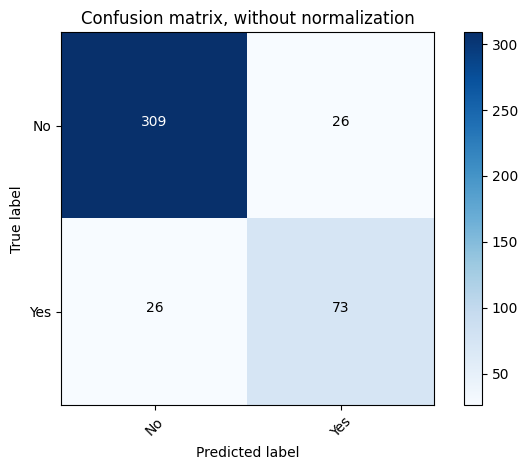

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.92      0.92       335
         Yes       0.74      0.74      0.74        99

    accuracy                           0.88       434
   macro avg       0.83      0.83      0.83       434
weighted avg       0.88      0.88      0.88       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[324  11]
 [ 44  55]]


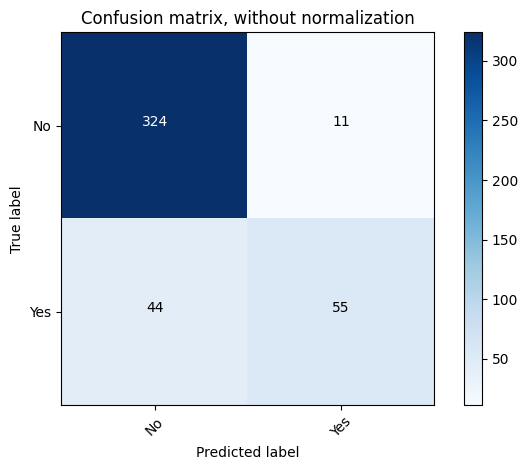

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.97      0.92       335
         Yes       0.83      0.56      0.67        99

    accuracy                           0.87       434
   macro avg       0.86      0.76      0.79       434
weighted avg       0.87      0.87      0.86       434



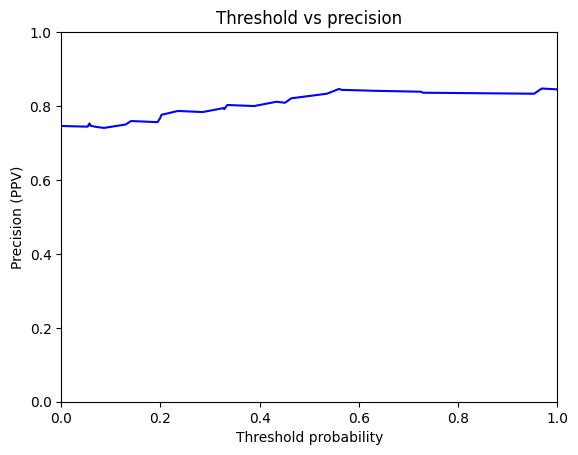

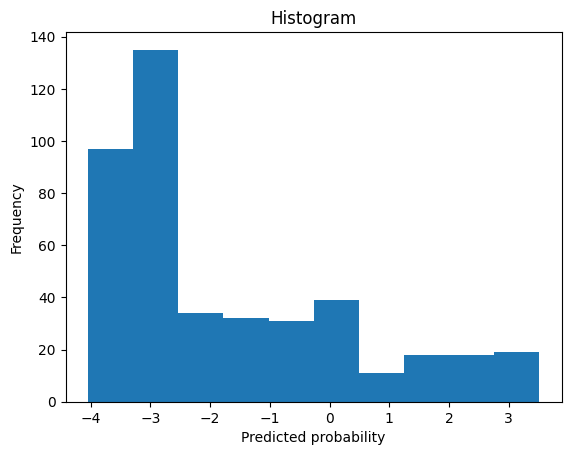

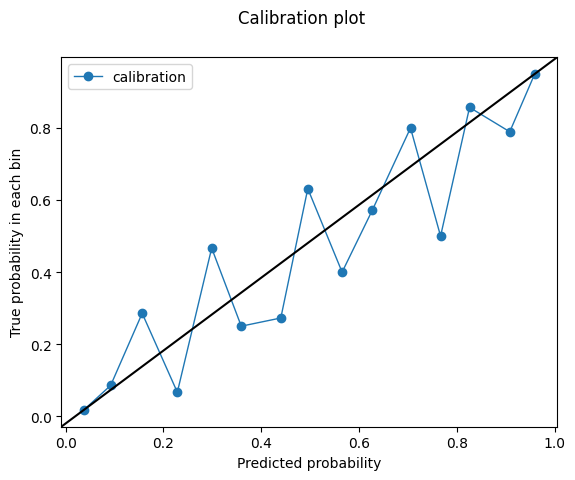

-0.14260562
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8630785466606362
Outcome probability: 0.22811059907834103
Average precision score: 0.63
Best F1: 0.6410256410256411


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


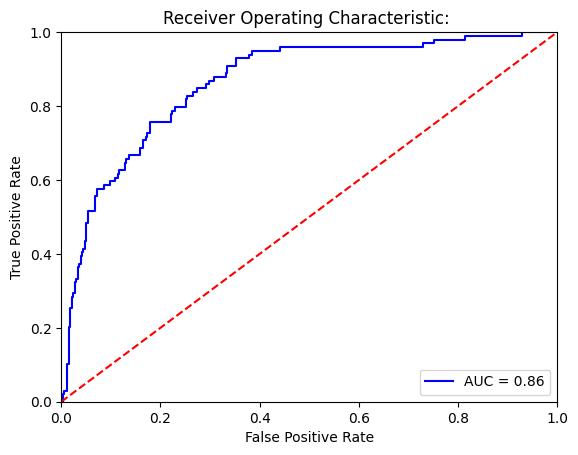

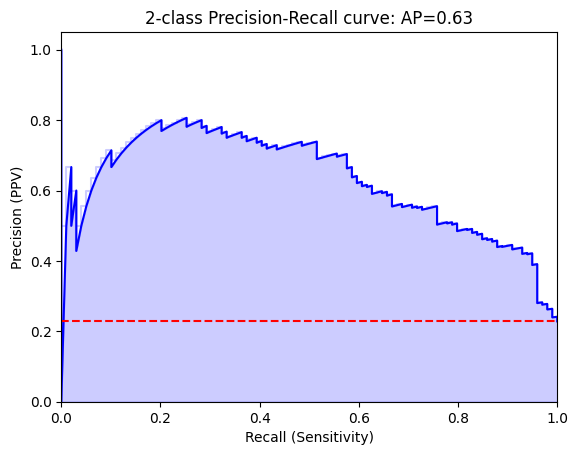

Threshold for best F1:
3.3281283
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[334   1]
 [ 99   0]]


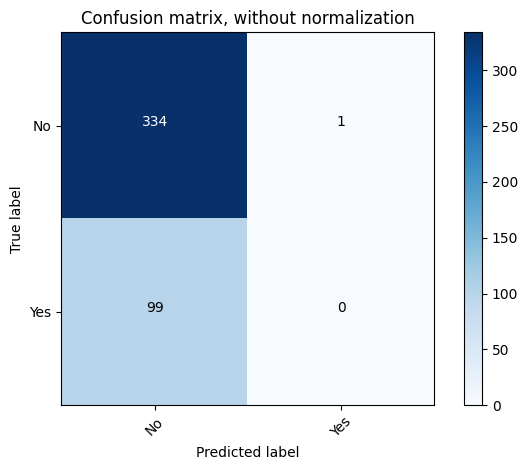

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      1.00      0.87       335
         Yes       0.00      0.00      0.00        99

    accuracy                           0.77       434
   macro avg       0.39      0.50      0.43       434
weighted avg       0.60      0.77      0.67       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[328   7]
 [ 71  28]]


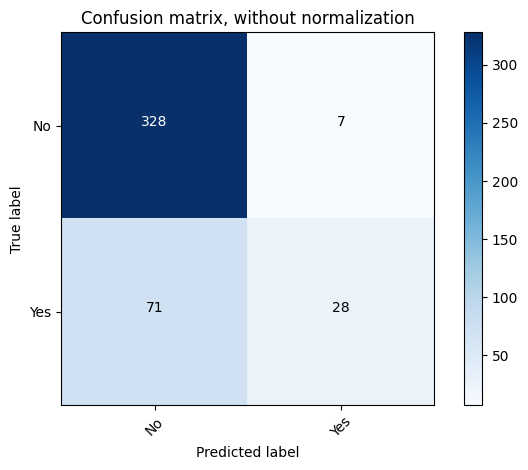

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.98      0.89       335
         Yes       0.80      0.28      0.42        99

    accuracy                           0.82       434
   macro avg       0.81      0.63      0.66       434
weighted avg       0.82      0.82      0.79       434



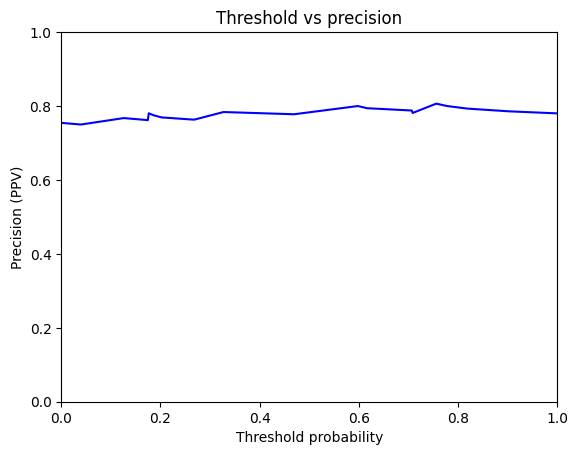

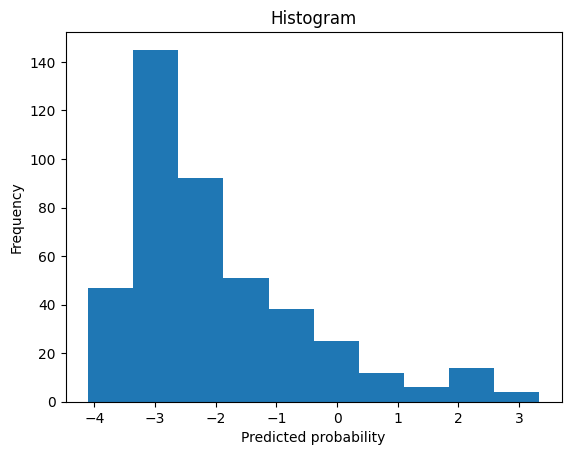

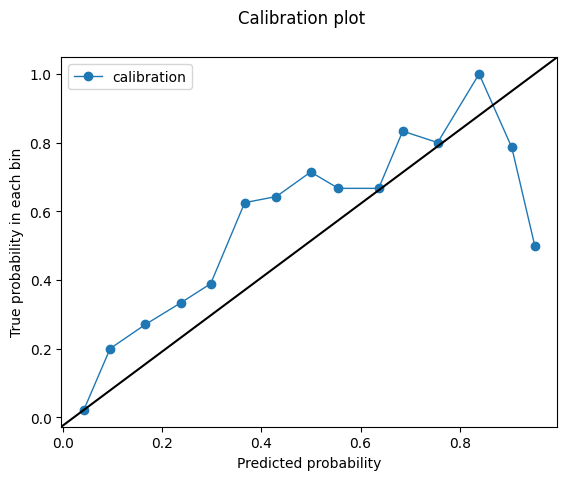

3.3281283
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8216794813809738
Outcome probability: 0.22811059907834103
Average precision score: 0.62
Best F1: 0.608294930875576


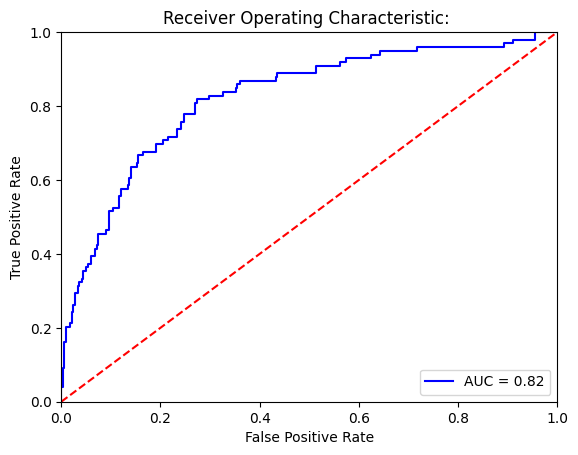

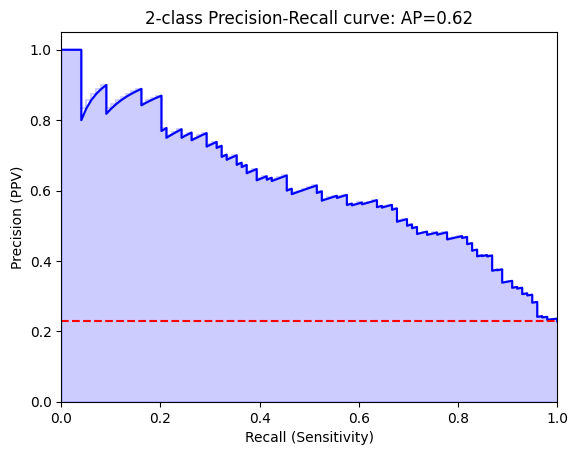

Threshold for best F1:
1.2500825
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[283  52]
 [ 33  66]]


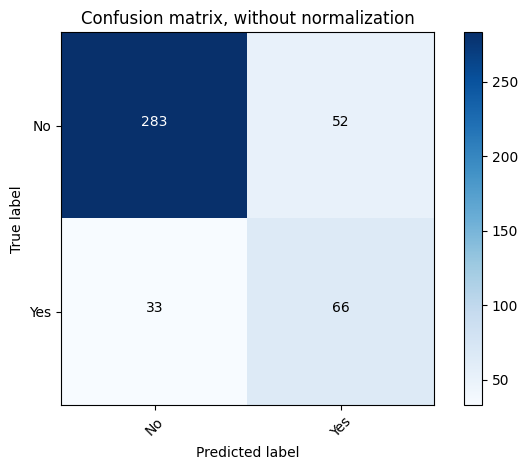

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.84      0.87       335
         Yes       0.56      0.67      0.61        99

    accuracy                           0.80       434
   macro avg       0.73      0.76      0.74       434
weighted avg       0.82      0.80      0.81       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[272  63]
 [ 32  67]]


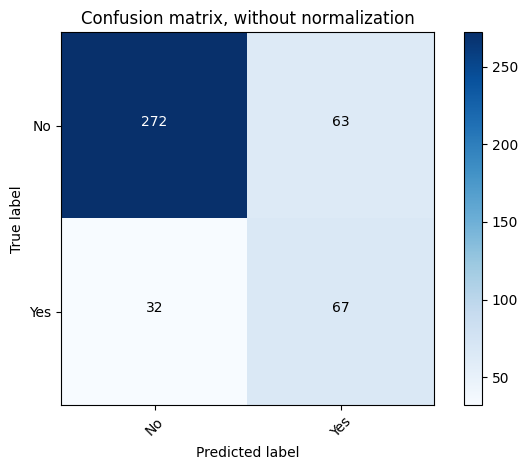

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.81      0.85       335
         Yes       0.52      0.68      0.59        99

    accuracy                           0.78       434
   macro avg       0.71      0.74      0.72       434
weighted avg       0.81      0.78      0.79       434



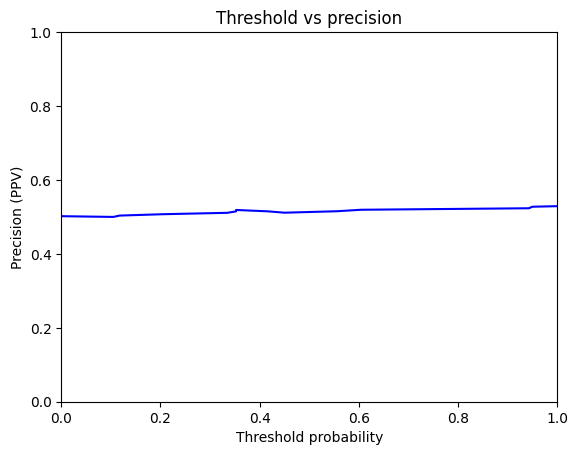

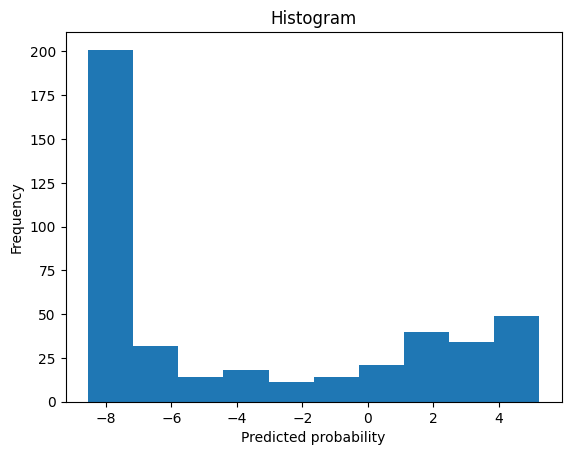

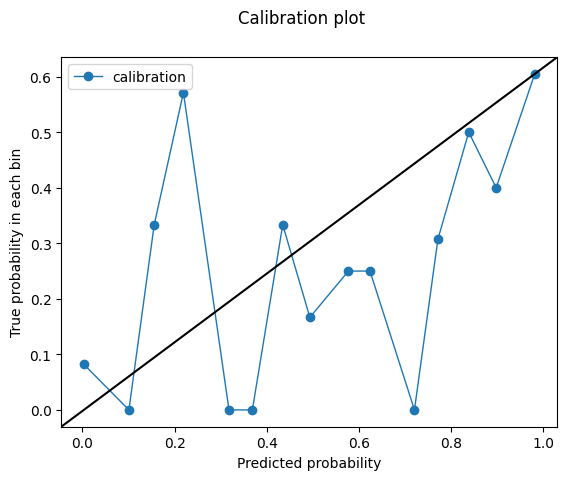

1.2500825
validation set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.896849087893864
Outcome probability: 0.22811059907834103
Average precision score: 0.75
Best F1: 0.6968325791855203


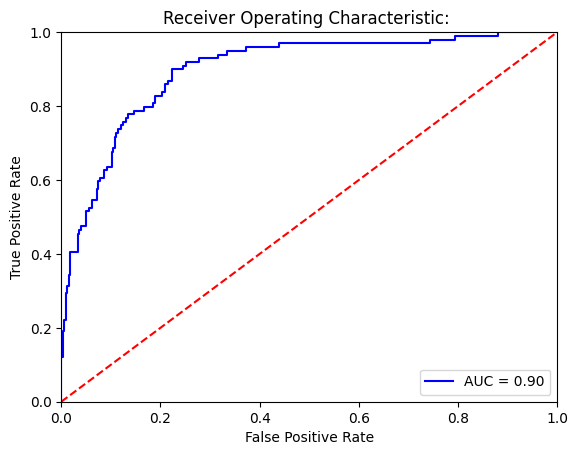

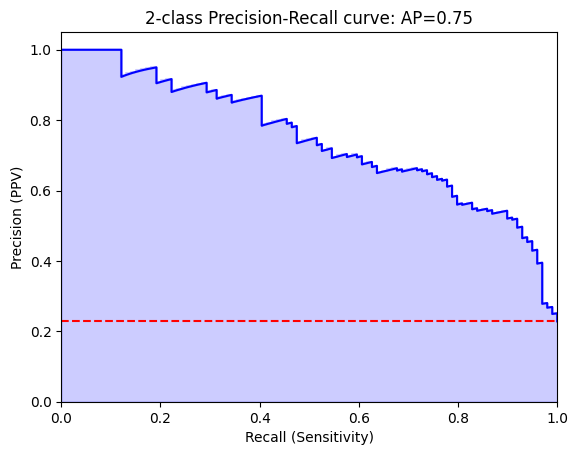

Threshold for best F1:
-0.9071653
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[290  45]
 [ 22  77]]


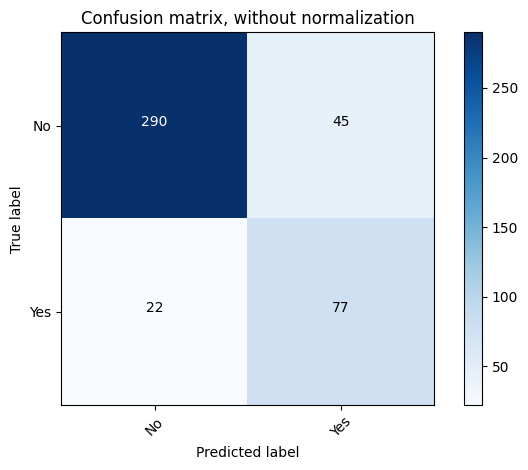

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.87      0.90       335
         Yes       0.63      0.78      0.70        99

    accuracy                           0.85       434
   macro avg       0.78      0.82      0.80       434
weighted avg       0.86      0.85      0.85       434

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[324  11]
 [ 56  43]]


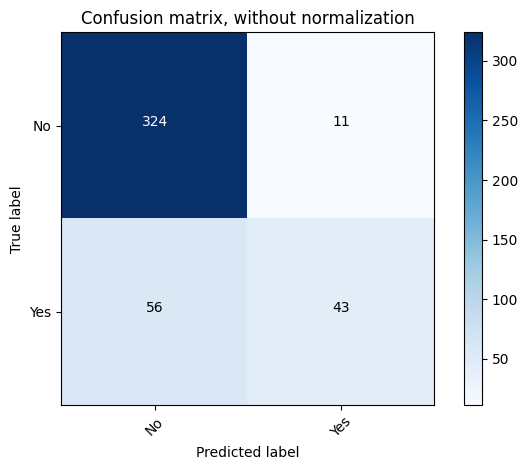

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.97      0.91       335
         Yes       0.80      0.43      0.56        99

    accuracy                           0.85       434
   macro avg       0.82      0.70      0.73       434
weighted avg       0.84      0.85      0.83       434



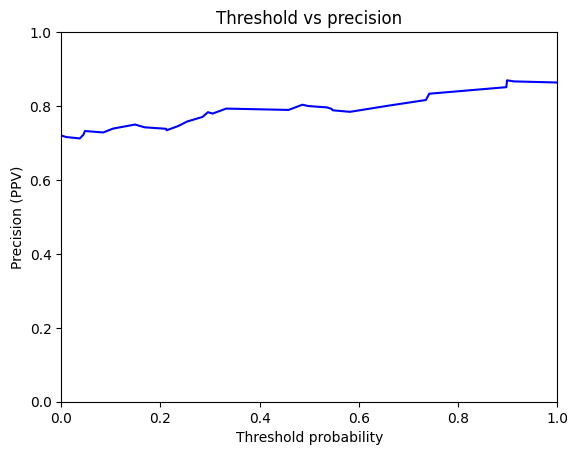

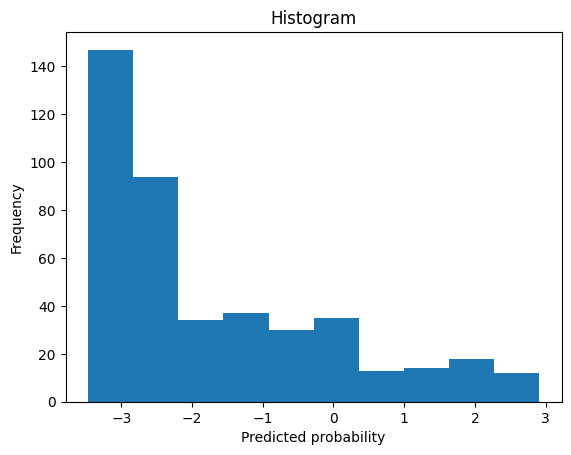

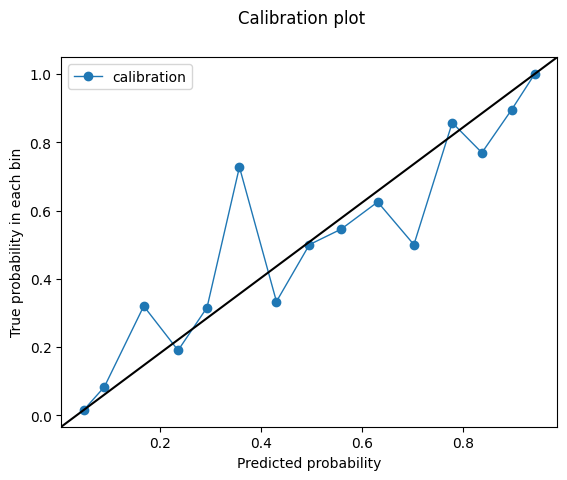

-0.9071653
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8689473684210526
Outcome probability: 0.15966386554621848
Average precision score: 0.60
Best F1: 0.5588235294117647


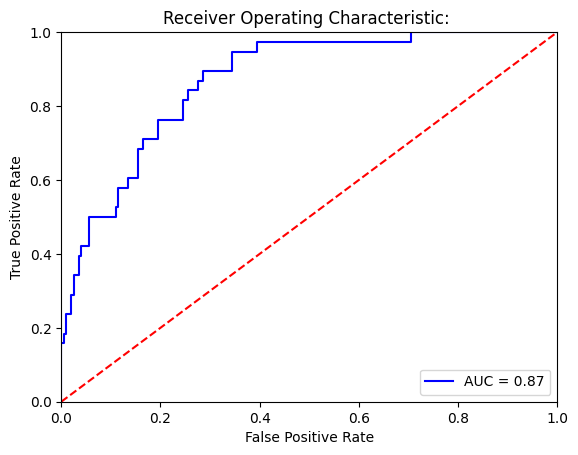

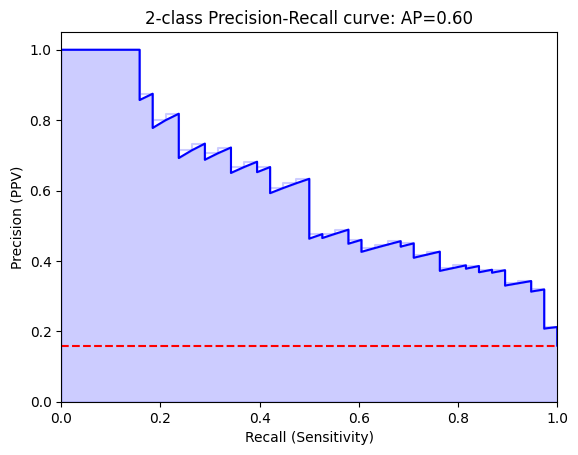

Threshold for best F1:
0.8722415
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[189  11]
 [ 19  19]]


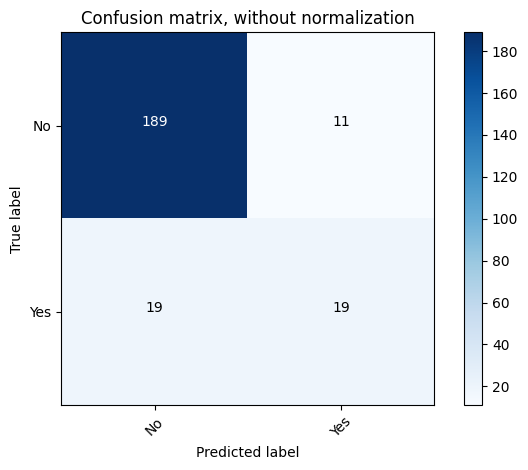

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.94      0.93       200
         Yes       0.63      0.50      0.56        38

    accuracy                           0.87       238
   macro avg       0.77      0.72      0.74       238
weighted avg       0.86      0.87      0.87       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[180  20]
 [ 19  19]]


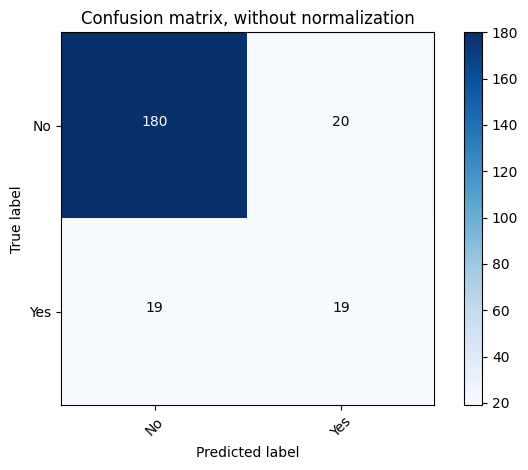

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.90      0.90       200
         Yes       0.49      0.50      0.49        38

    accuracy                           0.84       238
   macro avg       0.70      0.70      0.70       238
weighted avg       0.84      0.84      0.84       238



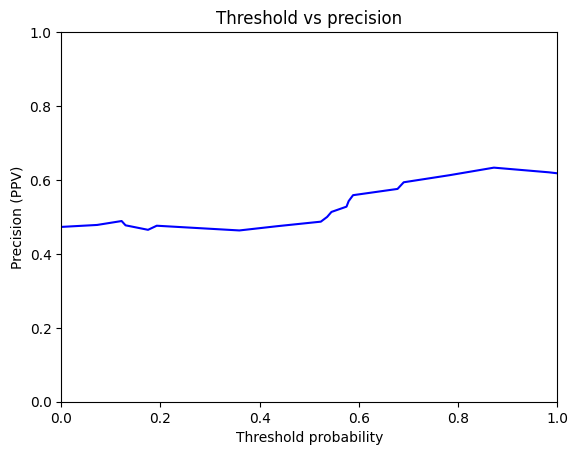

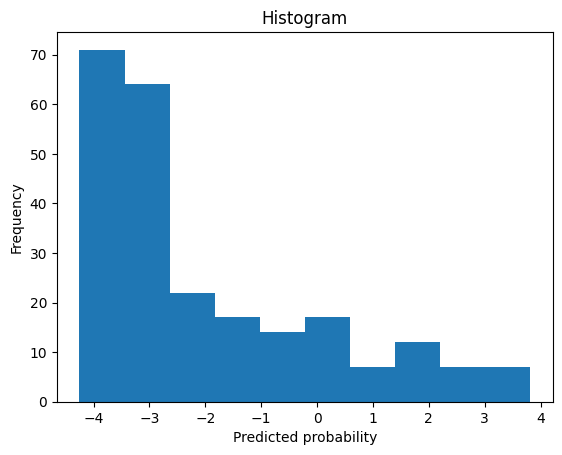

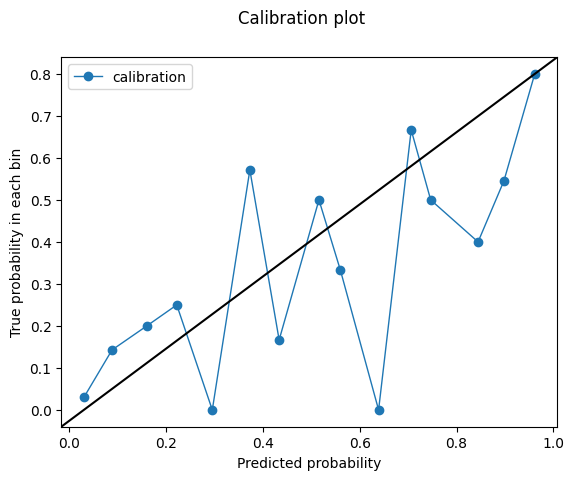

0.8722415
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8597368421052632
Outcome probability: 0.15966386554621848
Average precision score: 0.59
Best F1: 0.6024096385542169


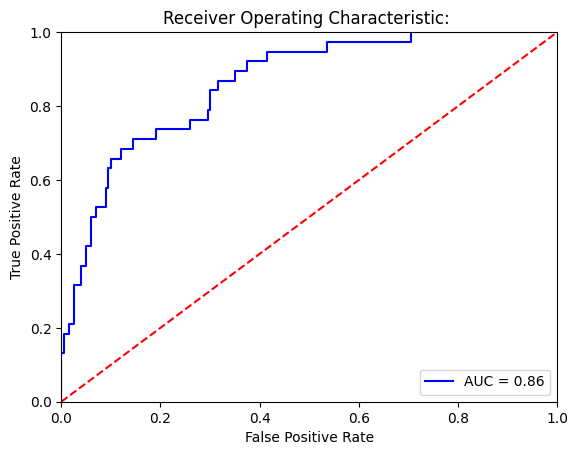

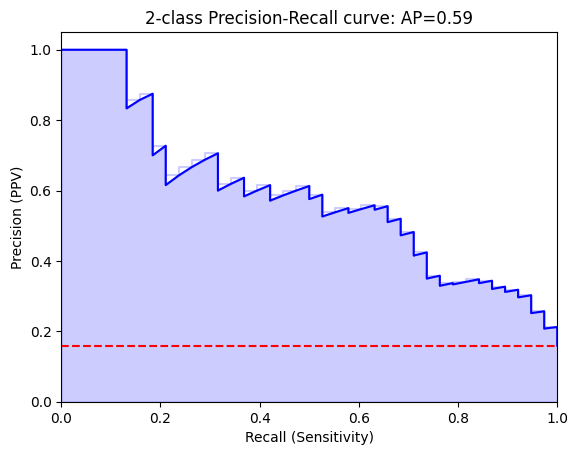

Threshold for best F1:
-0.46286196
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[180  20]
 [ 13  25]]


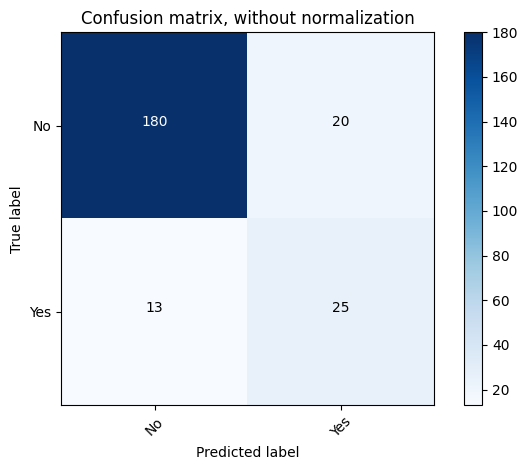

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.90      0.92       200
         Yes       0.56      0.66      0.60        38

    accuracy                           0.86       238
   macro avg       0.74      0.78      0.76       238
weighted avg       0.87      0.86      0.87       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[192   8]
 [ 25  13]]


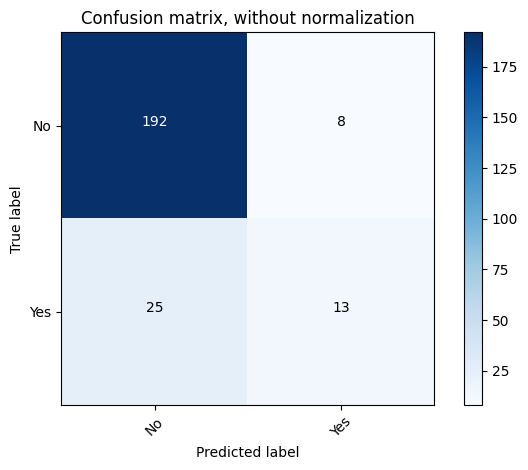

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.96      0.92       200
         Yes       0.62      0.34      0.44        38

    accuracy                           0.86       238
   macro avg       0.75      0.65      0.68       238
weighted avg       0.84      0.86      0.84       238



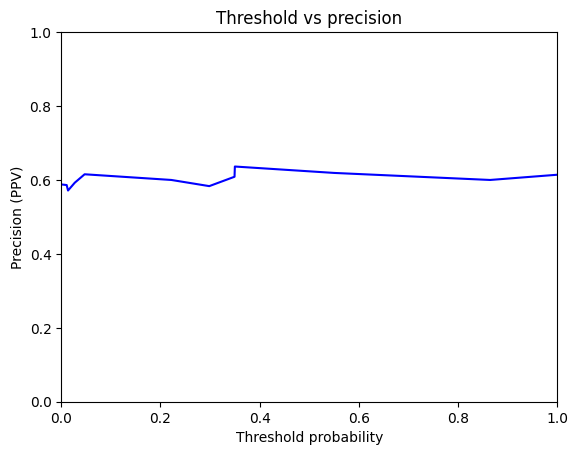

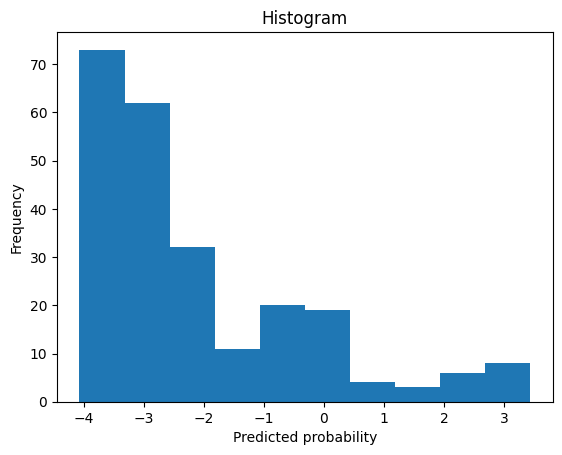

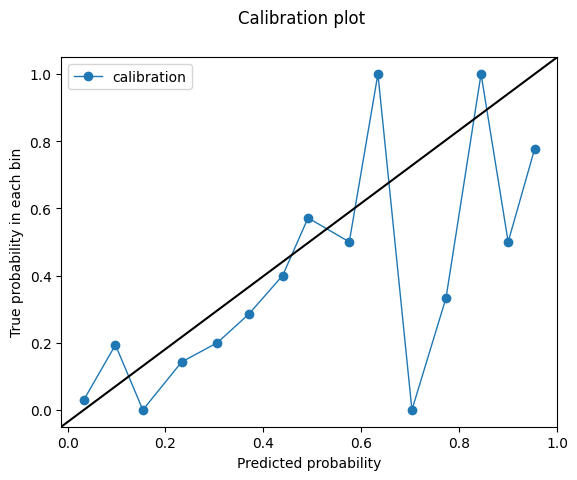

-0.46286196
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.7964473684210527
Outcome probability: 0.15966386554621848
Average precision score: 0.50
Best F1: 0.5277777777777778


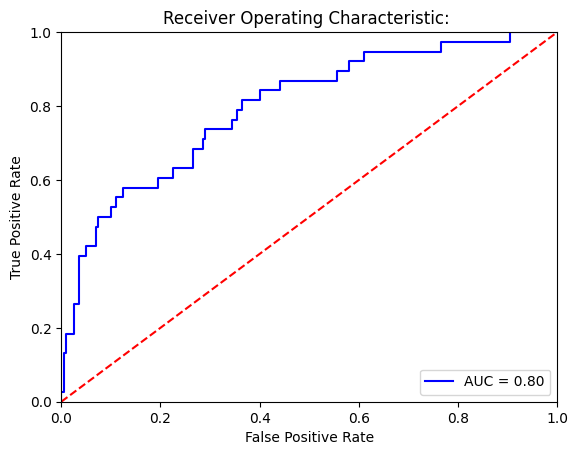

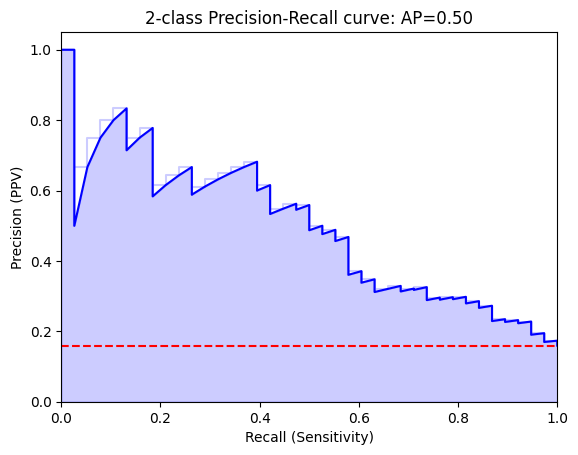

Threshold for best F1:
-0.7245868
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[185  15]
 [ 19  19]]


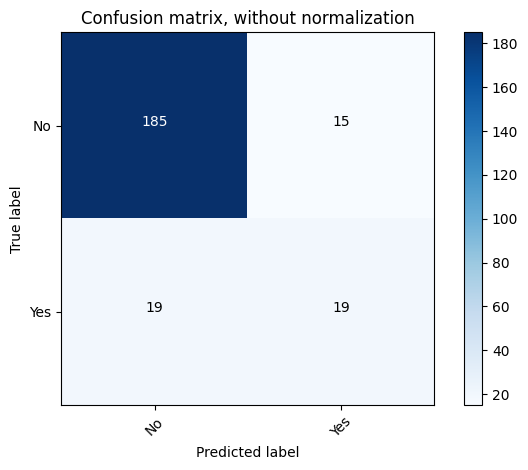

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.93      0.92       200
         Yes       0.56      0.50      0.53        38

    accuracy                           0.86       238
   macro avg       0.73      0.71      0.72       238
weighted avg       0.85      0.86      0.85       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[196   4]
 [ 31   7]]


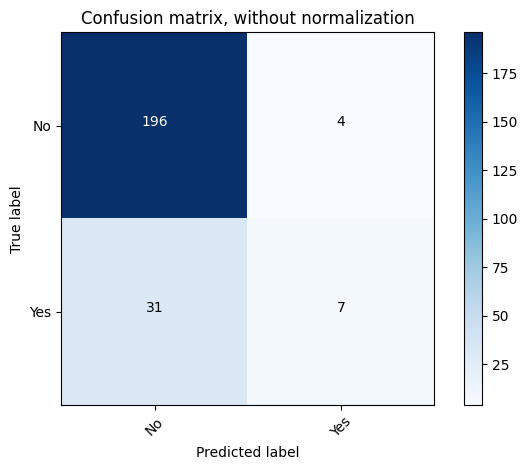

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.98      0.92       200
         Yes       0.64      0.18      0.29        38

    accuracy                           0.85       238
   macro avg       0.75      0.58      0.60       238
weighted avg       0.83      0.85      0.82       238



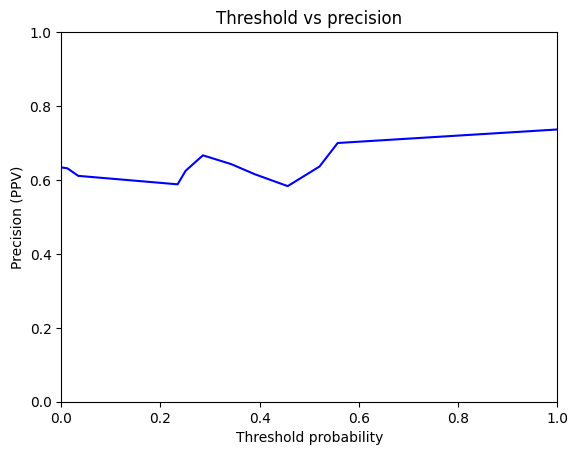

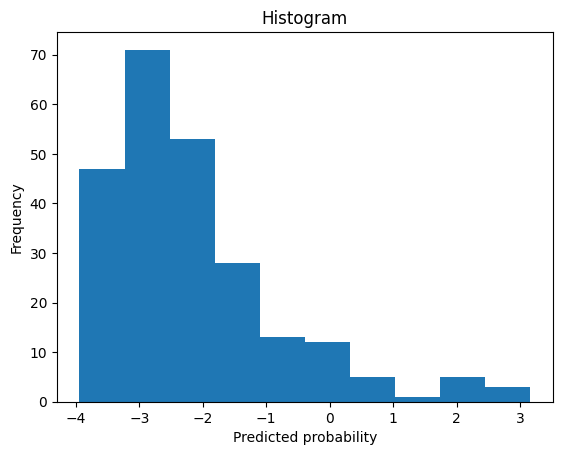

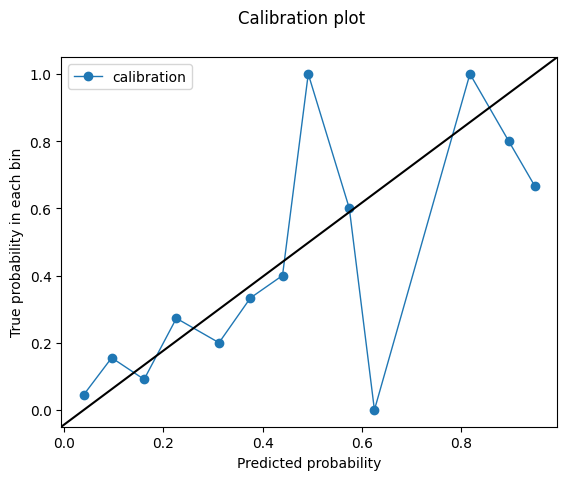

-0.7245868
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.7306578947368421
Outcome probability: 0.15966386554621848
Average precision score: 0.41
Best F1: 0.4406779661016949


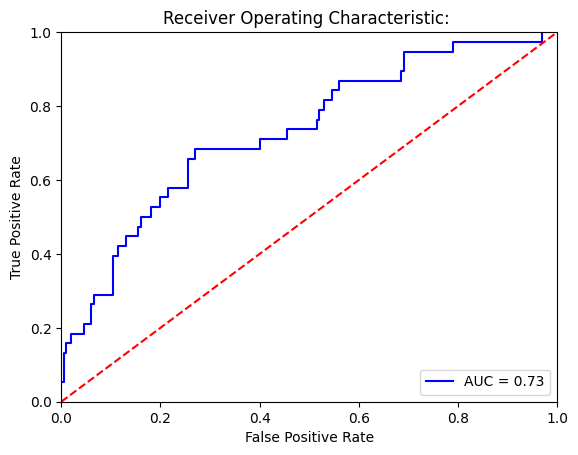

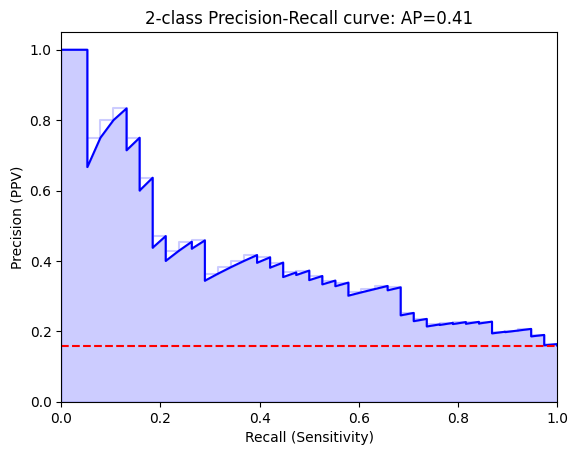

Threshold for best F1:
-5.528062
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[146  54]
 [ 12  26]]


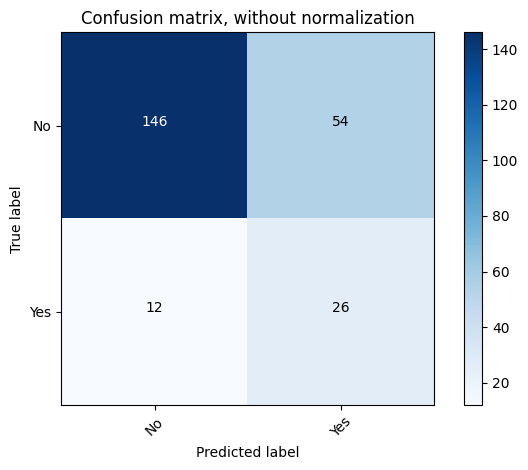

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.73      0.82       200
         Yes       0.33      0.68      0.44        38

    accuracy                           0.72       238
   macro avg       0.62      0.71      0.63       238
weighted avg       0.83      0.72      0.76       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[169  31]
 [ 21  17]]


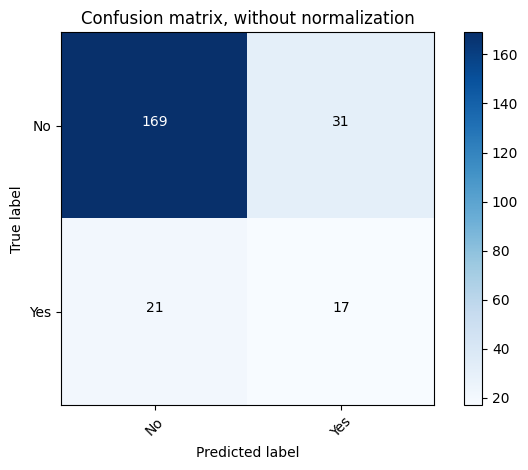

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.84      0.87       200
         Yes       0.35      0.45      0.40        38

    accuracy                           0.78       238
   macro avg       0.62      0.65      0.63       238
weighted avg       0.80      0.78      0.79       238



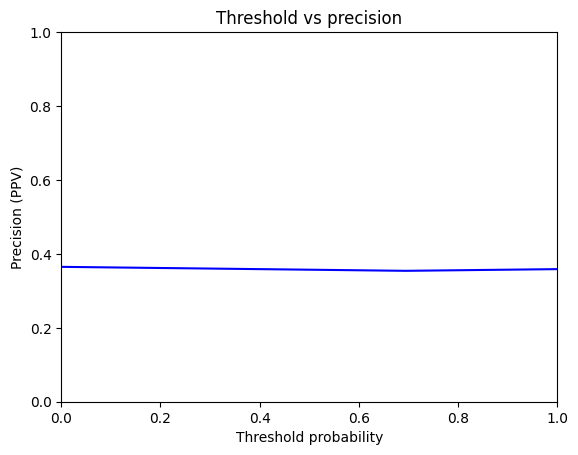

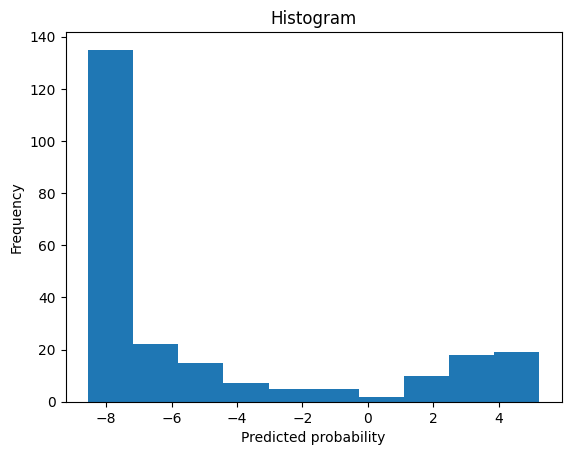

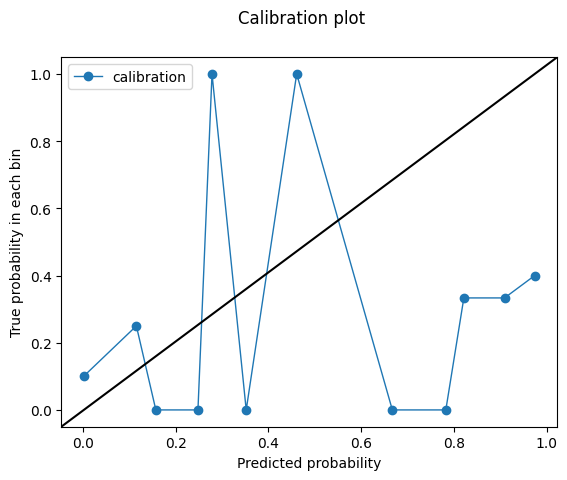

-5.528062
validation set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8271052631578948
Outcome probability: 0.15966386554621848
Average precision score: 0.53
Best F1: 0.5333333333333333


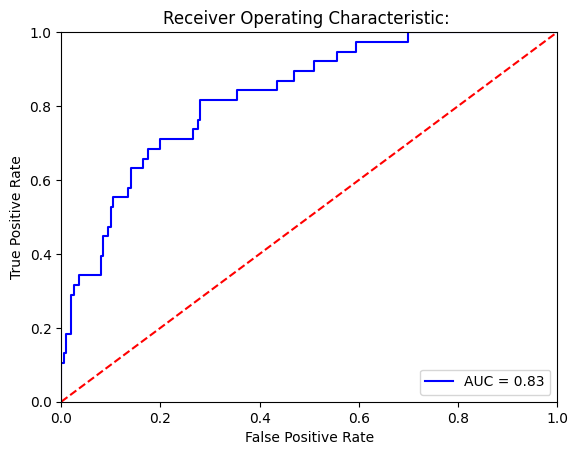

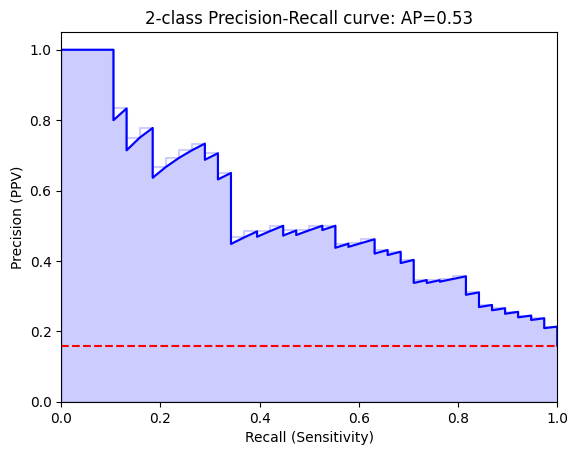

Threshold for best F1:
-1.5266278
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[172  28]
 [ 14  24]]


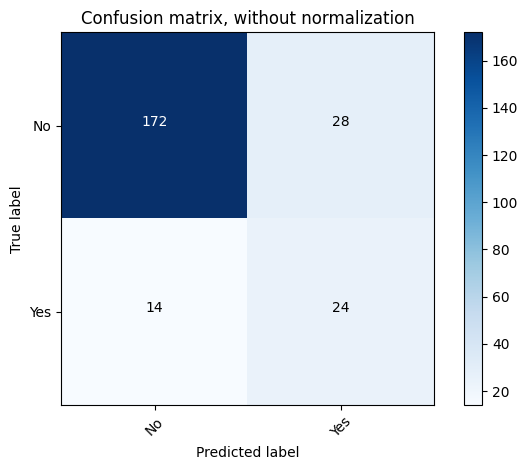

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.86      0.89       200
         Yes       0.46      0.63      0.53        38

    accuracy                           0.82       238
   macro avg       0.69      0.75      0.71       238
weighted avg       0.85      0.82      0.83       238

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[193   7]
 [ 26  12]]


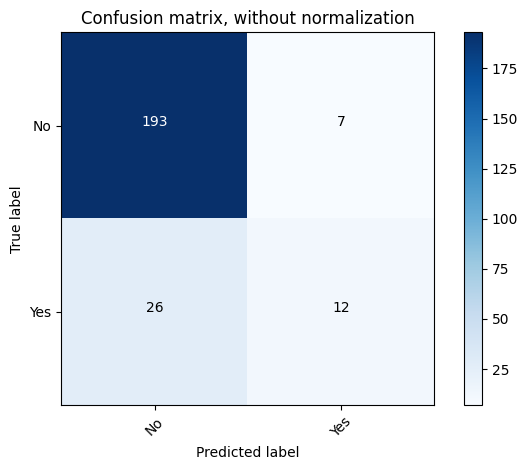

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.96      0.92       200
         Yes       0.63      0.32      0.42        38

    accuracy                           0.86       238
   macro avg       0.76      0.64      0.67       238
weighted avg       0.84      0.86      0.84       238



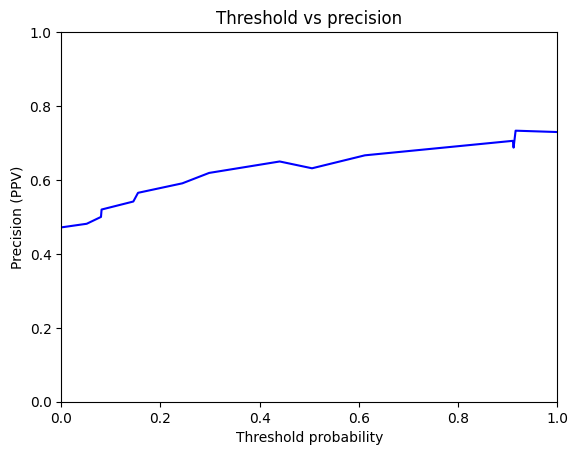

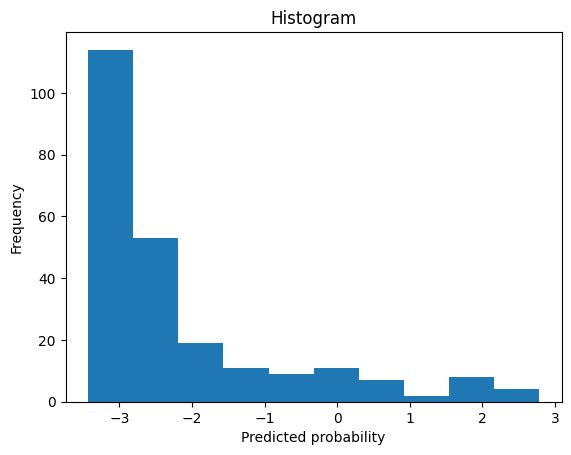

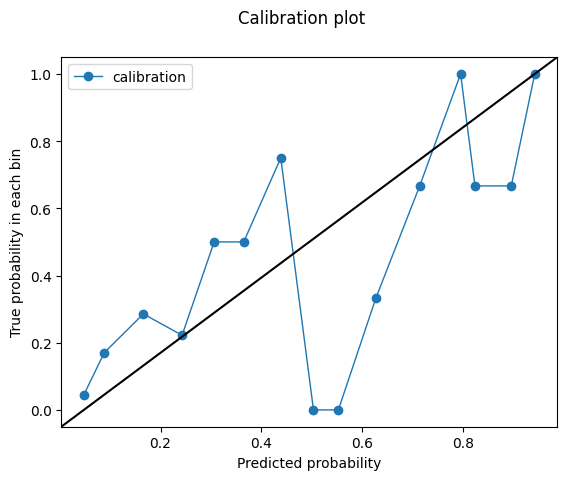

-1.5266278
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9258179231863444
Outcome probability: 0.2803030303030303
Average precision score: 0.83
Best F1: 0.7922077922077922


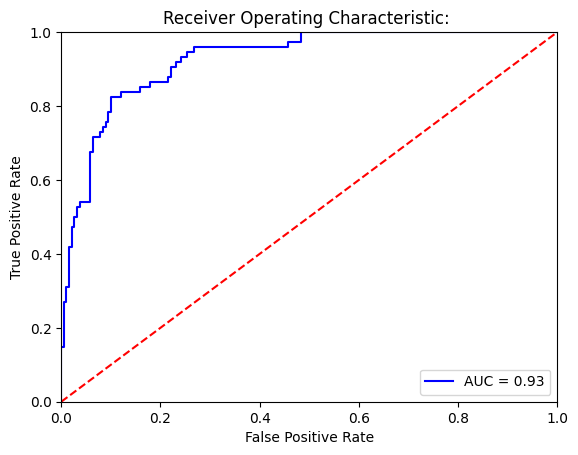

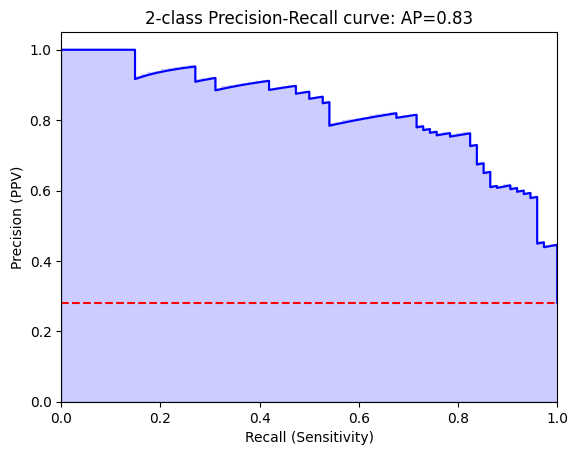

Threshold for best F1:
-1.0622385
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[171  19]
 [ 13  61]]


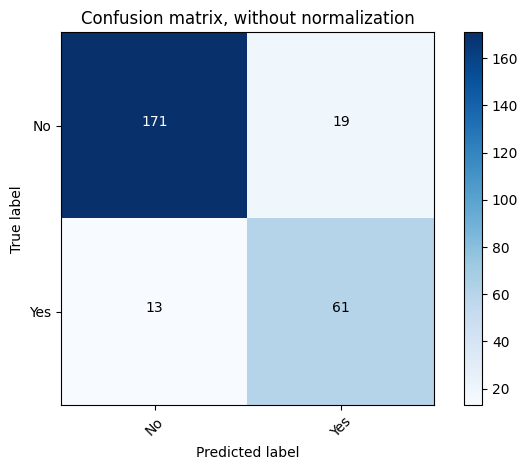

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.90      0.91       190
         Yes       0.76      0.82      0.79        74

    accuracy                           0.88       264
   macro avg       0.85      0.86      0.85       264
weighted avg       0.88      0.88      0.88       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[179  11]
 [ 32  42]]


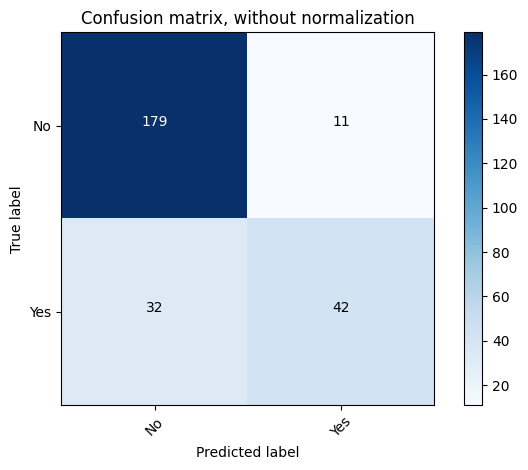

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.94      0.89       190
         Yes       0.79      0.57      0.66        74

    accuracy                           0.84       264
   macro avg       0.82      0.75      0.78       264
weighted avg       0.83      0.84      0.83       264



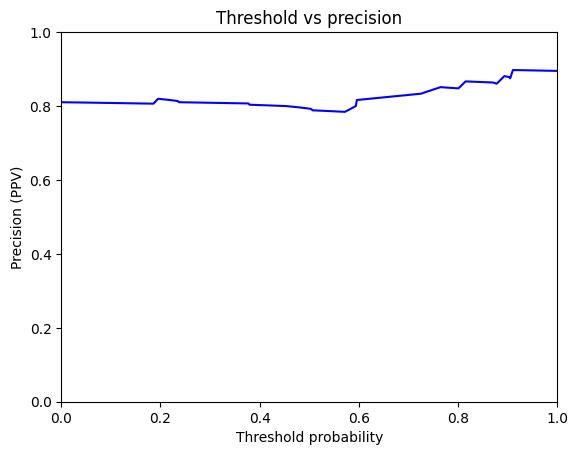

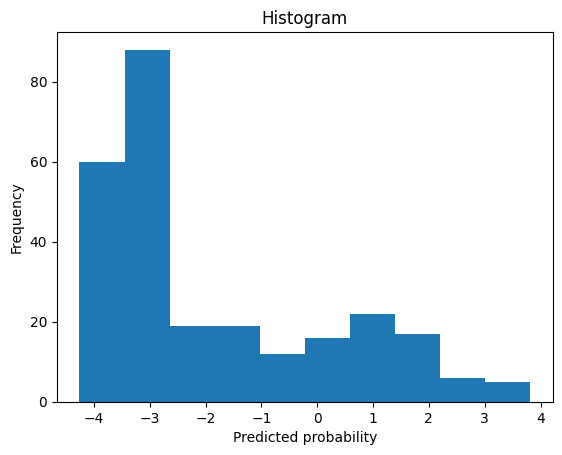

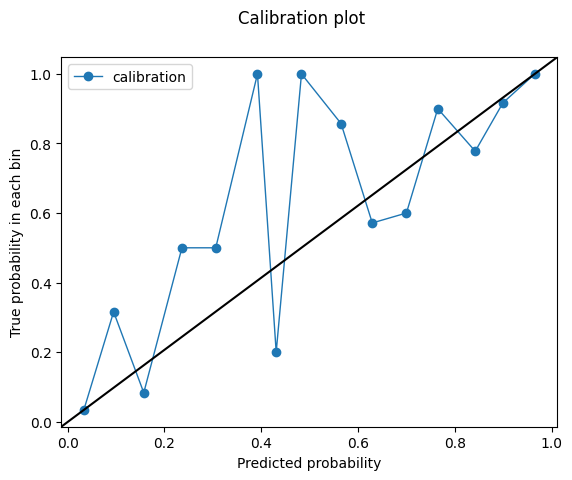

-1.0622385
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9093883357041251
Outcome probability: 0.2803030303030303
Average precision score: 0.79
Best F1: 0.7712418300653594


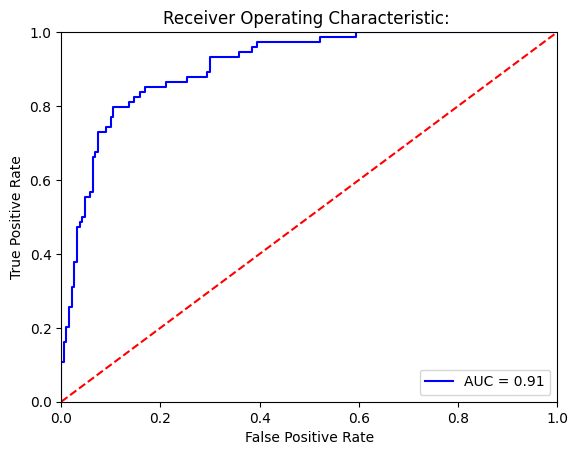

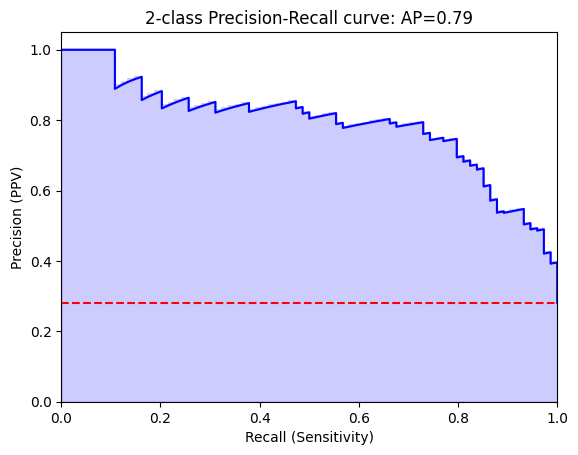

Threshold for best F1:
-1.1275215
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[170  20]
 [ 15  59]]


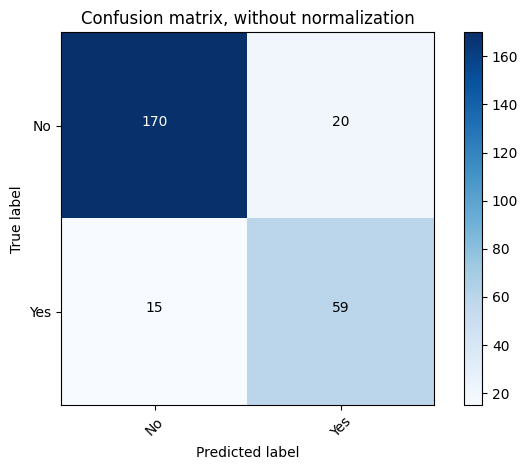

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.89      0.91       190
         Yes       0.75      0.80      0.77        74

    accuracy                           0.87       264
   macro avg       0.83      0.85      0.84       264
weighted avg       0.87      0.87      0.87       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[185   5]
 [ 49  25]]


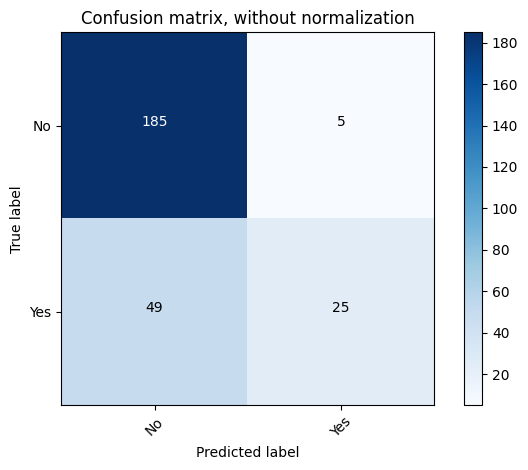

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.79      0.97      0.87       190
         Yes       0.83      0.34      0.48        74

    accuracy                           0.80       264
   macro avg       0.81      0.66      0.68       264
weighted avg       0.80      0.80      0.76       264



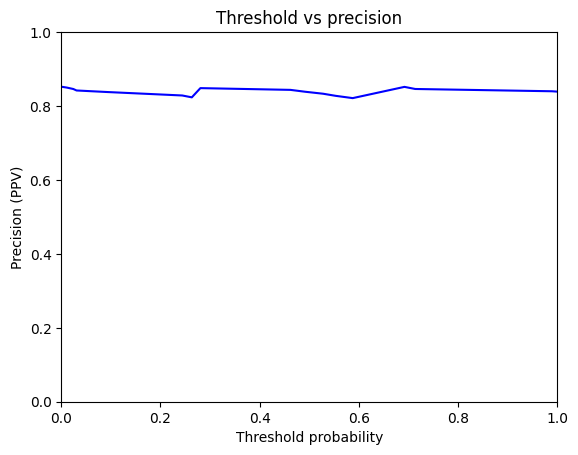

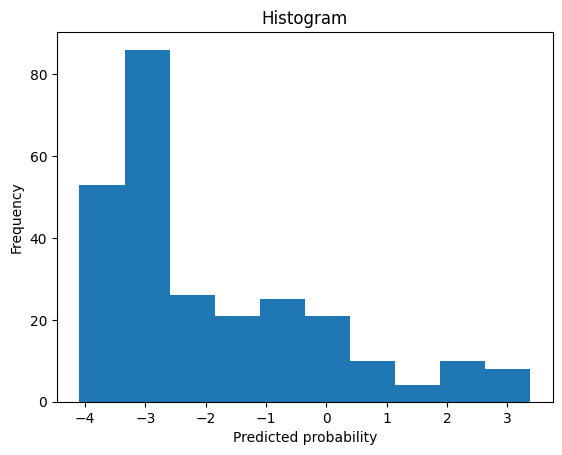

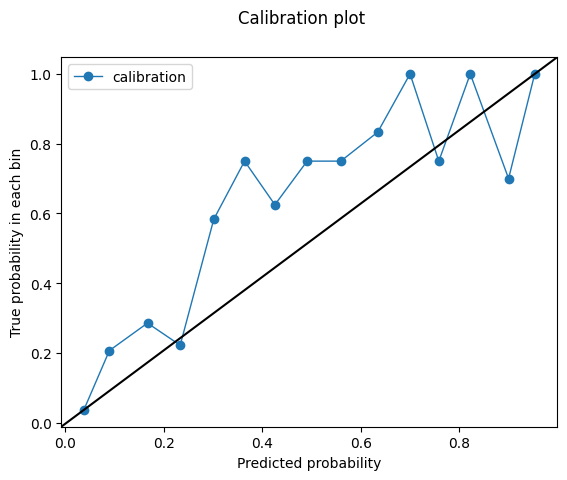

-1.1275215
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8612375533428165
Outcome probability: 0.2803030303030303
Average precision score: 0.68
Best F1: 0.6936416184971099


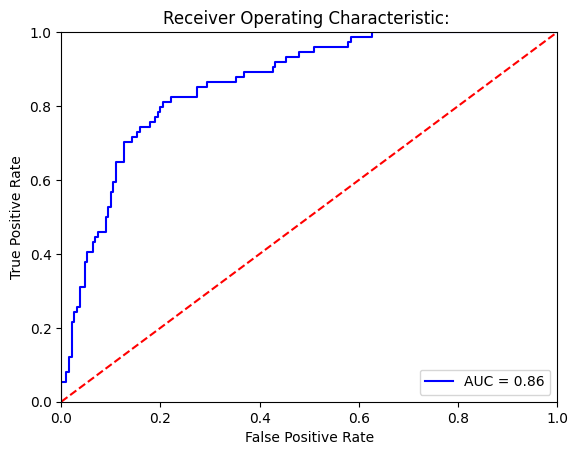

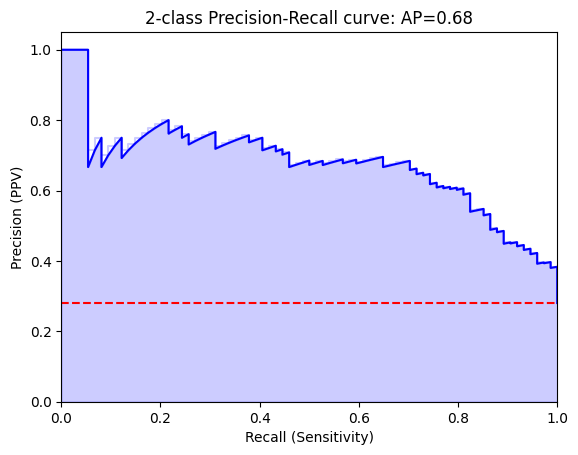

Threshold for best F1:
-2.1515615
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[151  39]
 [ 14  60]]


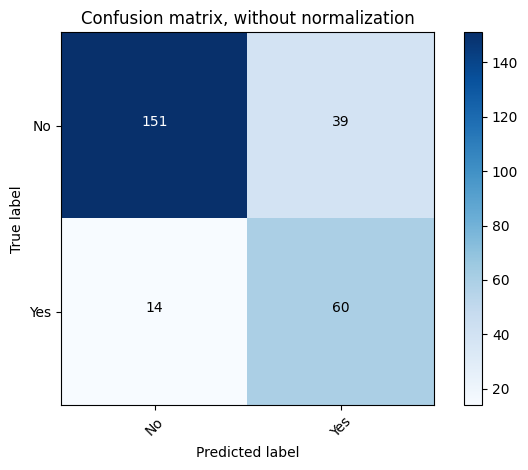

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.79      0.85       190
         Yes       0.61      0.81      0.69        74

    accuracy                           0.80       264
   macro avg       0.76      0.80      0.77       264
weighted avg       0.83      0.80      0.81       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[186   4]
 [ 64  10]]


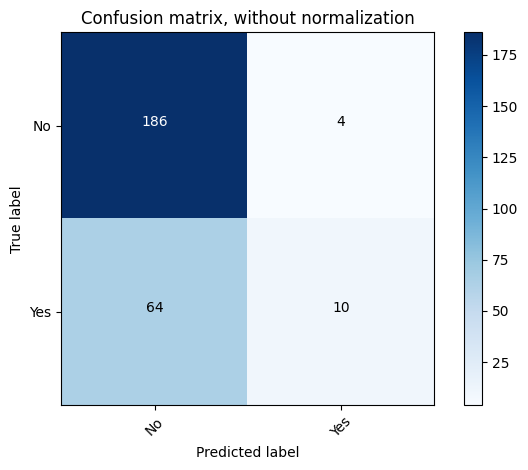

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.74      0.98      0.85       190
         Yes       0.71      0.14      0.23        74

    accuracy                           0.74       264
   macro avg       0.73      0.56      0.54       264
weighted avg       0.74      0.74      0.67       264



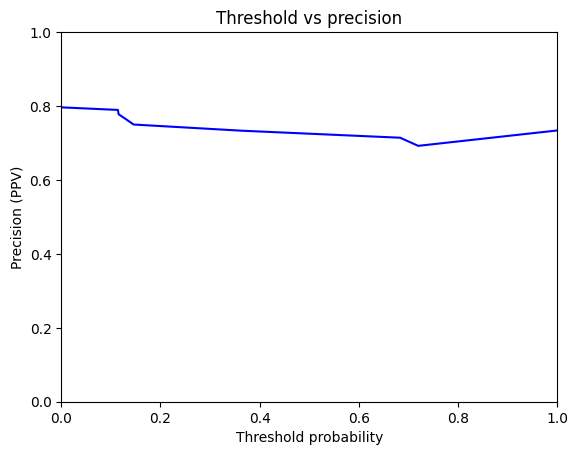

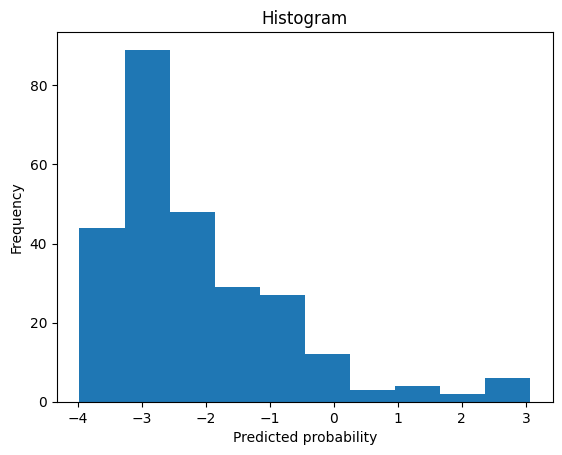

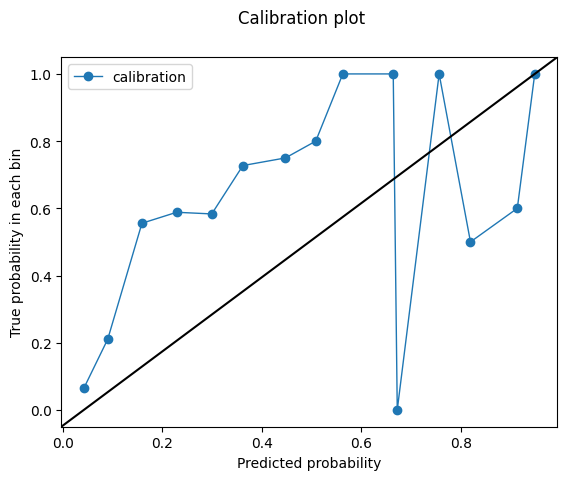

-2.1515615
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8284495021337127
Outcome probability: 0.2803030303030303
Average precision score: 0.62
Best F1: 0.6597938144329898


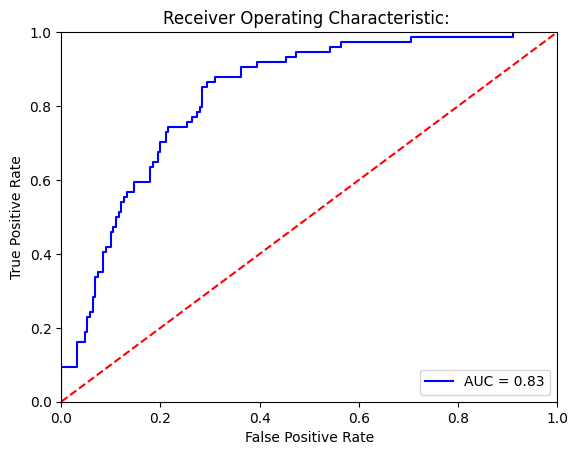

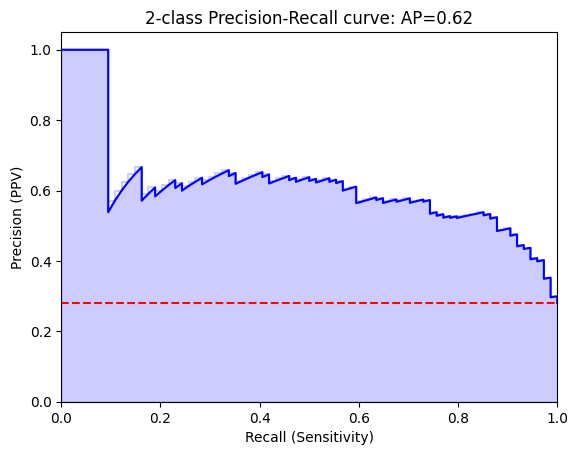

Threshold for best F1:
-6.117967
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[134  56]
 [ 10  64]]


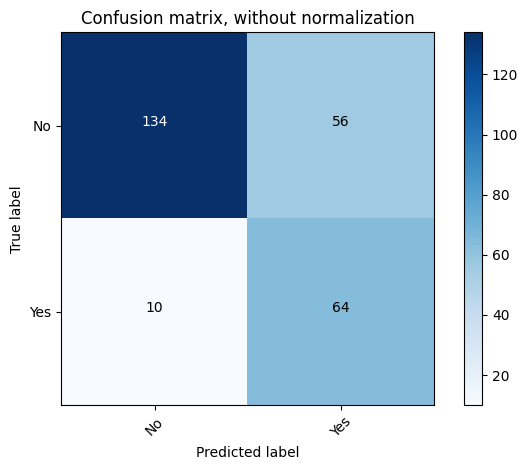

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.71      0.80       190
         Yes       0.53      0.86      0.66        74

    accuracy                           0.75       264
   macro avg       0.73      0.79      0.73       264
weighted avg       0.82      0.75      0.76       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[166  24]
 [ 34  40]]


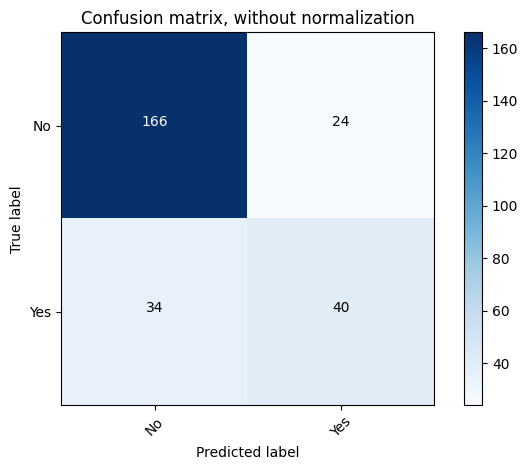

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.87      0.85       190
         Yes       0.62      0.54      0.58        74

    accuracy                           0.78       264
   macro avg       0.73      0.71      0.72       264
weighted avg       0.77      0.78      0.78       264



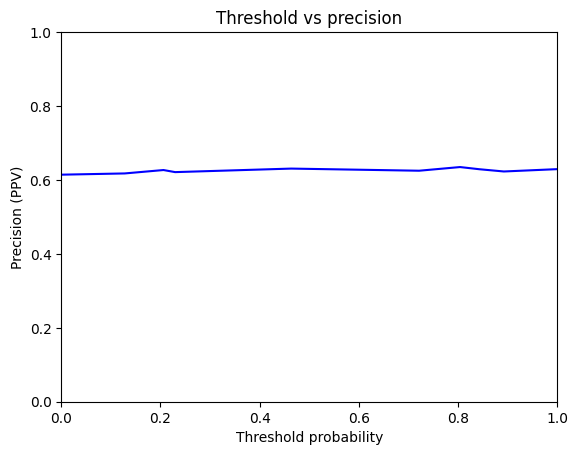

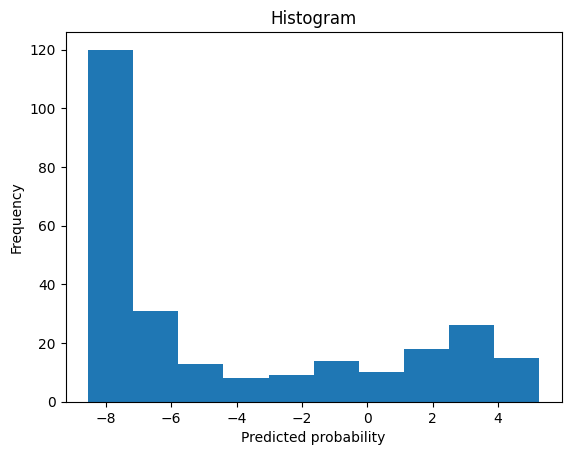

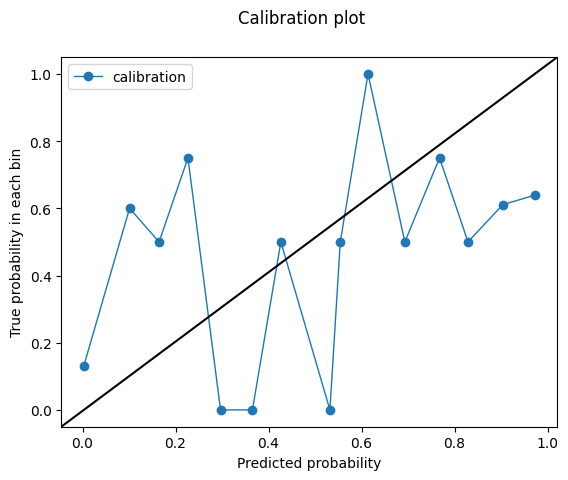

-6.117967
validation set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8845661450924609
Outcome probability: 0.2803030303030303
Average precision score: 0.74
Best F1: 0.7222222222222223


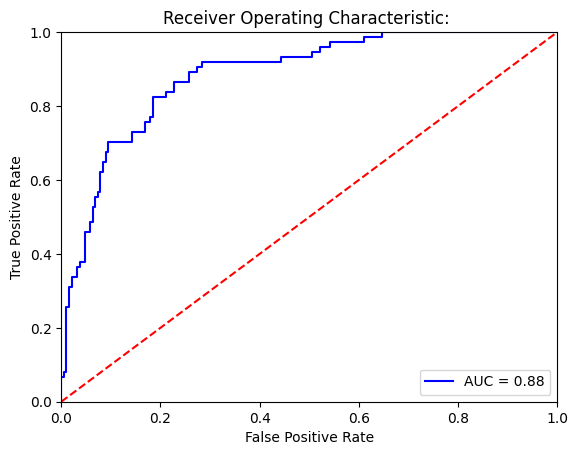

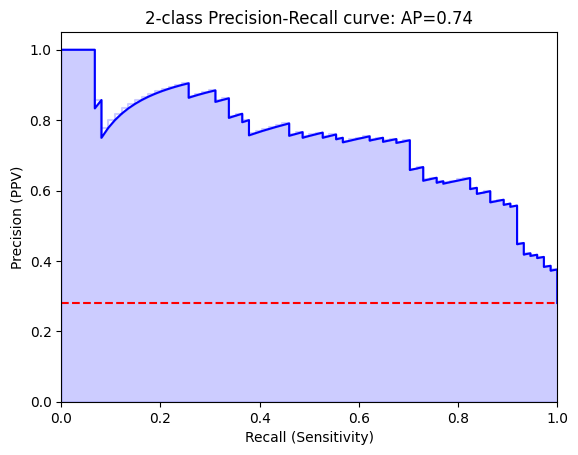

Threshold for best F1:
-1.0911264
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[172  18]
 [ 22  52]]


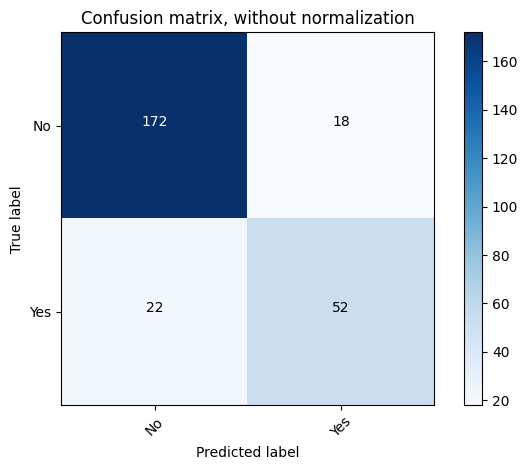

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.91      0.90       190
         Yes       0.74      0.70      0.72        74

    accuracy                           0.85       264
   macro avg       0.81      0.80      0.81       264
weighted avg       0.85      0.85      0.85       264

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[186   4]
 [ 51  23]]


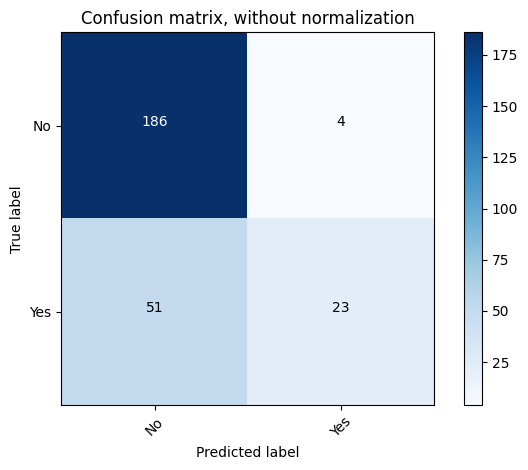

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      0.98      0.87       190
         Yes       0.85      0.31      0.46        74

    accuracy                           0.79       264
   macro avg       0.82      0.64      0.66       264
weighted avg       0.80      0.79      0.75       264



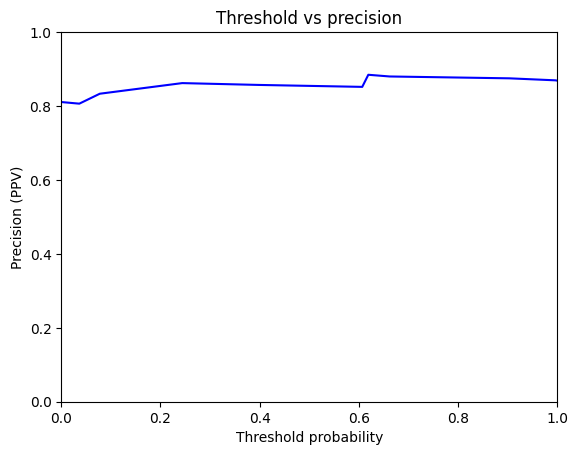

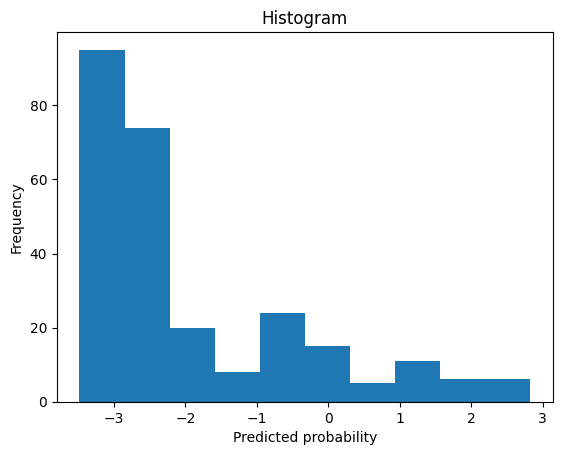

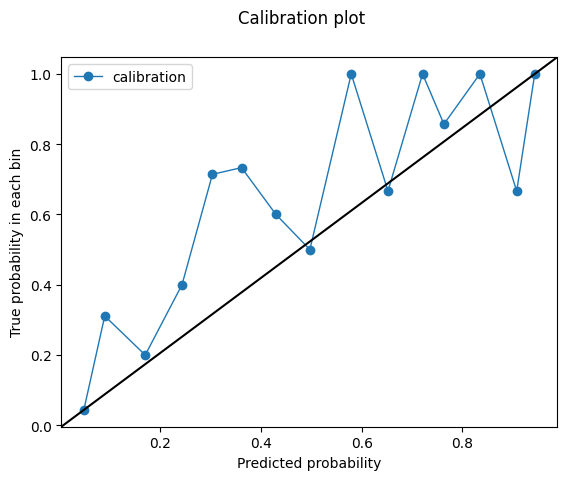

-1.0911264
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9954887218045112
Outcome probability: 0.036231884057971016
Average precision score: 0.88
Best F1: 0.9090909090909091


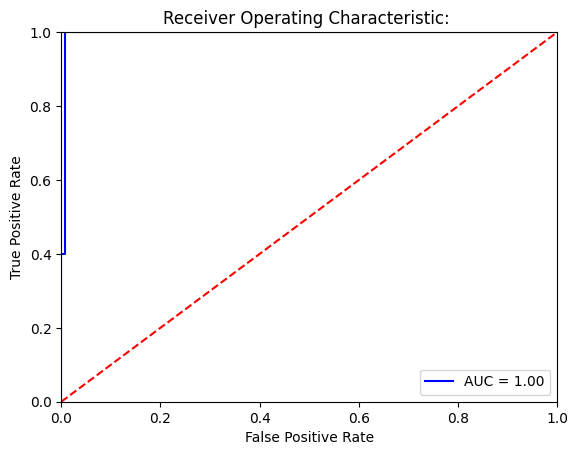

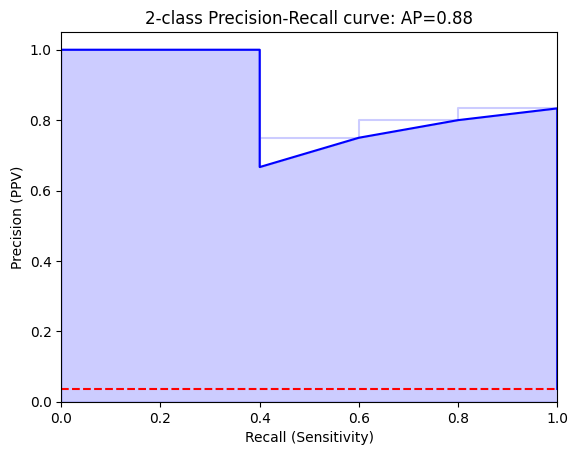

Threshold for best F1:
0.14233905
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[132   1]
 [  0   5]]


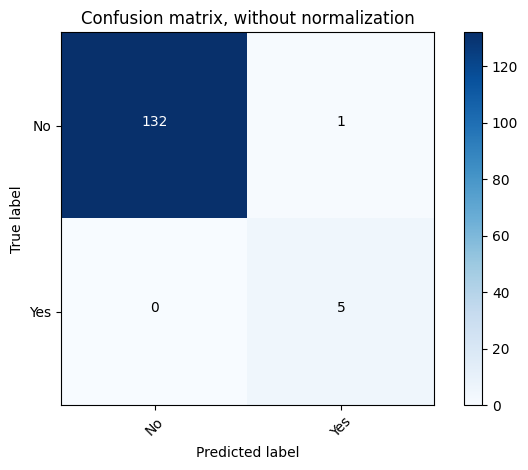

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.99      1.00       133
         Yes       0.83      1.00      0.91         5

    accuracy                           0.99       138
   macro avg       0.92      1.00      0.95       138
weighted avg       0.99      0.99      0.99       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[132   1]
 [  1   4]]


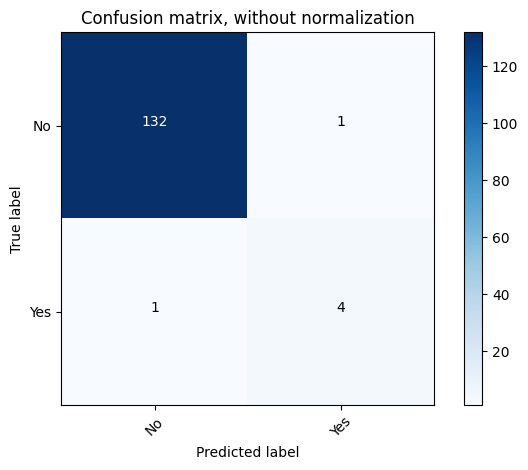

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.99      0.99       133
         Yes       0.80      0.80      0.80         5

    accuracy                           0.99       138
   macro avg       0.90      0.90      0.90       138
weighted avg       0.99      0.99      0.99       138



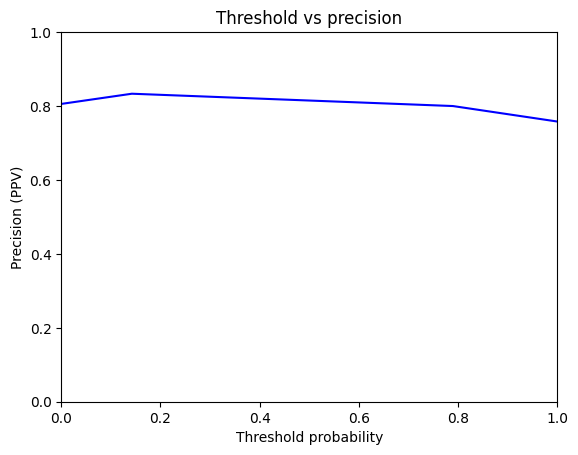

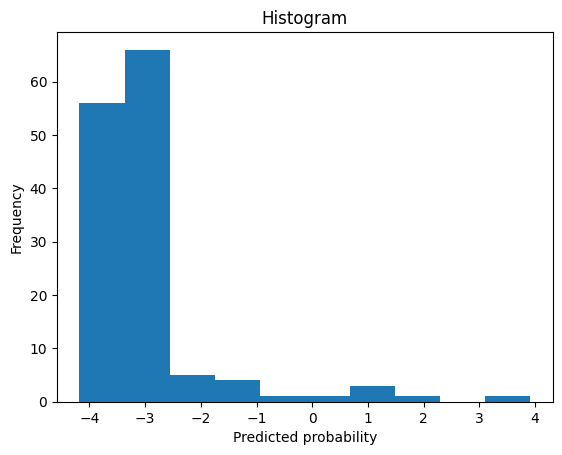

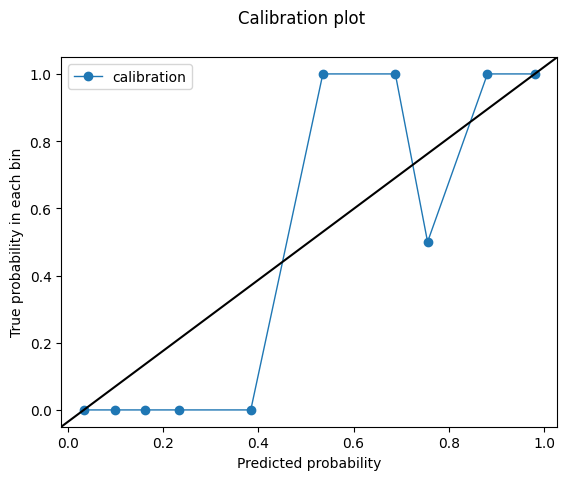

0.14233905
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9864661654135338
Outcome probability: 0.036231884057971016
Average precision score: 0.76
Best F1: 0.6666666666666666


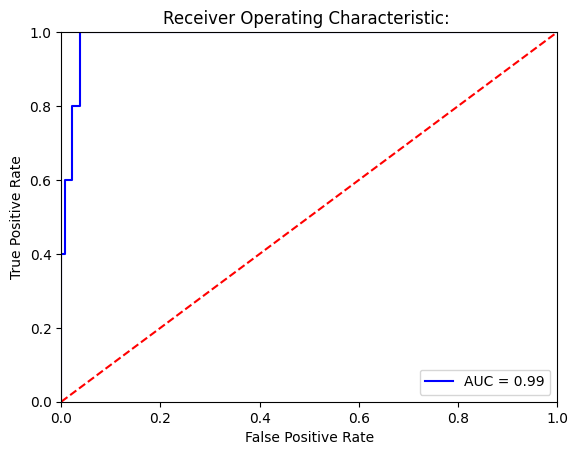

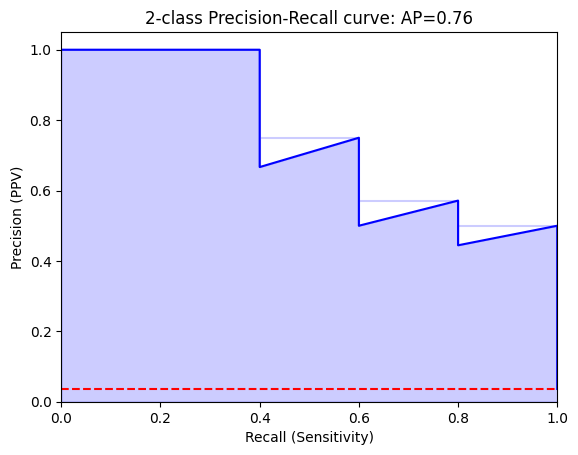

Threshold for best F1:
-1.0140864
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[128   5]
 [  0   5]]


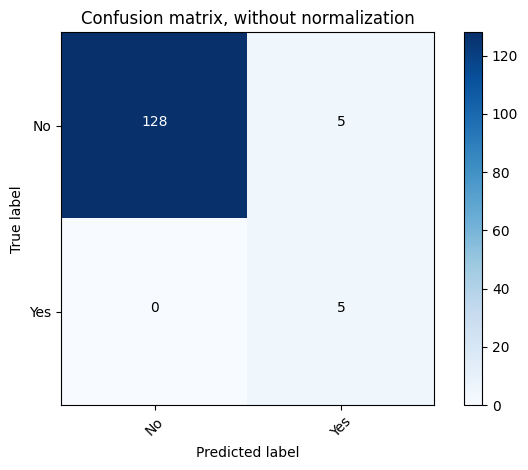

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.96      0.98       133
         Yes       0.50      1.00      0.67         5

    accuracy                           0.96       138
   macro avg       0.75      0.98      0.82       138
weighted avg       0.98      0.96      0.97       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[133   0]
 [  3   2]]


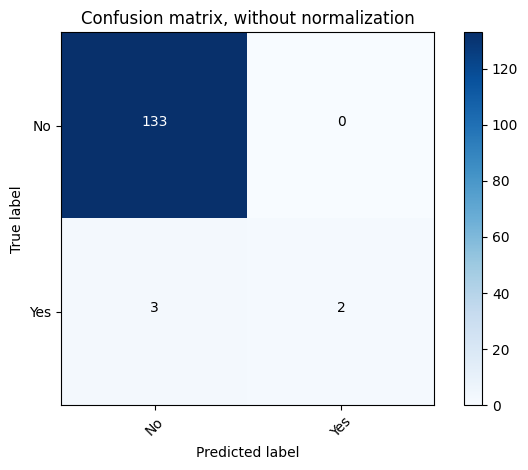

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       133
         Yes       1.00      0.40      0.57         5

    accuracy                           0.98       138
   macro avg       0.99      0.70      0.78       138
weighted avg       0.98      0.98      0.97       138



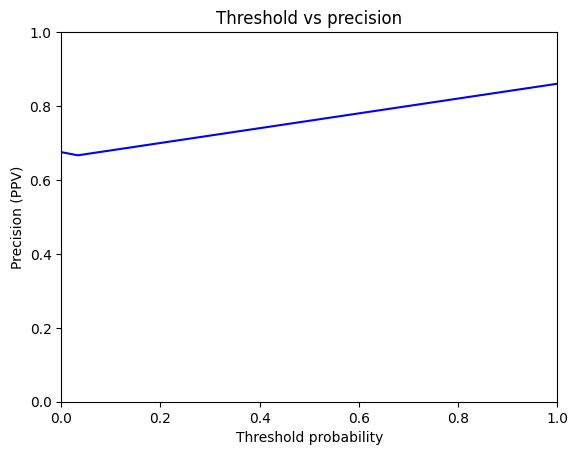

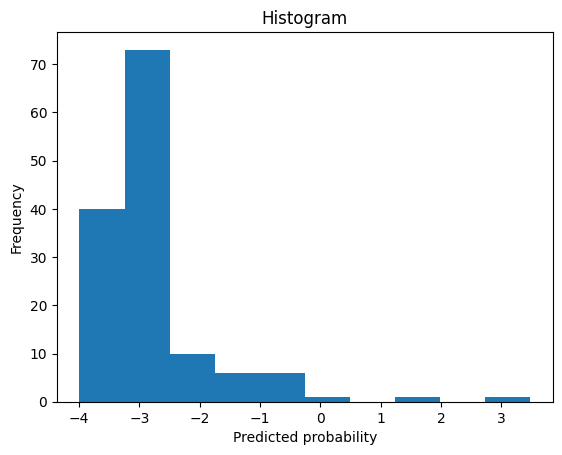

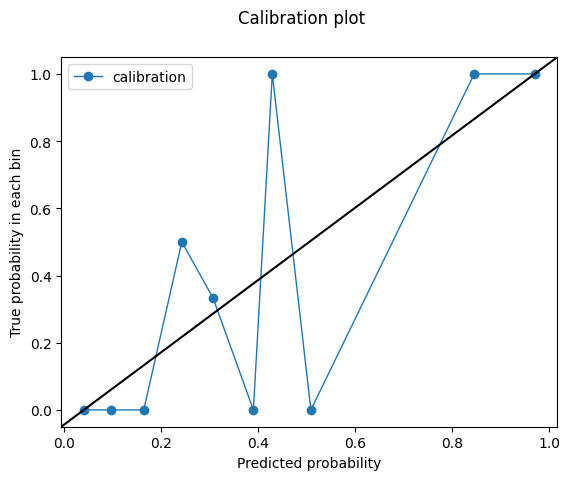

-1.0140864
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.9413533834586466
Outcome probability: 0.036231884057971016
Average precision score: 0.56
Best F1: 0.5714285714285715


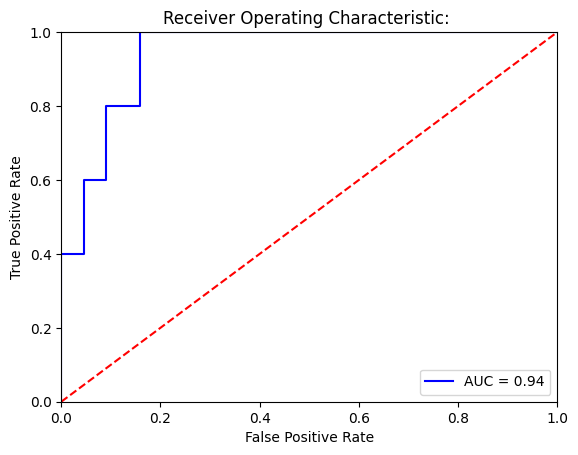

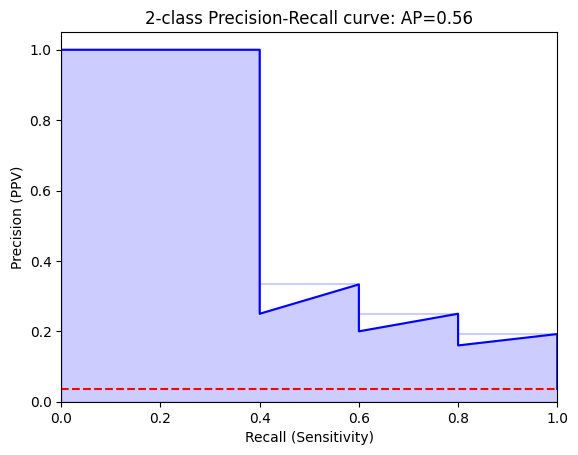

Threshold for best F1:
-0.24100892
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[133   0]
 [  3   2]]


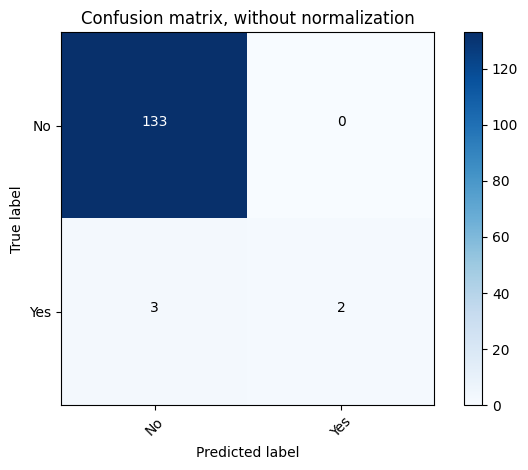

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       133
         Yes       1.00      0.40      0.57         5

    accuracy                           0.98       138
   macro avg       0.99      0.70      0.78       138
weighted avg       0.98      0.98      0.97       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[133   0]
 [  4   1]]


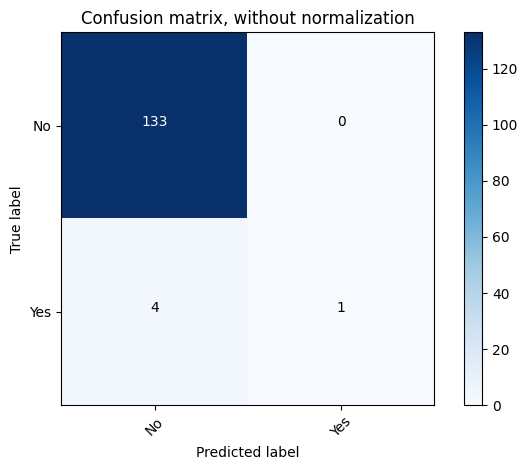

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.97      1.00      0.99       133
         Yes       1.00      0.20      0.33         5

    accuracy                           0.97       138
   macro avg       0.99      0.60      0.66       138
weighted avg       0.97      0.97      0.96       138



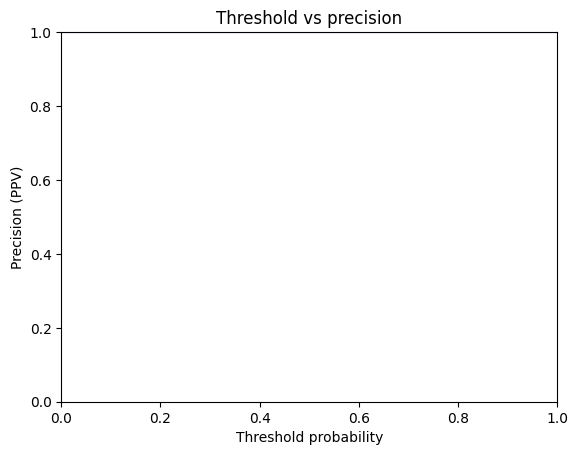

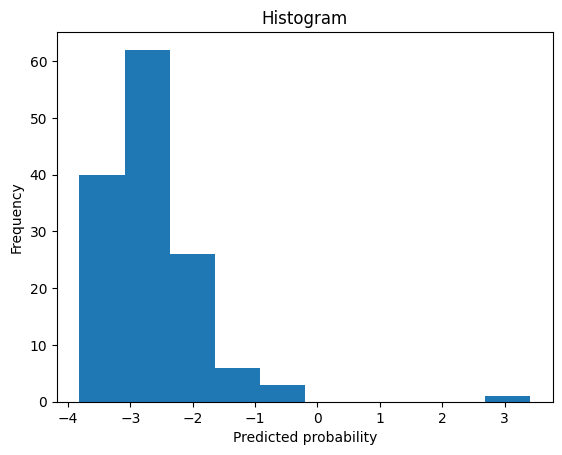

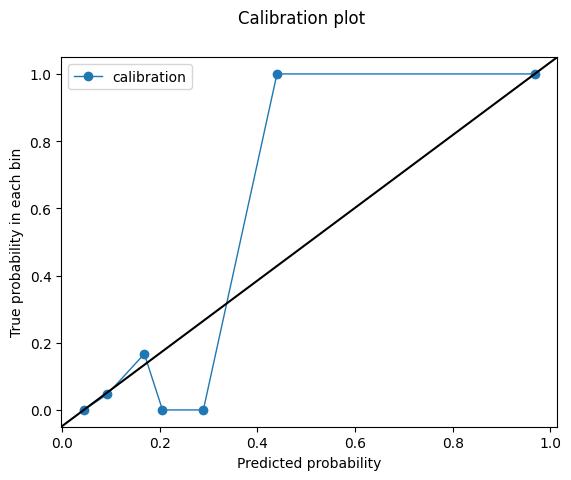

-0.24100892
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8315789473684212
Outcome probability: 0.036231884057971016
Average precision score: 0.54
Best F1: 0.5714285714285715


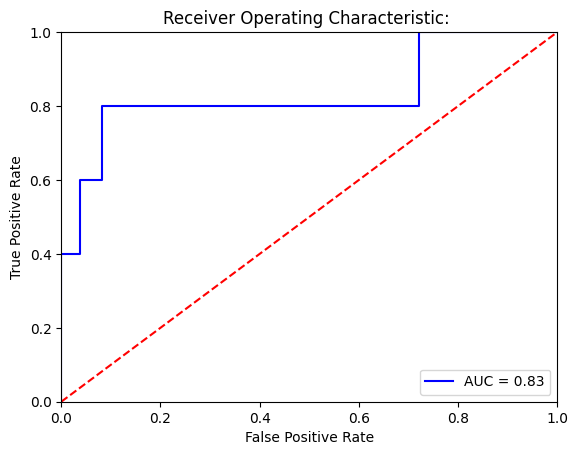

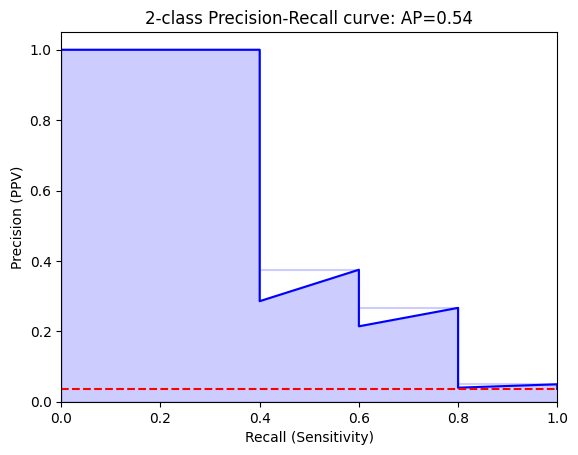

Threshold for best F1:
3.5317037
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[133   0]
 [  3   2]]


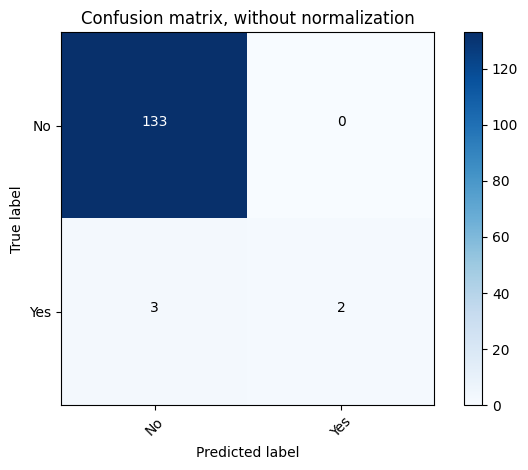

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       133
         Yes       1.00      0.40      0.57         5

    accuracy                           0.98       138
   macro avg       0.99      0.70      0.78       138
weighted avg       0.98      0.98      0.97       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[127   6]
 [  2   3]]


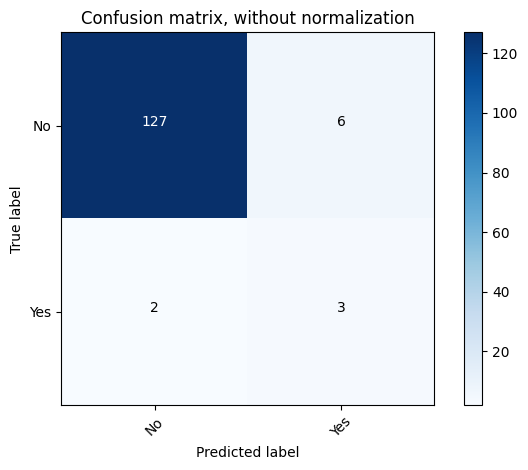

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      0.95      0.97       133
         Yes       0.33      0.60      0.43         5

    accuracy                           0.94       138
   macro avg       0.66      0.78      0.70       138
weighted avg       0.96      0.94      0.95       138



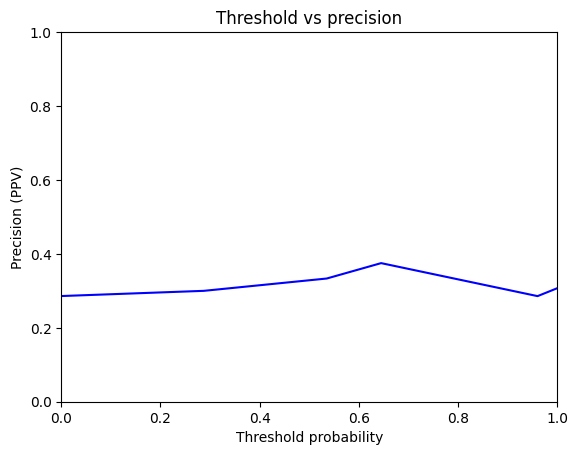

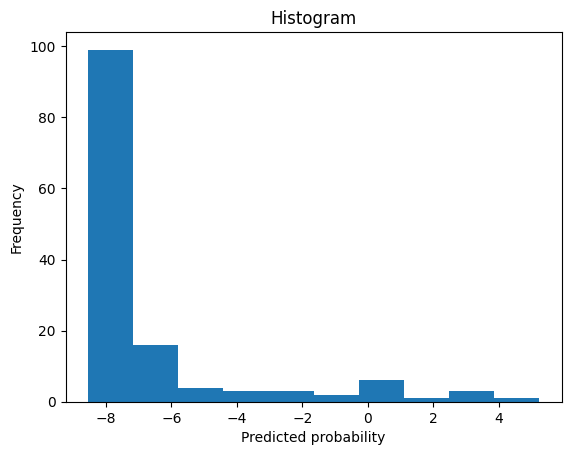

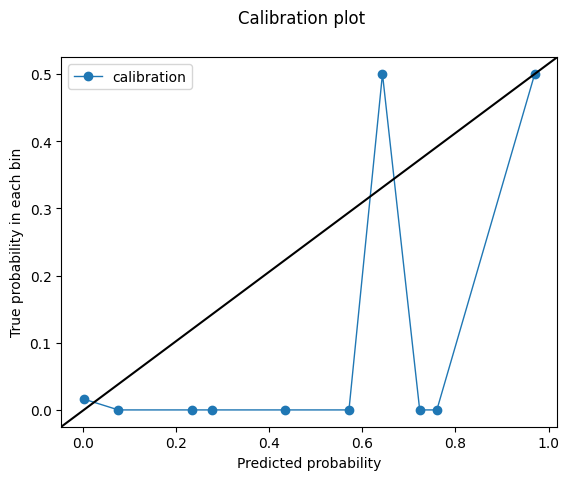

3.5317037
validation set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.9864661654135339
Outcome probability: 0.036231884057971016
Average precision score: 0.82
Best F1: 0.7499999999999999


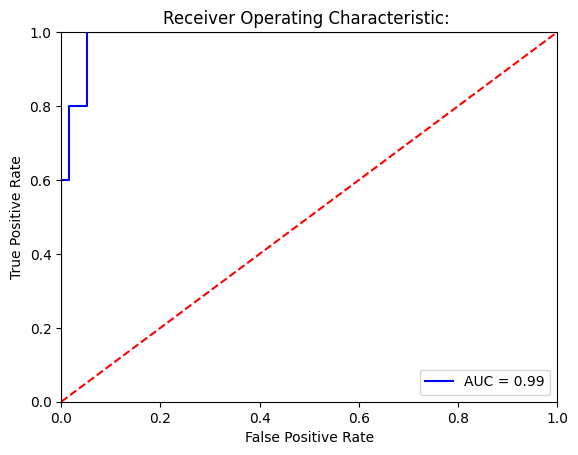

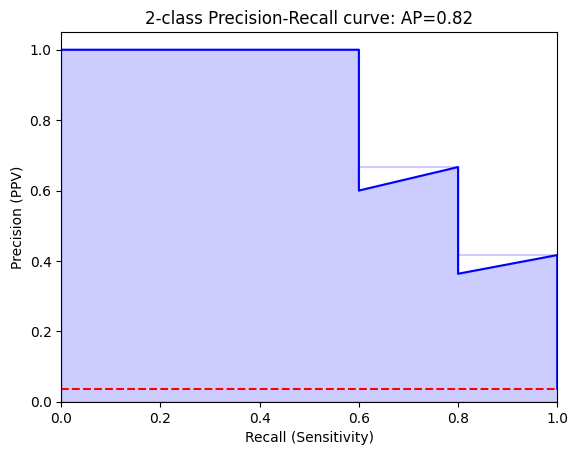

Threshold for best F1:
-0.043934975
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[133   0]
 [  2   3]]


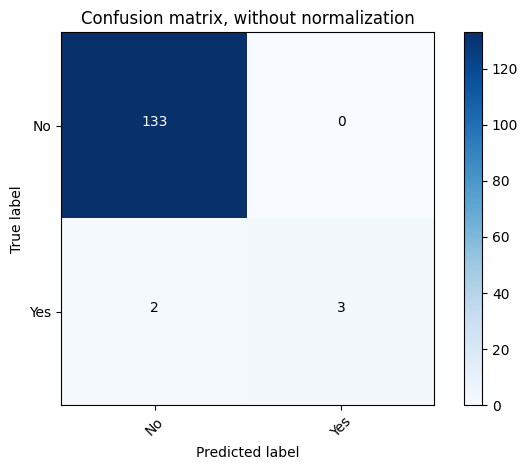

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      1.00      0.99       133
         Yes       1.00      0.60      0.75         5

    accuracy                           0.99       138
   macro avg       0.99      0.80      0.87       138
weighted avg       0.99      0.99      0.98       138

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[133   0]
 [  3   2]]


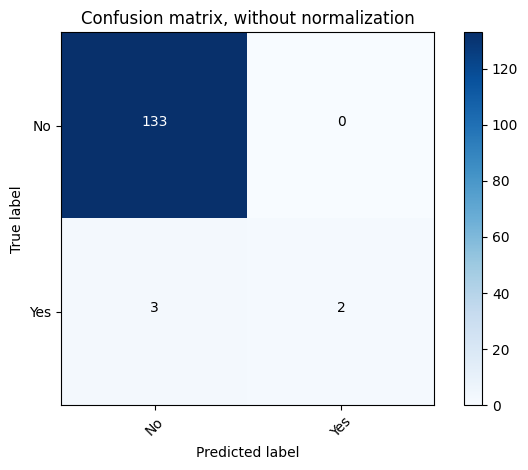

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      1.00      0.99       133
         Yes       1.00      0.40      0.57         5

    accuracy                           0.98       138
   macro avg       0.99      0.70      0.78       138
weighted avg       0.98      0.98      0.97       138



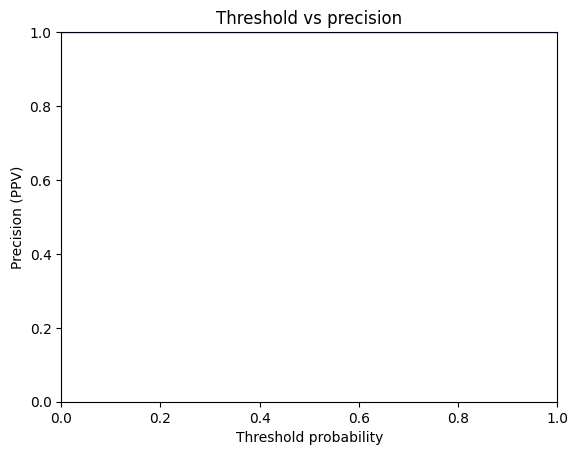

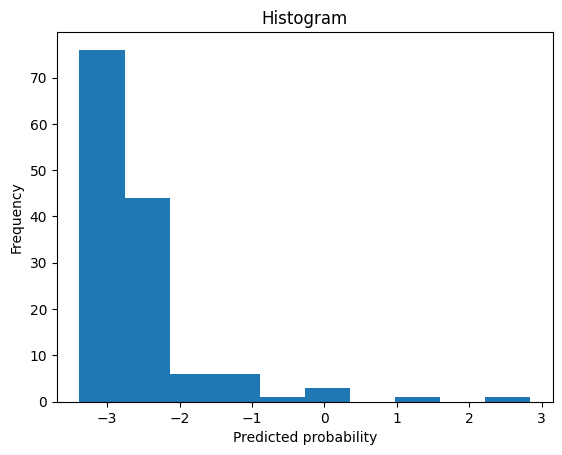

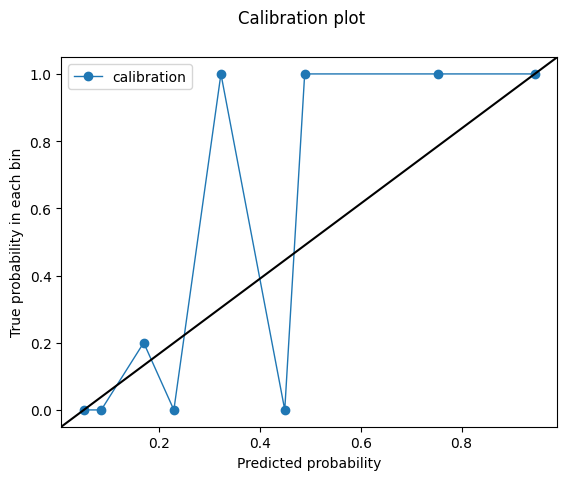

-0.043934975
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8958333333333334
Outcome probability: 0.18181818181818182
Average precision score: 0.83
Best F1: 0.8148148148148148


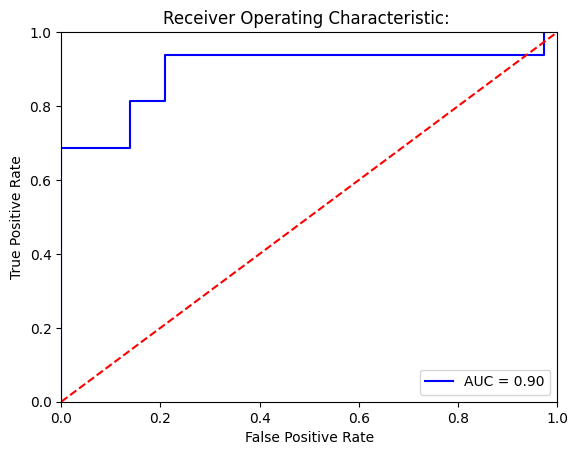

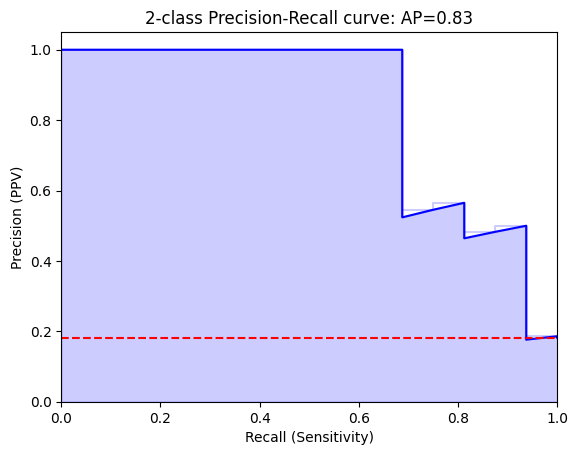

Threshold for best F1:
0.5980816
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  0]
 [ 5 11]]


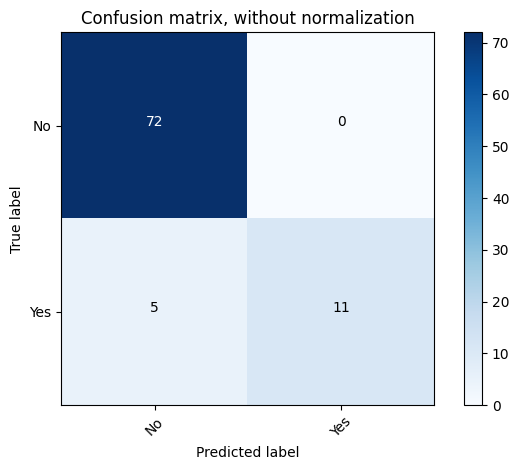

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      1.00      0.97        72
         Yes       1.00      0.69      0.81        16

    accuracy                           0.94        88
   macro avg       0.97      0.84      0.89        88
weighted avg       0.95      0.94      0.94        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[72  0]
 [ 5 11]]


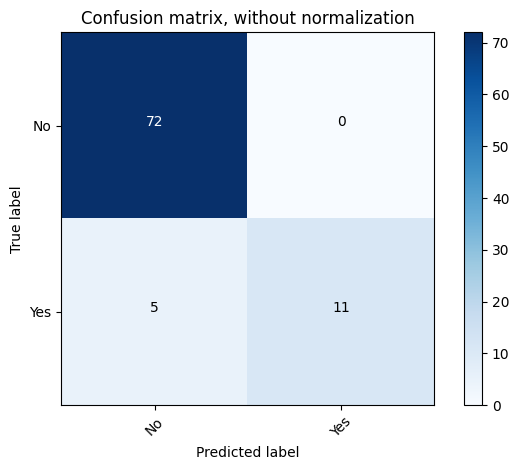

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      1.00      0.97        72
         Yes       1.00      0.69      0.81        16

    accuracy                           0.94        88
   macro avg       0.97      0.84      0.89        88
weighted avg       0.95      0.94      0.94        88



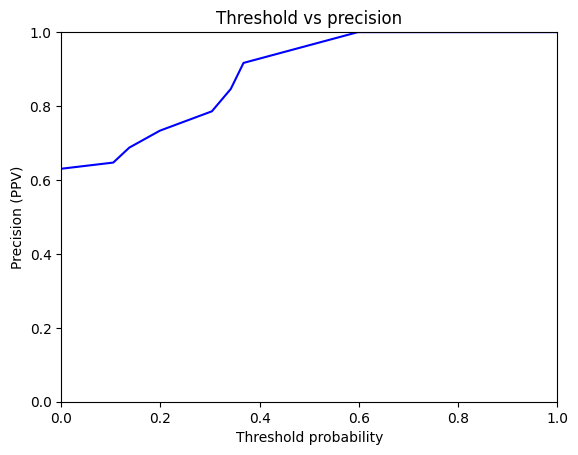

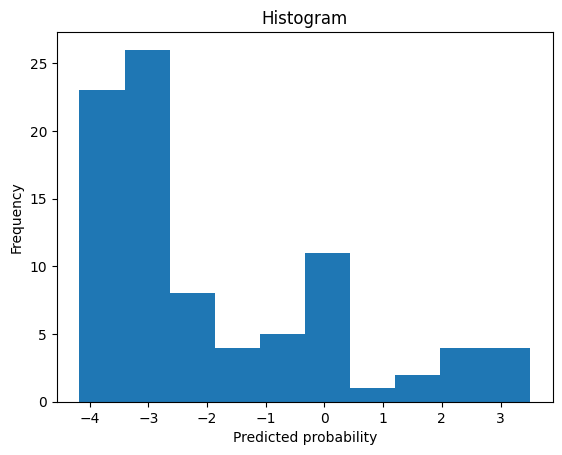

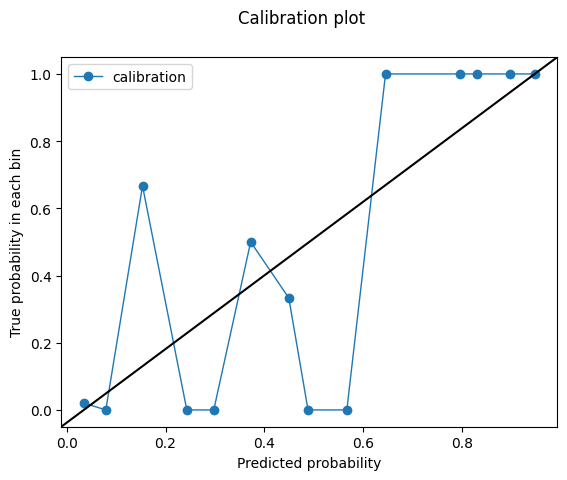

0.5980816
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8689236111111112
Outcome probability: 0.18181818181818182
Average precision score: 0.77
Best F1: 0.72


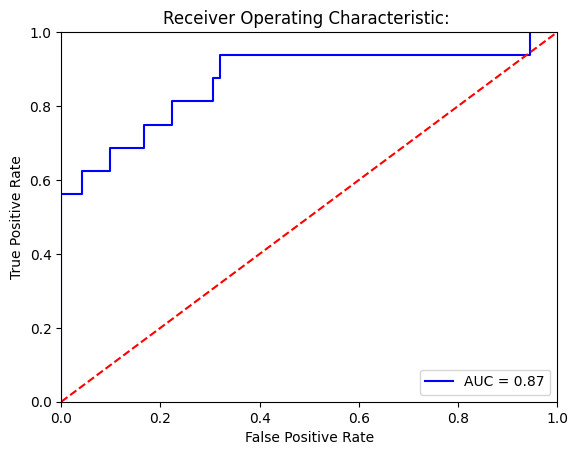

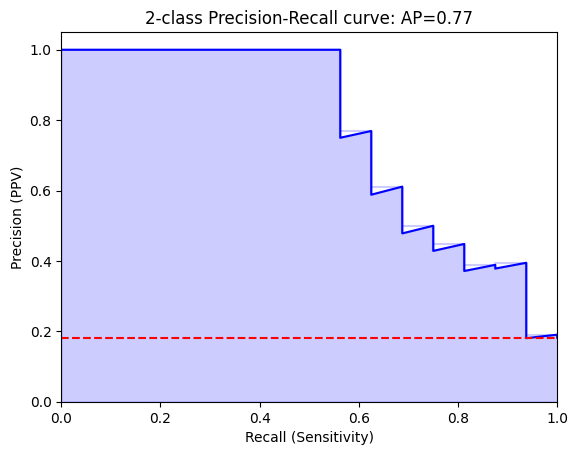

Threshold for best F1:
0.3921467
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  0]
 [ 7  9]]


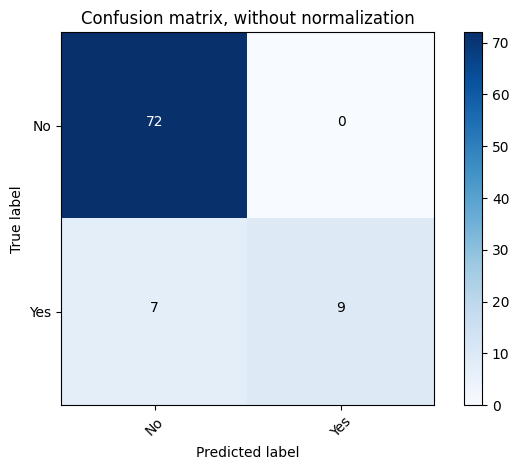

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      1.00      0.95        72
         Yes       1.00      0.56      0.72        16

    accuracy                           0.92        88
   macro avg       0.96      0.78      0.84        88
weighted avg       0.93      0.92      0.91        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[72  0]
 [ 8  8]]


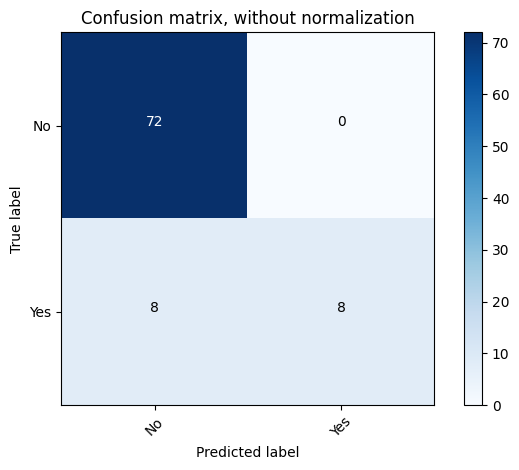

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      1.00      0.95        72
         Yes       1.00      0.50      0.67        16

    accuracy                           0.91        88
   macro avg       0.95      0.75      0.81        88
weighted avg       0.92      0.91      0.90        88



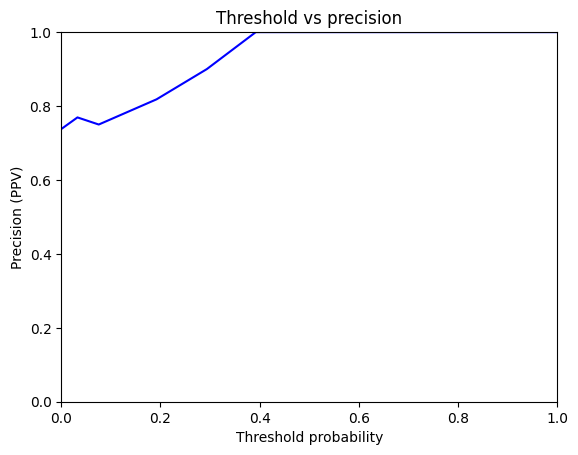

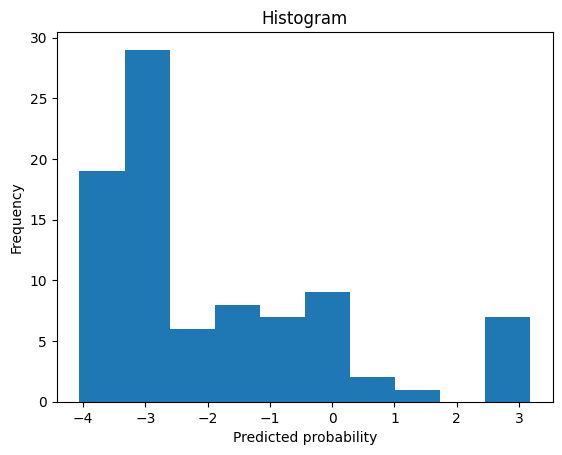

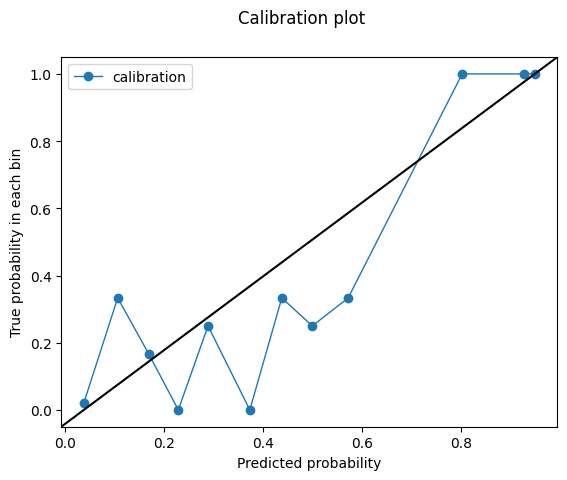

0.3921467
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8541666666666666
Outcome probability: 0.18181818181818182
Average precision score: 0.71
Best F1: 0.6666666666666666


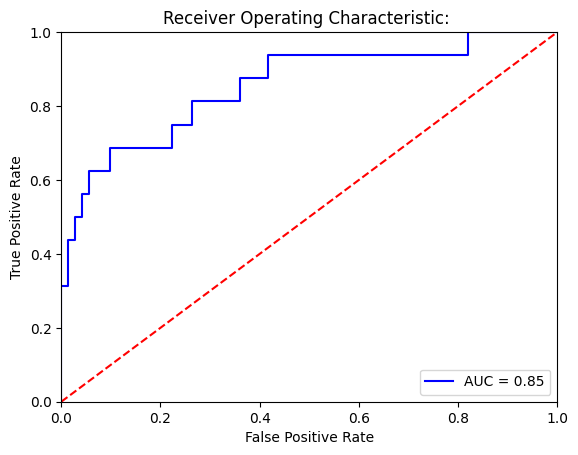

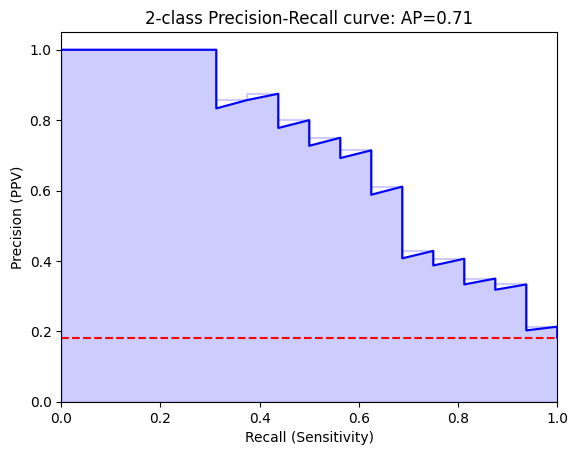

Threshold for best F1:
-1.290838
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[68  4]
 [ 6 10]]


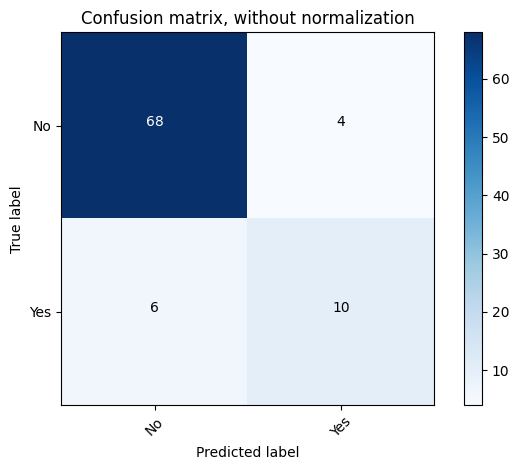

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.94      0.93        72
         Yes       0.71      0.62      0.67        16

    accuracy                           0.89        88
   macro avg       0.82      0.78      0.80        88
weighted avg       0.88      0.89      0.88        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[71  1]
 [11  5]]


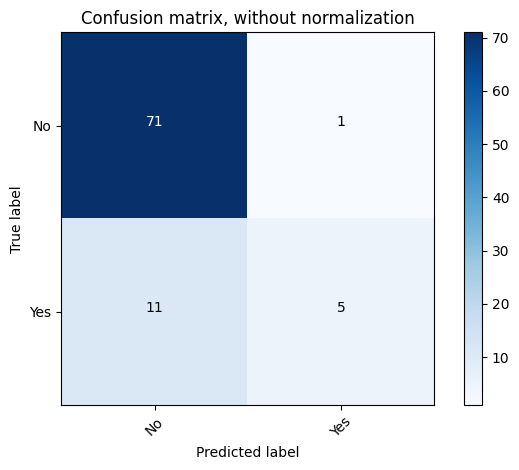

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.99      0.92        72
         Yes       0.83      0.31      0.45        16

    accuracy                           0.86        88
   macro avg       0.85      0.65      0.69        88
weighted avg       0.86      0.86      0.84        88



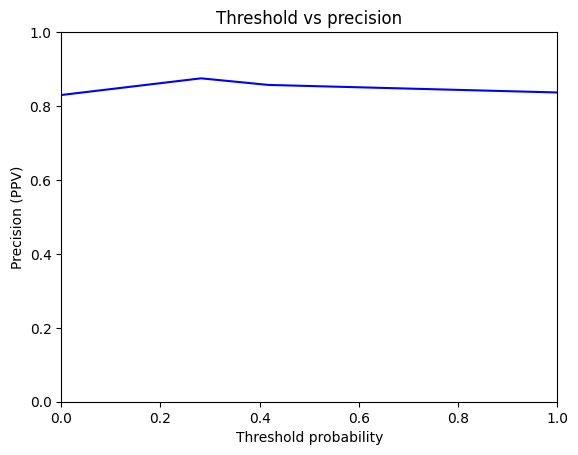

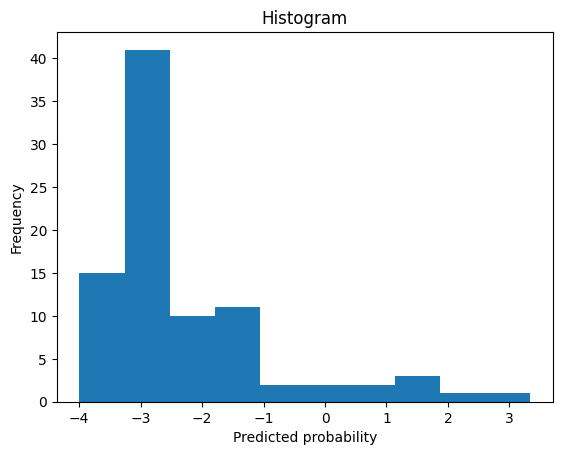

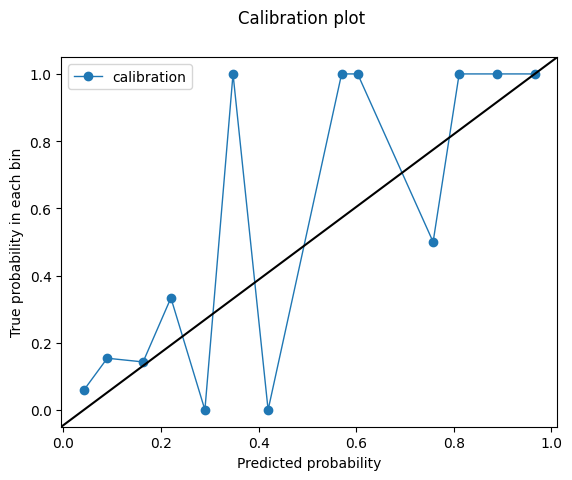

-1.290838
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8116319444444444
Outcome probability: 0.18181818181818182
Average precision score: 0.68
Best F1: 0.6086956521739131


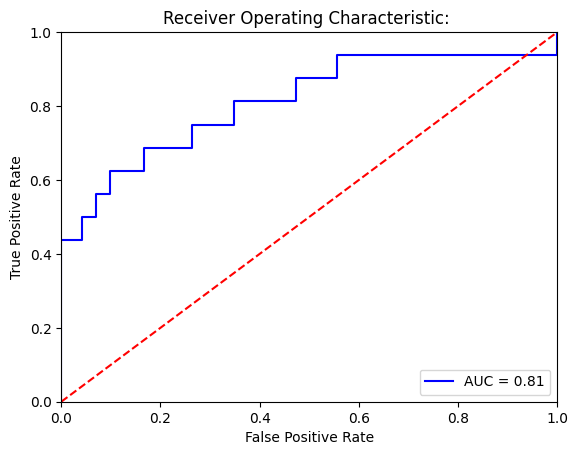

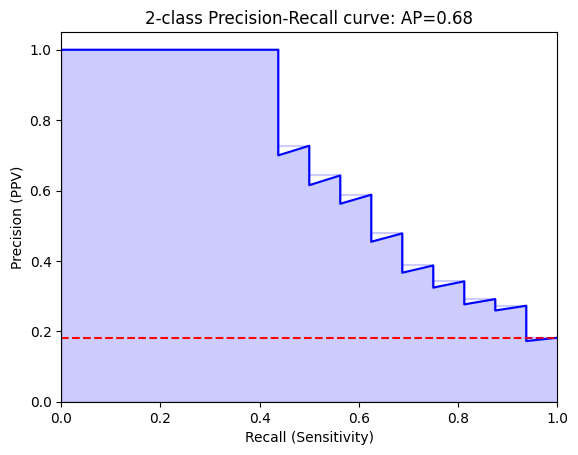

Threshold for best F1:
3.863879
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  0]
 [ 9  7]]


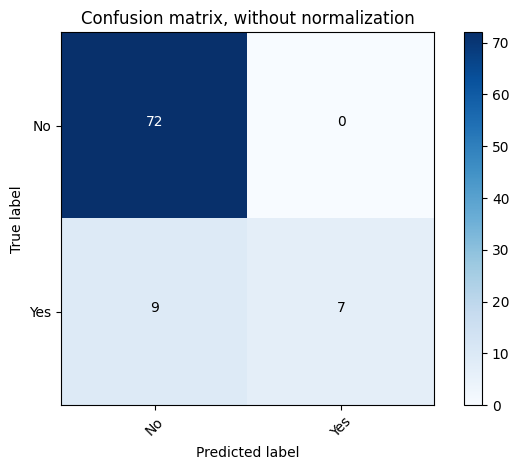

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      1.00      0.94        72
         Yes       1.00      0.44      0.61        16

    accuracy                           0.90        88
   macro avg       0.94      0.72      0.77        88
weighted avg       0.91      0.90      0.88        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[65  7]
 [ 6 10]]


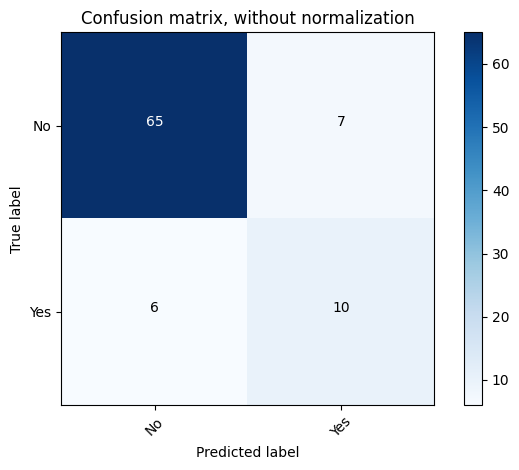

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.90      0.91        72
         Yes       0.59      0.62      0.61        16

    accuracy                           0.85        88
   macro avg       0.75      0.76      0.76        88
weighted avg       0.86      0.85      0.85        88



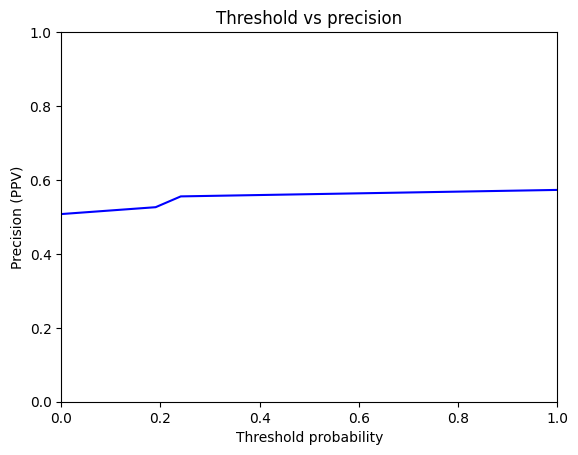

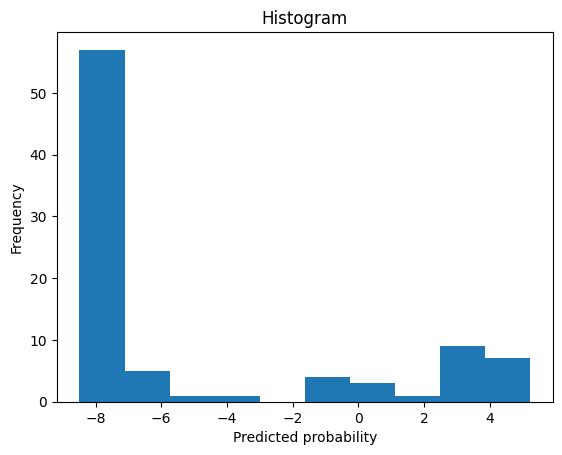

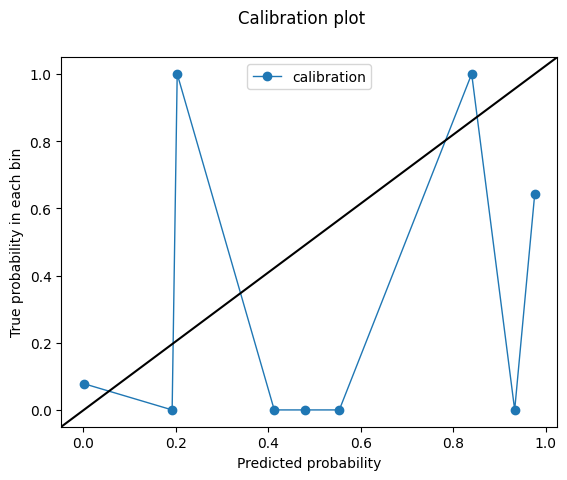

3.863879
validation set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3586166968.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8602430555555556
Outcome probability: 0.18181818181818182
Average precision score: 0.76
Best F1: 0.7058823529411765


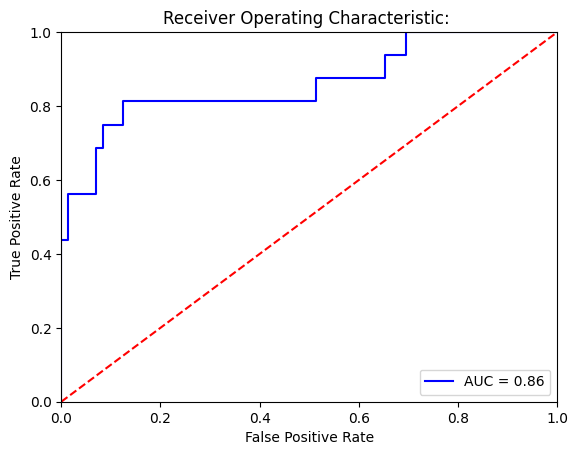

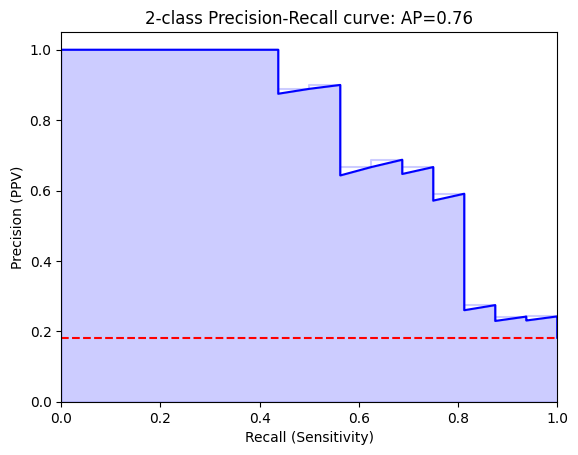

Threshold for best F1:
-0.6307696
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[66  6]
 [ 4 12]]


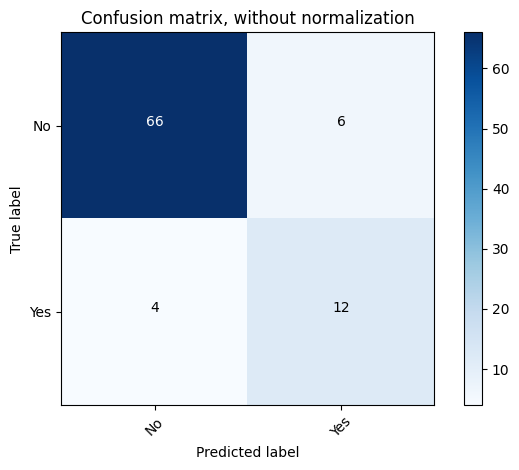

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.92      0.93        72
         Yes       0.67      0.75      0.71        16

    accuracy                           0.89        88
   macro avg       0.80      0.83      0.82        88
weighted avg       0.89      0.89      0.89        88

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[71  1]
 [ 9  7]]


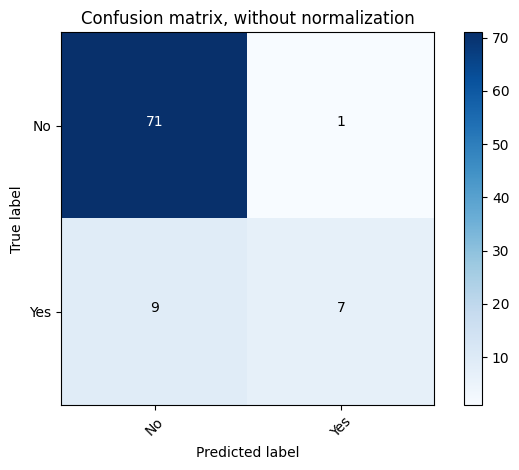

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.99      0.93        72
         Yes       0.88      0.44      0.58        16

    accuracy                           0.89        88
   macro avg       0.88      0.71      0.76        88
weighted avg       0.89      0.89      0.87        88



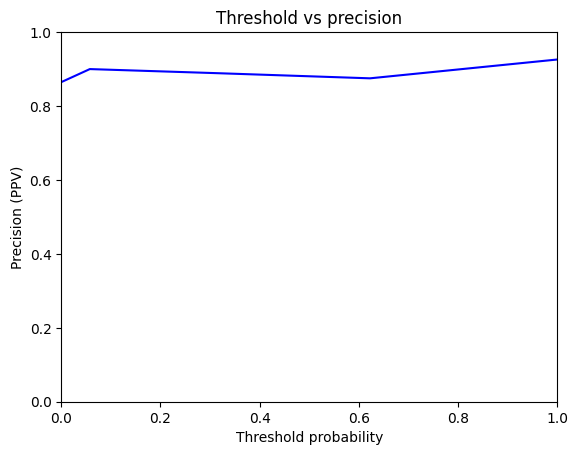

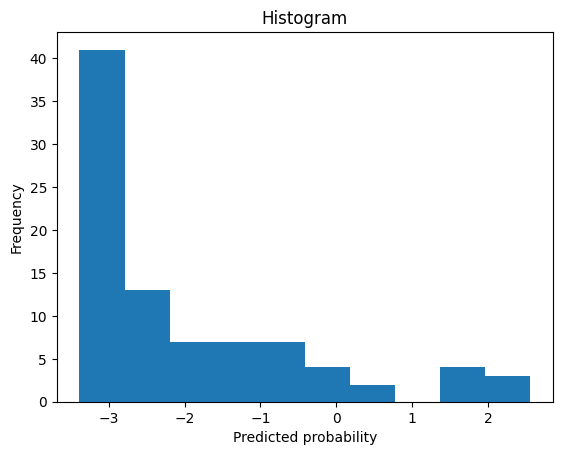

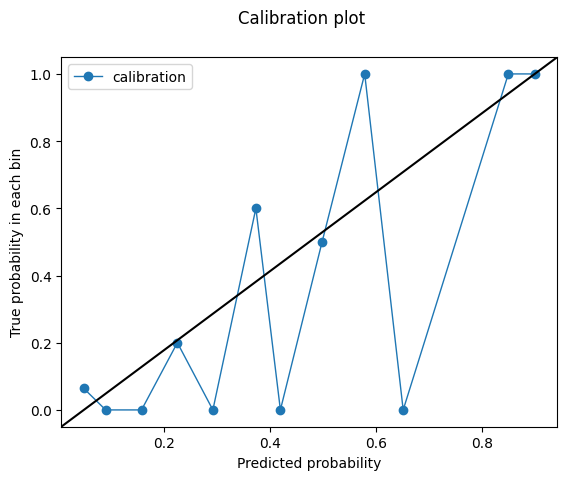

-0.6307696


In [31]:
for cancer_type in top_five_cancers:
    for model_type in model_paths:

        print('validation set')
    
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        validation = validation_full.copy()
        validation = validation[validation.Condition == cancer_type]
        validation_day_text = validation
        validation_day_text['text'] = validation_day_text.text.astype(str)
    
        validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])
    
        validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
        validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
        #validation_day_text.info()
    
        # write out actual validation dataset
        themodel = RecistModel()
        themodel.load_state_dict(torch.load(model_type))
        themodel.to(device)
    
        no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)
    
        dflist = []
        for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
            thisframe = pd.DataFrame()
    
            with torch.no_grad():
                y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))
    
            thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])
    
            dflist.append(thisframe)
    
        resultframe = pd.concat(dflist, axis=0)
        resultframe = resultframe.reset_index(drop=True)
    
    
        output = validation_day_text.reset_index(drop=True)
    
    
    
        valid_output = pd.concat([output, resultframe], axis=1)
        valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
    
    
    
    
        valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
        valid_output= valid_output[valid_output.overall_response != 'BL']
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        print(eval_model(valid_output.pd_pred, valid_output.outcome, graph=True))


test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9192155451601295
Outcome probability: 0.17463617463617465
Average precision score: 0.72
Best F1: 0.7199999999999999


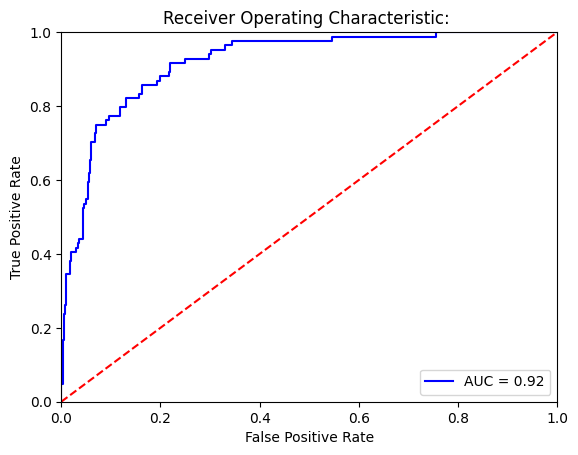

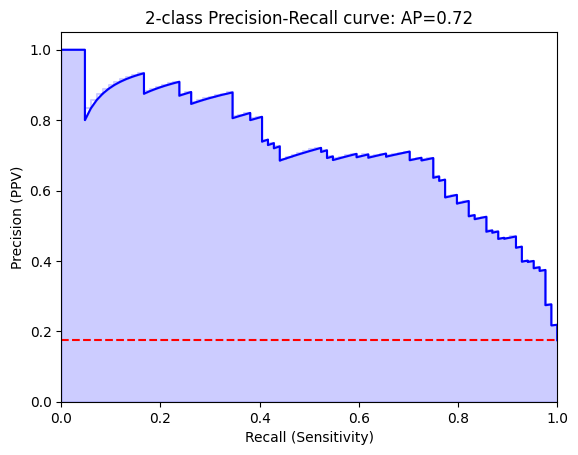

Threshold for best F1:
0.09523165
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[369  28]
 [ 21  63]]


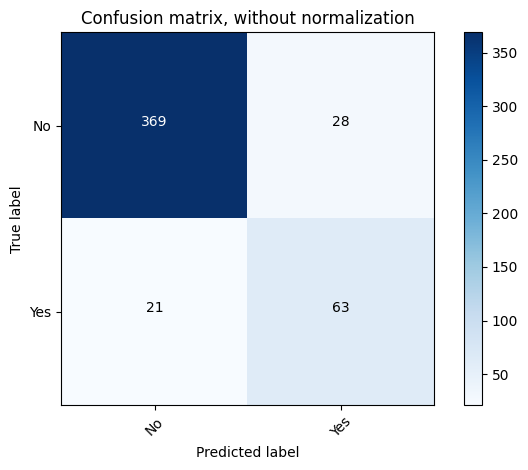

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.93      0.94       397
         Yes       0.69      0.75      0.72        84

    accuracy                           0.90       481
   macro avg       0.82      0.84      0.83       481
weighted avg       0.90      0.90      0.90       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[374  23]
 [ 31  53]]


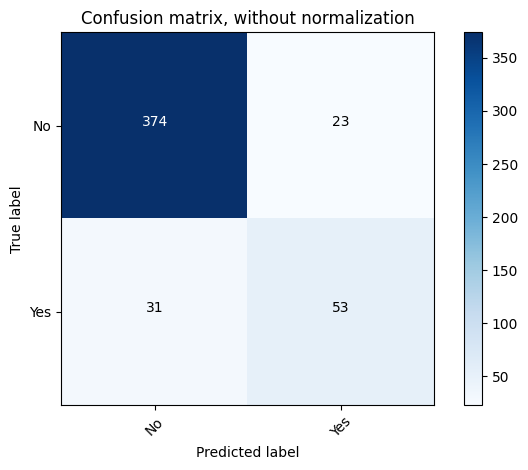

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.94      0.93       397
         Yes       0.70      0.63      0.66        84

    accuracy                           0.89       481
   macro avg       0.81      0.79      0.80       481
weighted avg       0.88      0.89      0.89       481



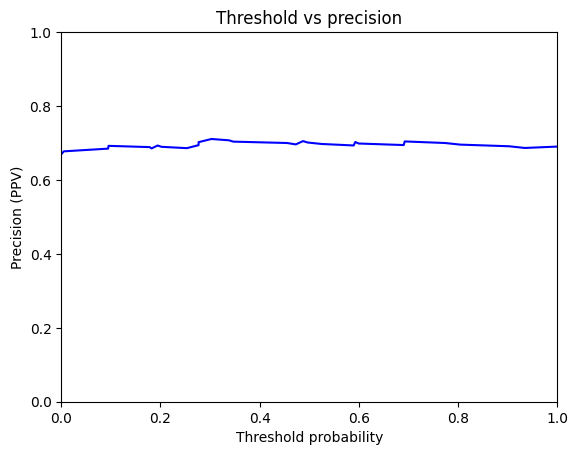

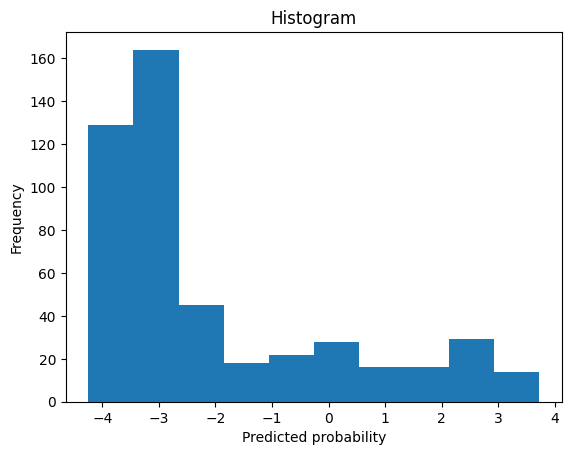

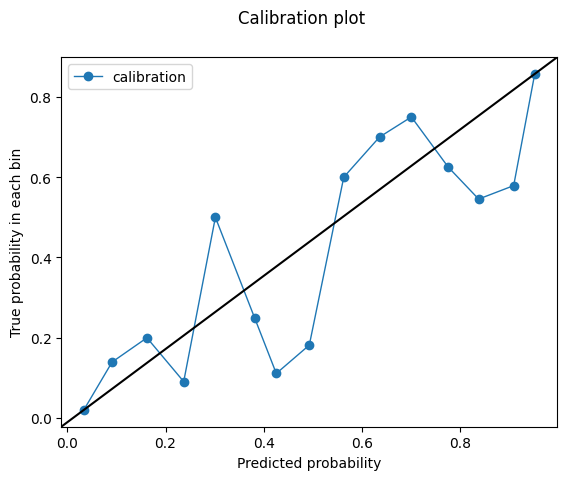

0.09523165
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9073107832553676
Outcome probability: 0.17463617463617465
Average precision score: 0.65
Best F1: 0.7046632124352332


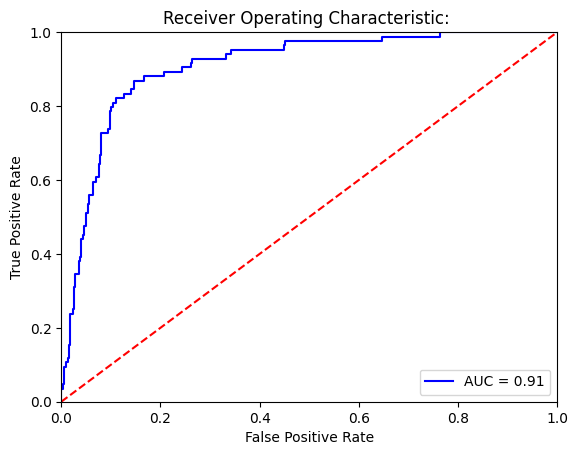

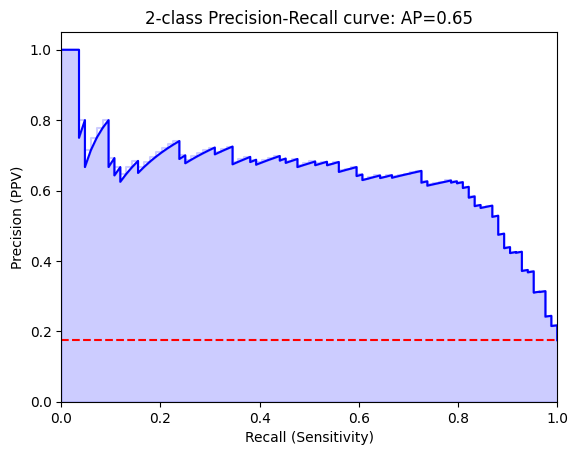

Threshold for best F1:
-0.6625905
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[356  41]
 [ 16  68]]


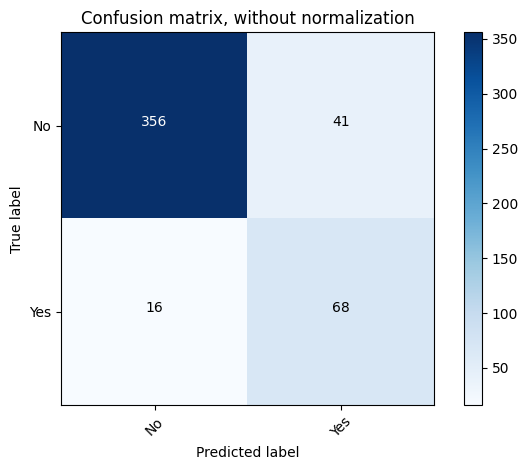

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.90      0.93       397
         Yes       0.62      0.81      0.70        84

    accuracy                           0.88       481
   macro avg       0.79      0.85      0.82       481
weighted avg       0.90      0.88      0.89       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[380  17]
 [ 47  37]]


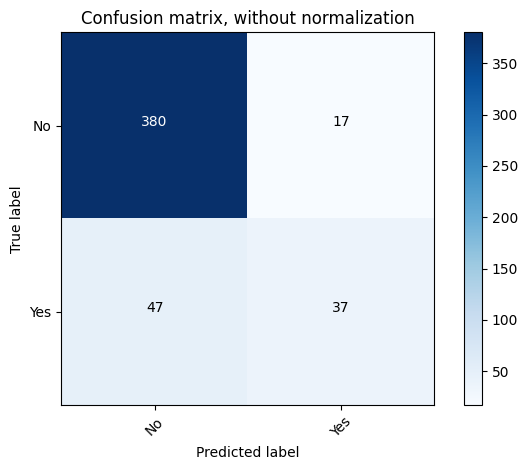

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.96      0.92       397
         Yes       0.69      0.44      0.54        84

    accuracy                           0.87       481
   macro avg       0.79      0.70      0.73       481
weighted avg       0.85      0.87      0.85       481



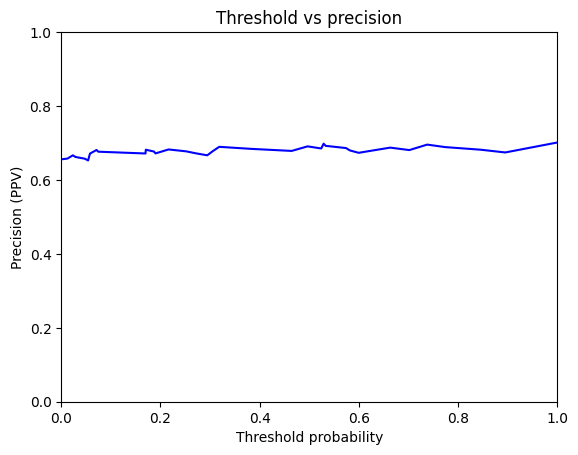

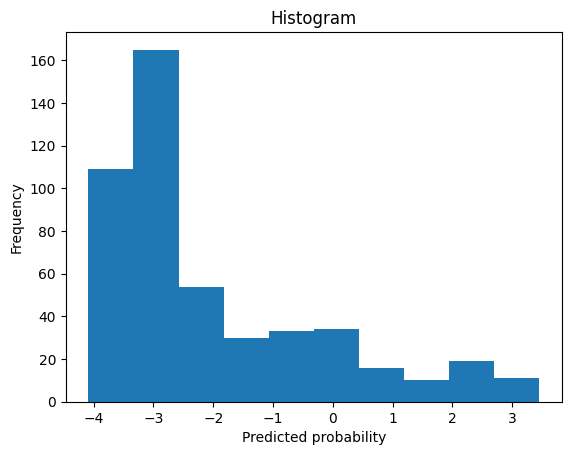

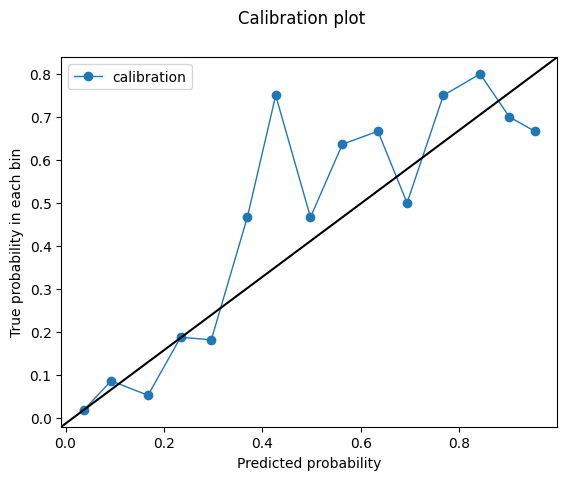

-0.6625905
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8575026988125225
Outcome probability: 0.17463617463617465
Average precision score: 0.53
Best F1: 0.5754716981132074


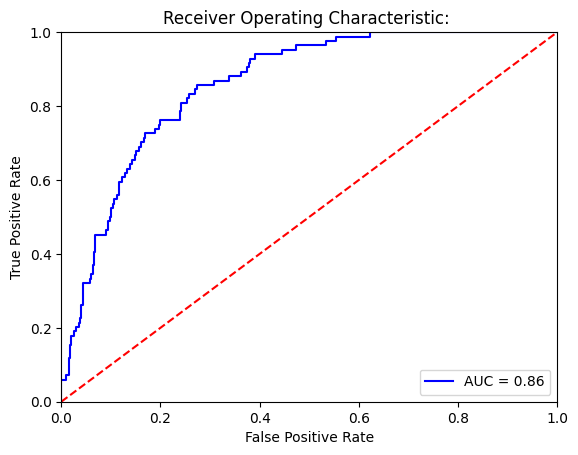

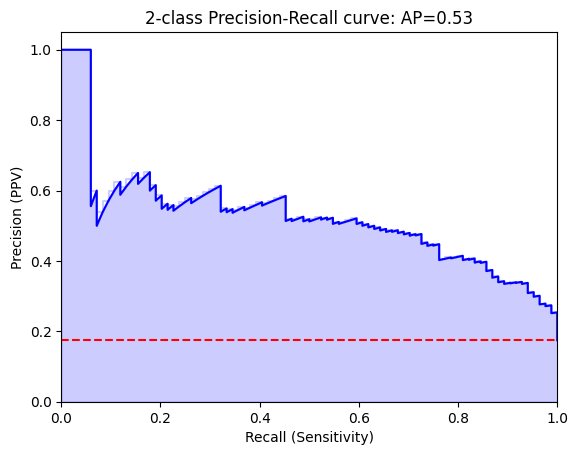

Threshold for best F1:
-1.6902895
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[330  67]
 [ 23  61]]


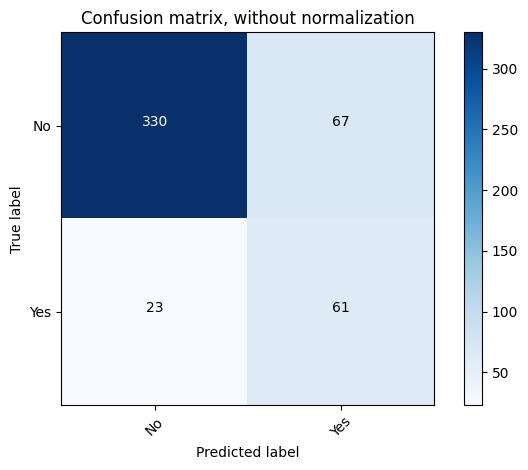

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.83      0.88       397
         Yes       0.48      0.73      0.58        84

    accuracy                           0.81       481
   macro avg       0.71      0.78      0.73       481
weighted avg       0.85      0.81      0.83       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[381  16]
 [ 64  20]]


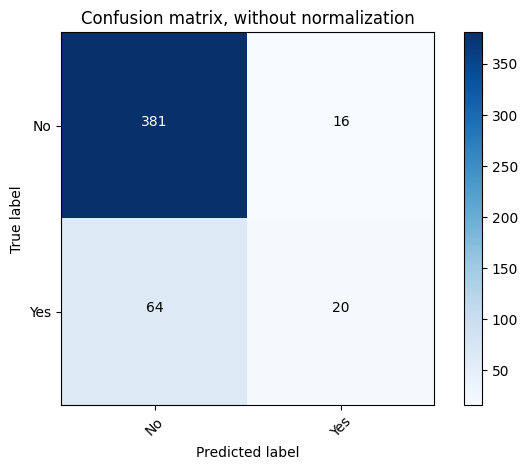

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.90       397
         Yes       0.56      0.24      0.33        84

    accuracy                           0.83       481
   macro avg       0.71      0.60      0.62       481
weighted avg       0.80      0.83      0.81       481



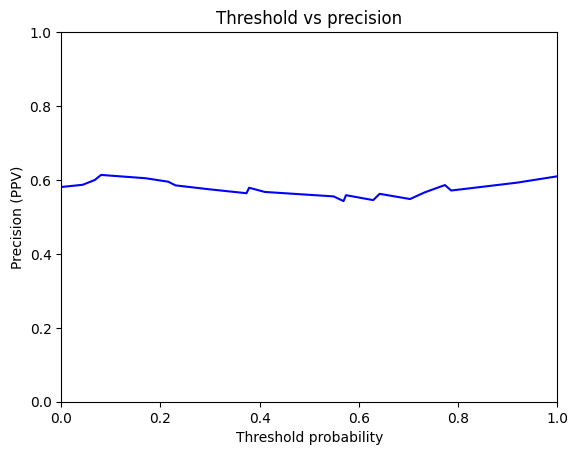

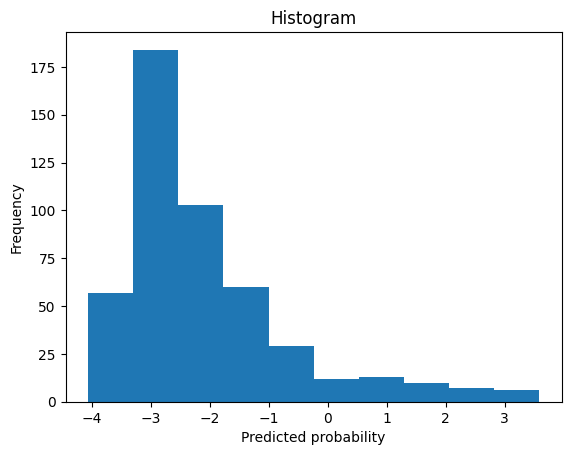

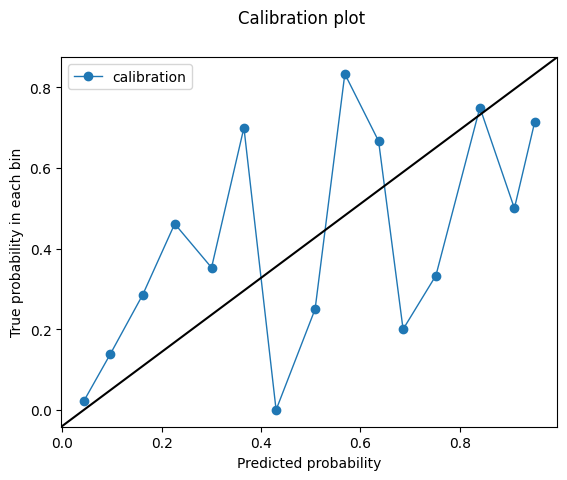

-1.6902895
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8472771980328656
Outcome probability: 0.17463617463617465
Average precision score: 0.50
Best F1: 0.5743589743589743


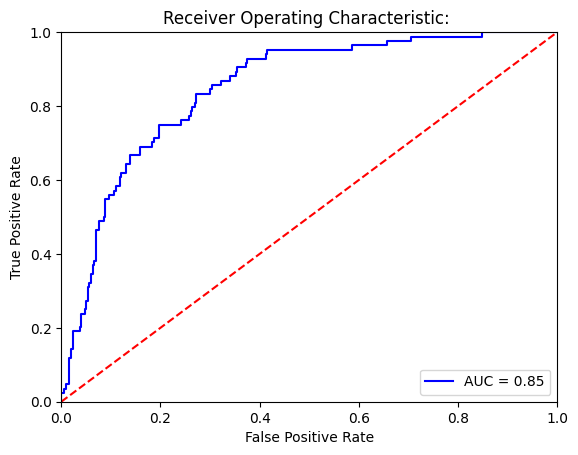

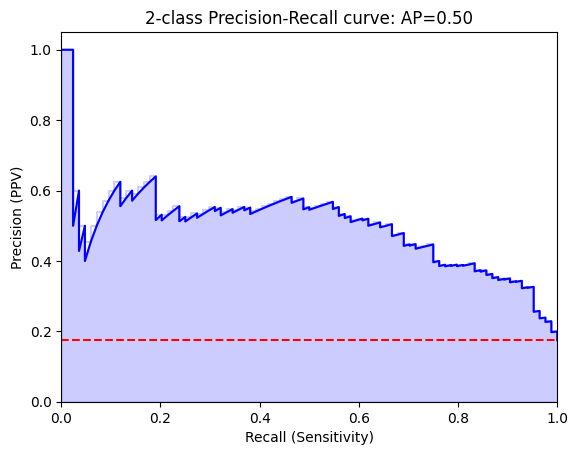

Threshold for best F1:
-0.015583821
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[342  55]
 [ 28  56]]


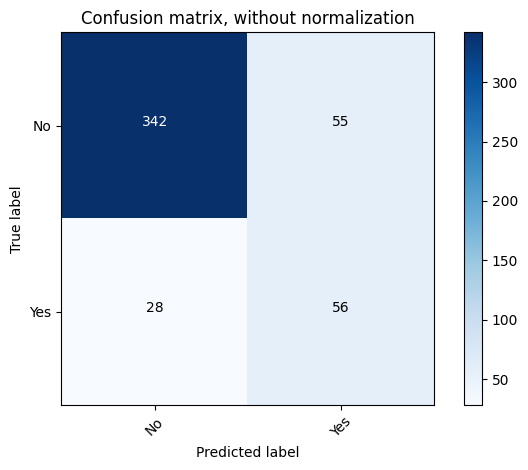

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.86      0.89       397
         Yes       0.50      0.67      0.57        84

    accuracy                           0.83       481
   macro avg       0.71      0.76      0.73       481
weighted avg       0.85      0.83      0.84       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[345  52]
 [ 31  53]]


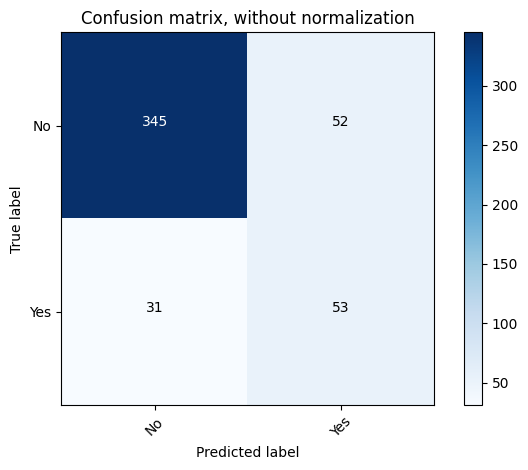

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.87      0.89       397
         Yes       0.50      0.63      0.56        84

    accuracy                           0.83       481
   macro avg       0.71      0.75      0.73       481
weighted avg       0.85      0.83      0.83       481



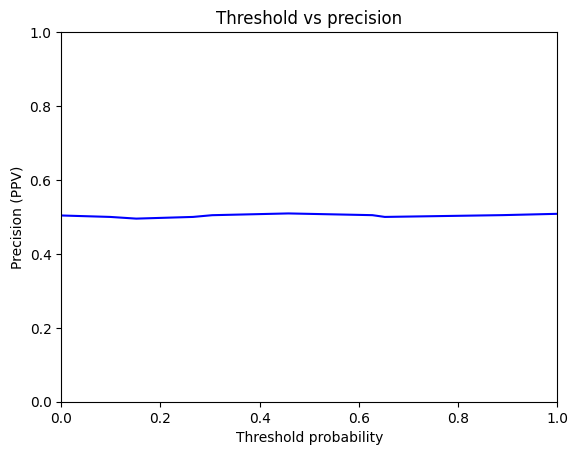

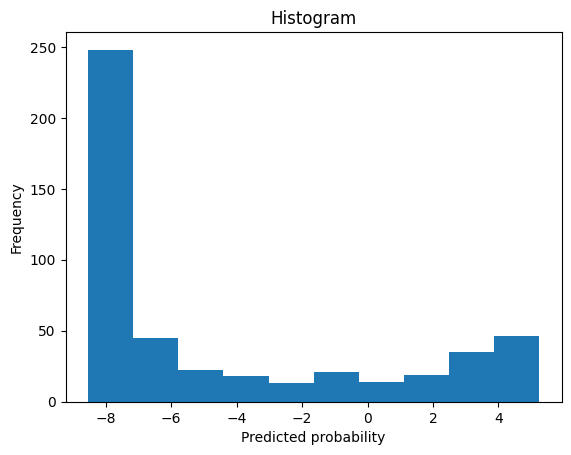

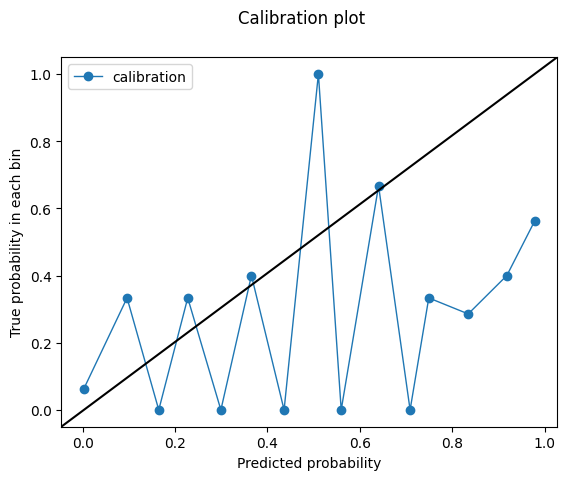

-0.015583821
test set
cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Breast
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8878493462876333
Outcome probability: 0.17463617463617465
Average precision score: 0.61
Best F1: 0.6564102564102564


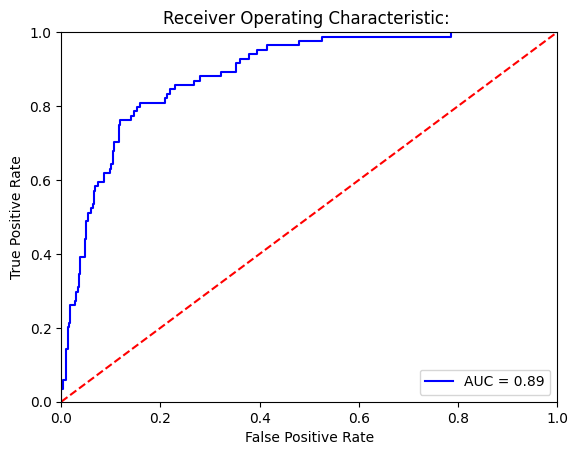

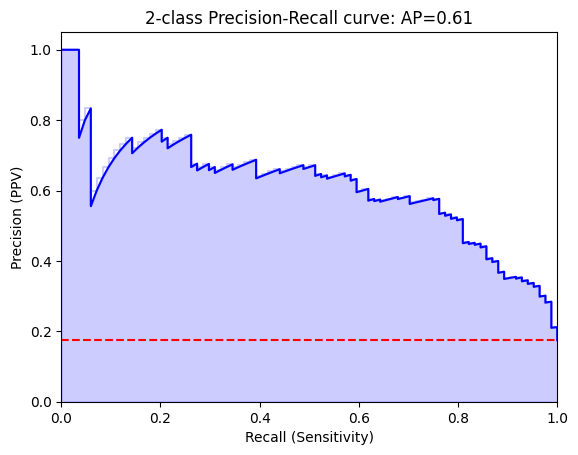

Threshold for best F1:
-1.1506077
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[350  47]
 [ 20  64]]


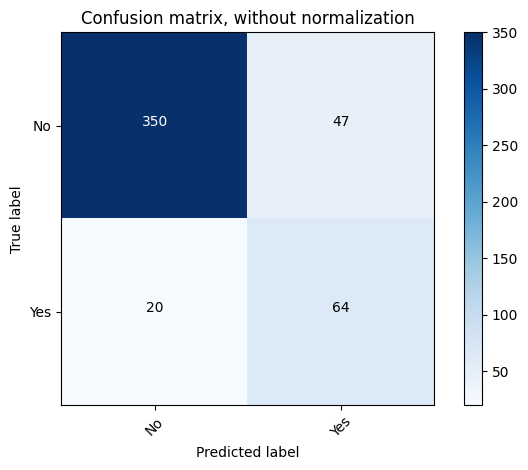

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.88      0.91       397
         Yes       0.58      0.76      0.66        84

    accuracy                           0.86       481
   macro avg       0.76      0.82      0.78       481
weighted avg       0.88      0.86      0.87       481

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[383  14]
 [ 56  28]]


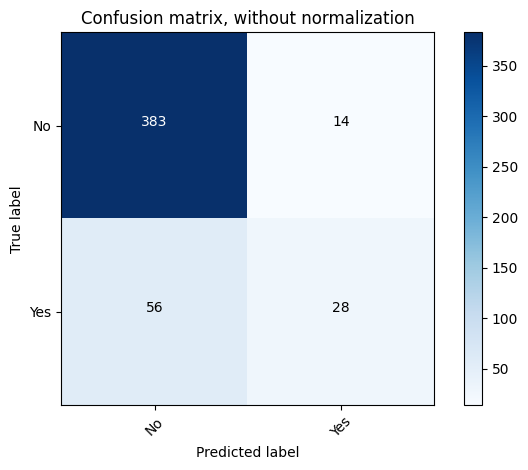

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.96      0.92       397
         Yes       0.67      0.33      0.44        84

    accuracy                           0.85       481
   macro avg       0.77      0.65      0.68       481
weighted avg       0.84      0.85      0.83       481



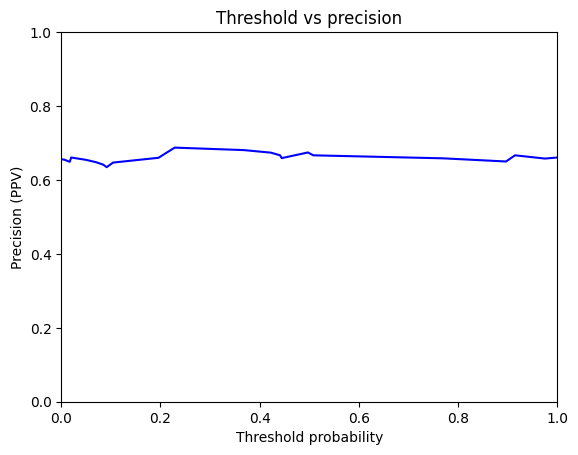

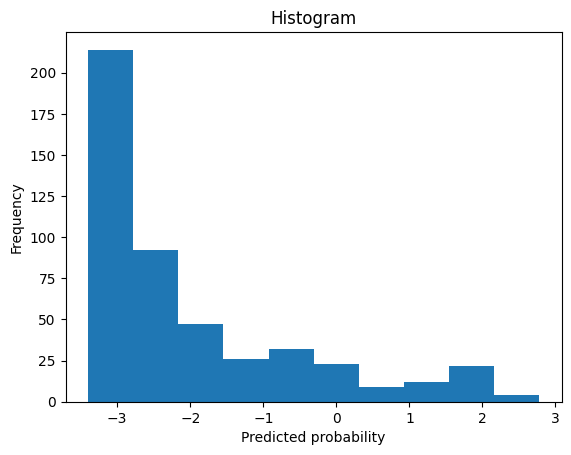

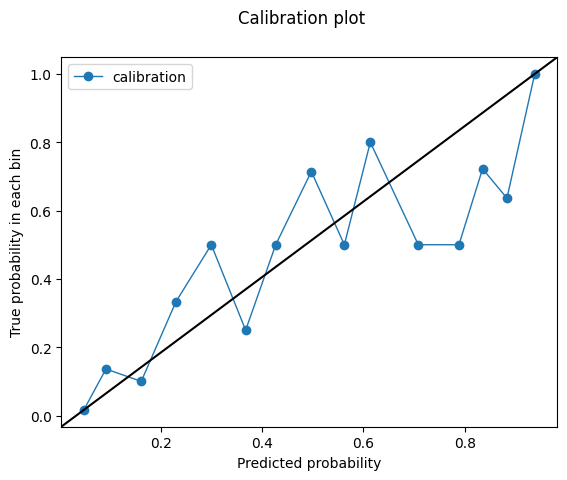

-1.1506077
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8713362674407716
Outcome probability: 0.24583333333333332
Average precision score: 0.70
Best F1: 0.6887417218543046


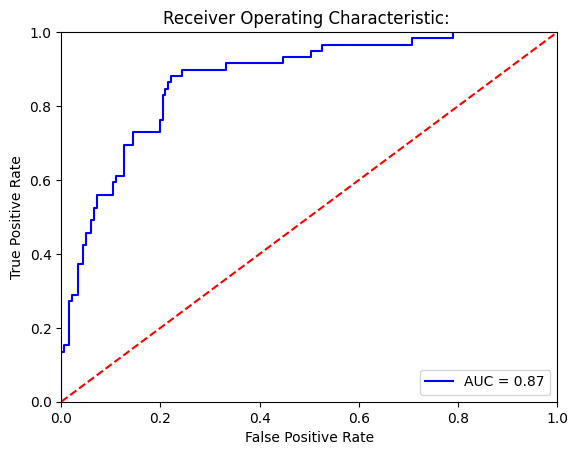

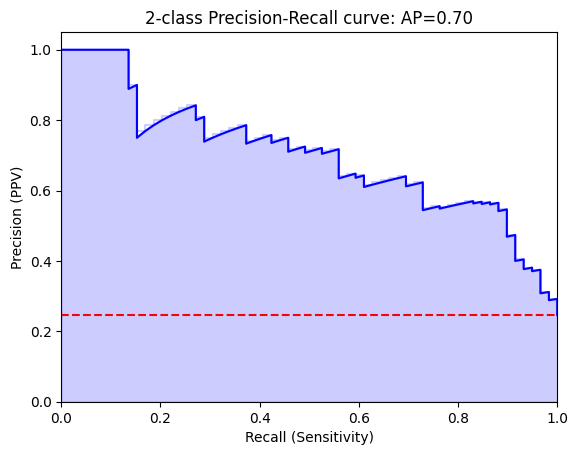

Threshold for best F1:
-2.5779958
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[141  40]
 [  7  52]]


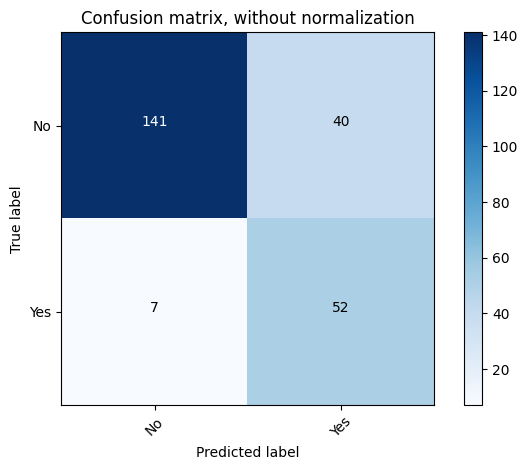

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.78      0.86       181
         Yes       0.57      0.88      0.69        59

    accuracy                           0.80       240
   macro avg       0.76      0.83      0.77       240
weighted avg       0.86      0.80      0.82       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[168  13]
 [ 27  32]]


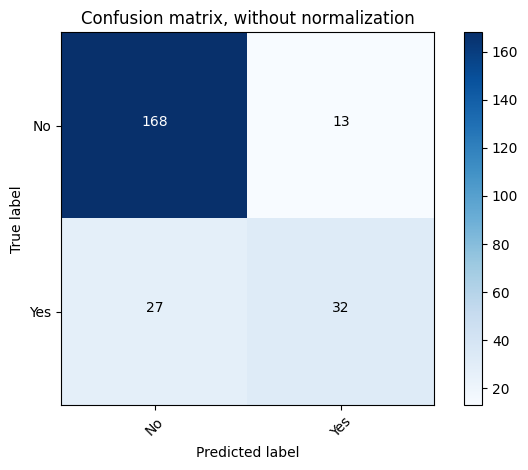

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.93      0.89       181
         Yes       0.71      0.54      0.62        59

    accuracy                           0.83       240
   macro avg       0.79      0.74      0.75       240
weighted avg       0.82      0.83      0.83       240



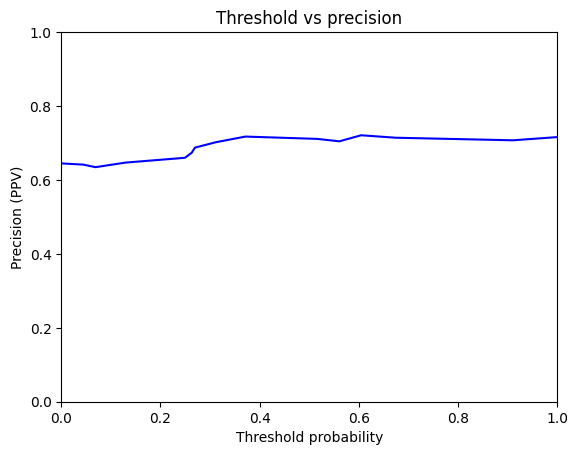

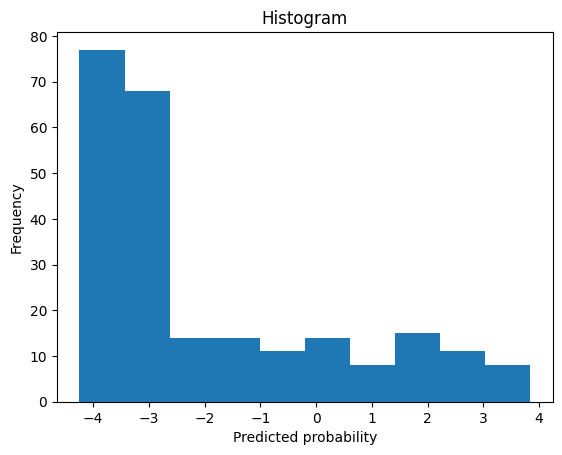

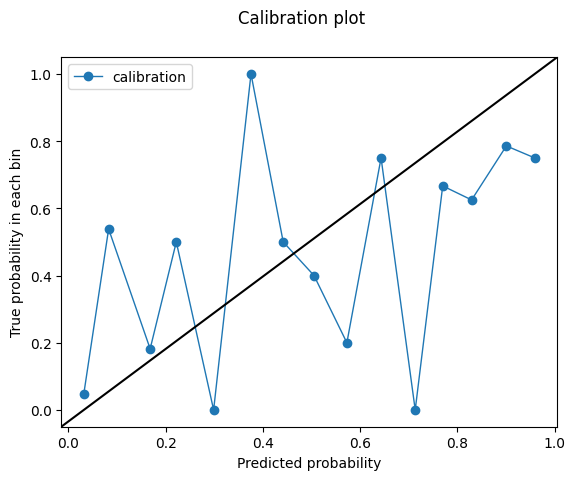

-2.5779958
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.871617192621032
Outcome probability: 0.24583333333333332
Average precision score: 0.69
Best F1: 0.6984126984126985


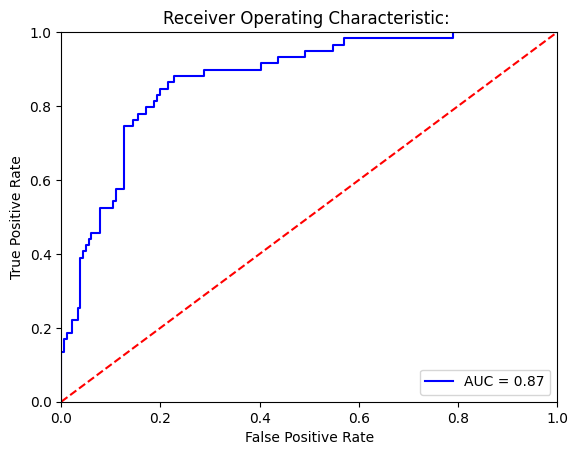

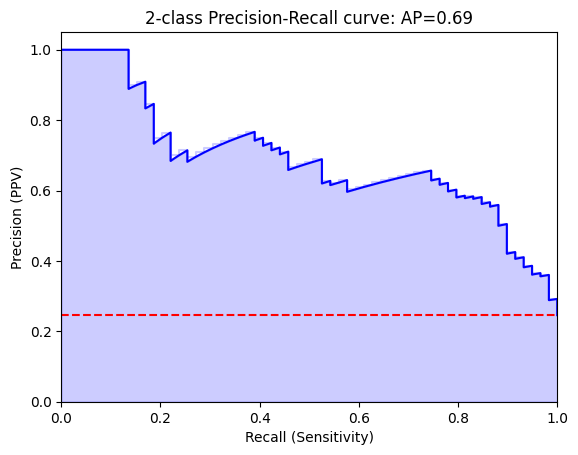

Threshold for best F1:
-1.2770283
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[158  23]
 [ 15  44]]


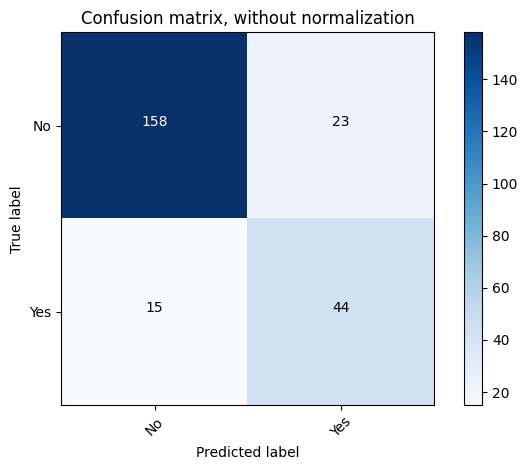

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.87      0.89       181
         Yes       0.66      0.75      0.70        59

    accuracy                           0.84       240
   macro avg       0.79      0.81      0.80       240
weighted avg       0.85      0.84      0.84       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[173   8]
 [ 35  24]]


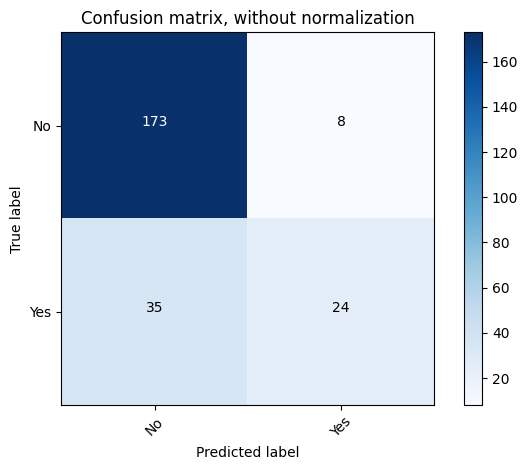

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.96      0.89       181
         Yes       0.75      0.41      0.53        59

    accuracy                           0.82       240
   macro avg       0.79      0.68      0.71       240
weighted avg       0.81      0.82      0.80       240



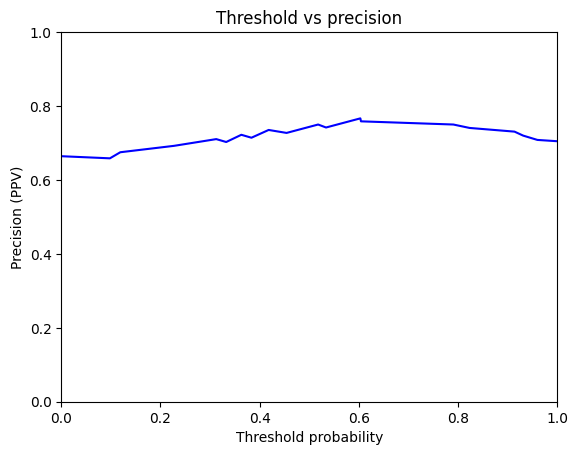

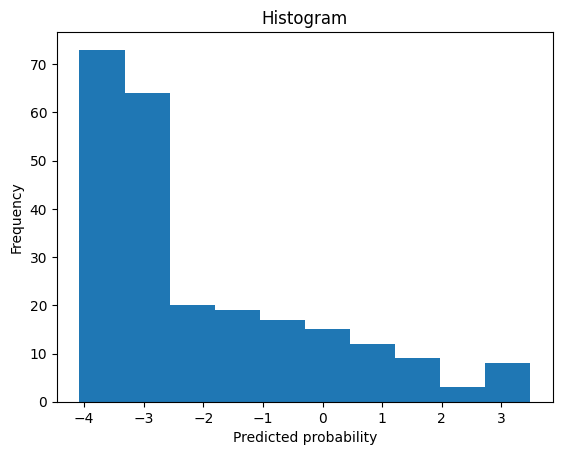

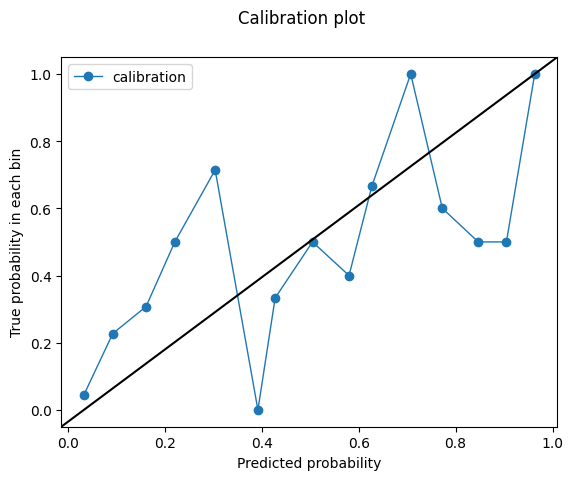

-1.2770283
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8370633954490121
Outcome probability: 0.24583333333333332
Average precision score: 0.61
Best F1: 0.6268656716417912


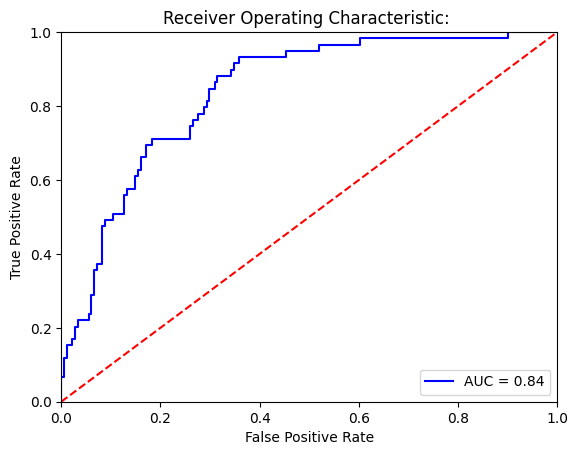

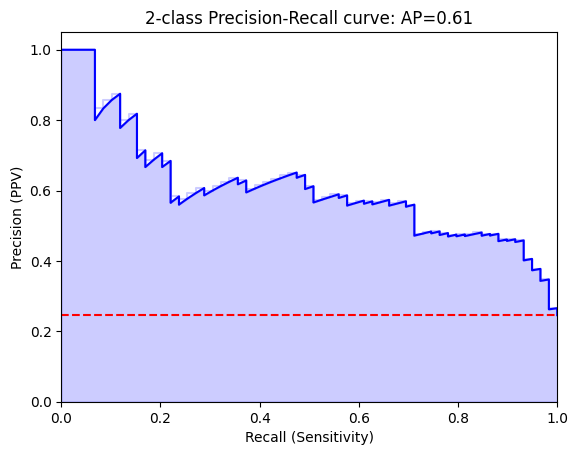

Threshold for best F1:
-1.9236305
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[148  33]
 [ 17  42]]


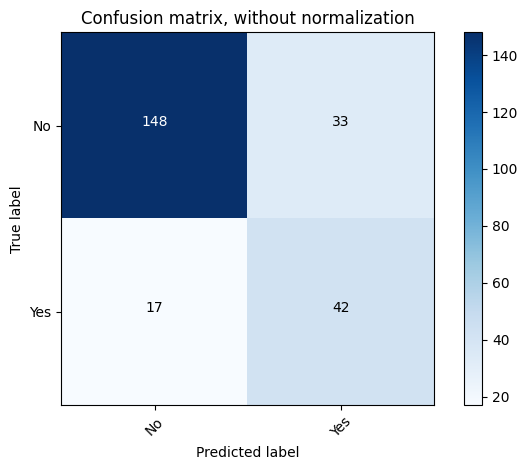

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.82      0.86       181
         Yes       0.56      0.71      0.63        59

    accuracy                           0.79       240
   macro avg       0.73      0.76      0.74       240
weighted avg       0.81      0.79      0.80       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[178   3]
 [ 50   9]]


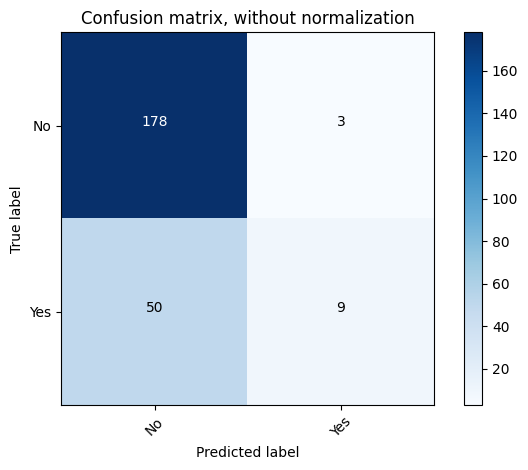

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      0.98      0.87       181
         Yes       0.75      0.15      0.25        59

    accuracy                           0.78       240
   macro avg       0.77      0.57      0.56       240
weighted avg       0.77      0.78      0.72       240



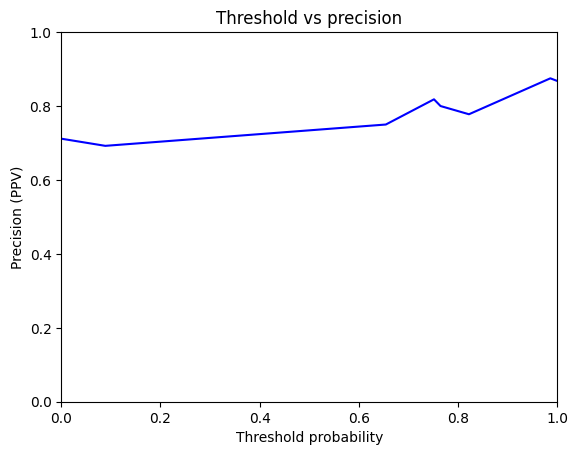

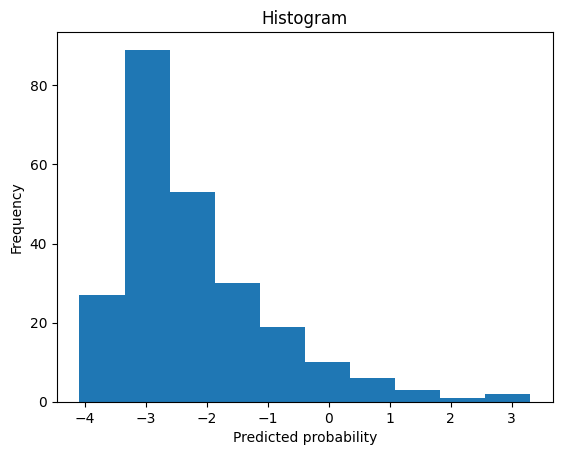

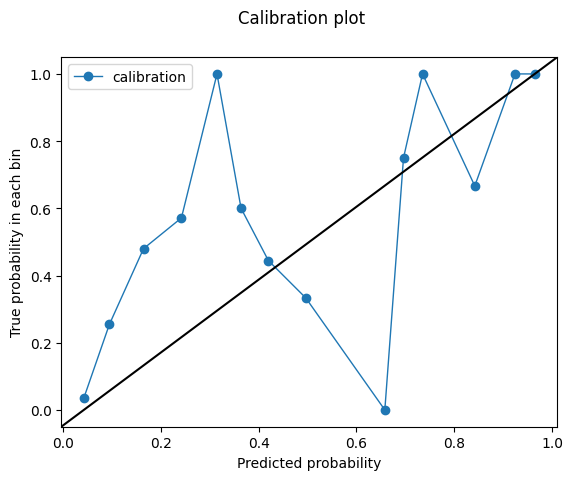

-1.9236305
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8242344788837906
Outcome probability: 0.24583333333333332
Average precision score: 0.63
Best F1: 0.6218487394957983


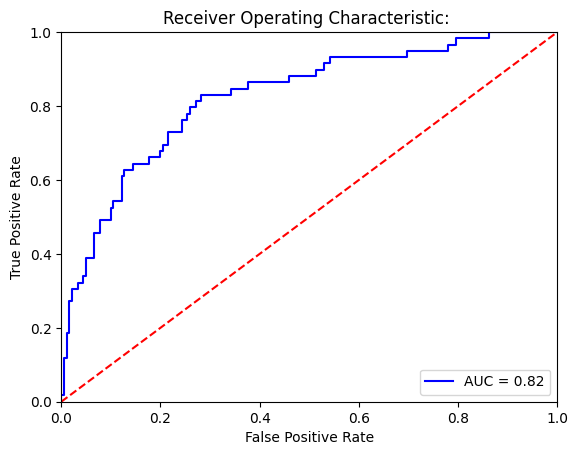

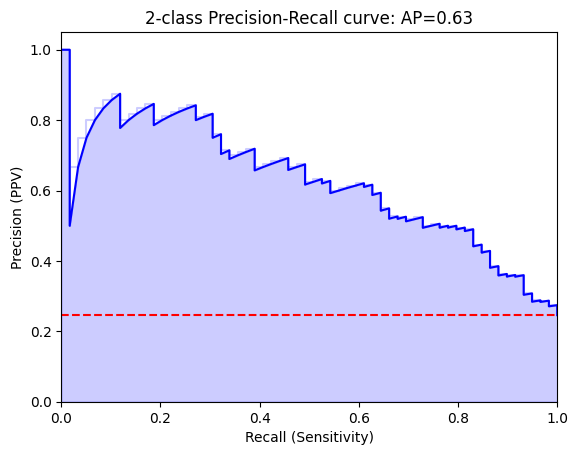

Threshold for best F1:
-2.9253228
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[158  23]
 [ 22  37]]


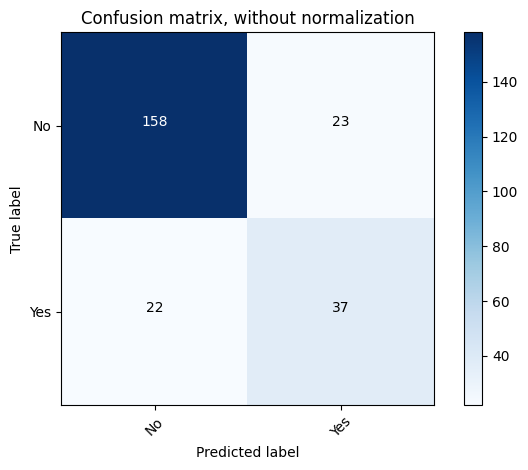

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.87      0.88       181
         Yes       0.62      0.63      0.62        59

    accuracy                           0.81       240
   macro avg       0.75      0.75      0.75       240
weighted avg       0.81      0.81      0.81       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[167  14]
 [ 31  28]]


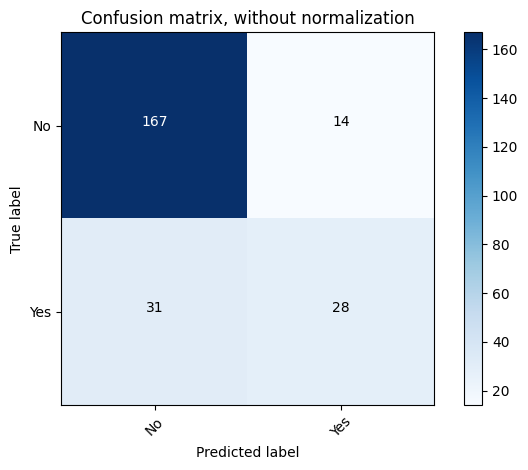

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.92      0.88       181
         Yes       0.67      0.47      0.55        59

    accuracy                           0.81       240
   macro avg       0.76      0.70      0.72       240
weighted avg       0.80      0.81      0.80       240



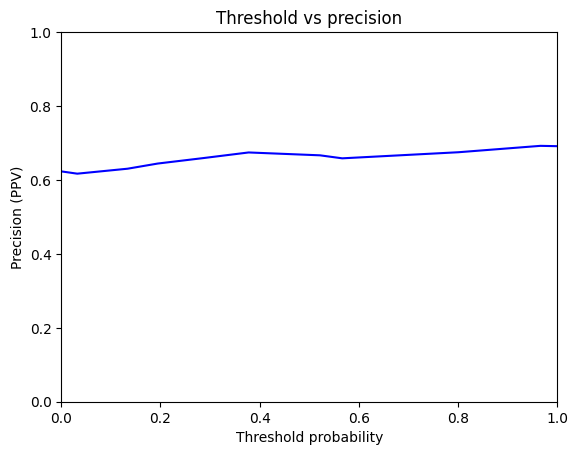

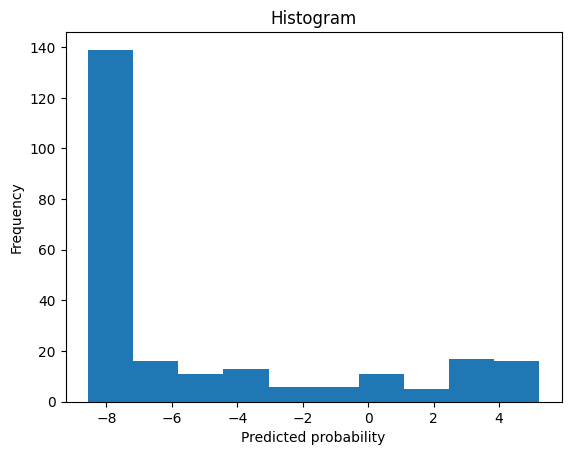

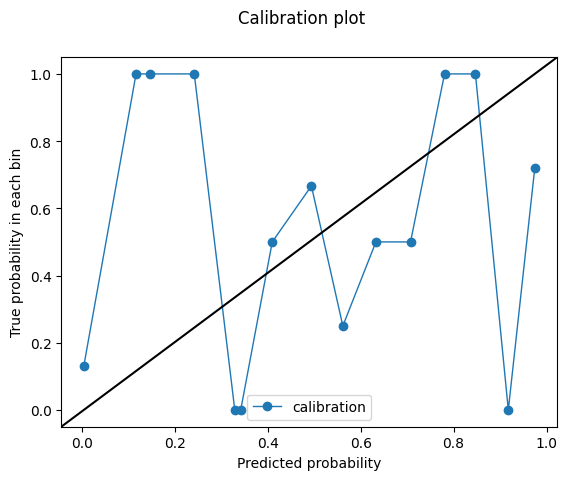

-2.9253228
test set
cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Ovarian
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8480194774791646
Outcome probability: 0.24583333333333332
Average precision score: 0.65
Best F1: 0.6666666666666667


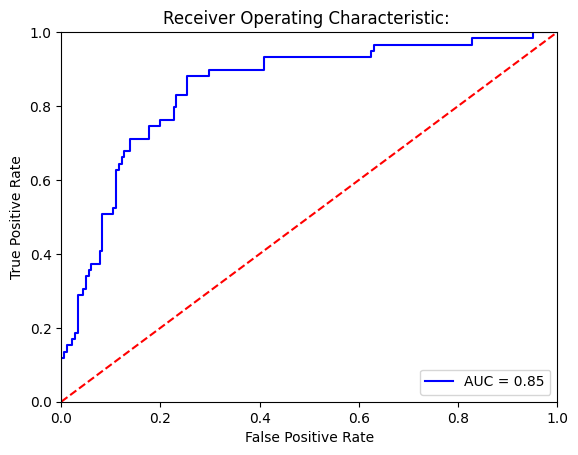

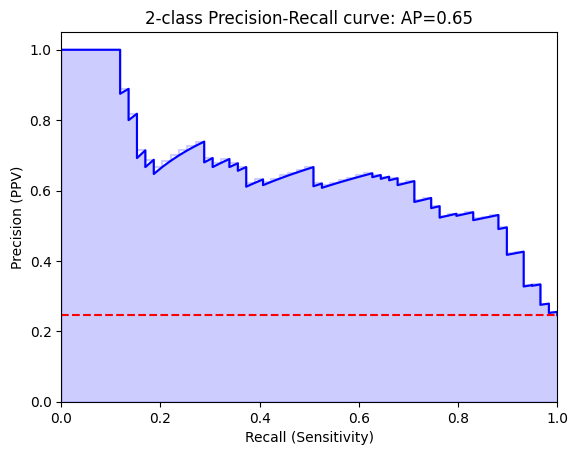

Threshold for best F1:
-1.4764229
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[156  25]
 [ 17  42]]


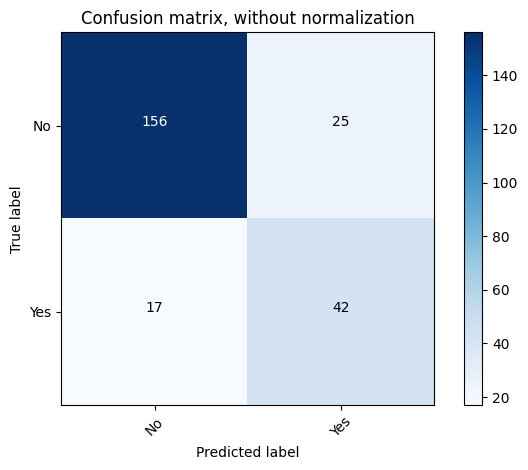

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.86      0.88       181
         Yes       0.63      0.71      0.67        59

    accuracy                           0.82       240
   macro avg       0.76      0.79      0.77       240
weighted avg       0.83      0.82      0.83       240

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[173   8]
 [ 41  18]]


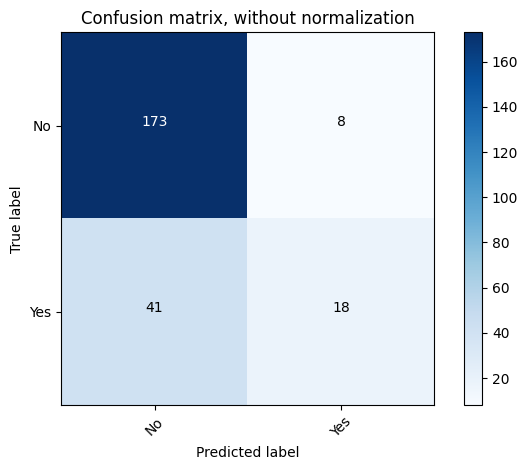

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.96      0.88       181
         Yes       0.69      0.31      0.42        59

    accuracy                           0.80       240
   macro avg       0.75      0.63      0.65       240
weighted avg       0.78      0.80      0.76       240



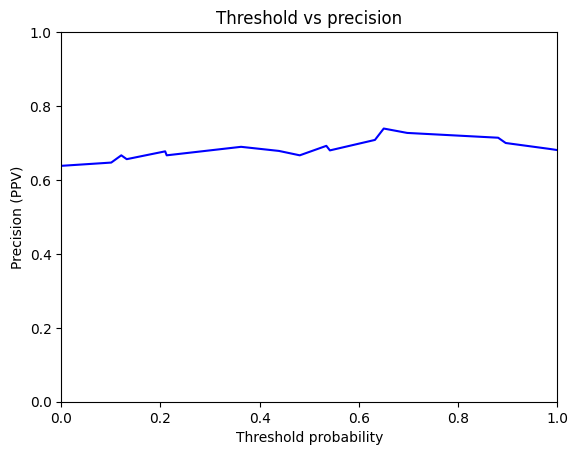

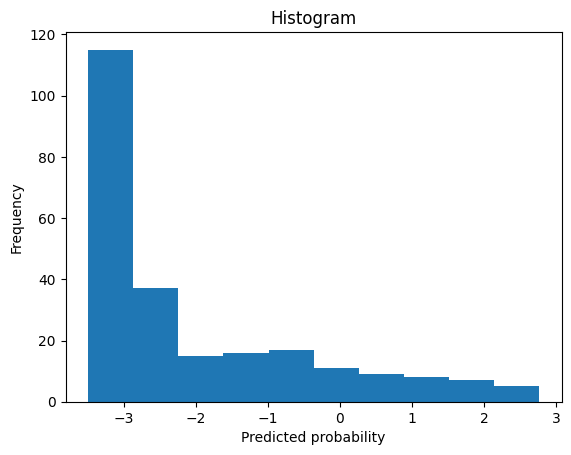

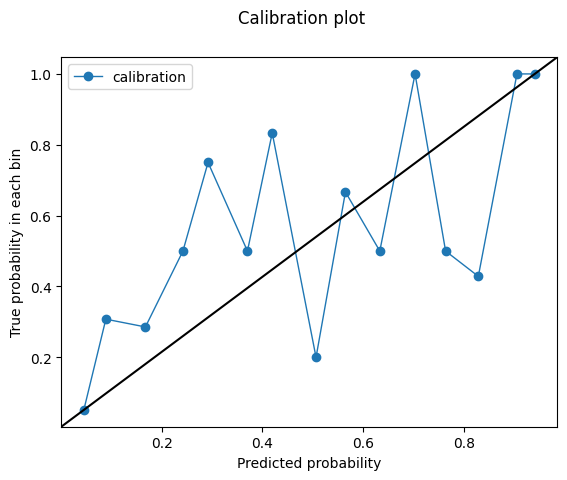

-1.4764229
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8372634027704347
Outcome probability: 0.2024793388429752
Average precision score: 0.64
Best F1: 0.5869565217391305


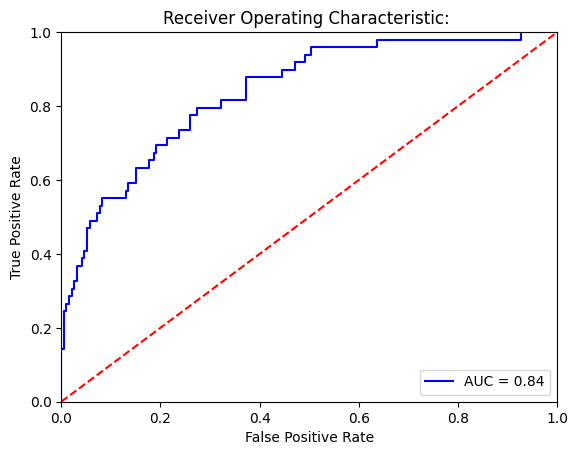

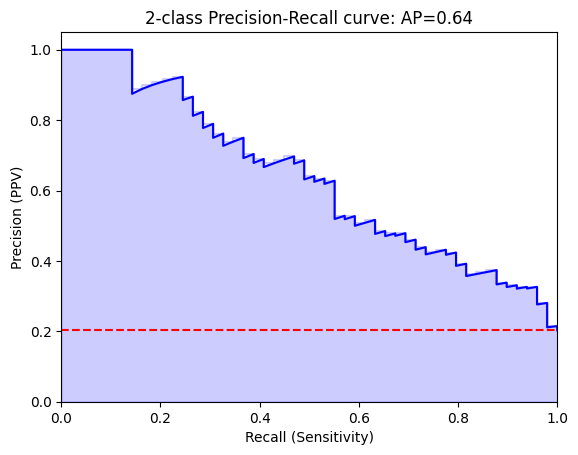

Threshold for best F1:
0.13645744
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[177  16]
 [ 22  27]]


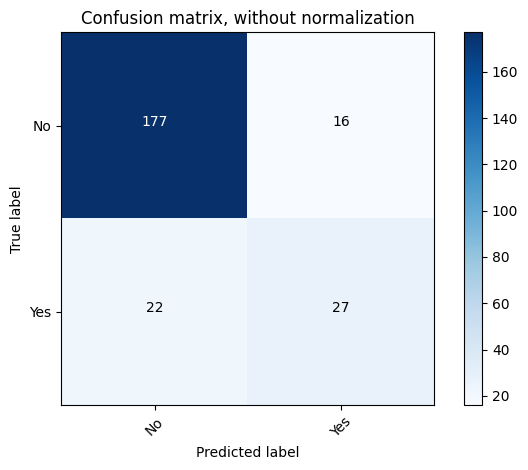

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.92      0.90       193
         Yes       0.63      0.55      0.59        49

    accuracy                           0.84       242
   macro avg       0.76      0.73      0.75       242
weighted avg       0.84      0.84      0.84       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[183  10]
 [ 26  23]]


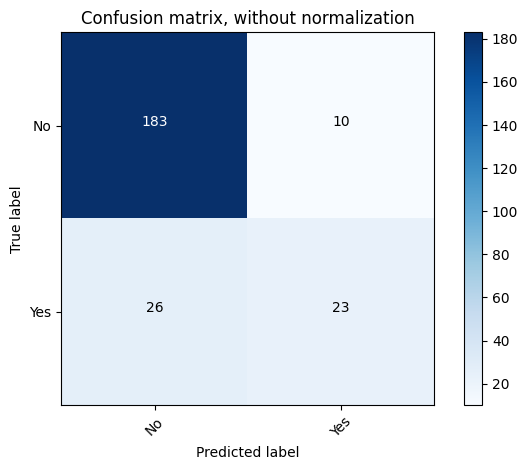

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.95      0.91       193
         Yes       0.70      0.47      0.56        49

    accuracy                           0.85       242
   macro avg       0.79      0.71      0.74       242
weighted avg       0.84      0.85      0.84       242



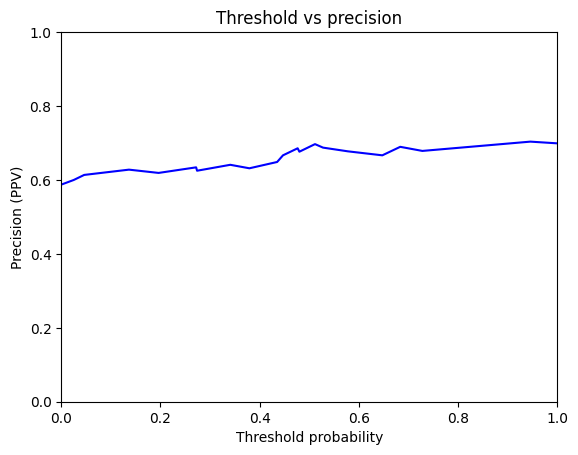

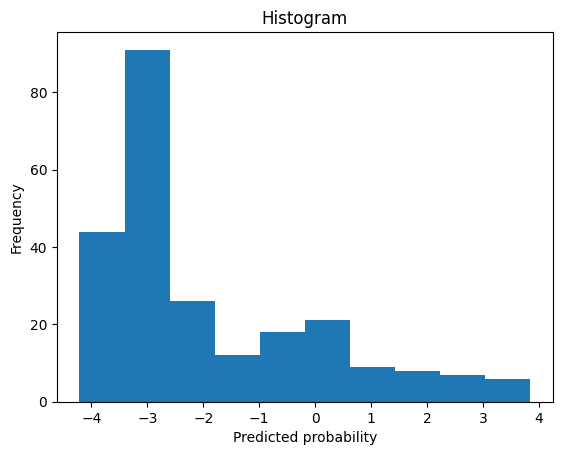

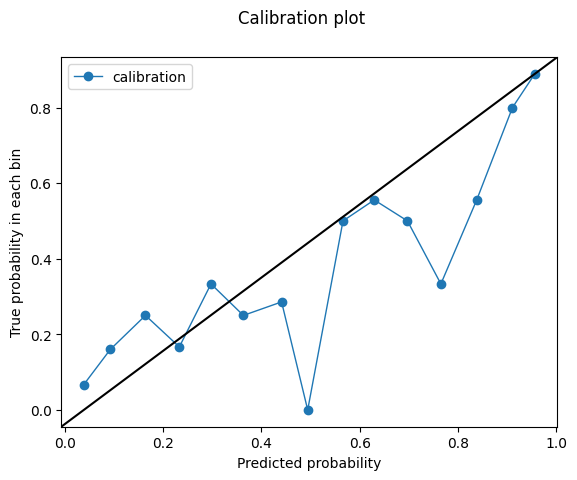

0.13645744
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8481548059638363
Outcome probability: 0.2024793388429752
Average precision score: 0.62
Best F1: 0.5904761904761905


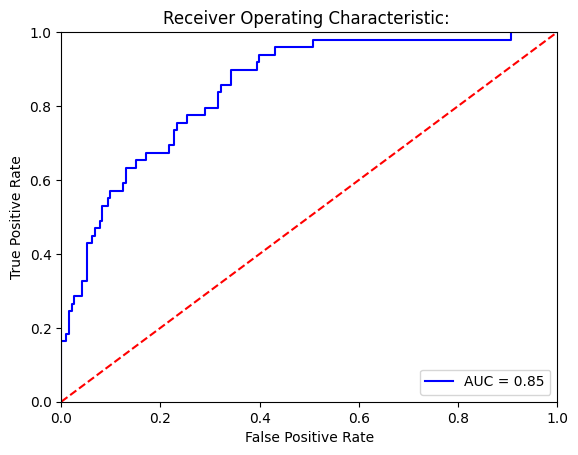

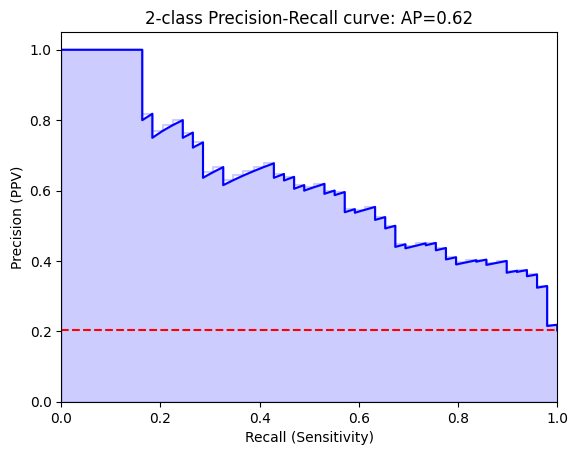

Threshold for best F1:
-0.86179763
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[168  25]
 [ 18  31]]


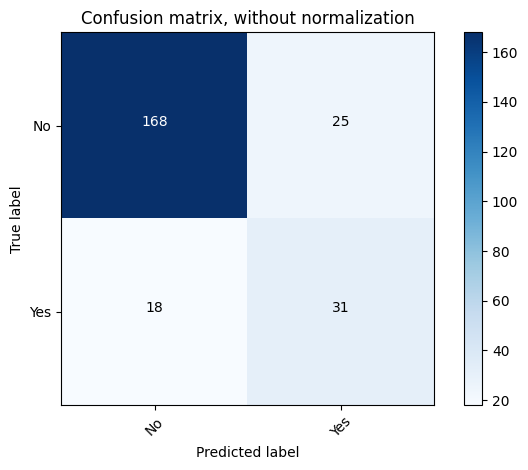

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.87      0.89       193
         Yes       0.55      0.63      0.59        49

    accuracy                           0.82       242
   macro avg       0.73      0.75      0.74       242
weighted avg       0.83      0.82      0.83       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[187   6]
 [ 35  14]]


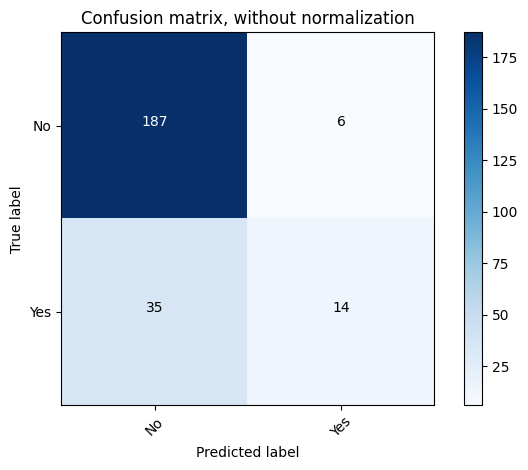

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.97      0.90       193
         Yes       0.70      0.29      0.41        49

    accuracy                           0.83       242
   macro avg       0.77      0.63      0.65       242
weighted avg       0.81      0.83      0.80       242



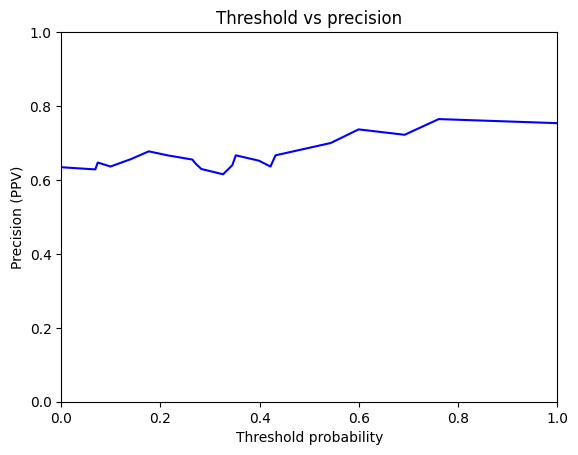

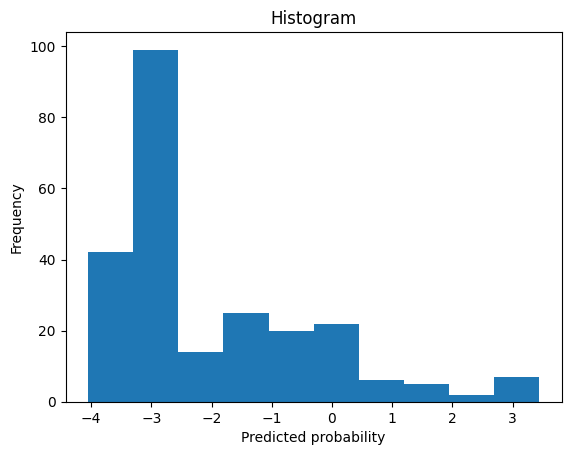

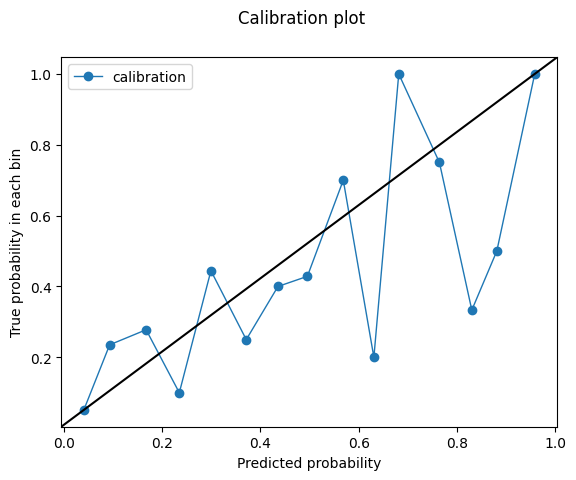

-0.86179763
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.7787881992175107
Outcome probability: 0.2024793388429752
Average precision score: 0.46
Best F1: 0.512396694214876


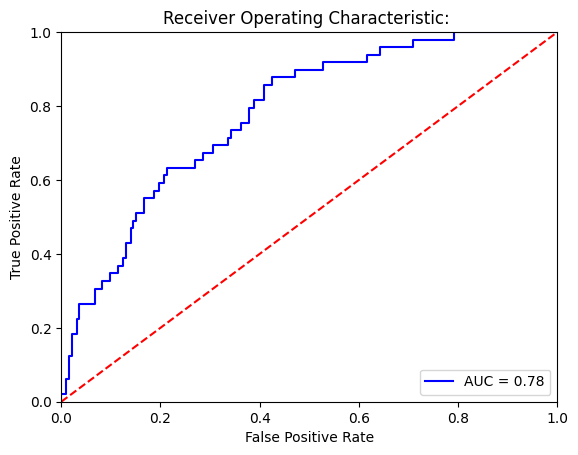

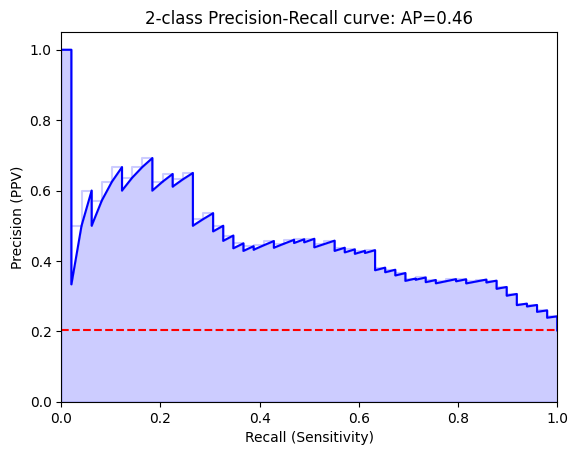

Threshold for best F1:
-1.6959487
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[152  41]
 [ 18  31]]


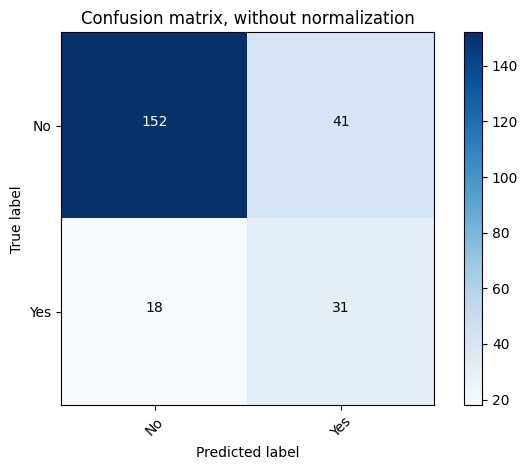

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.79      0.84       193
         Yes       0.43      0.63      0.51        49

    accuracy                           0.76       242
   macro avg       0.66      0.71      0.67       242
weighted avg       0.80      0.76      0.77       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[190   3]
 [ 43   6]]


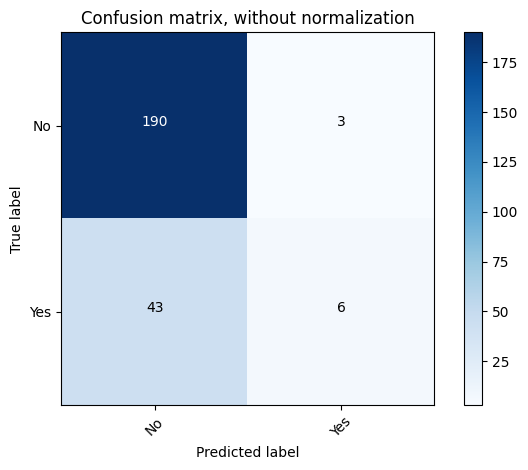

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.98      0.89       193
         Yes       0.67      0.12      0.21        49

    accuracy                           0.81       242
   macro avg       0.74      0.55      0.55       242
weighted avg       0.79      0.81      0.75       242



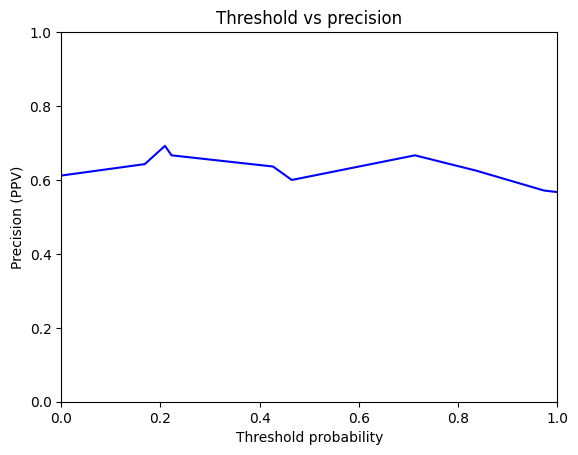

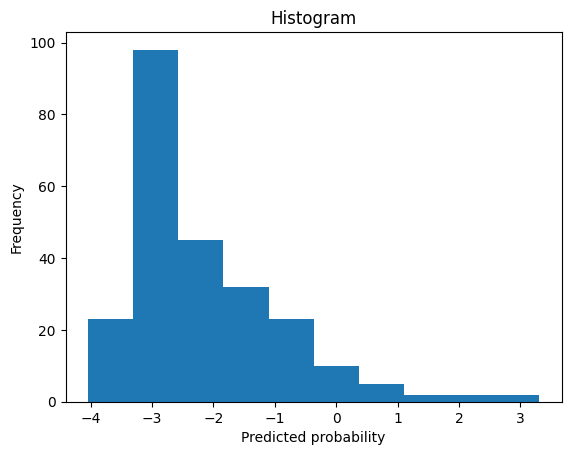

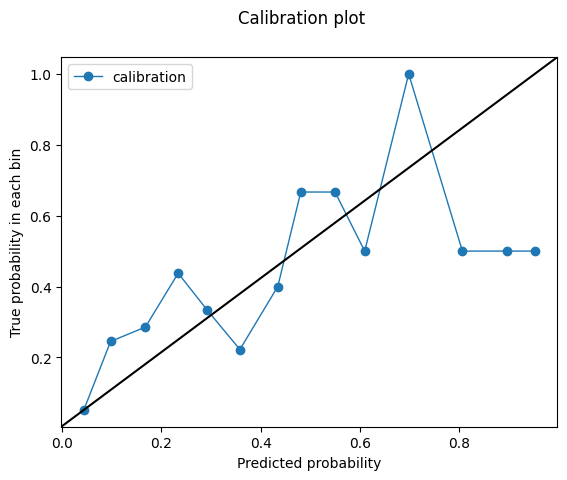

-1.6959487
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.7684255049169927
Outcome probability: 0.2024793388429752
Average precision score: 0.44
Best F1: 0.5034965034965034


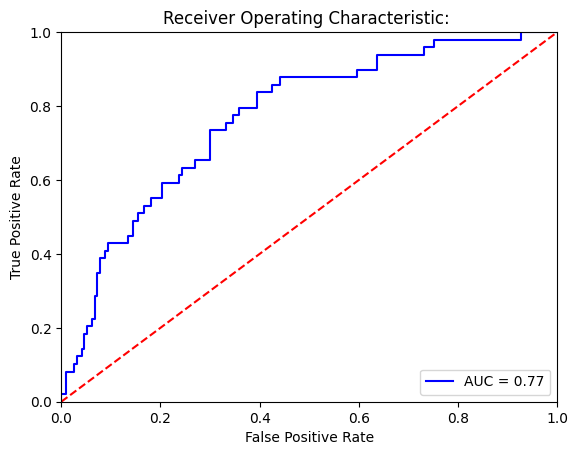

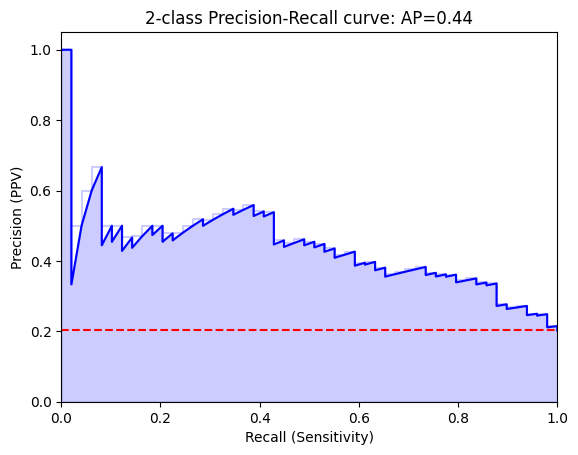

Threshold for best F1:
-4.426926
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[135  58]
 [ 13  36]]


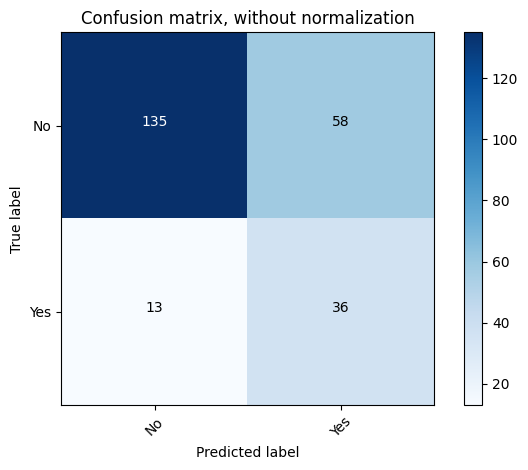

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.70      0.79       193
         Yes       0.38      0.73      0.50        49

    accuracy                           0.71       242
   macro avg       0.65      0.72      0.65       242
weighted avg       0.81      0.71      0.73       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[161  32]
 [ 23  26]]


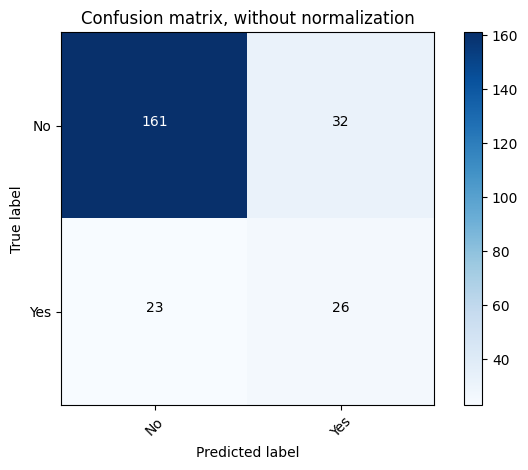

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.83      0.85       193
         Yes       0.45      0.53      0.49        49

    accuracy                           0.77       242
   macro avg       0.66      0.68      0.67       242
weighted avg       0.79      0.77      0.78       242



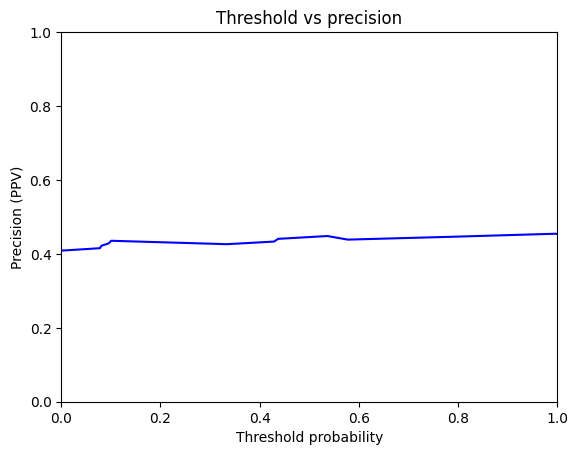

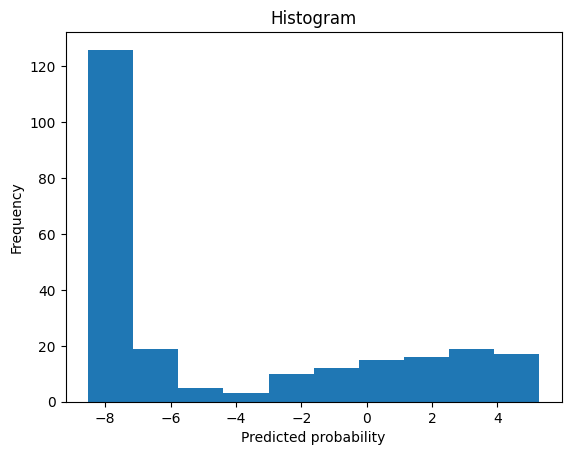

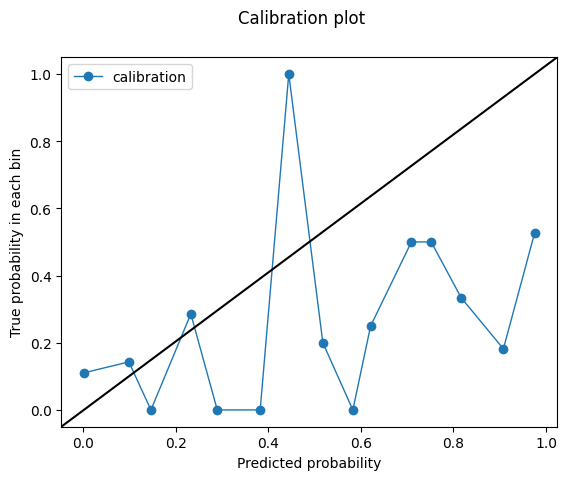

-4.426926
test set
cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Lung Non-Small
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8056466109759967
Outcome probability: 0.2024793388429752
Average precision score: 0.58
Best F1: 0.5656565656565656


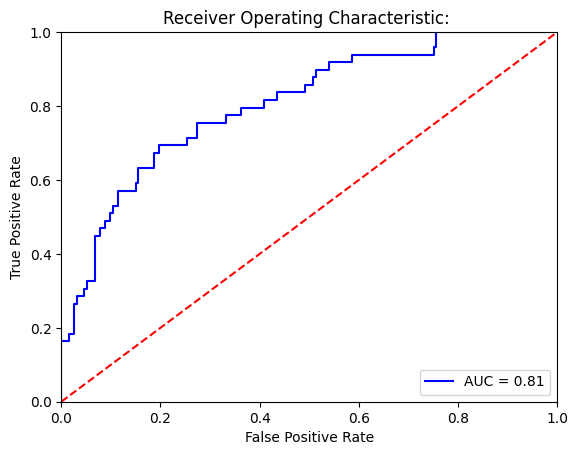

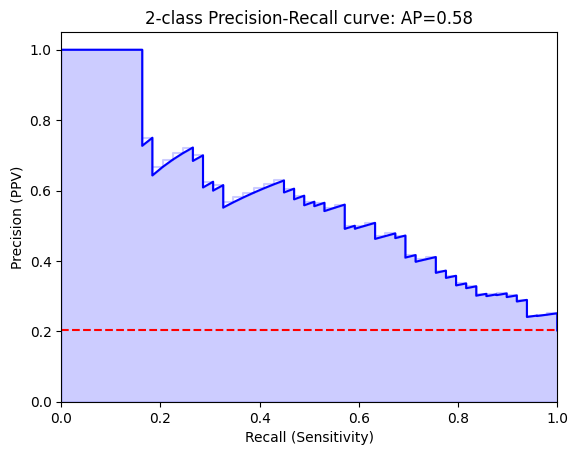

Threshold for best F1:
-0.88352937
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[171  22]
 [ 21  28]]


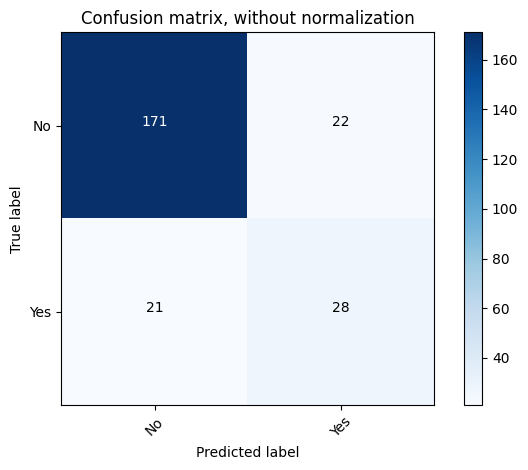

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.89      0.89       193
         Yes       0.56      0.57      0.57        49

    accuracy                           0.82       242
   macro avg       0.73      0.73      0.73       242
weighted avg       0.82      0.82      0.82       242

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[188   5]
 [ 37  12]]


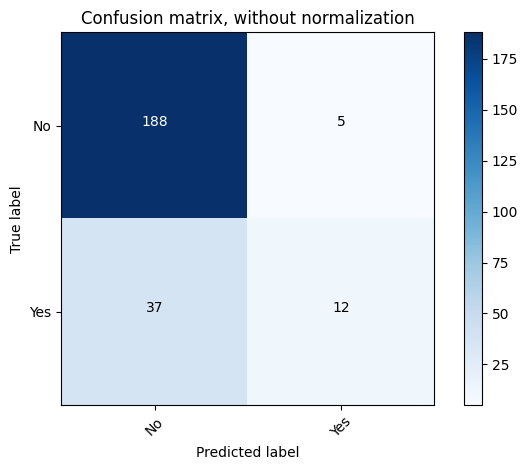

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.97      0.90       193
         Yes       0.71      0.24      0.36        49

    accuracy                           0.83       242
   macro avg       0.77      0.61      0.63       242
weighted avg       0.81      0.83      0.79       242



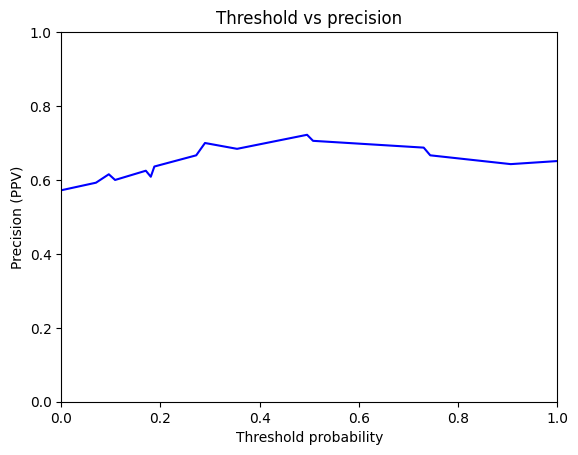

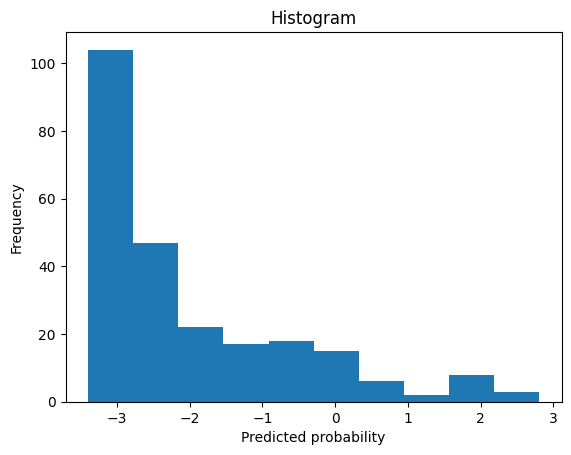

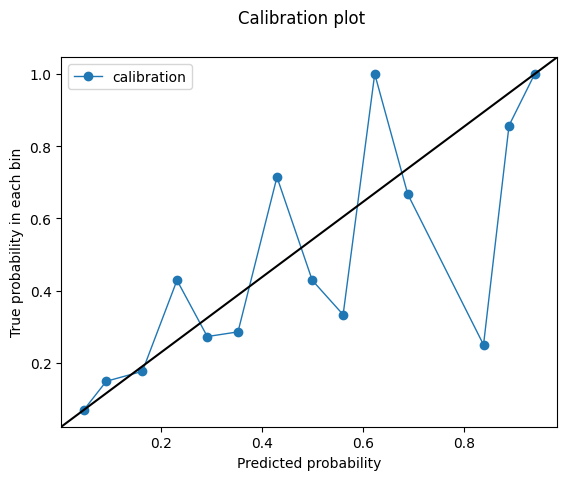

-0.88352937
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9940898345153664
Outcome probability: 0.04081632653061224
Average precision score: 0.86
Best F1: 0.8571428571428571


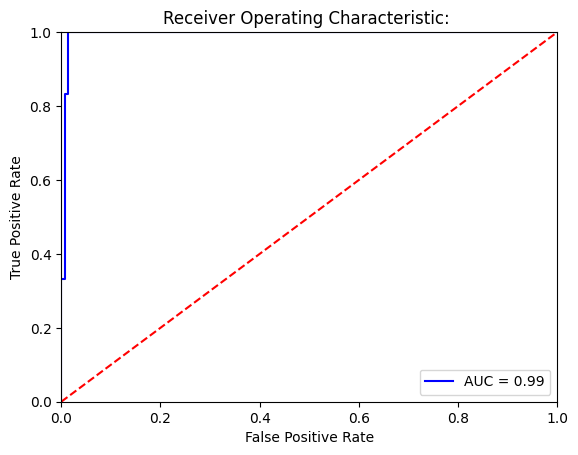

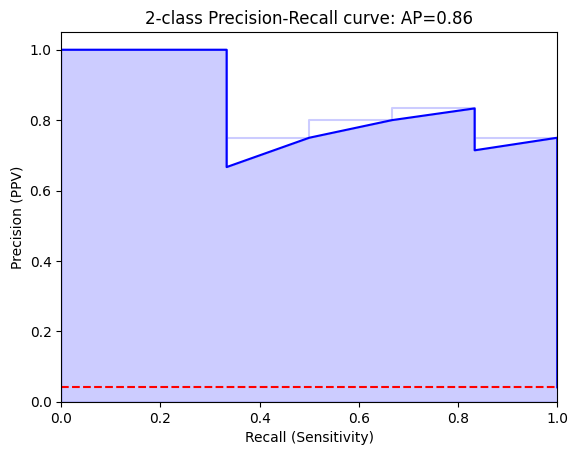

Threshold for best F1:
0.44625732
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[139   2]
 [  0   6]]


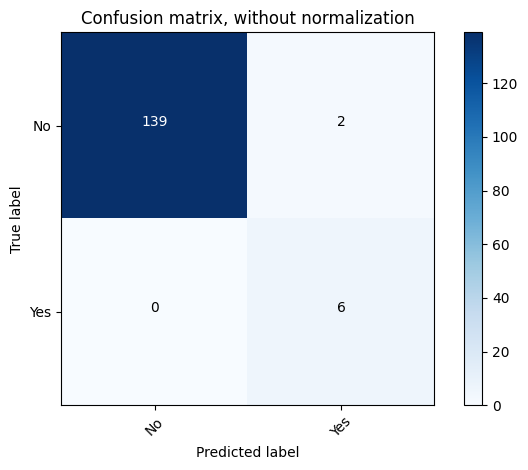

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       1.00      0.99      0.99       141
         Yes       0.75      1.00      0.86         6

    accuracy                           0.99       147
   macro avg       0.88      0.99      0.93       147
weighted avg       0.99      0.99      0.99       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[139   2]
 [  1   5]]


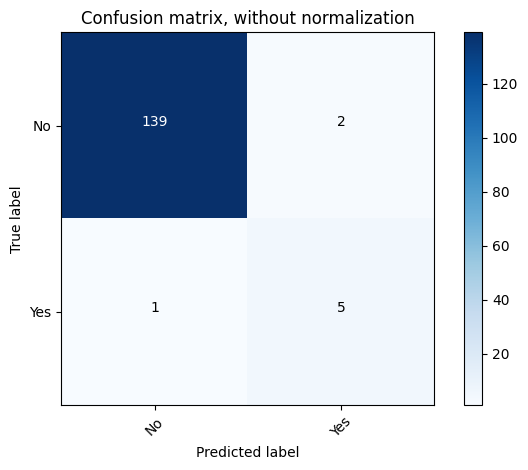

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.99      0.99       141
         Yes       0.71      0.83      0.77         6

    accuracy                           0.98       147
   macro avg       0.85      0.91      0.88       147
weighted avg       0.98      0.98      0.98       147



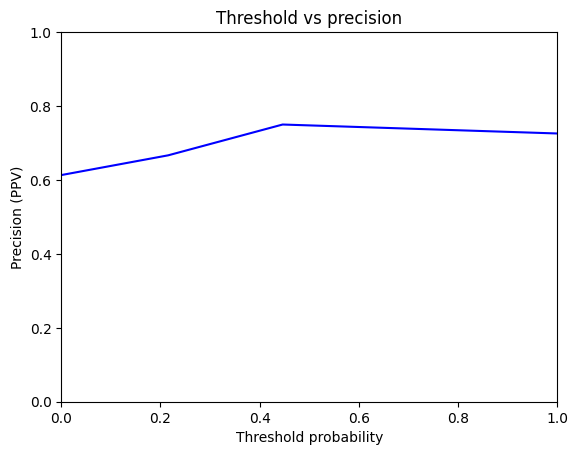

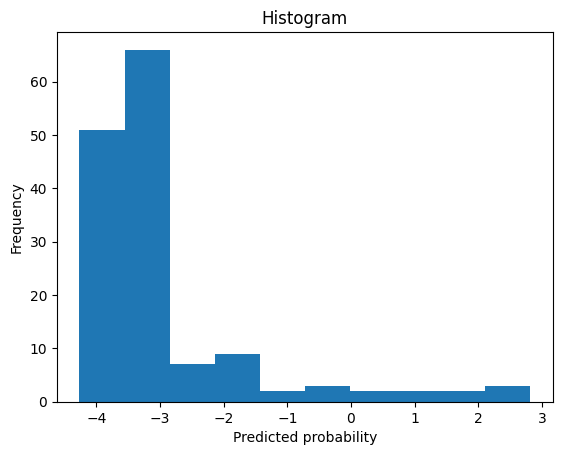

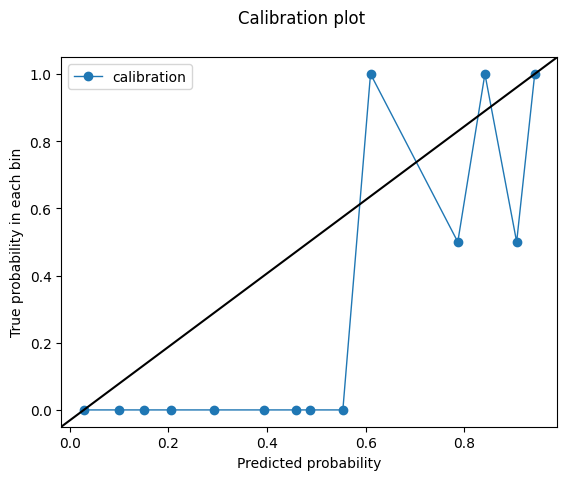

0.44625732
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9917257683215129
Outcome probability: 0.04081632653061224
Average precision score: 0.79
Best F1: 0.8333333333333334


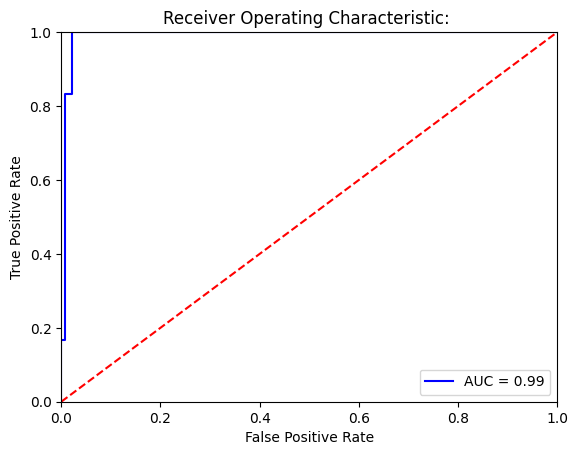

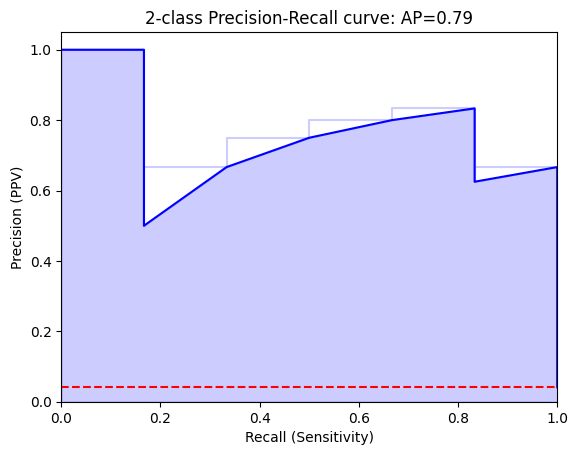

Threshold for best F1:
0.5531701
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[140   1]
 [  1   5]]


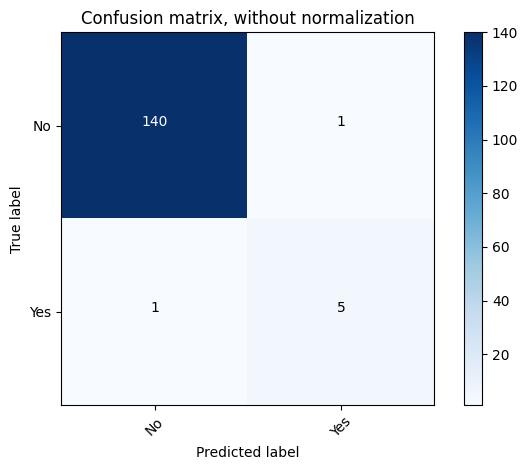

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.99      0.99       141
         Yes       0.83      0.83      0.83         6

    accuracy                           0.99       147
   macro avg       0.91      0.91      0.91       147
weighted avg       0.99      0.99      0.99       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[140   1]
 [  1   5]]


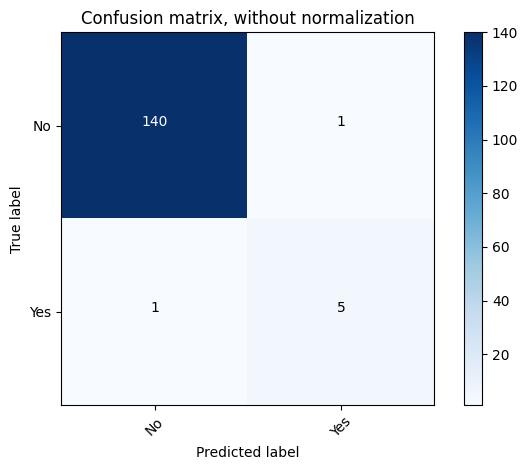

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.99      0.99       141
         Yes       0.83      0.83      0.83         6

    accuracy                           0.99       147
   macro avg       0.91      0.91      0.91       147
weighted avg       0.99      0.99      0.99       147



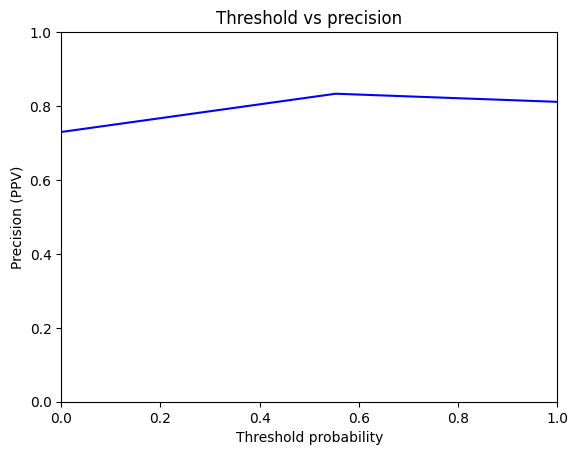

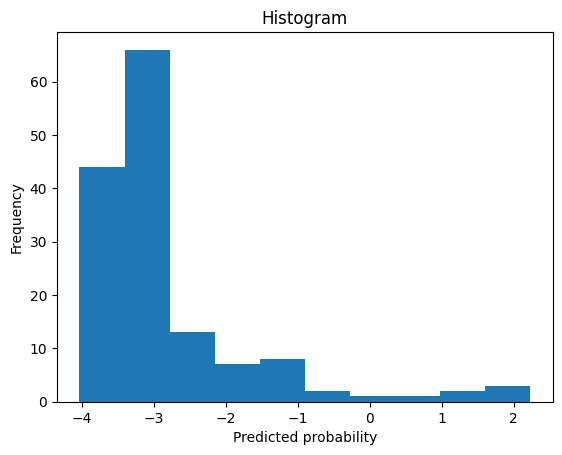

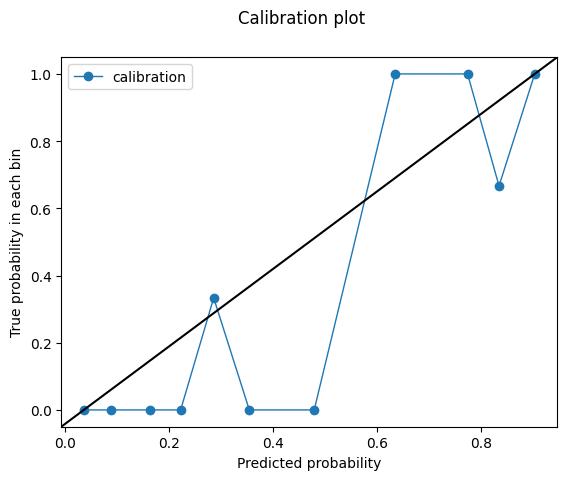

0.5531701
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.9562647754137116
Outcome probability: 0.04081632653061224
Average precision score: 0.50
Best F1: 0.6153846153846153


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


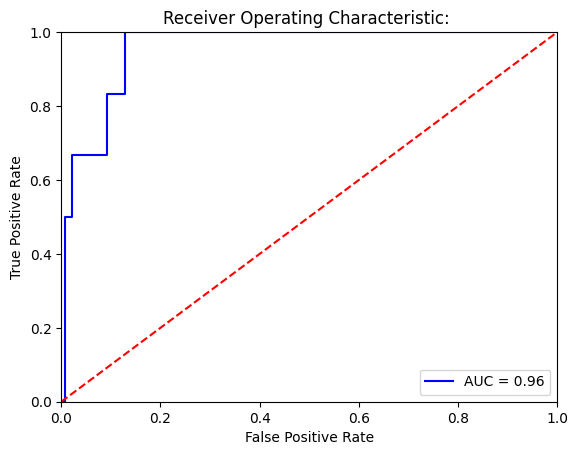

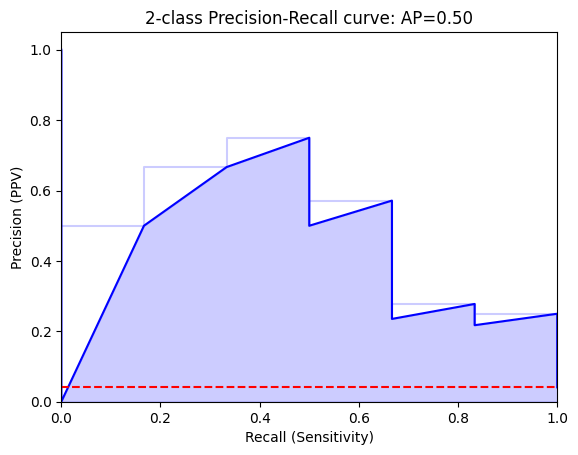

Threshold for best F1:
2.2883053
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[140   1]
 [  6   0]]


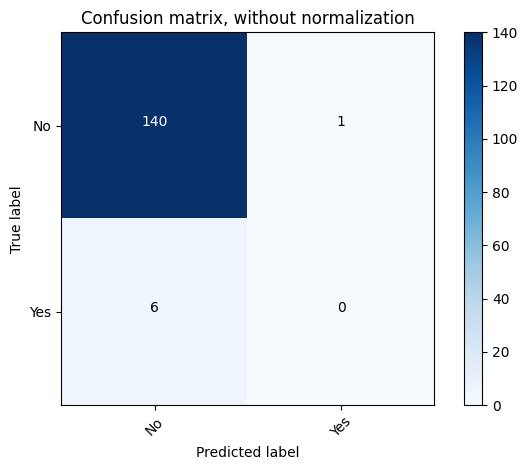

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.99      0.98       141
         Yes       0.00      0.00      0.00         6

    accuracy                           0.95       147
   macro avg       0.48      0.50      0.49       147
weighted avg       0.92      0.95      0.94       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[140   1]
 [  6   0]]


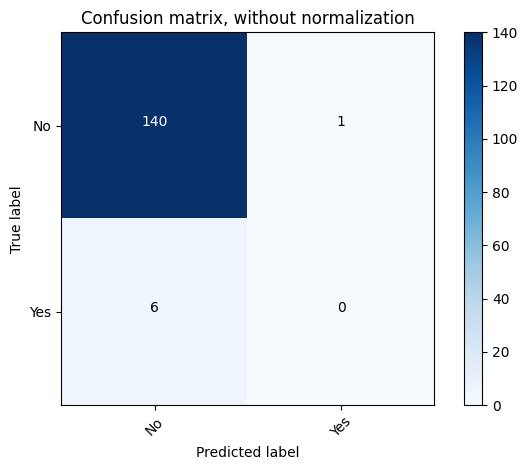

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.99      0.98       141
         Yes       0.00      0.00      0.00         6

    accuracy                           0.95       147
   macro avg       0.48      0.50      0.49       147
weighted avg       0.92      0.95      0.94       147



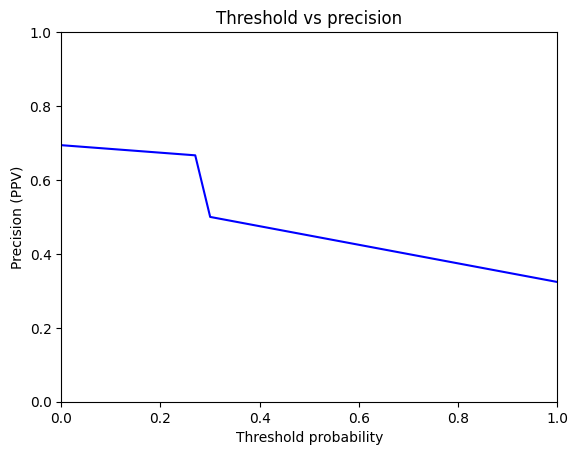

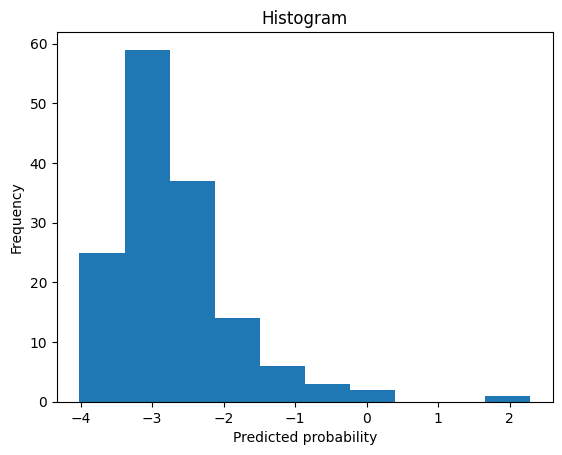

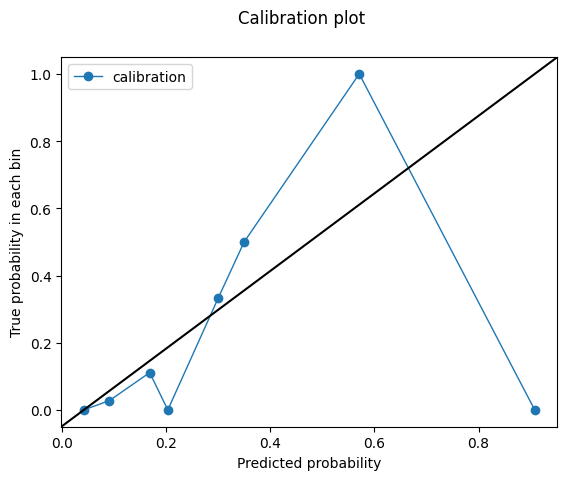

2.2883053
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.9680851063829787
Outcome probability: 0.04081632653061224
Average precision score: 0.52
Best F1: 0.6


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


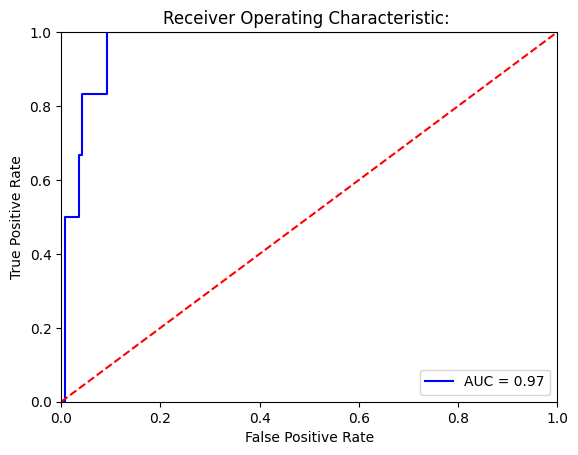

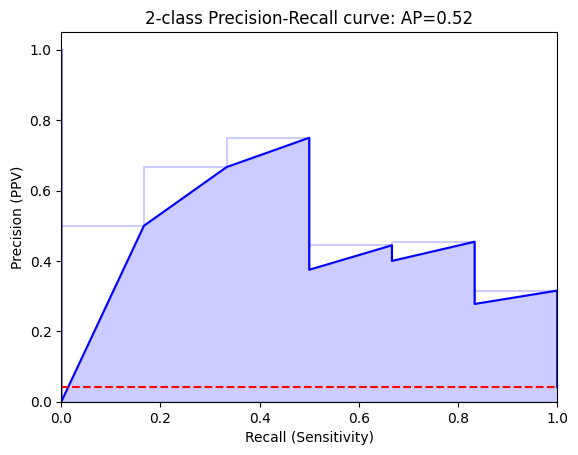

Threshold for best F1:
3.87278
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[140   1]
 [  6   0]]


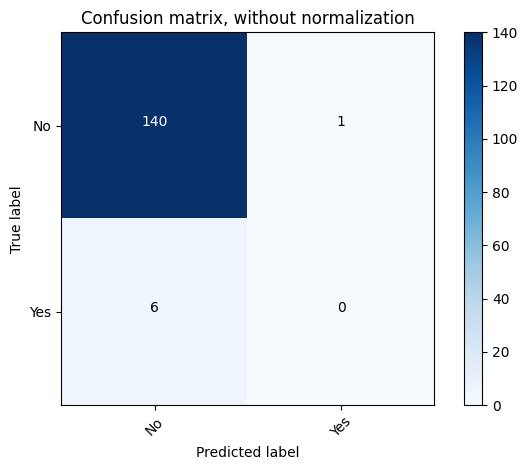

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.99      0.98       141
         Yes       0.00      0.00      0.00         6

    accuracy                           0.95       147
   macro avg       0.48      0.50      0.49       147
weighted avg       0.92      0.95      0.94       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[136   5]
 [  3   3]]


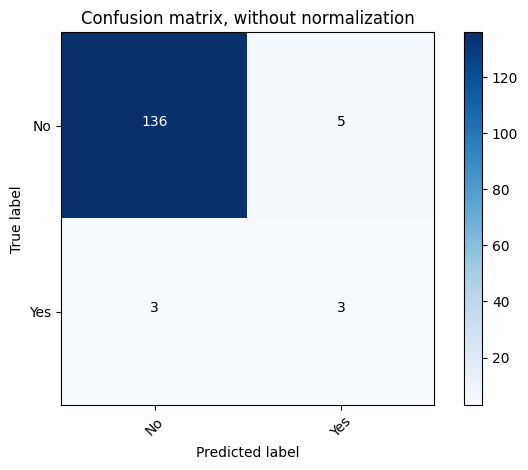

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.98      0.96      0.97       141
         Yes       0.38      0.50      0.43         6

    accuracy                           0.95       147
   macro avg       0.68      0.73      0.70       147
weighted avg       0.95      0.95      0.95       147



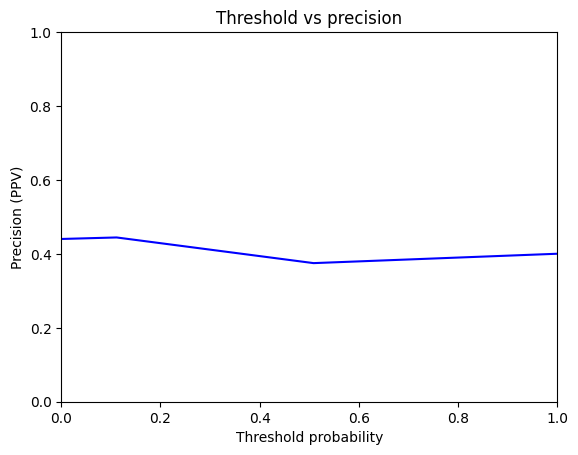

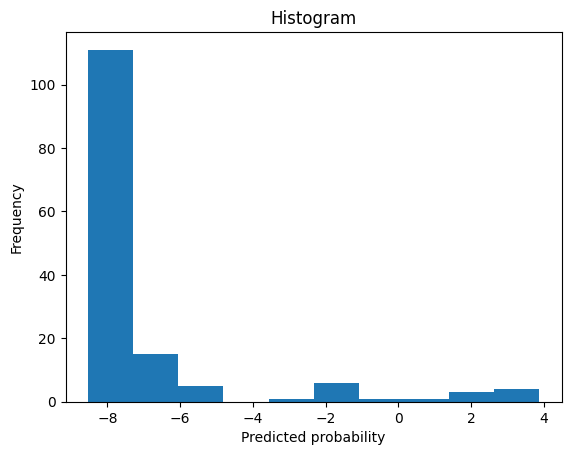

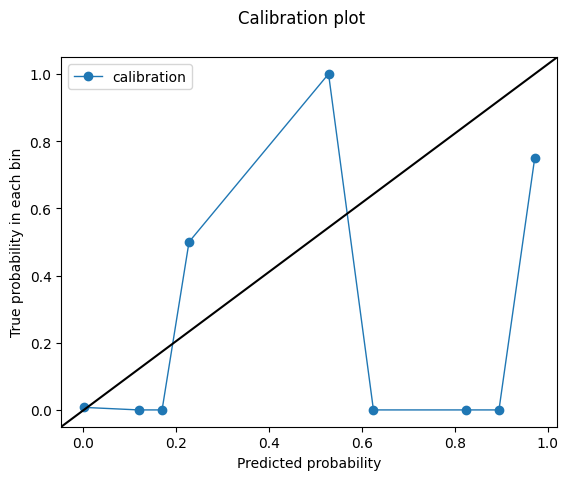

3.87278
test set
cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Chronic Lymphocytic Leukemia (CLL)
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.988179669030733
Outcome probability: 0.04081632653061224
Average precision score: 0.76
Best F1: 0.8333333333333334


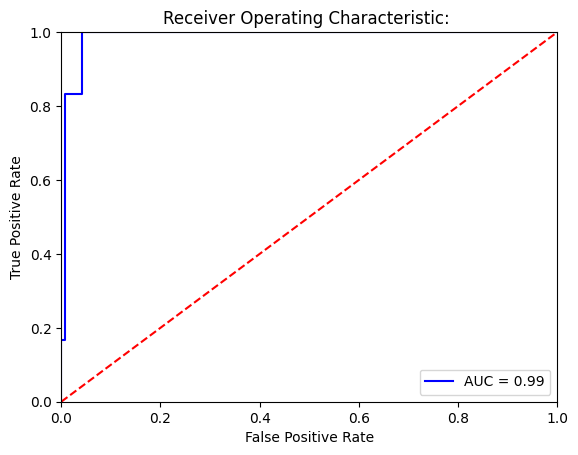

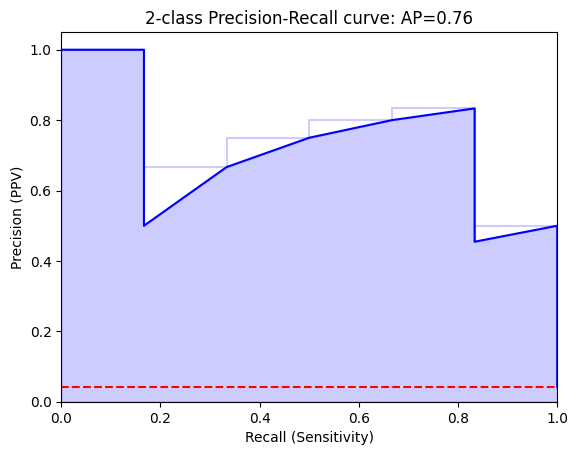

Threshold for best F1:
-0.1176288
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[140   1]
 [  1   5]]


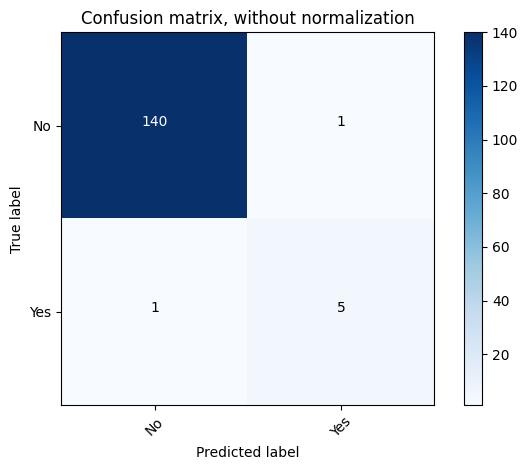

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.99      0.99      0.99       141
         Yes       0.83      0.83      0.83         6

    accuracy                           0.99       147
   macro avg       0.91      0.91      0.91       147
weighted avg       0.99      0.99      0.99       147

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[140   1]
 [  4   2]]


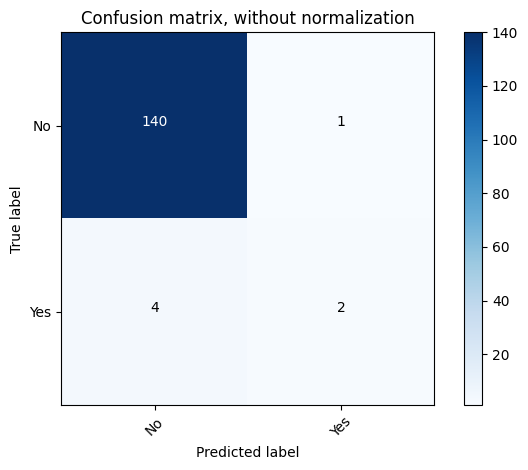

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.97      0.99      0.98       141
         Yes       0.67      0.33      0.44         6

    accuracy                           0.97       147
   macro avg       0.82      0.66      0.71       147
weighted avg       0.96      0.97      0.96       147



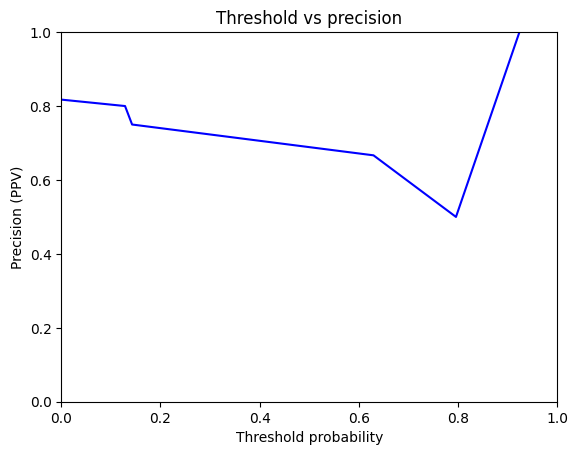

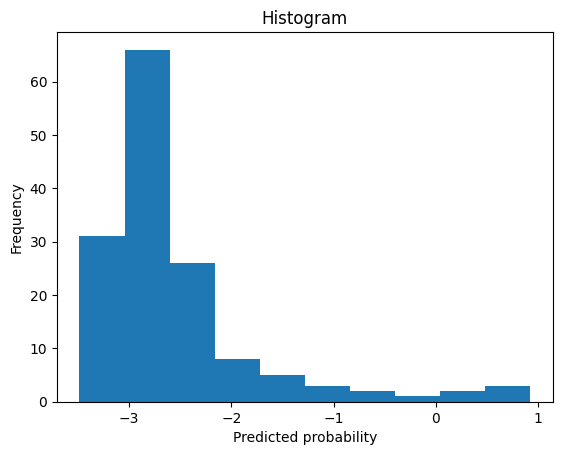

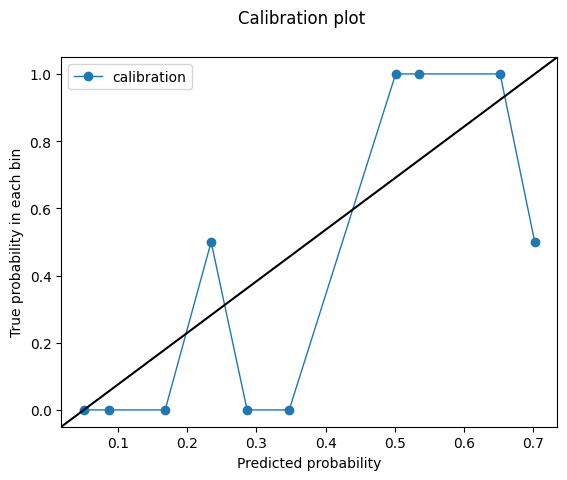

-0.1176288
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9072727272727272
Outcome probability: 0.2268041237113402
Average precision score: 0.77
Best F1: 0.7391304347826088


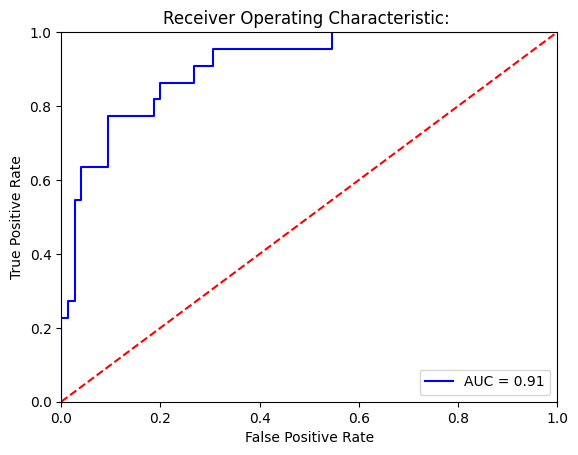

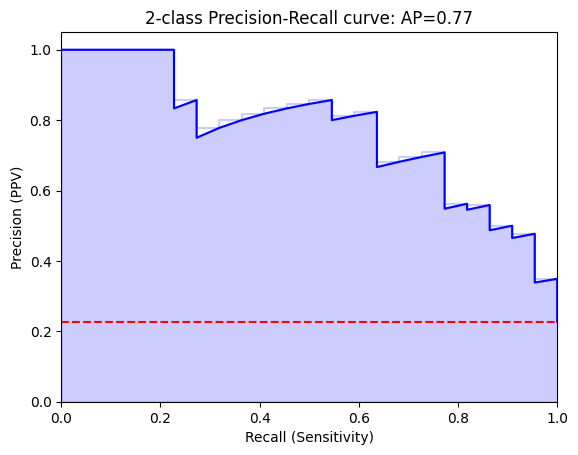

Threshold for best F1:
0.20972049
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[68  7]
 [ 5 17]]


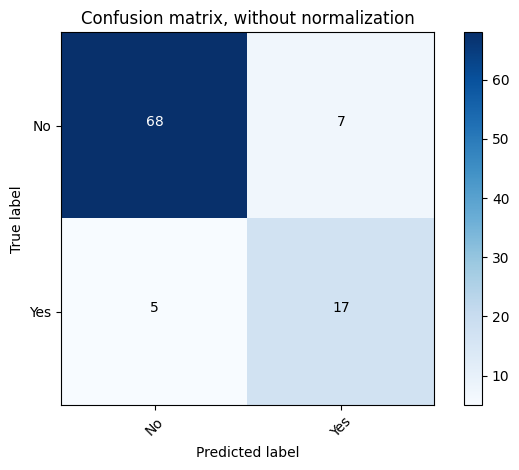

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.91      0.92        75
         Yes       0.71      0.77      0.74        22

    accuracy                           0.88        97
   macro avg       0.82      0.84      0.83        97
weighted avg       0.88      0.88      0.88        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[71  4]
 [ 8 14]]


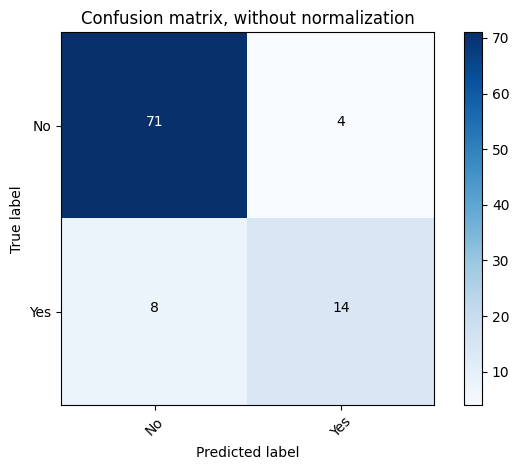

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.95      0.92        75
         Yes       0.78      0.64      0.70        22

    accuracy                           0.88        97
   macro avg       0.84      0.79      0.81        97
weighted avg       0.87      0.88      0.87        97



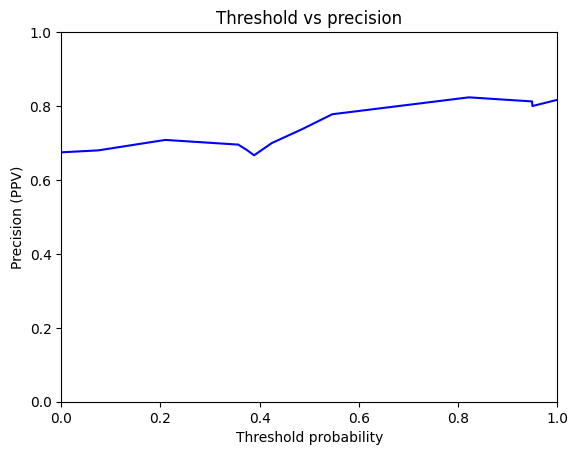

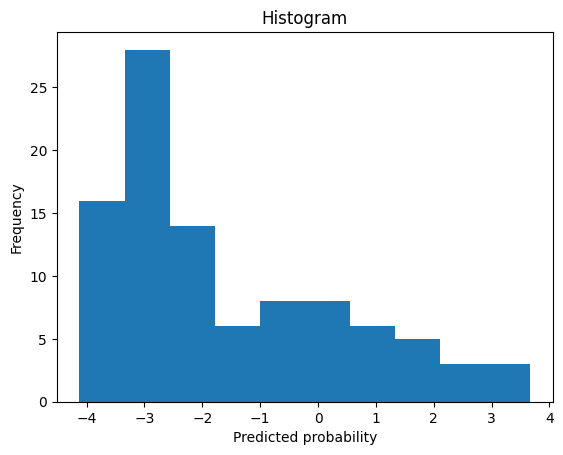

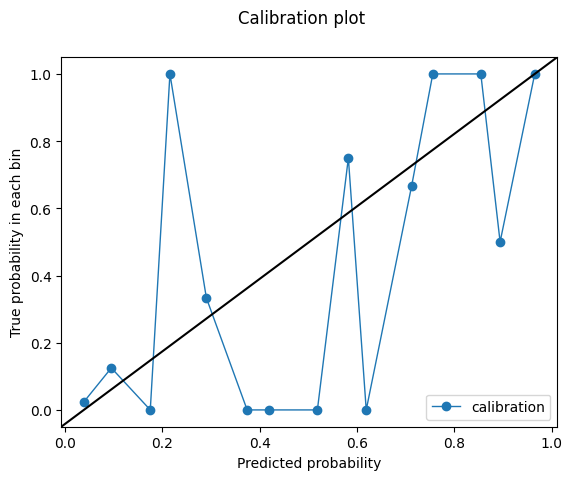

0.20972049
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8478787878787879
Outcome probability: 0.2268041237113402
Average precision score: 0.70
Best F1: 0.6486486486486486


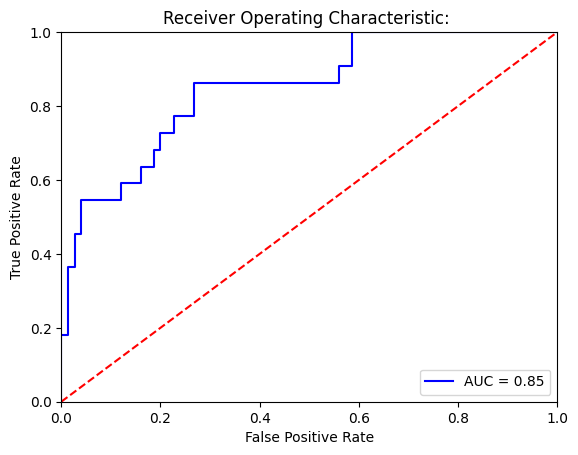

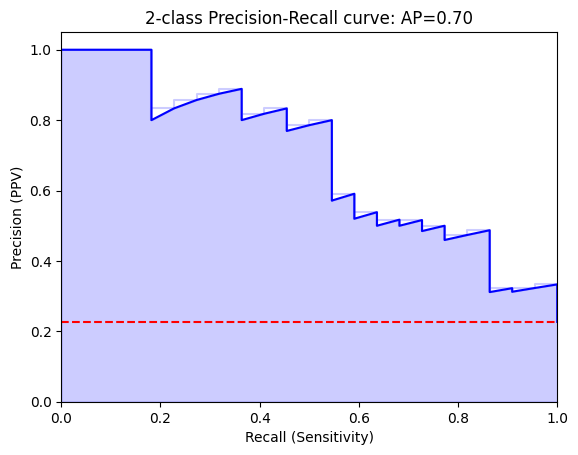

Threshold for best F1:
0.20358922
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  3]
 [10 12]]


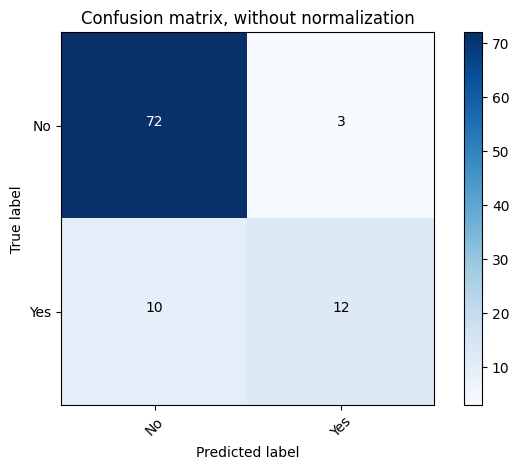

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.96      0.92        75
         Yes       0.80      0.55      0.65        22

    accuracy                           0.87        97
   macro avg       0.84      0.75      0.78        97
weighted avg       0.86      0.87      0.86        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[73  2]
 [13  9]]


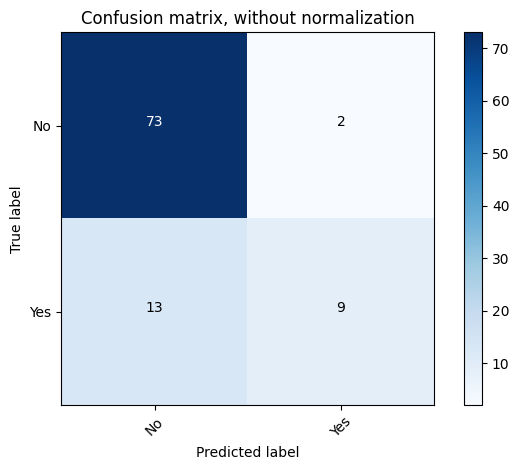

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.97      0.91        75
         Yes       0.82      0.41      0.55        22

    accuracy                           0.85        97
   macro avg       0.83      0.69      0.73        97
weighted avg       0.84      0.85      0.82        97



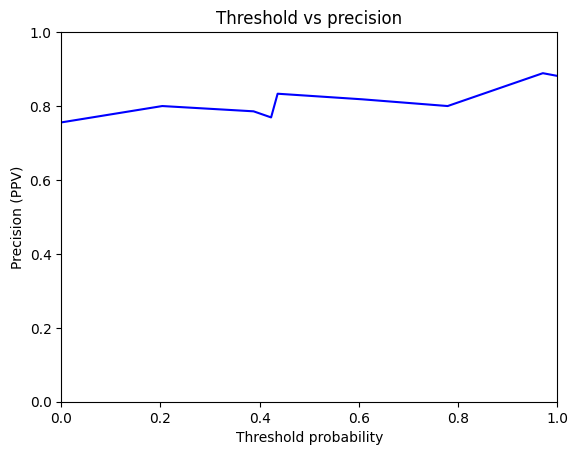

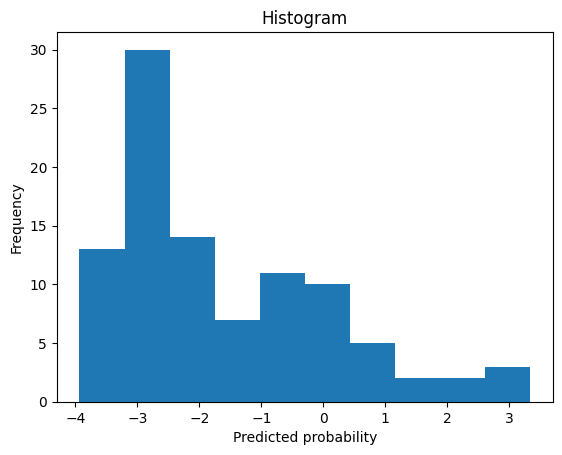

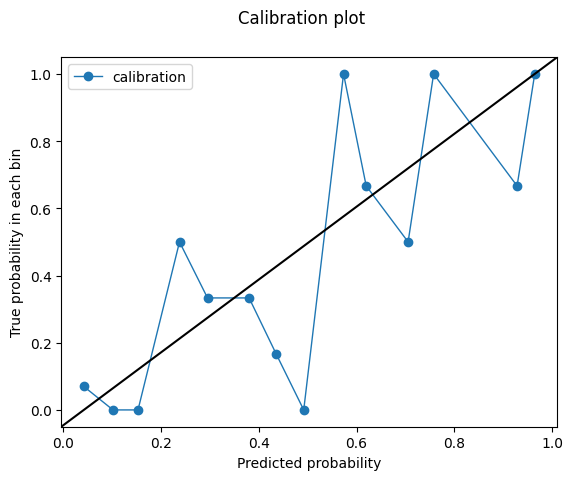

0.20358922
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.7812121212121212
Outcome probability: 0.2268041237113402
Average precision score: 0.58
Best F1: 0.5531914893617023


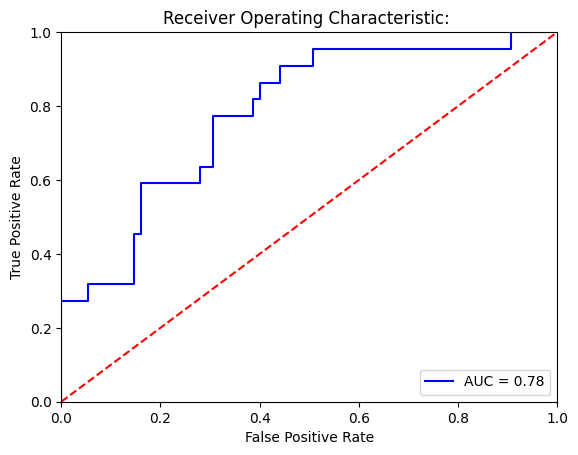

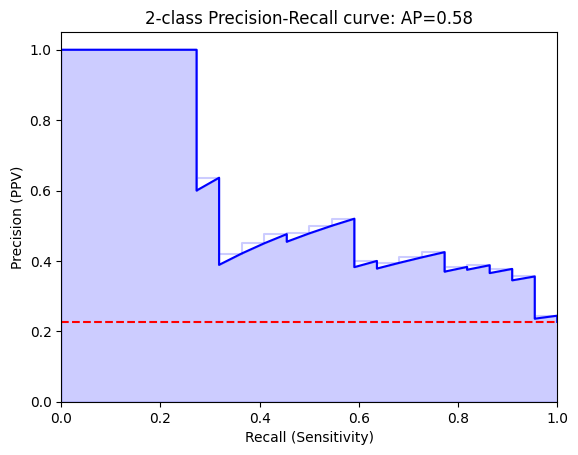

Threshold for best F1:
-1.3065951
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[63 12]
 [ 9 13]]


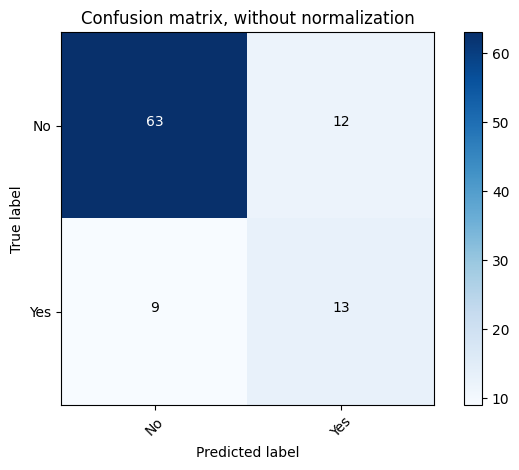

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.84      0.86        75
         Yes       0.52      0.59      0.55        22

    accuracy                           0.78        97
   macro avg       0.70      0.72      0.71        97
weighted avg       0.79      0.78      0.79        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[75  0]
 [17  5]]


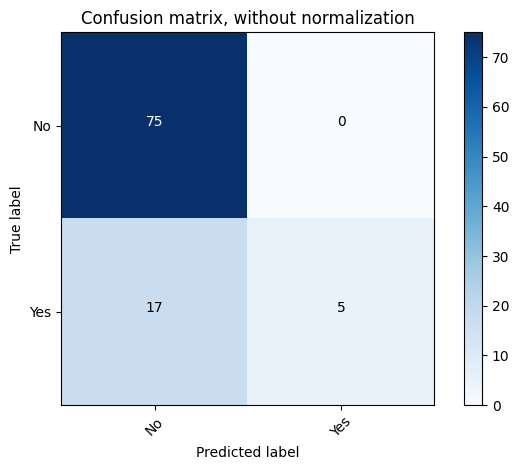

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      1.00      0.90        75
         Yes       1.00      0.23      0.37        22

    accuracy                           0.82        97
   macro avg       0.91      0.61      0.63        97
weighted avg       0.86      0.82      0.78        97



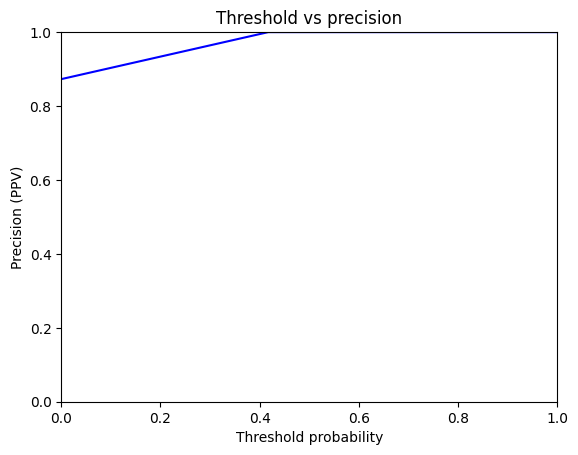

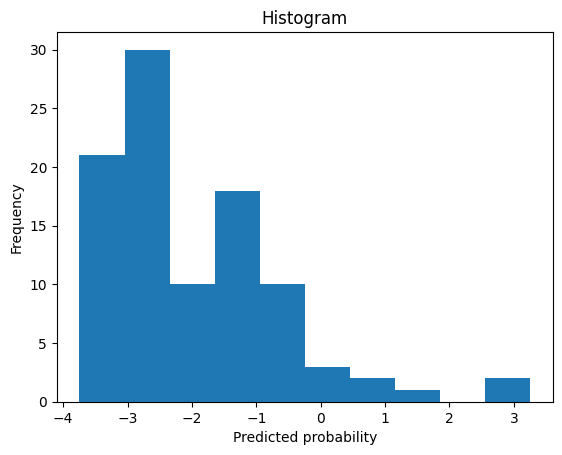

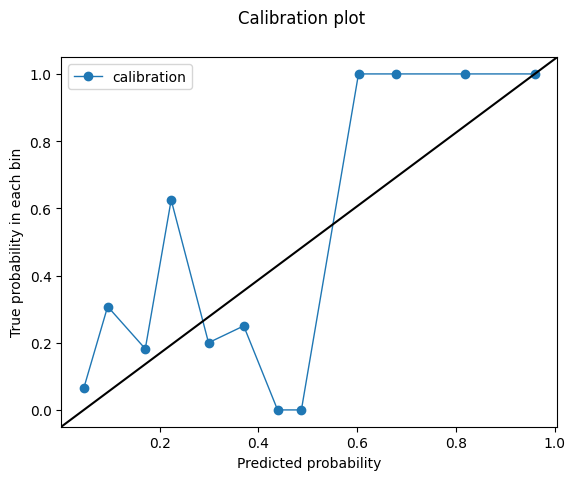

-1.3065951
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.7666666666666667
Outcome probability: 0.2268041237113402
Average precision score: 0.64
Best F1: 0.6111111111111112


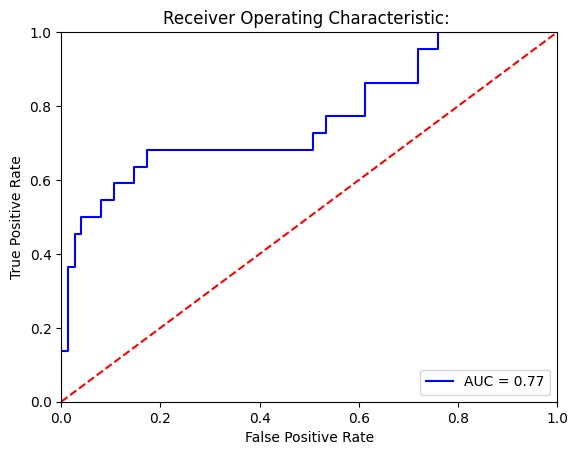

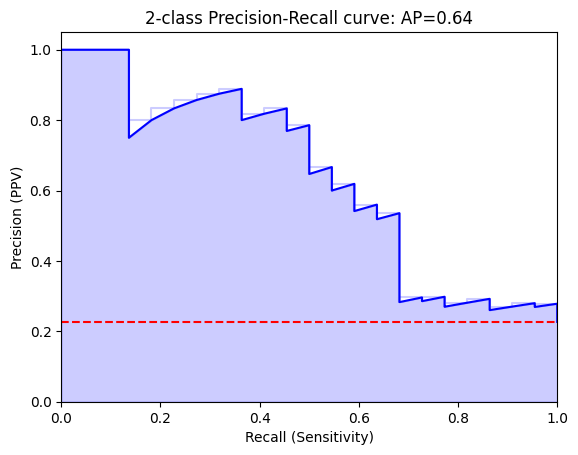

Threshold for best F1:
3.068445
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[72  3]
 [11 11]]


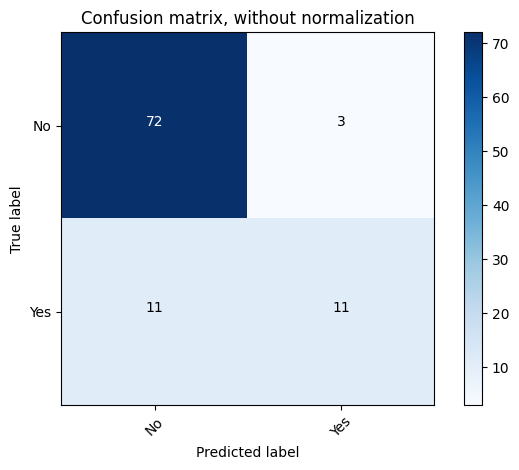

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.96      0.91        75
         Yes       0.79      0.50      0.61        22

    accuracy                           0.86        97
   macro avg       0.83      0.73      0.76        97
weighted avg       0.85      0.86      0.84        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[65 10]
 [ 9 13]]


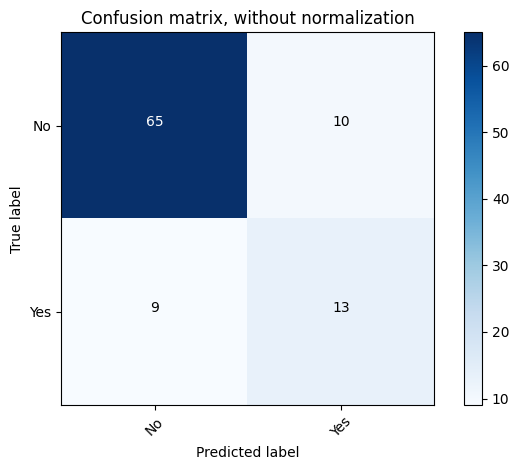

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.87      0.87        75
         Yes       0.57      0.59      0.58        22

    accuracy                           0.80        97
   macro avg       0.72      0.73      0.73        97
weighted avg       0.81      0.80      0.81        97



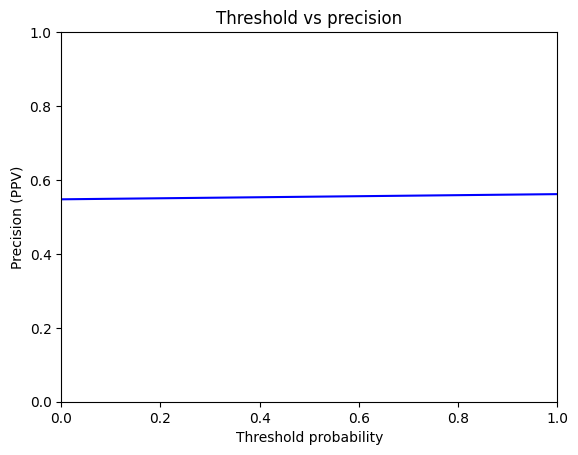

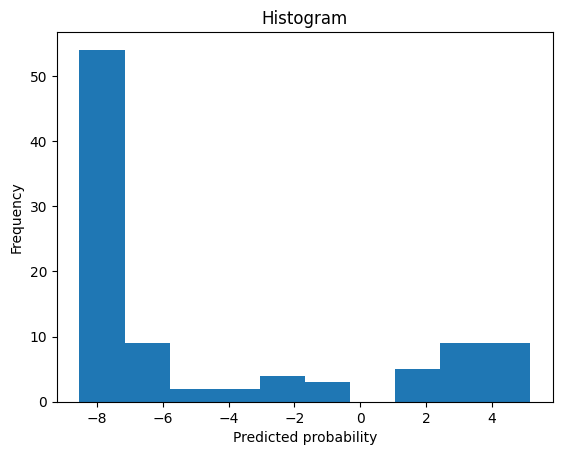

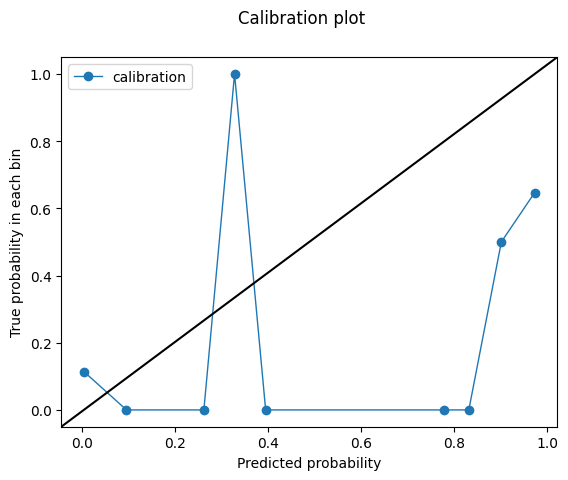

3.068445
test set
cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1070036679.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


cancer type
Renal Cell
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8478787878787878
Outcome probability: 0.2268041237113402
Average precision score: 0.72
Best F1: 0.6808510638297872


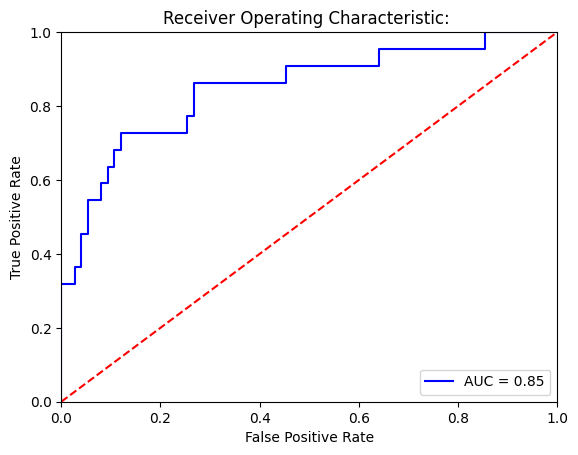

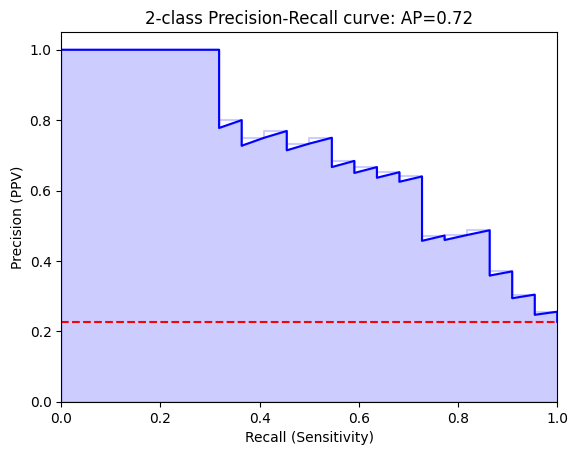

Threshold for best F1:
-1.1479698
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[66  9]
 [ 6 16]]


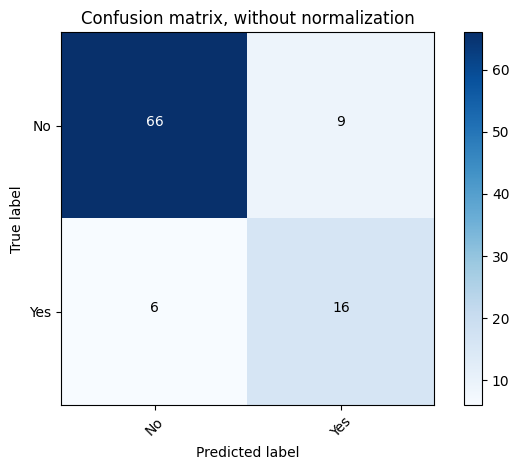

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.88      0.90        75
         Yes       0.64      0.73      0.68        22

    accuracy                           0.85        97
   macro avg       0.78      0.80      0.79        97
weighted avg       0.85      0.85      0.85        97

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[72  3]
 [14  8]]


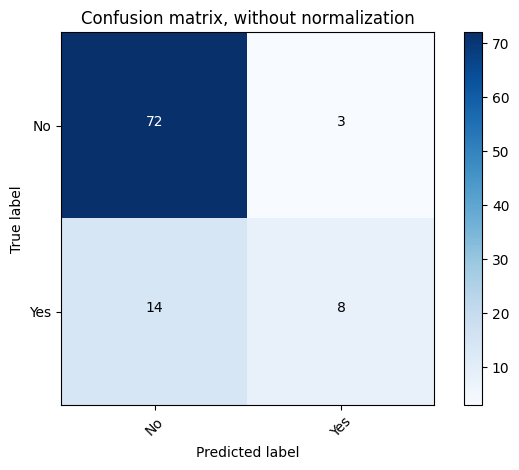

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.96      0.89        75
         Yes       0.73      0.36      0.48        22

    accuracy                           0.82        97
   macro avg       0.78      0.66      0.69        97
weighted avg       0.81      0.82      0.80        97



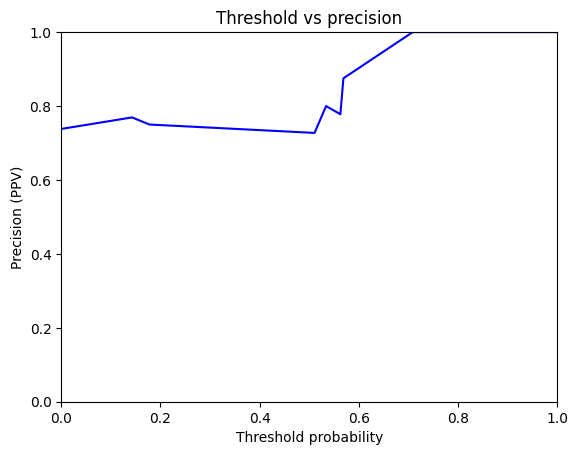

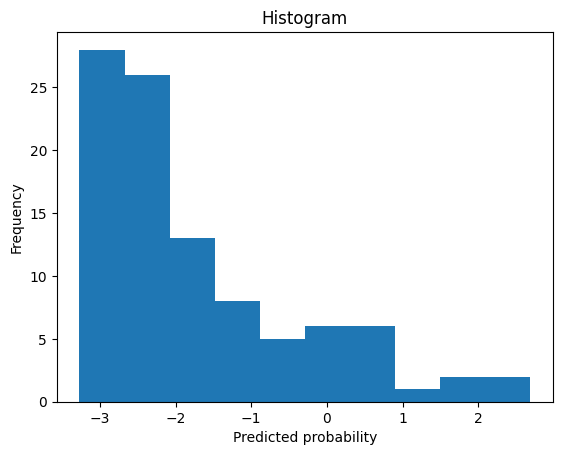

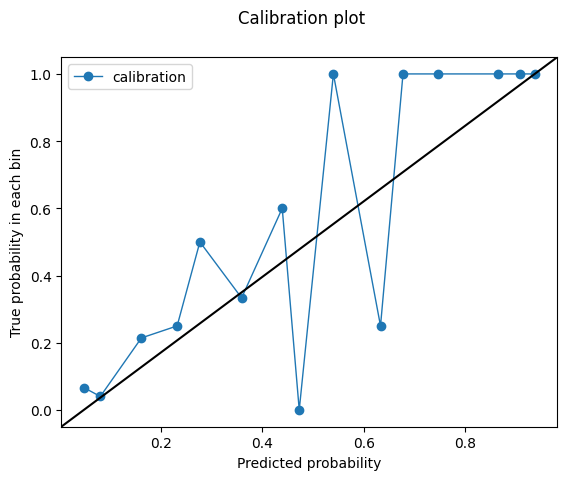

-1.1479698


In [32]:
for cancer_type in top_five_cancers:
    for model_type in model_paths:

        print('test set')
        
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        test = test_full.copy()
        test = test[test.Condition == cancer_type]
        test_day_text = test
        test_day_text['text'] = test_day_text.text.astype(str)
    
        test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])
    
        test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
        test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
        #test_day_text.info()
    
        # write out actual test dataset
        themodel = RecistModel()
        themodel.load_state_dict(torch.load(model_type))
        themodel.to(device)
    
        no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)
    
        dflist = []
        for ids, mask, s_times, y_true in no_shuffle_test_dataset:
            thisframe = pd.DataFrame()
    
            with torch.no_grad():
                y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))
    
            thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])
    
            dflist.append(thisframe)
    
        resultframe = pd.concat(dflist, axis=0)
        resultframe = resultframe.reset_index(drop=True)
    
    
        output = test_day_text.reset_index(drop=True)
    
    
    
        test_output = pd.concat([output, resultframe], axis=1)
        test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
    
    
    
    
        test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)
    
    
        test_output= test_output[test_output.overall_response != 'BL']
        print('cancer type')
        print(cancer_type)
        print('model type')
        print(model_type)
        print(eval_model(test_output.pd_pred, test_output.outcome, graph=True))


model performance for non-white patients
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1730227665.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8804945054945055
Outcome probability: 0.2582781456953642
Average precision score: 0.71
Best F1: 0.7560975609756098


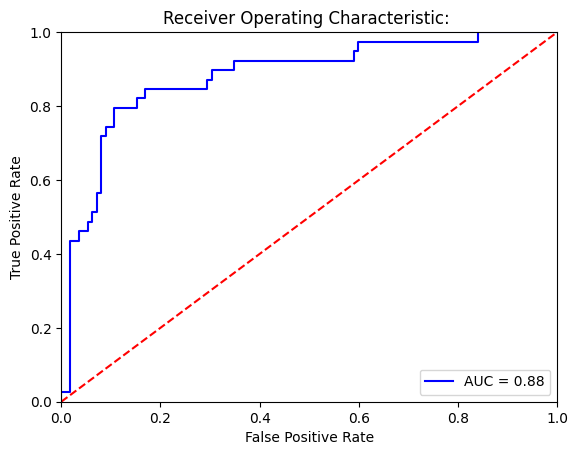

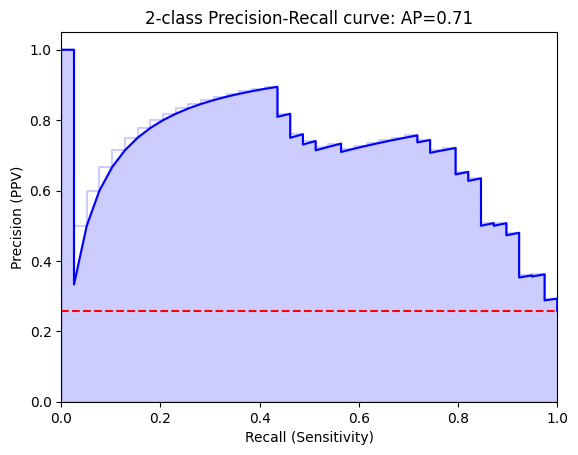

Threshold for best F1:
-0.37571797
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[100  12]
 [  8  31]]


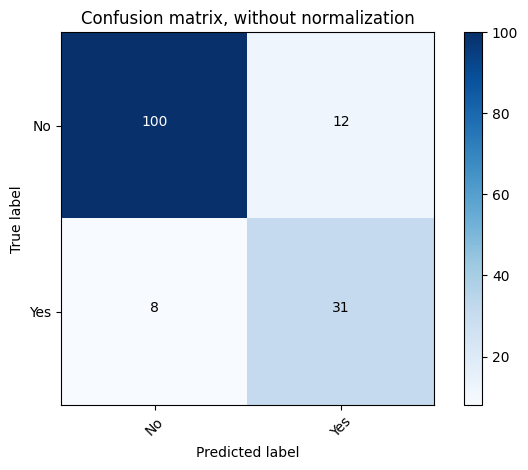

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.89      0.91       112
         Yes       0.72      0.79      0.76        39

    accuracy                           0.87       151
   macro avg       0.82      0.84      0.83       151
weighted avg       0.87      0.87      0.87       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[104   8]
 [ 17  22]]


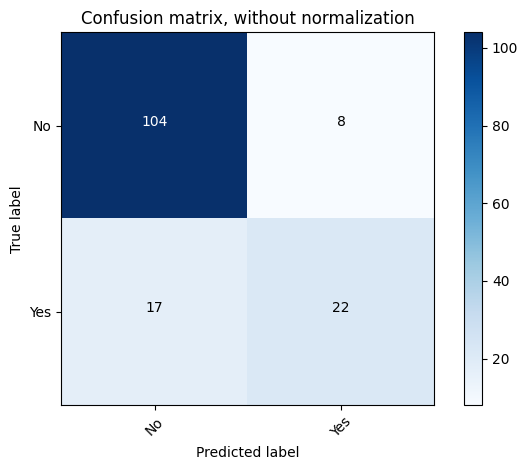

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.93      0.89       112
         Yes       0.73      0.56      0.64        39

    accuracy                           0.83       151
   macro avg       0.80      0.75      0.77       151
weighted avg       0.83      0.83      0.83       151



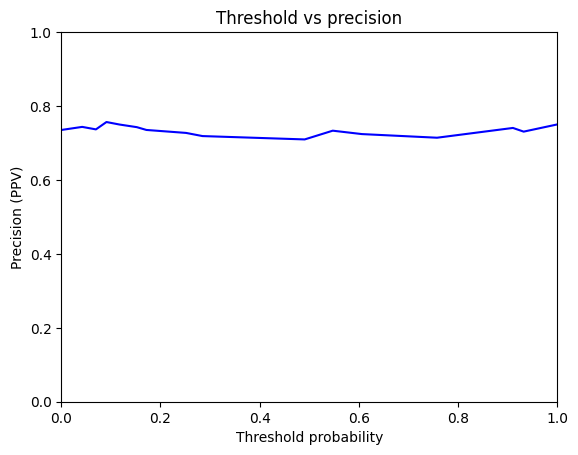

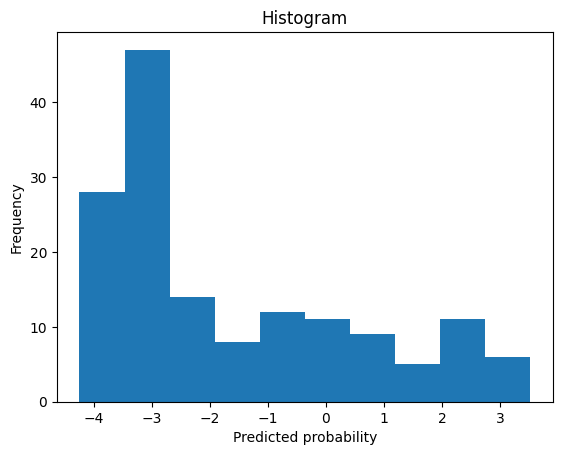

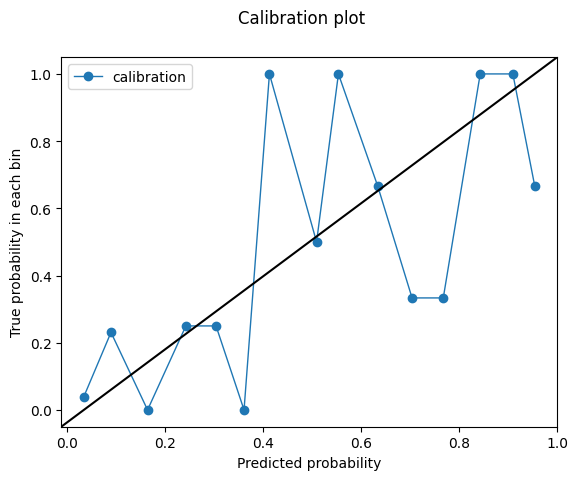

-0.37571797
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1730227665.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8617216117216118
Outcome probability: 0.2582781456953642
Average precision score: 0.71
Best F1: 0.7058823529411764


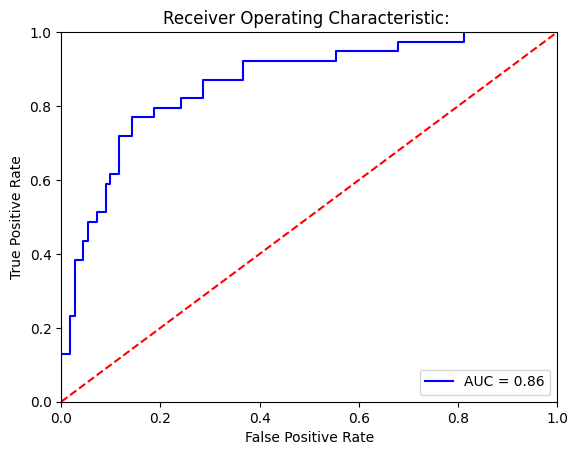

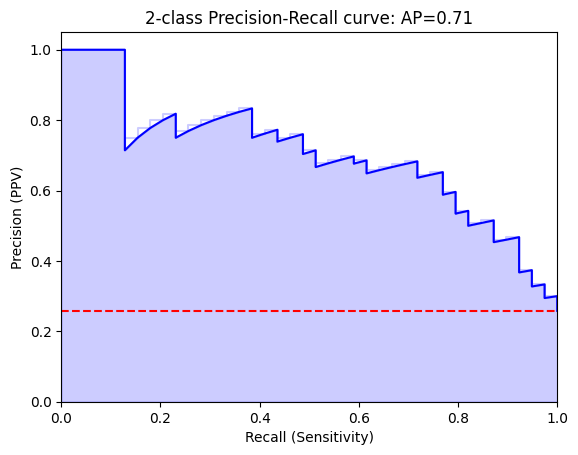

Threshold for best F1:
-0.7485896
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[96 16]
 [ 9 30]]


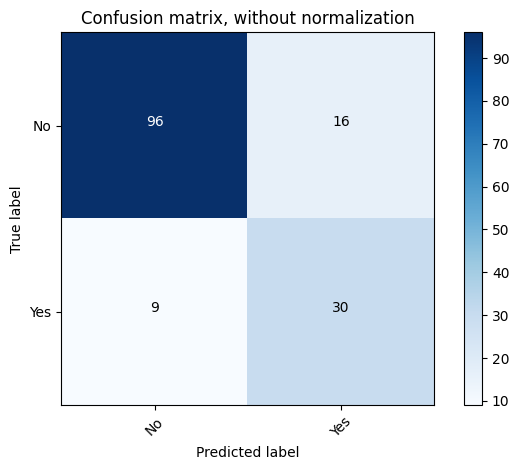

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.86      0.88       112
         Yes       0.65      0.77      0.71        39

    accuracy                           0.83       151
   macro avg       0.78      0.81      0.80       151
weighted avg       0.85      0.83      0.84       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[106   6]
 [ 20  19]]


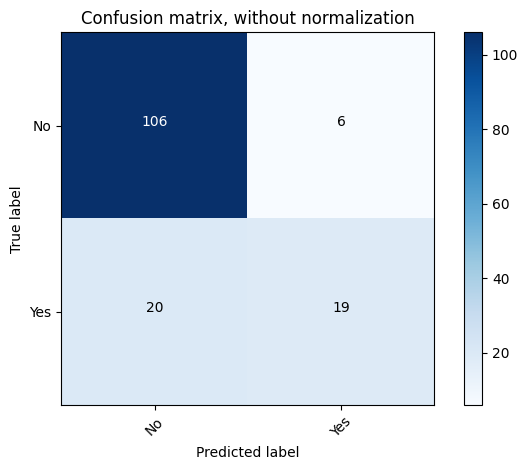

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.95      0.89       112
         Yes       0.76      0.49      0.59        39

    accuracy                           0.83       151
   macro avg       0.80      0.72      0.74       151
weighted avg       0.82      0.83      0.81       151



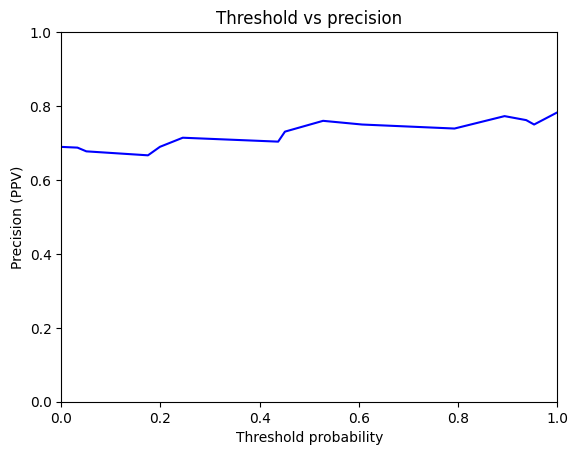

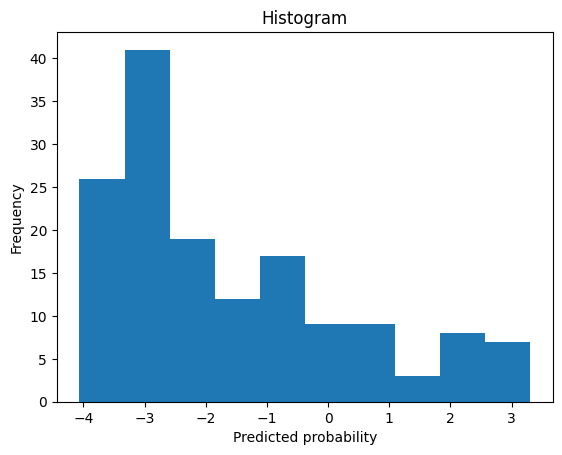

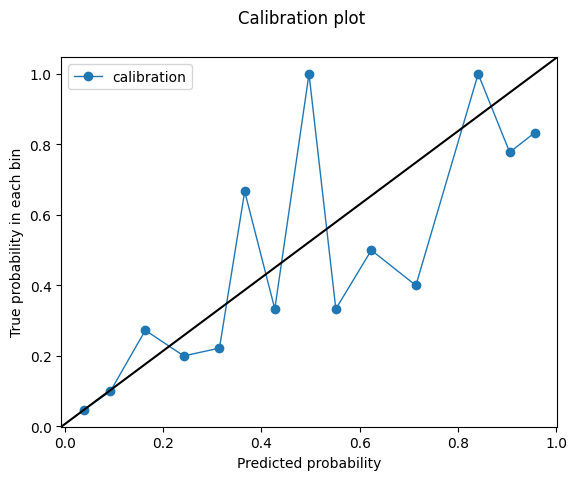

-0.7485896
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1730227665.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8209706959706959
Outcome probability: 0.2582781456953642
Average precision score: 0.62
Best F1: 0.6363636363636365


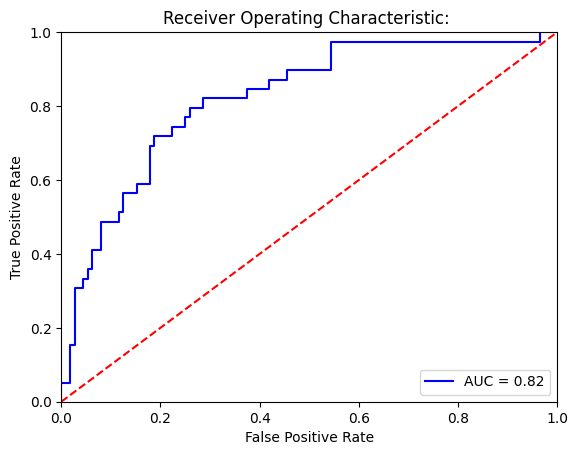

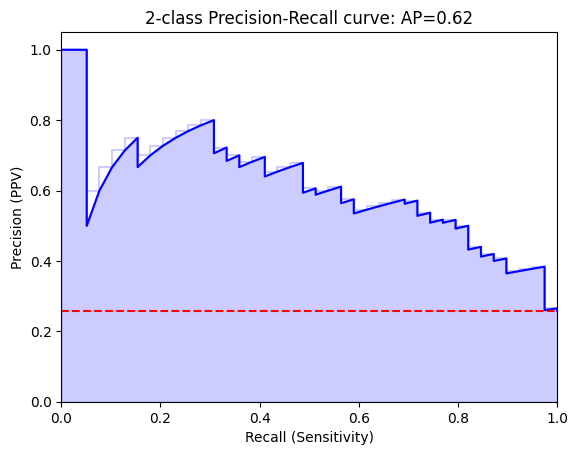

Threshold for best F1:
-1.6296332
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[91 21]
 [11 28]]


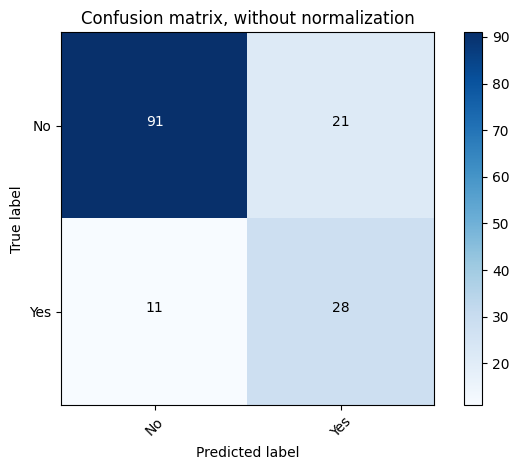

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.81      0.85       112
         Yes       0.57      0.72      0.64        39

    accuracy                           0.79       151
   macro avg       0.73      0.77      0.74       151
weighted avg       0.81      0.79      0.80       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[109   3]
 [ 30   9]]


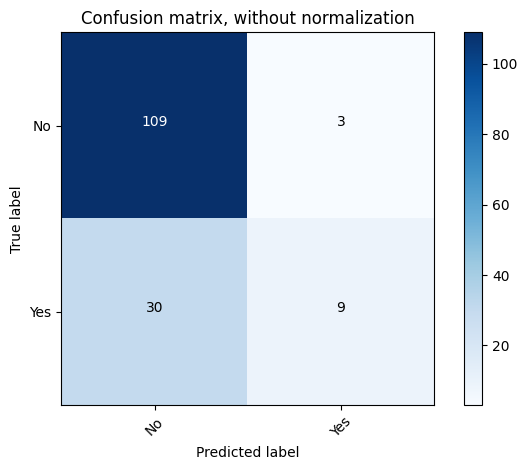

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.78      0.97      0.87       112
         Yes       0.75      0.23      0.35        39

    accuracy                           0.78       151
   macro avg       0.77      0.60      0.61       151
weighted avg       0.78      0.78      0.74       151



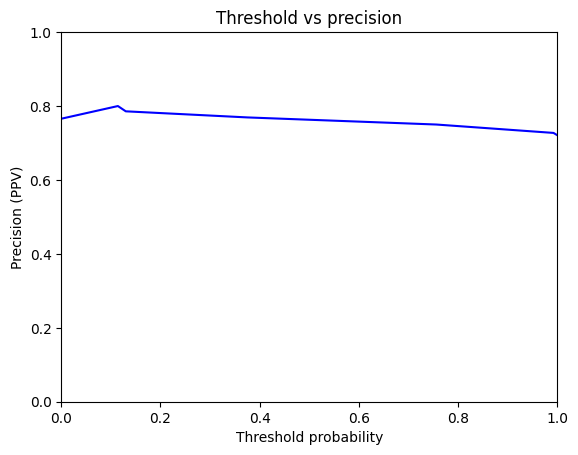

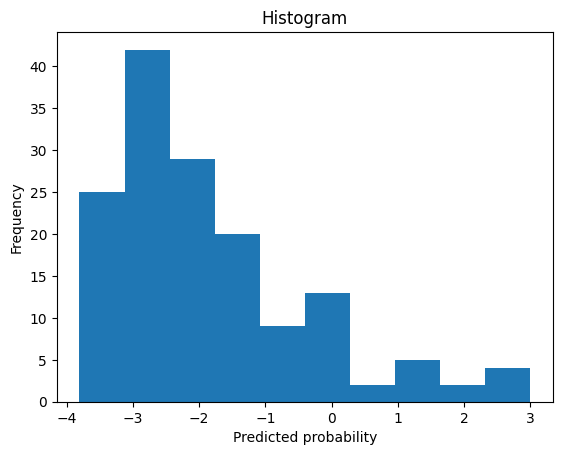

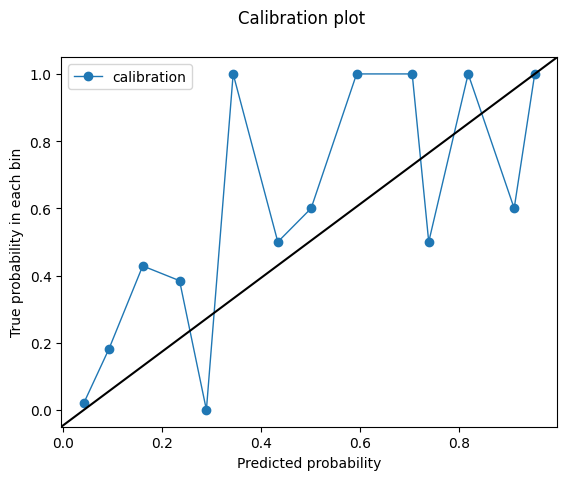

-1.6296332
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1730227665.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.7635073260073261
Outcome probability: 0.2582781456953642
Average precision score: 0.51
Best F1: 0.5862068965517242


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


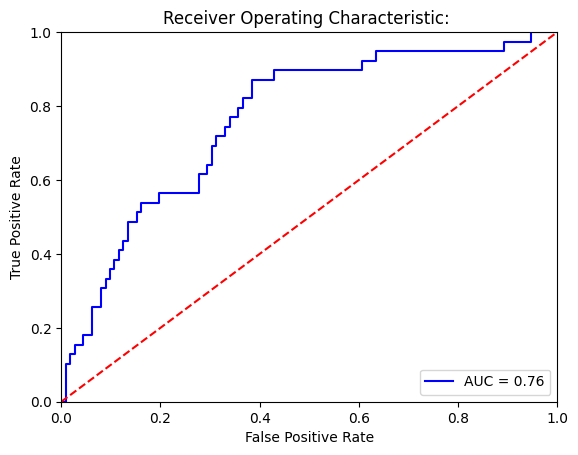

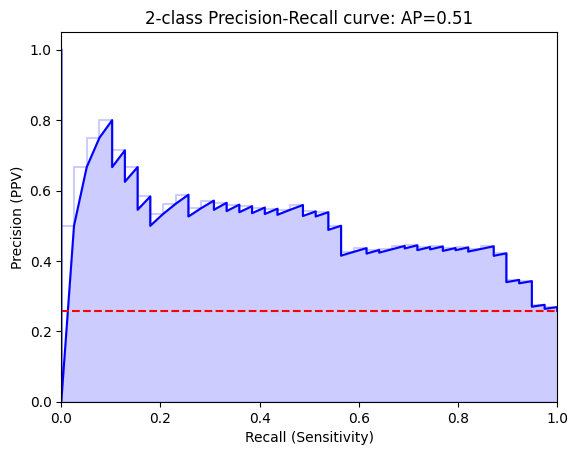

Threshold for best F1:
5.0958595
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[111   1]
 [ 39   0]]


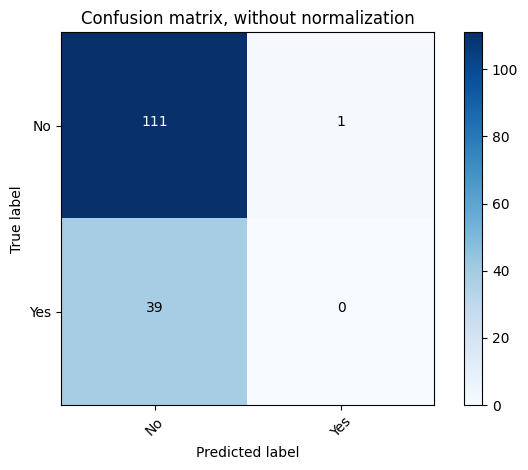

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.74      0.99      0.85       112
         Yes       0.00      0.00      0.00        39

    accuracy                           0.74       151
   macro avg       0.37      0.50      0.42       151
weighted avg       0.55      0.74      0.63       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[90 22]
 [17 22]]


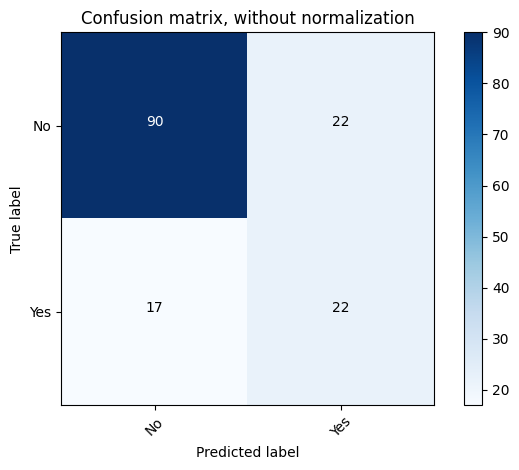

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.80      0.82       112
         Yes       0.50      0.56      0.53        39

    accuracy                           0.74       151
   macro avg       0.67      0.68      0.68       151
weighted avg       0.75      0.74      0.75       151



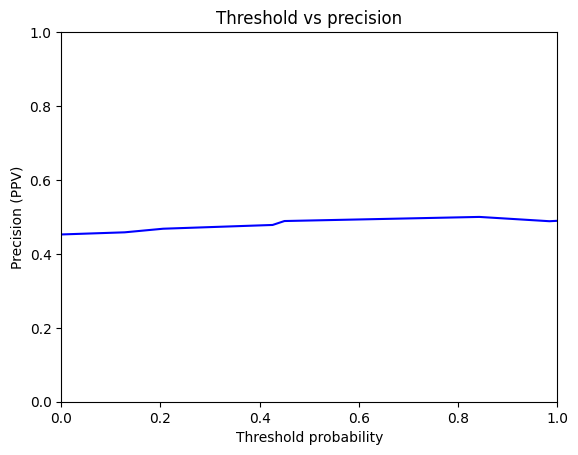

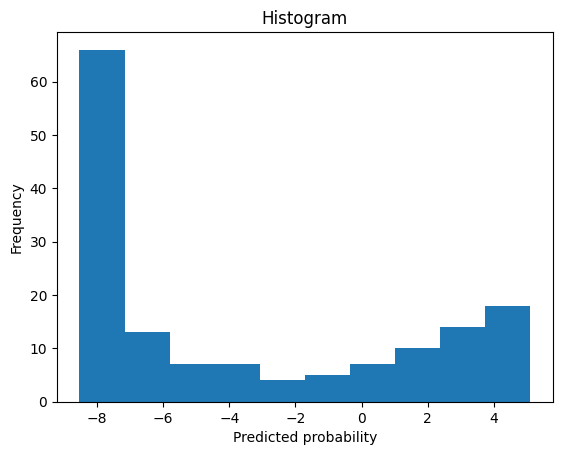

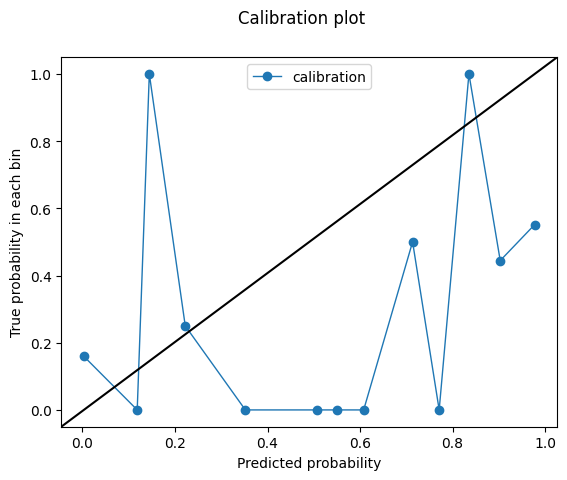

5.0958595
validation_set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1730227665.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.815018315018315
Outcome probability: 0.2582781456953642
Average precision score: 0.66
Best F1: 0.6153846153846154


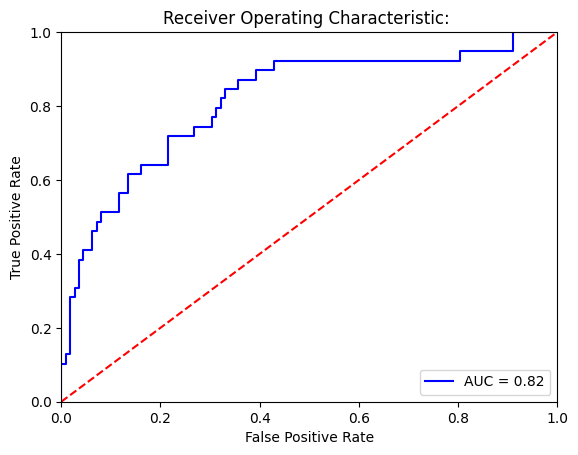

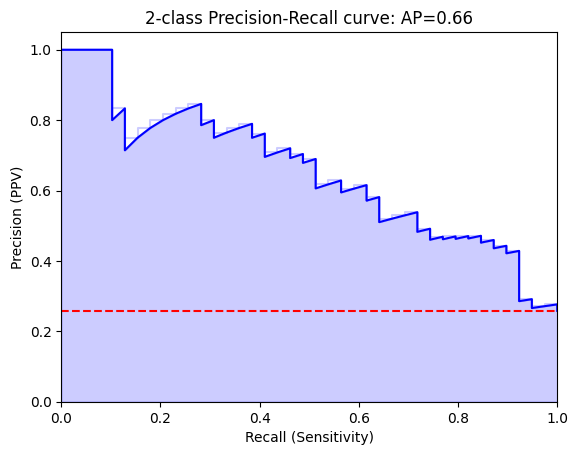

Threshold for best F1:
-0.3736645
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[97 15]
 [15 24]]


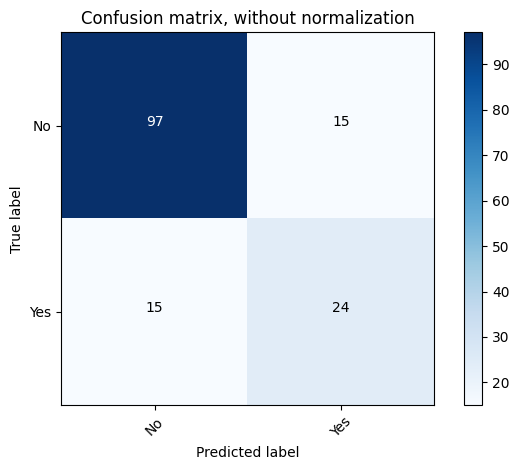

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.87      0.87       112
         Yes       0.62      0.62      0.62        39

    accuracy                           0.80       151
   macro avg       0.74      0.74      0.74       151
weighted avg       0.80      0.80      0.80       151

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[105   7]
 [ 22  17]]


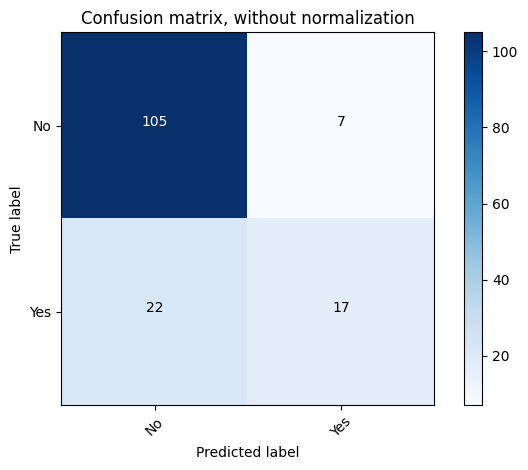

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.94      0.88       112
         Yes       0.71      0.44      0.54        39

    accuracy                           0.81       151
   macro avg       0.77      0.69      0.71       151
weighted avg       0.80      0.81      0.79       151



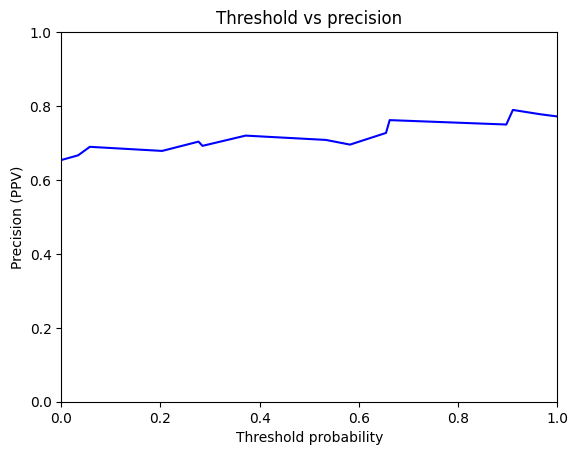

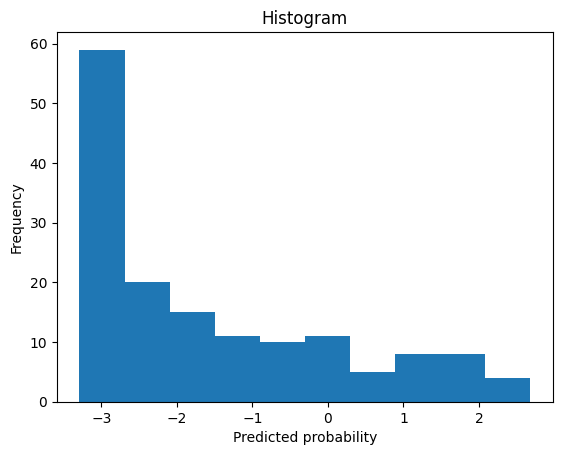

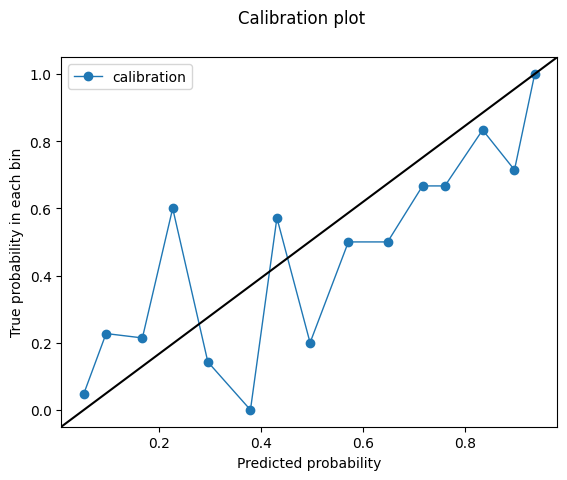

-0.3736645


In [33]:
print('model performance for non-white patients')

for model_type in model_paths:

    print('validation_set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.white_race == 0 ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('non white patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.pd_pred, valid_output.outcome, graph=True))


model performance for non-white patients
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/651914892.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8281724347298117
Outcome probability: 0.3112244897959184
Average precision score: 0.70
Best F1: 0.6428571428571428


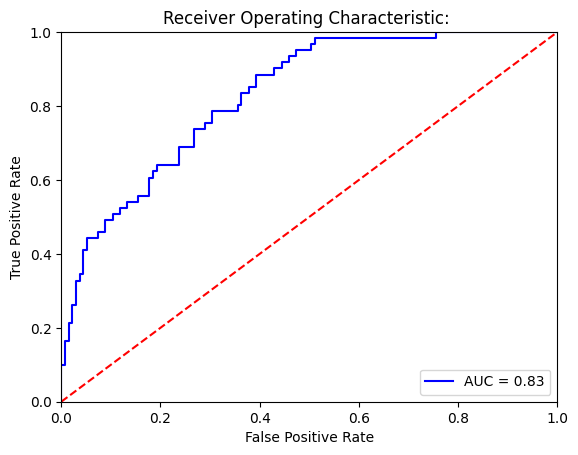

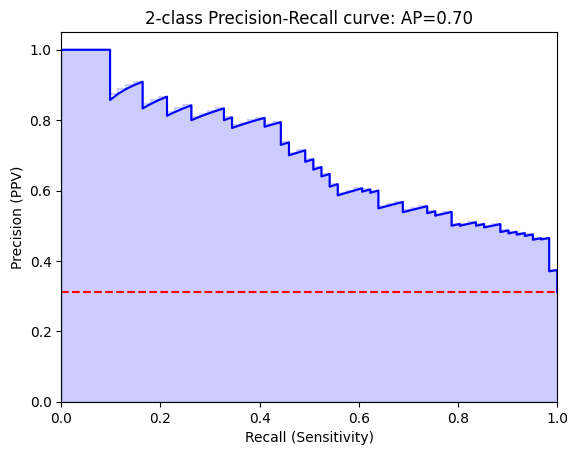

Threshold for best F1:
-2.3892288
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[82 53]
 [ 7 54]]


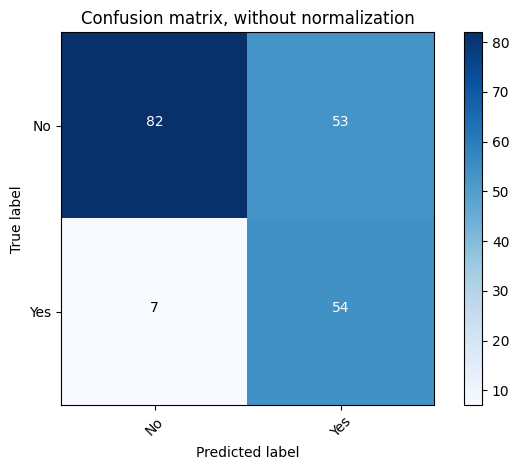

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.61      0.73       135
         Yes       0.50      0.89      0.64        61

    accuracy                           0.69       196
   macro avg       0.71      0.75      0.69       196
weighted avg       0.79      0.69      0.70       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[121  14]
 [ 31  30]]


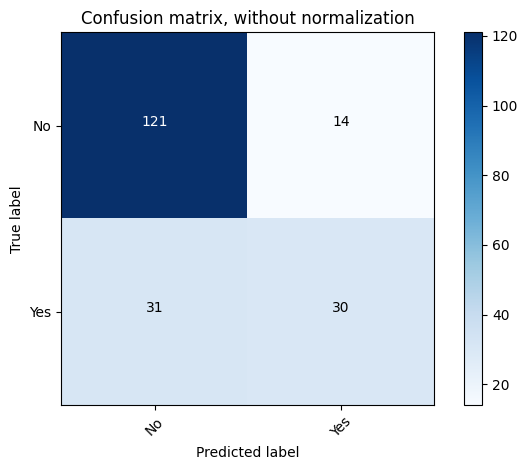

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.80      0.90      0.84       135
         Yes       0.68      0.49      0.57        61

    accuracy                           0.77       196
   macro avg       0.74      0.69      0.71       196
weighted avg       0.76      0.77      0.76       196



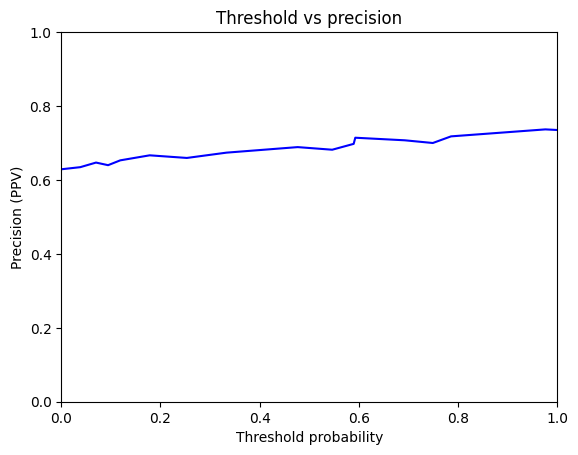

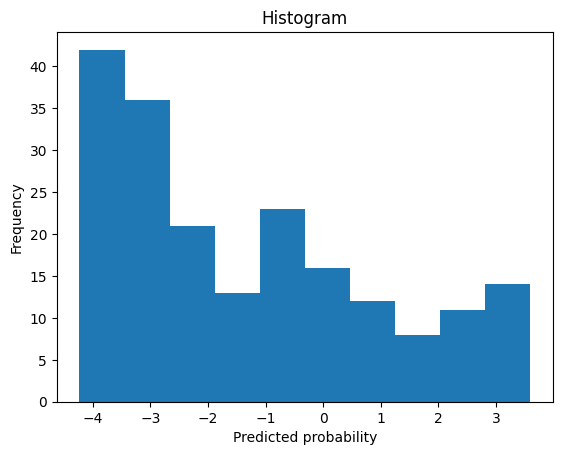

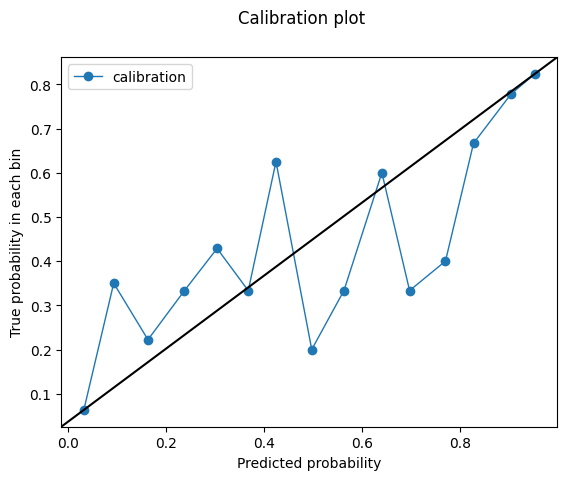

-2.3892288
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/651914892.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8206435944140862
Outcome probability: 0.3112244897959184
Average precision score: 0.68
Best F1: 0.6709677419354838


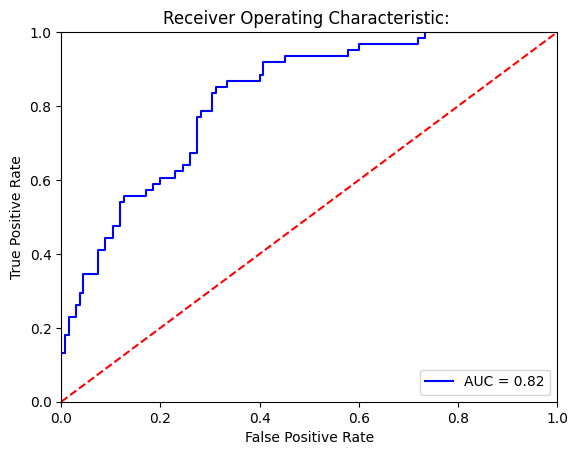

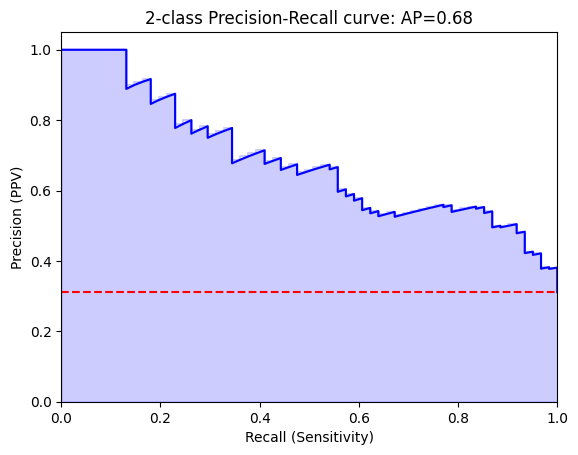

Threshold for best F1:
-1.6241075
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[93 42]
 [ 9 52]]


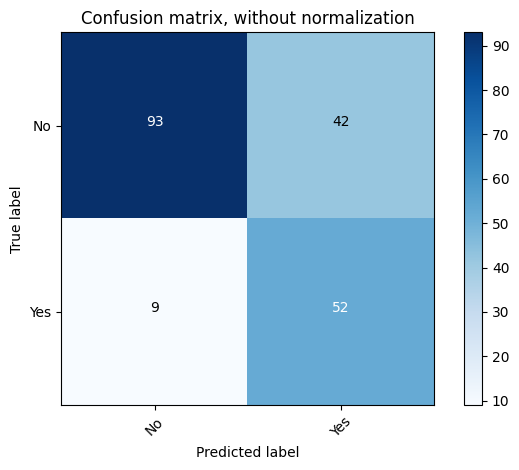

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.69      0.78       135
         Yes       0.55      0.85      0.67        61

    accuracy                           0.74       196
   macro avg       0.73      0.77      0.73       196
weighted avg       0.80      0.74      0.75       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[125  10]
 [ 38  23]]


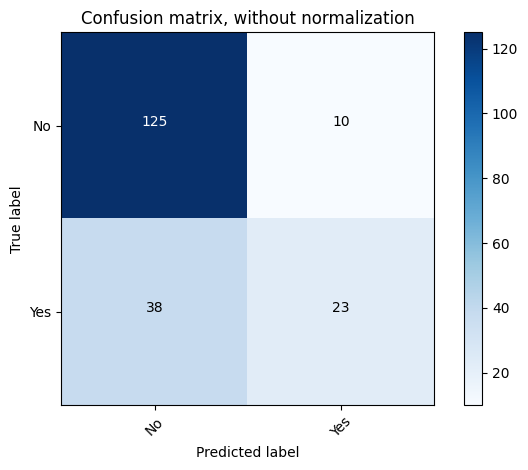

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.93      0.84       135
         Yes       0.70      0.38      0.49        61

    accuracy                           0.76       196
   macro avg       0.73      0.65      0.66       196
weighted avg       0.75      0.76      0.73       196



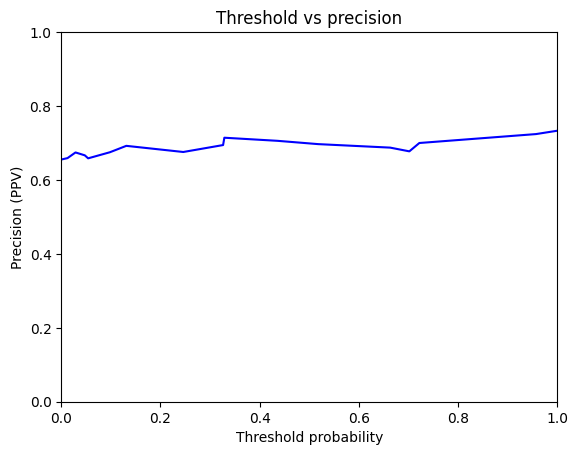

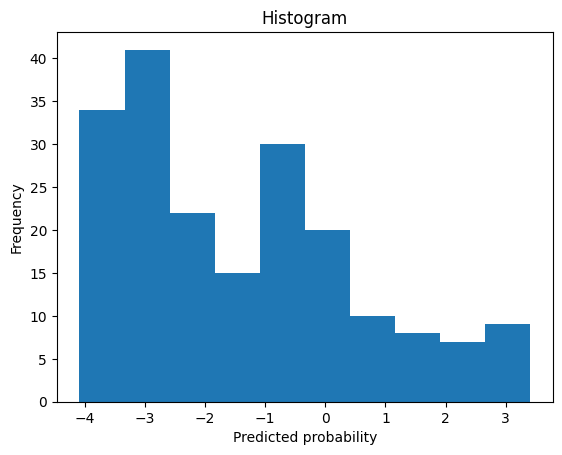

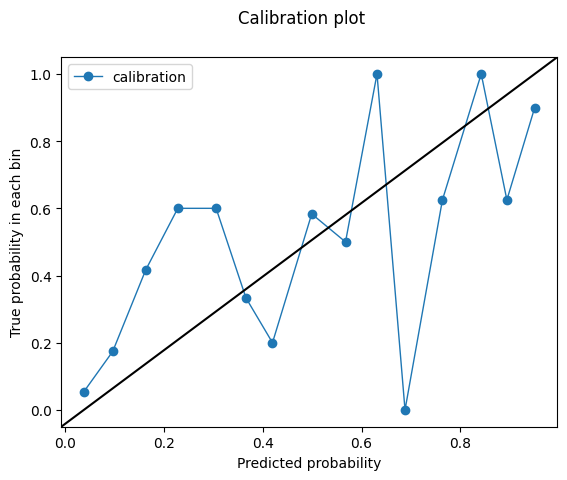

-1.6241075
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/651914892.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8253794778384943
Outcome probability: 0.3112244897959184
Average precision score: 0.69
Best F1: 0.6712328767123288


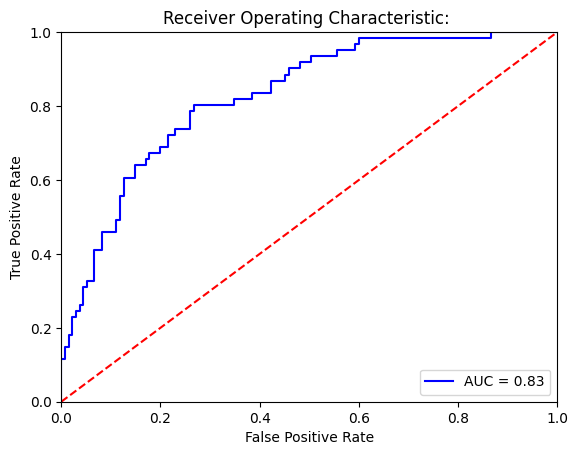

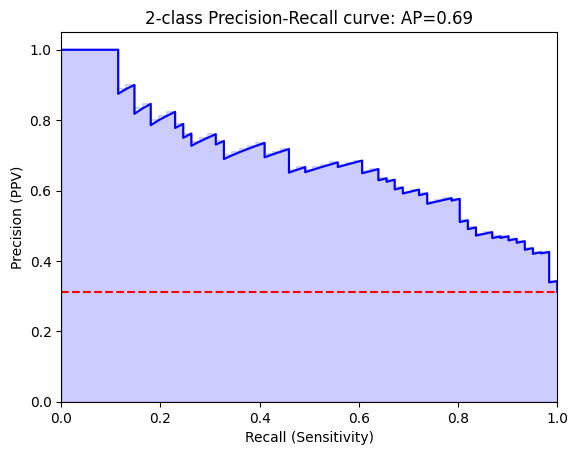

Threshold for best F1:
-1.8457282
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[99 36]
 [12 49]]


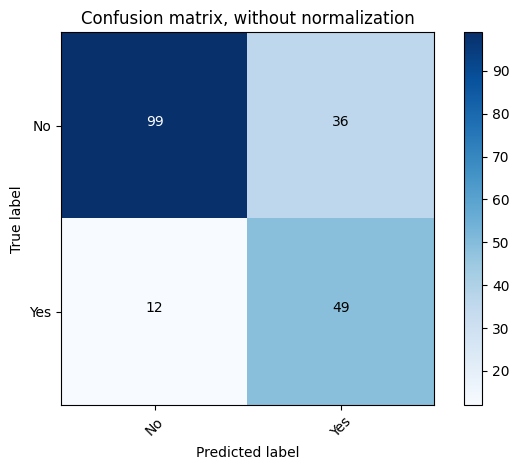

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.73      0.80       135
         Yes       0.58      0.80      0.67        61

    accuracy                           0.76       196
   macro avg       0.73      0.77      0.74       196
weighted avg       0.79      0.76      0.76       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[132   3]
 [ 50  11]]


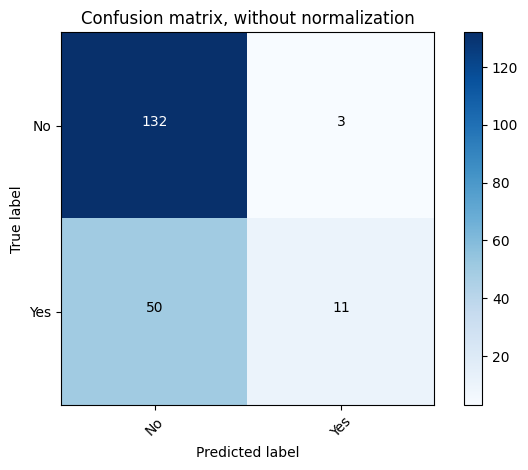

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.73      0.98      0.83       135
         Yes       0.79      0.18      0.29        61

    accuracy                           0.73       196
   macro avg       0.76      0.58      0.56       196
weighted avg       0.74      0.73      0.66       196



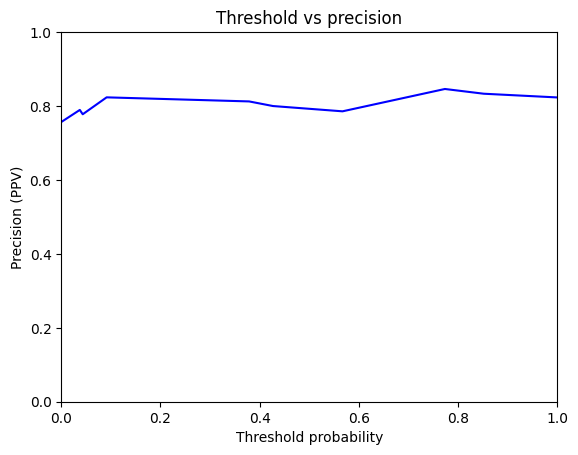

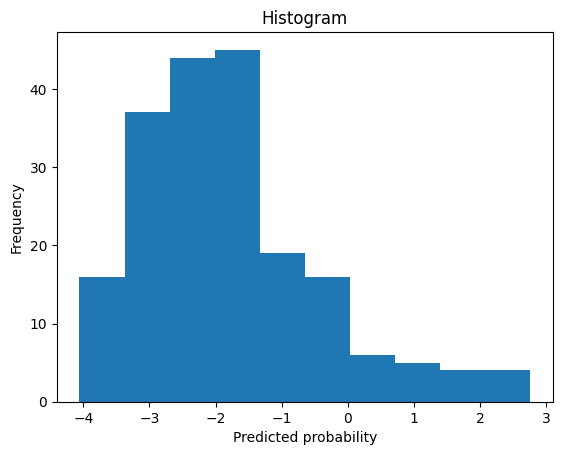

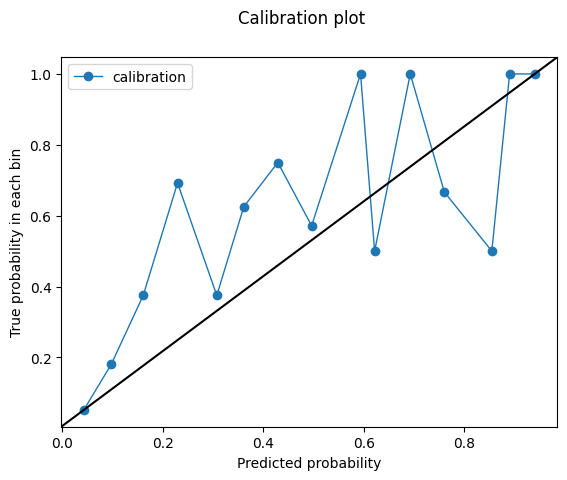

-1.8457282
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/651914892.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8131147540983606
Outcome probability: 0.3112244897959184
Average precision score: 0.71
Best F1: 0.6616541353383459


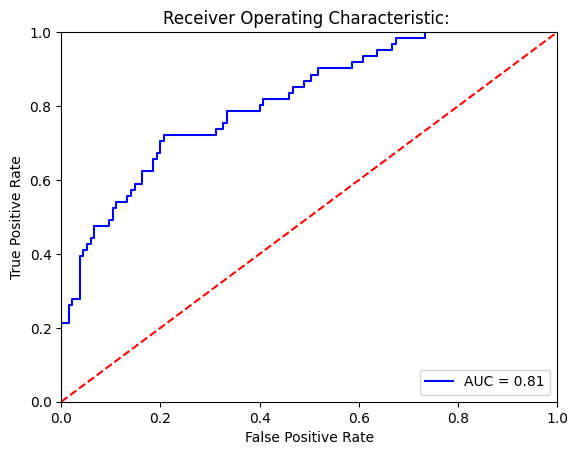

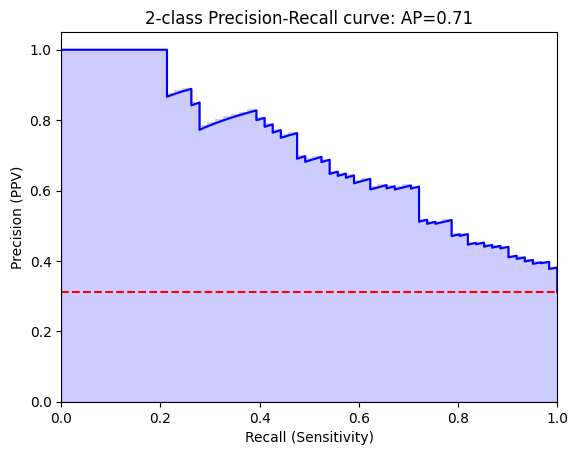

Threshold for best F1:
-1.8894346
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[107  28]
 [ 17  44]]


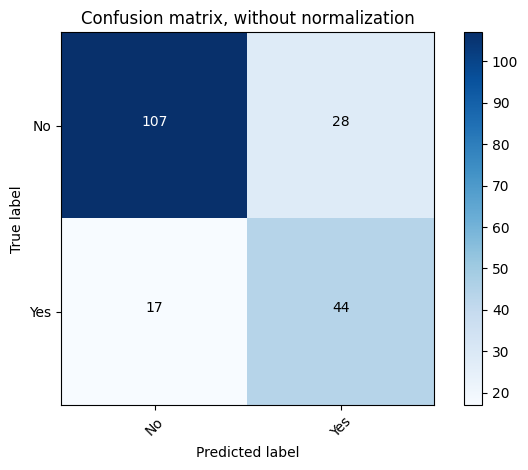

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.79      0.83       135
         Yes       0.61      0.72      0.66        61

    accuracy                           0.77       196
   macro avg       0.74      0.76      0.74       196
weighted avg       0.78      0.77      0.78       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[117  18]
 [ 27  34]]


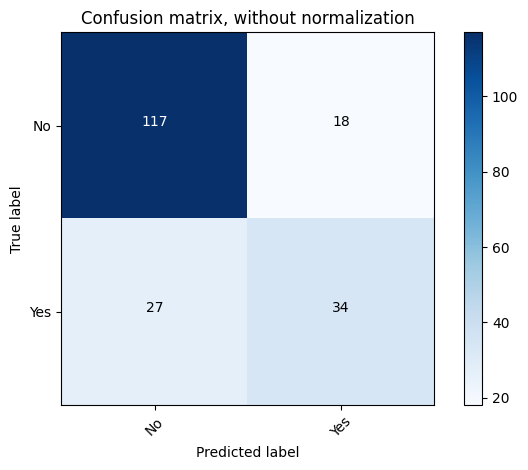

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.81      0.87      0.84       135
         Yes       0.65      0.56      0.60        61

    accuracy                           0.77       196
   macro avg       0.73      0.71      0.72       196
weighted avg       0.76      0.77      0.76       196



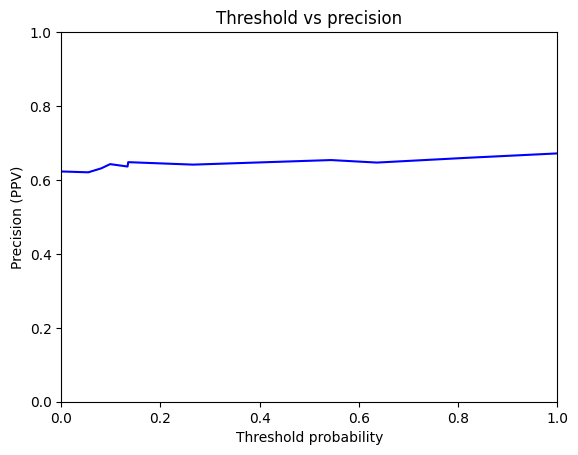

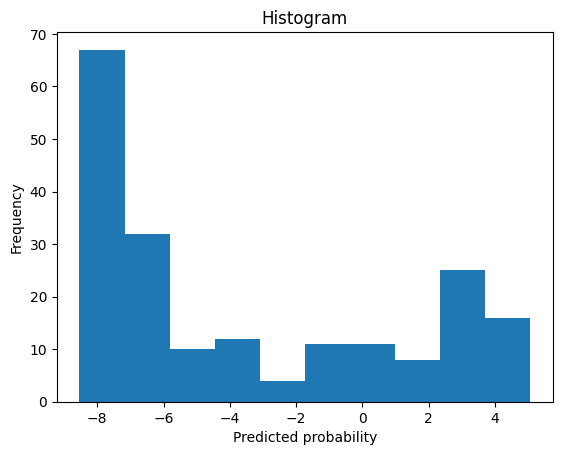

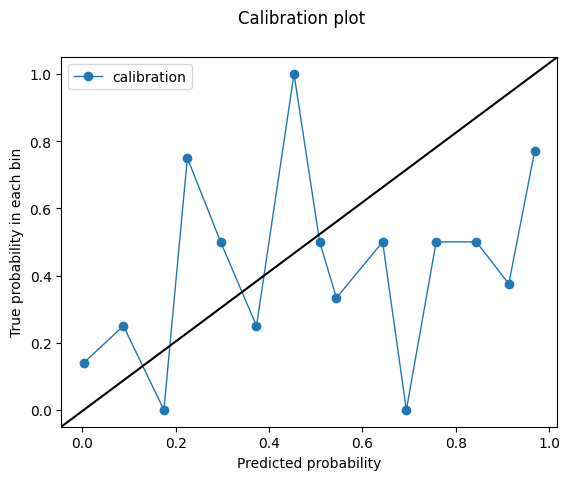

-1.8894346
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/651914892.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


non white patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.7874924104432302
Outcome probability: 0.3112244897959184
Average precision score: 0.62
Best F1: 0.6390532544378698


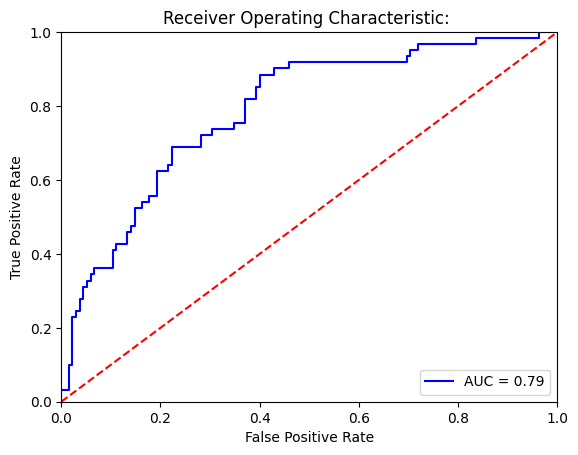

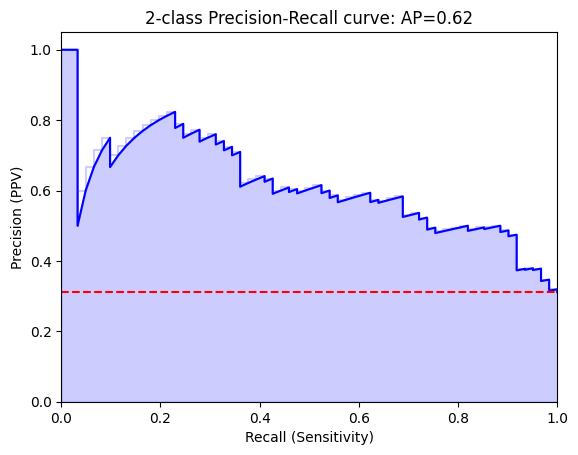

Threshold for best F1:
-2.05831
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[81 54]
 [ 7 54]]


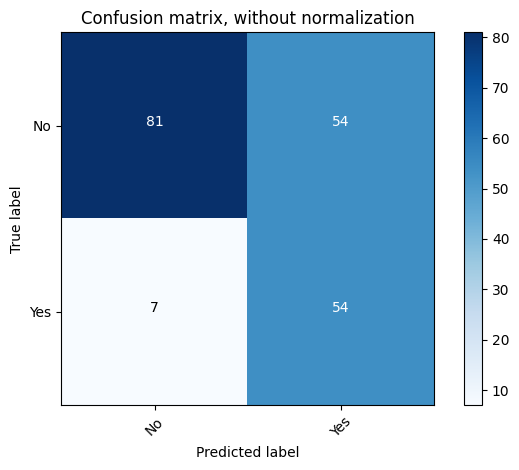

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.60      0.73       135
         Yes       0.50      0.89      0.64        61

    accuracy                           0.69       196
   macro avg       0.71      0.74      0.68       196
weighted avg       0.79      0.69      0.70       196

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[129   6]
 [ 43  18]]


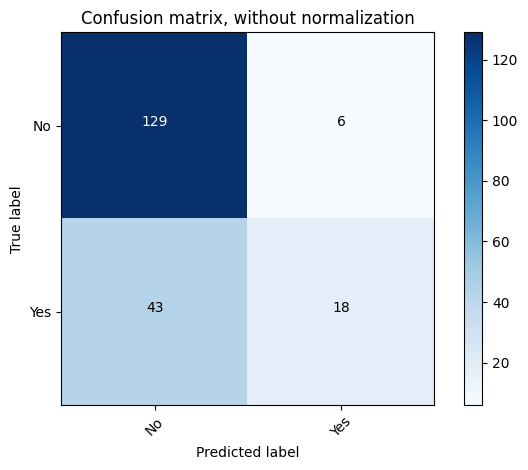

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.75      0.96      0.84       135
         Yes       0.75      0.30      0.42        61

    accuracy                           0.75       196
   macro avg       0.75      0.63      0.63       196
weighted avg       0.75      0.75      0.71       196



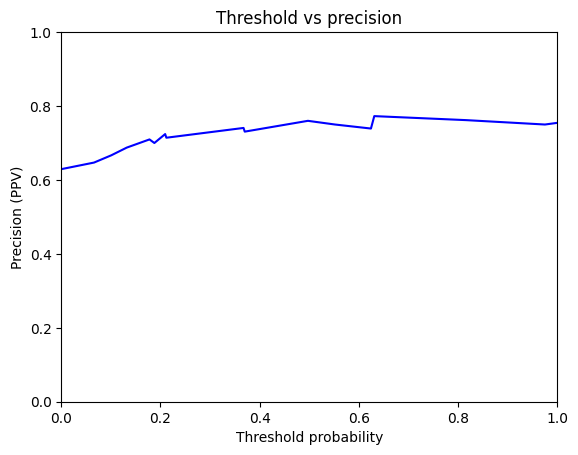

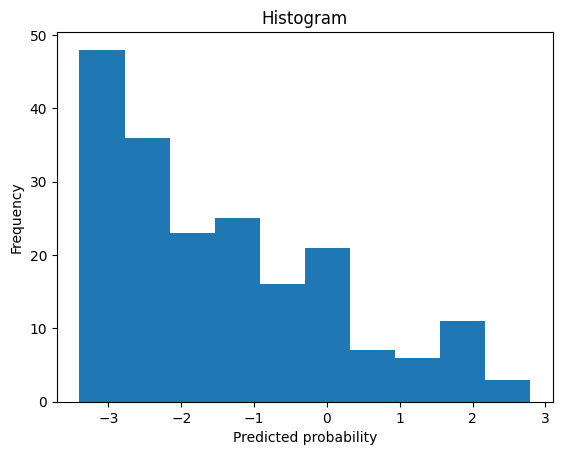

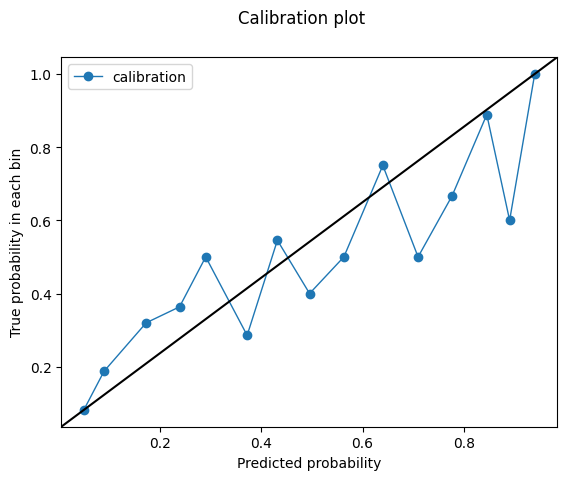

-2.05831


In [34]:
print('model performance for non-white patients')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.white_race == 0 ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('non white patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.pd_pred, test_output.outcome, graph=True))


model performance for Hispanic patients
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/420874481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8894736842105263
Outcome probability: 0.3448275862068966
Average precision score: 0.71
Best F1: 0.8333333333333333


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


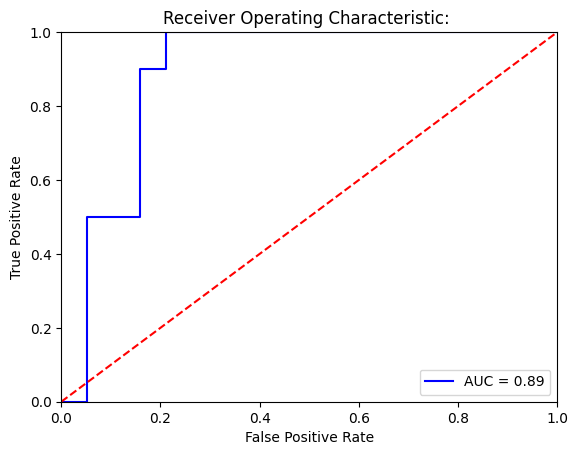

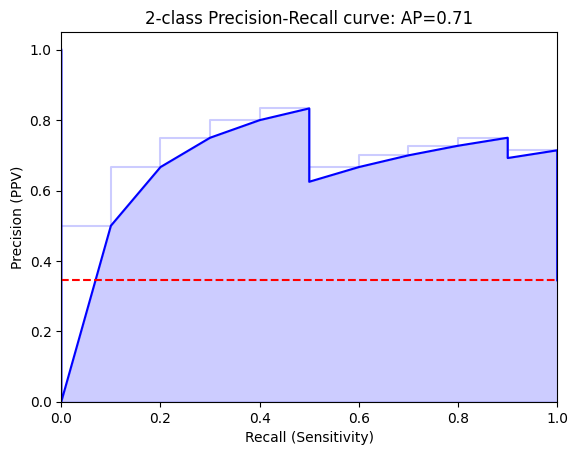

Threshold for best F1:
3.444125
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[18  1]
 [10  0]]


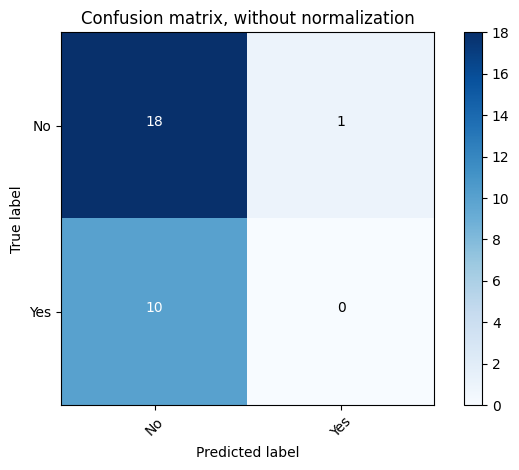

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.64      0.95      0.77        19
         Yes       0.00      0.00      0.00        10

    accuracy                           0.62        29
   macro avg       0.32      0.47      0.38        29
weighted avg       0.42      0.62      0.50        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[16  3]
 [ 5  5]]


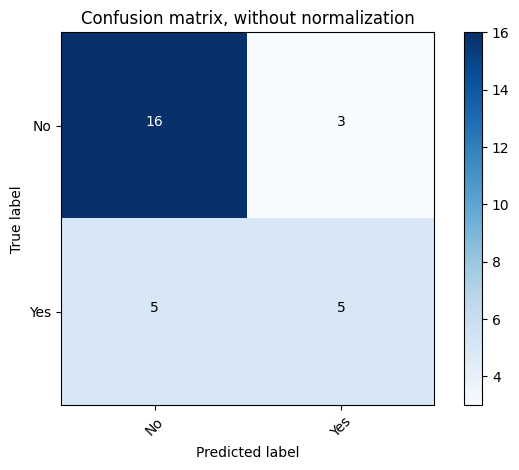

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.76      0.84      0.80        19
         Yes       0.62      0.50      0.56        10

    accuracy                           0.72        29
   macro avg       0.69      0.67      0.68        29
weighted avg       0.71      0.72      0.72        29



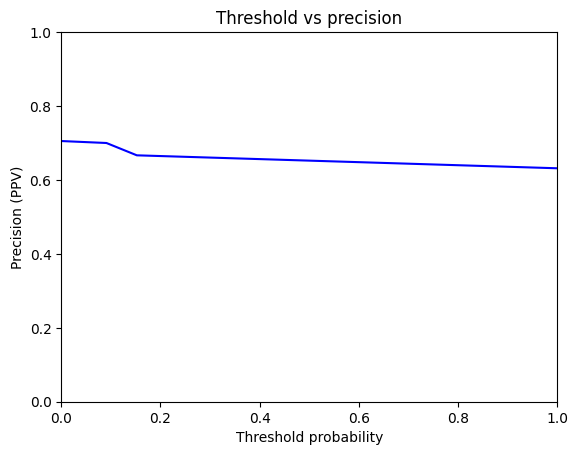

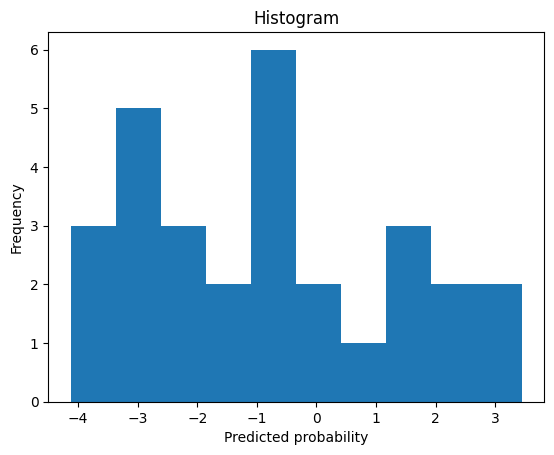

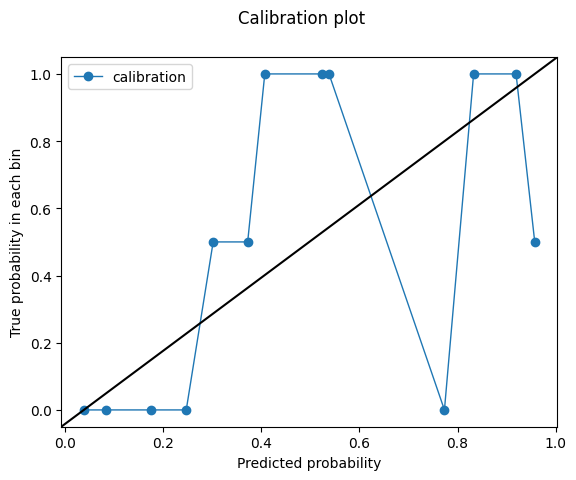

3.444125
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/420874481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8210526315789474
Outcome probability: 0.3448275862068966
Average precision score: 0.75
Best F1: 0.7


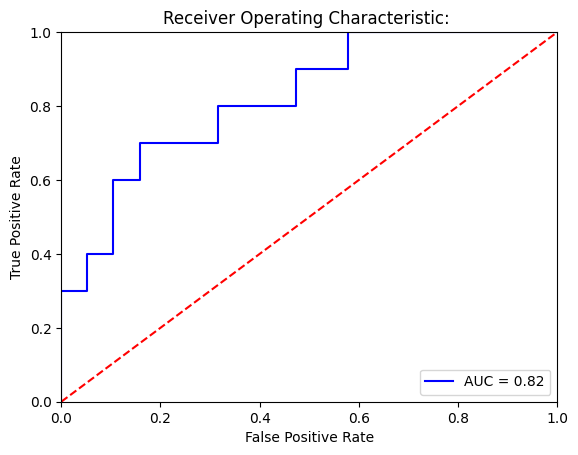

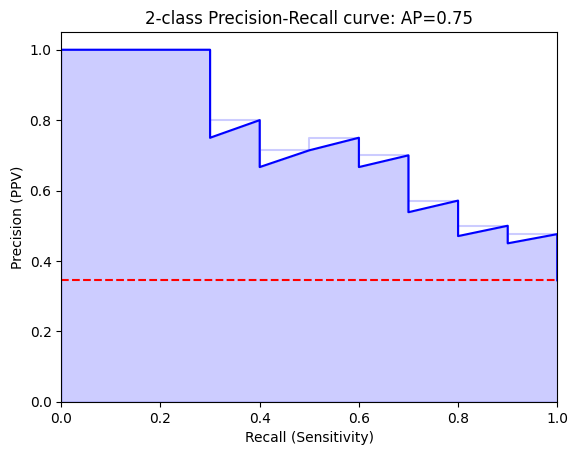

Threshold for best F1:
-0.7485896
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[16  3]
 [ 3  7]]


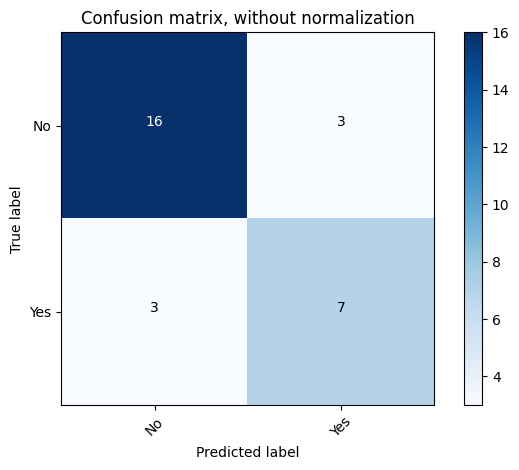

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.84      0.84        19
         Yes       0.70      0.70      0.70        10

    accuracy                           0.79        29
   macro avg       0.77      0.77      0.77        29
weighted avg       0.79      0.79      0.79        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[17  2]
 [ 5  5]]


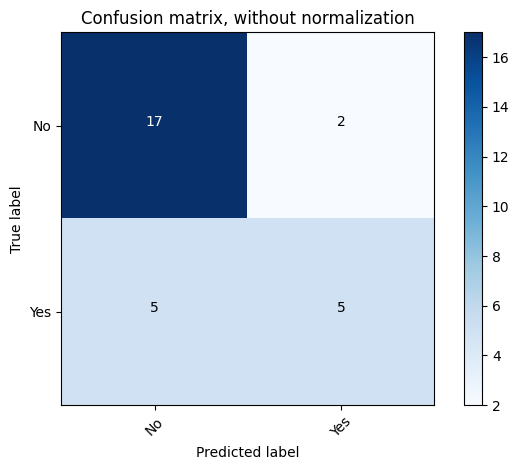

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.77      0.89      0.83        19
         Yes       0.71      0.50      0.59        10

    accuracy                           0.76        29
   macro avg       0.74      0.70      0.71        29
weighted avg       0.75      0.76      0.75        29



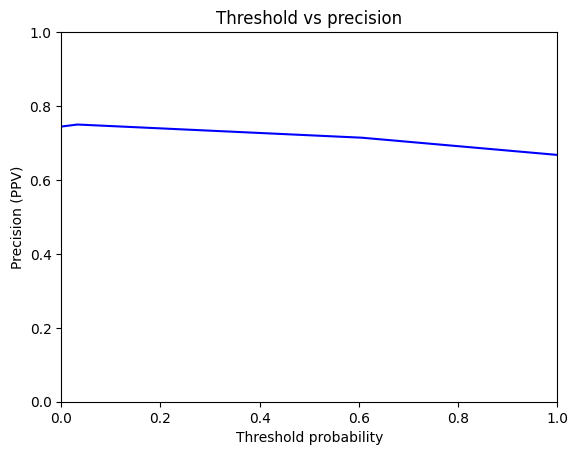

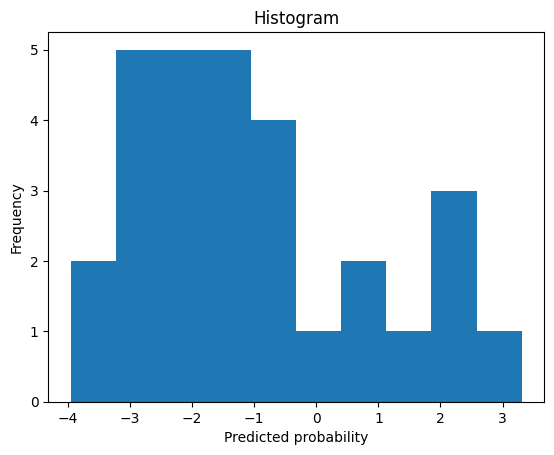

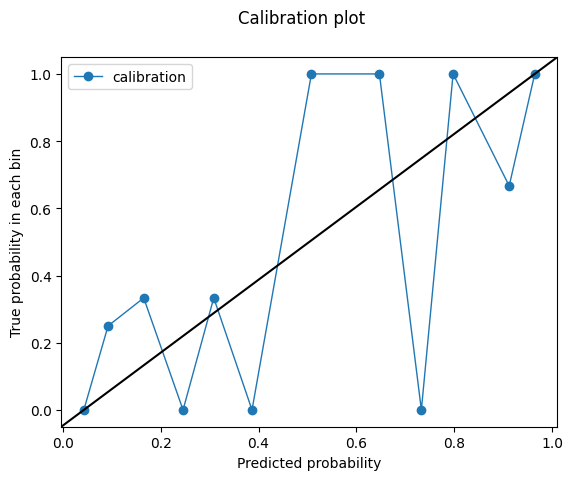

-0.7485896
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/420874481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.631578947368421
Outcome probability: 0.3448275862068966
Average precision score: 0.55
Best F1: 0.5806451612903225


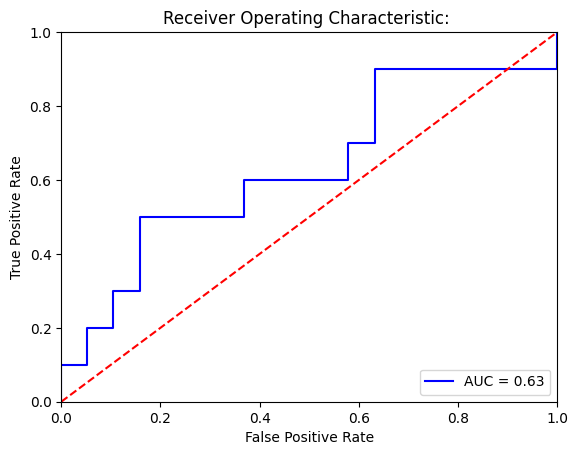

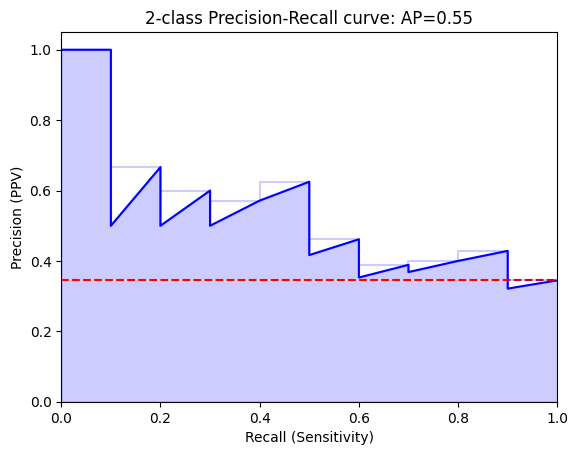

Threshold for best F1:
-2.4752667
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[ 7 12]
 [ 1  9]]


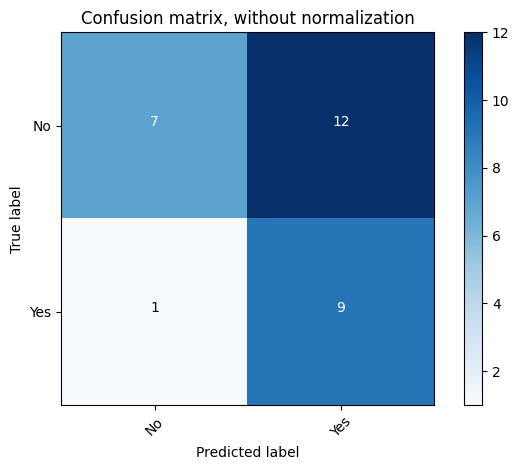

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.37      0.52        19
         Yes       0.43      0.90      0.58        10

    accuracy                           0.55        29
   macro avg       0.65      0.63      0.55        29
weighted avg       0.72      0.55      0.54        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[18  1]
 [ 8  2]]


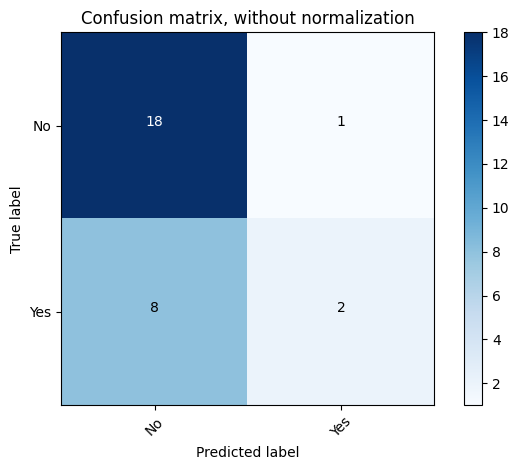

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.69      0.95      0.80        19
         Yes       0.67      0.20      0.31        10

    accuracy                           0.69        29
   macro avg       0.68      0.57      0.55        29
weighted avg       0.68      0.69      0.63        29



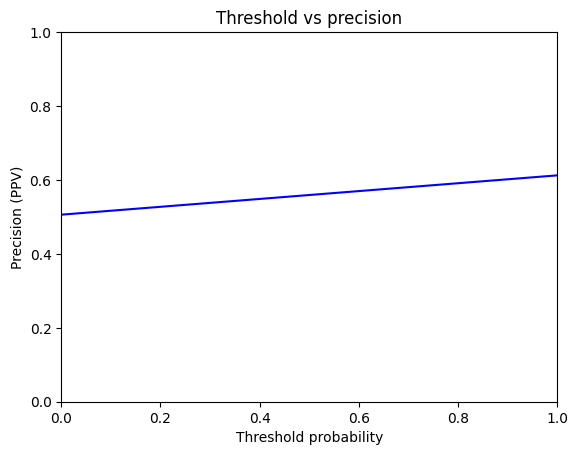

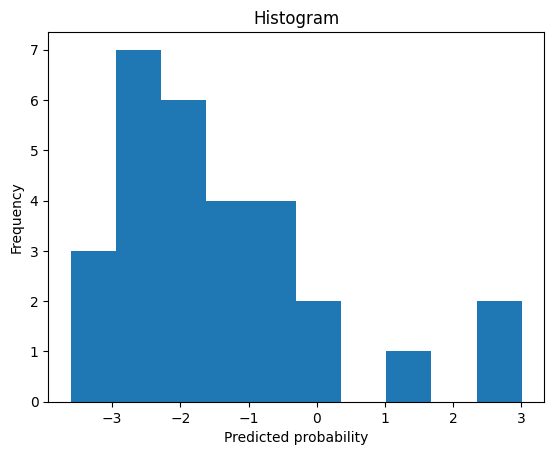

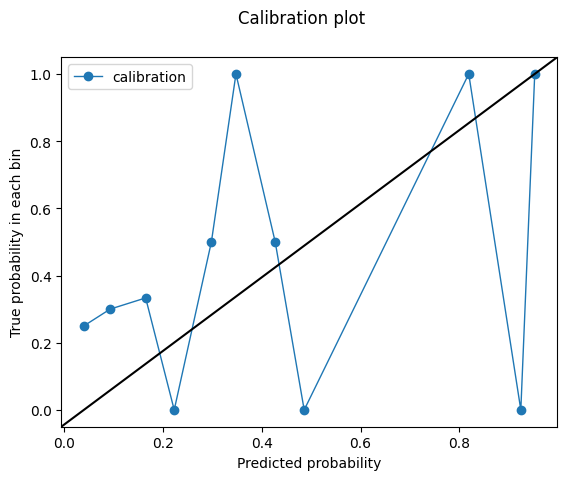

-2.4752667
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/420874481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.6105263157894737
Outcome probability: 0.3448275862068966
Average precision score: 0.48
Best F1: 0.5517241379310345


/data/clin_notes_outcomes/impression_bert/recist/revision_code_data/cancer_specific_evals/utils_102023.py:111: RuntimeWarning: invalid value encountered in divide
  F1 = 2*((precision*recall)/(precision+recall))


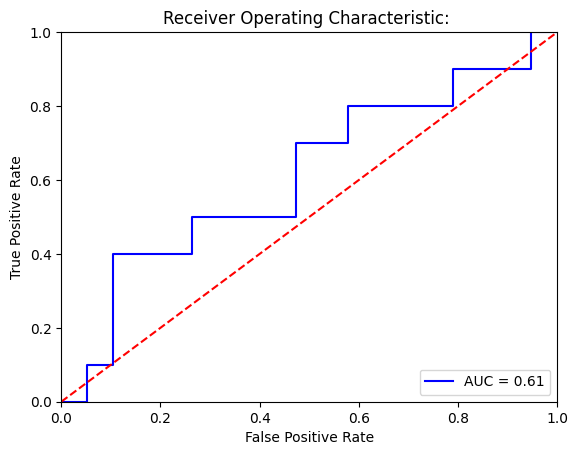

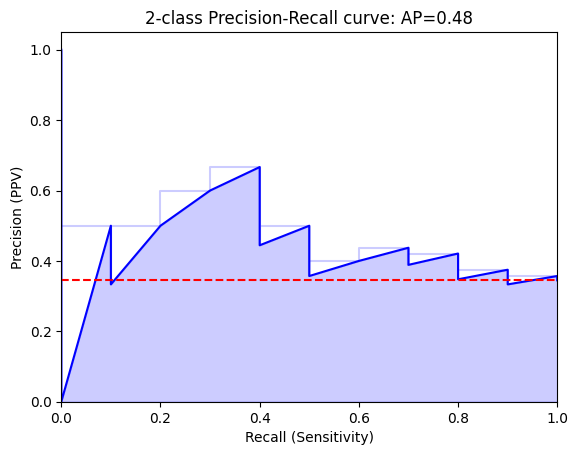

Threshold for best F1:
5.0958595
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[18  1]
 [10  0]]


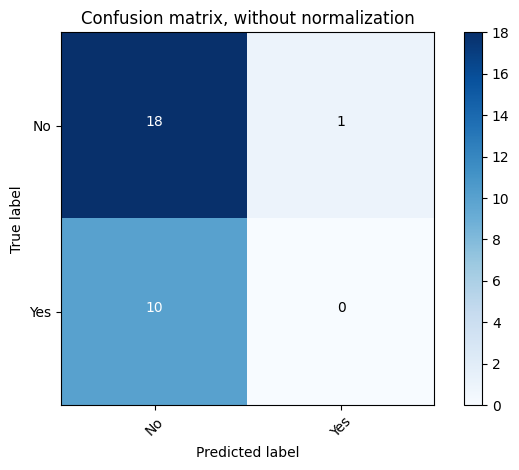

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.64      0.95      0.77        19
         Yes       0.00      0.00      0.00        10

    accuracy                           0.62        29
   macro avg       0.32      0.47      0.38        29
weighted avg       0.42      0.62      0.50        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[13  6]
 [ 5  5]]


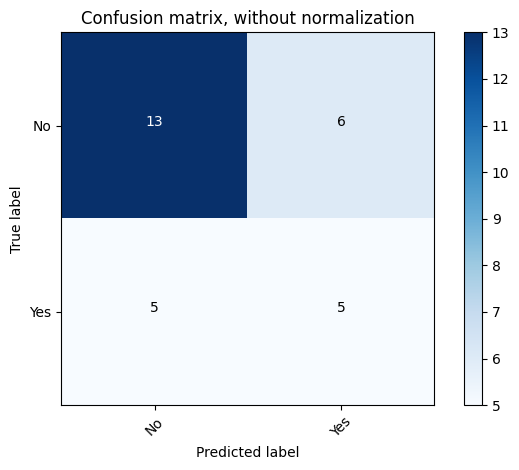

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.72      0.68      0.70        19
         Yes       0.45      0.50      0.48        10

    accuracy                           0.62        29
   macro avg       0.59      0.59      0.59        29
weighted avg       0.63      0.62      0.62        29



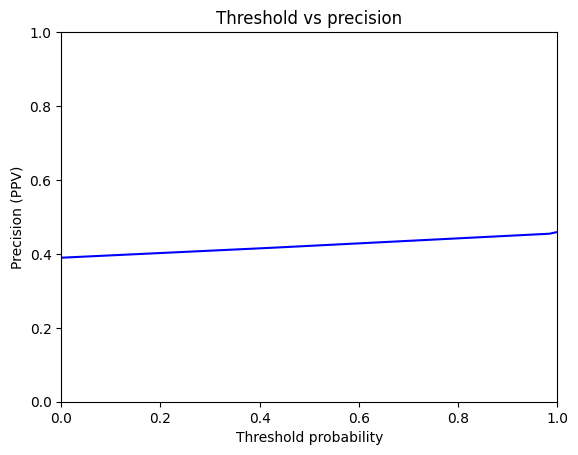

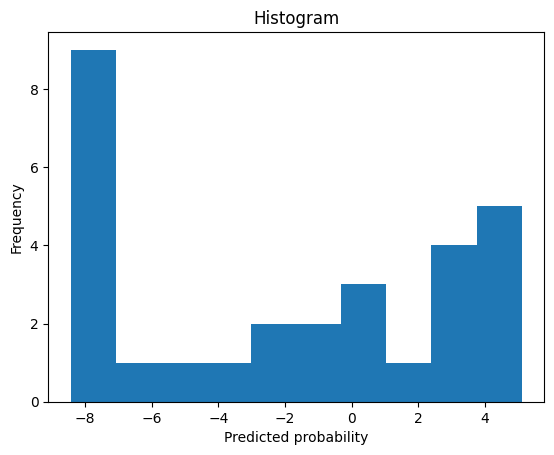

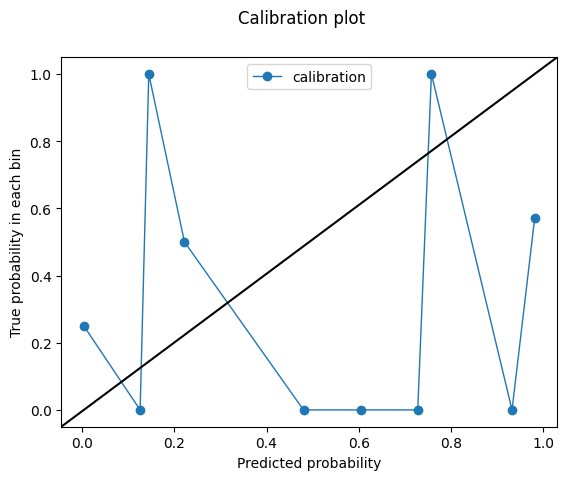

5.0958595
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/420874481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.7421052631578948
Outcome probability: 0.3448275862068966
Average precision score: 0.69
Best F1: 0.64


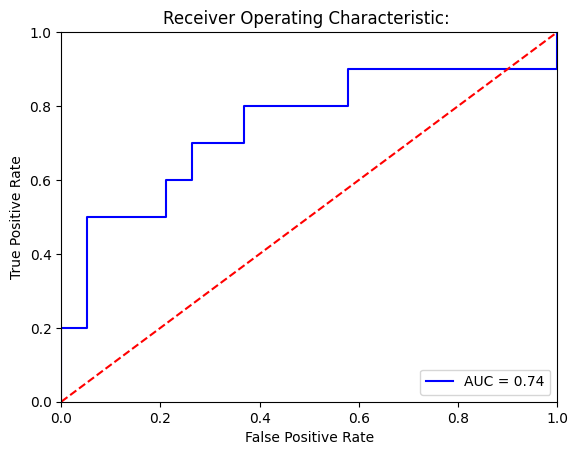

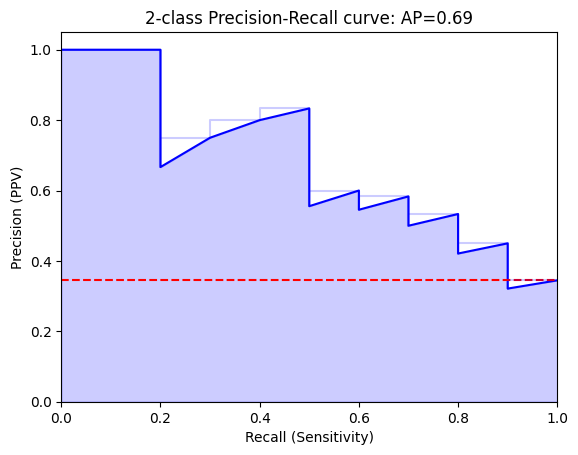

Threshold for best F1:
-1.2140814
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[12  7]
 [ 2  8]]


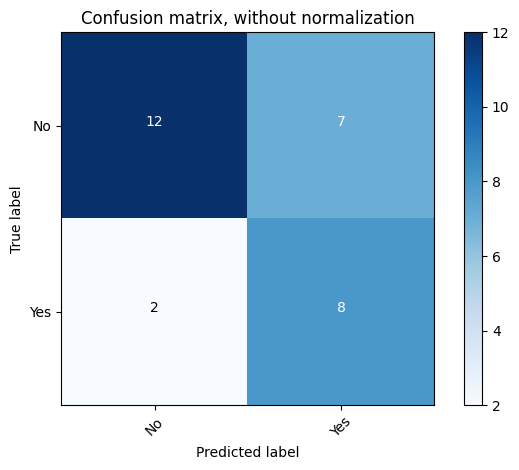

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.63      0.73        19
         Yes       0.53      0.80      0.64        10

    accuracy                           0.69        29
   macro avg       0.70      0.72      0.68        29
weighted avg       0.75      0.69      0.70        29

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[18  1]
 [ 6  4]]


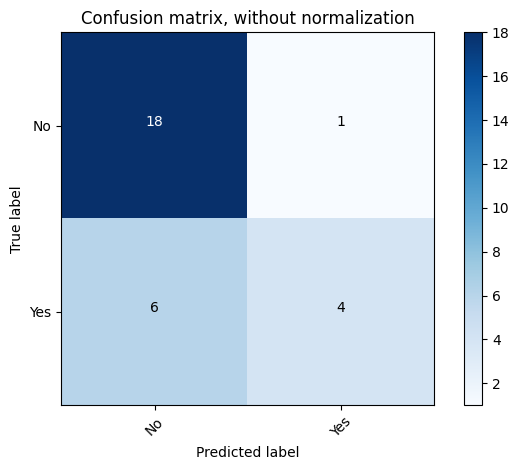

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.75      0.95      0.84        19
         Yes       0.80      0.40      0.53        10

    accuracy                           0.76        29
   macro avg       0.78      0.67      0.69        29
weighted avg       0.77      0.76      0.73        29



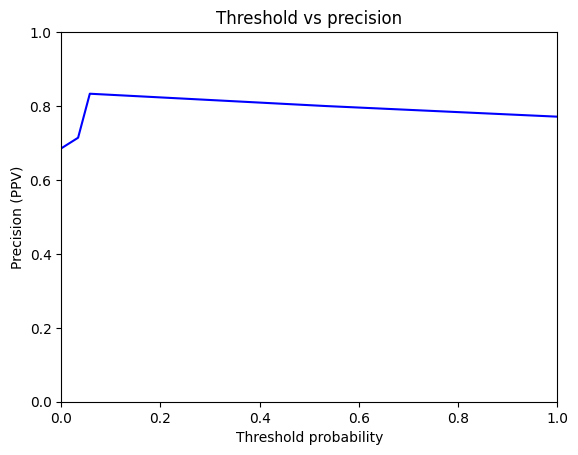

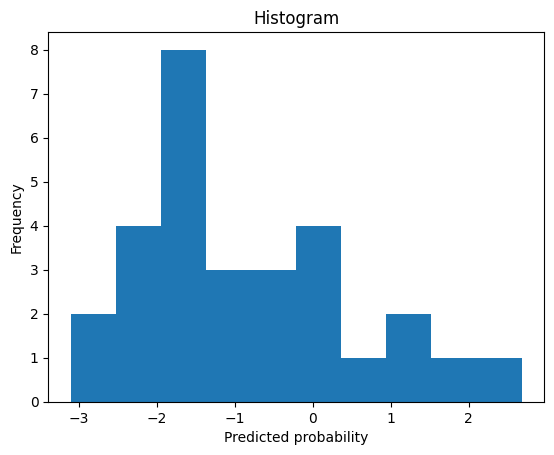

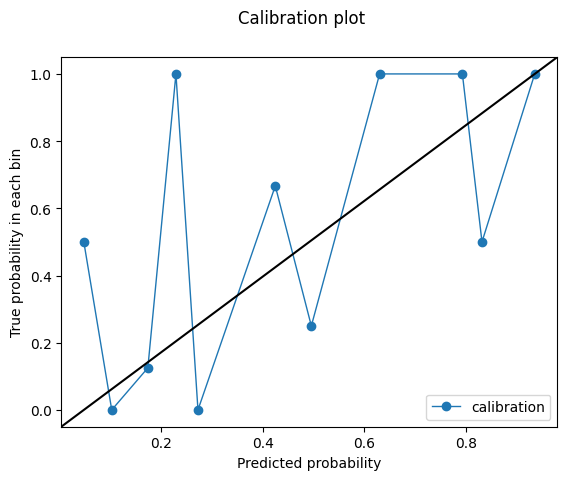

-1.2140814


In [35]:
print('model performance for Hispanic patients')

for model_type in model_paths:

    print('validation set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.HISPANIC_IND == 'Y' ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Hispanic patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.pd_pred, valid_output.outcome, graph=True))


model performance for Hispanic patients
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1805409880.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9118644067796611
Outcome probability: 0.20270270270270271
Average precision score: 0.79
Best F1: 0.7142857142857142


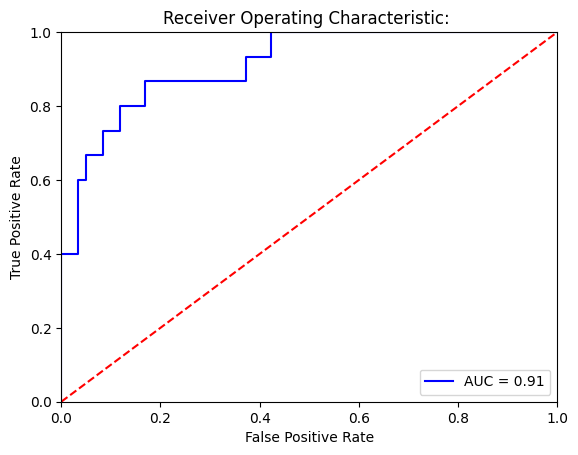

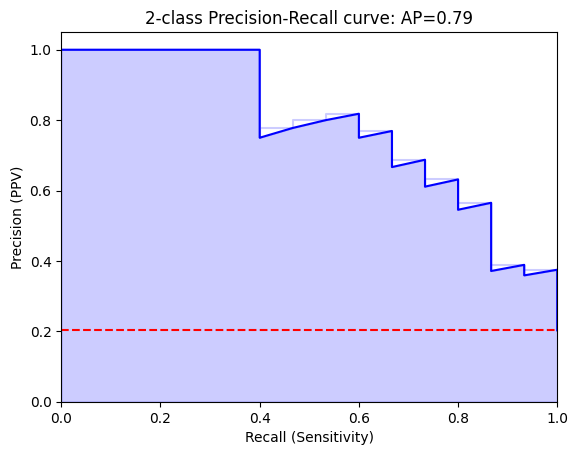

Threshold for best F1:
0.07003966
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[56  3]
 [ 5 10]]


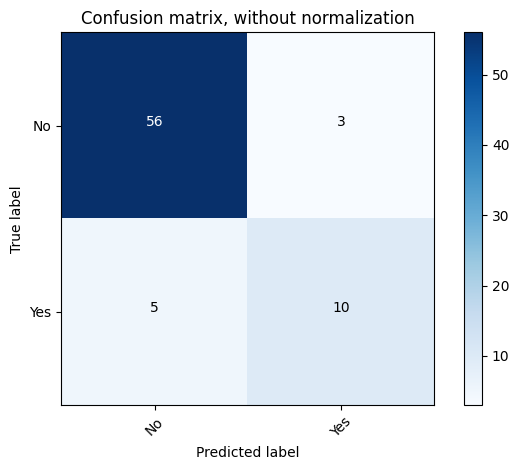

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.95      0.93        59
         Yes       0.77      0.67      0.71        15

    accuracy                           0.89        74
   macro avg       0.84      0.81      0.82        74
weighted avg       0.89      0.89      0.89        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[57  2]
 [ 8  7]]


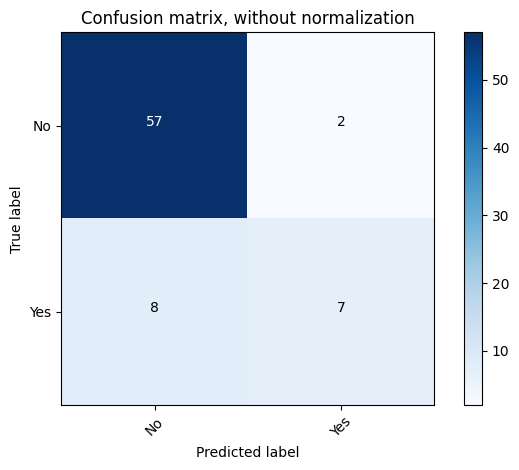

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.97      0.92        59
         Yes       0.78      0.47      0.58        15

    accuracy                           0.86        74
   macro avg       0.83      0.72      0.75        74
weighted avg       0.86      0.86      0.85        74



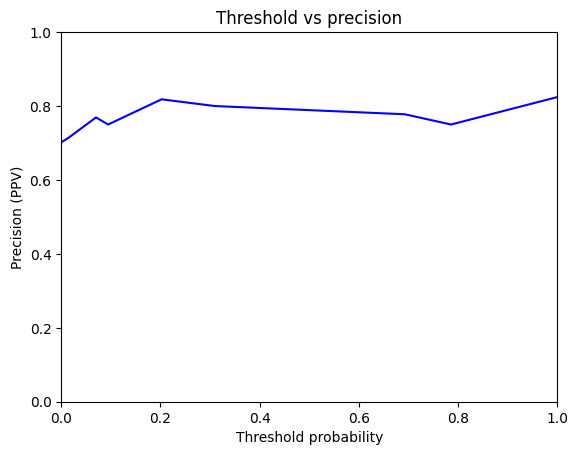

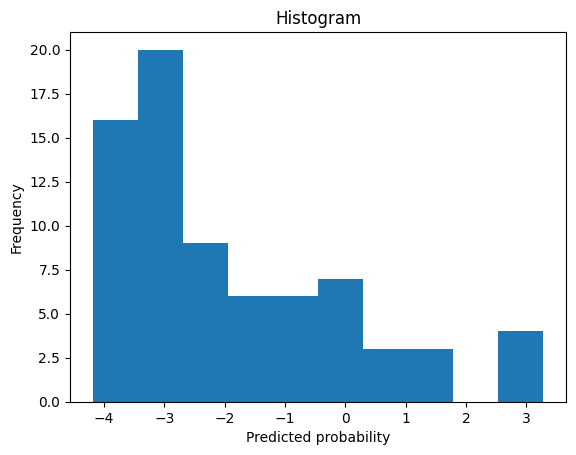

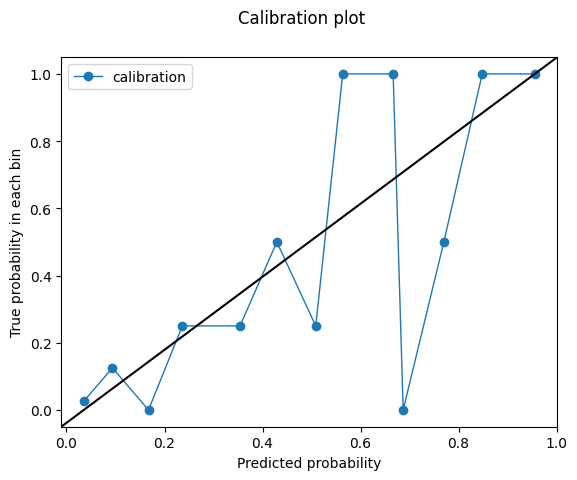

0.07003966
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1805409880.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9084745762711864
Outcome probability: 0.20270270270270271
Average precision score: 0.82
Best F1: 0.8148148148148148


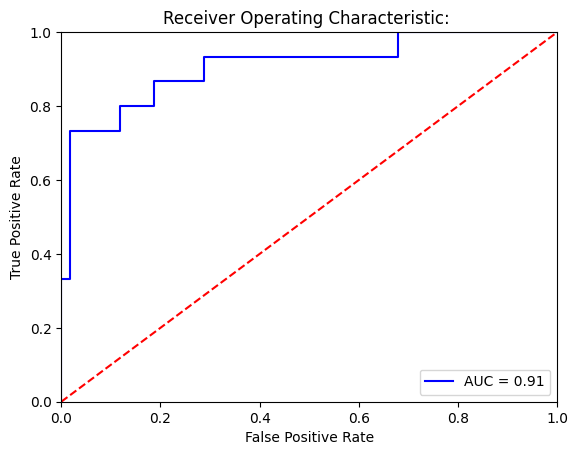

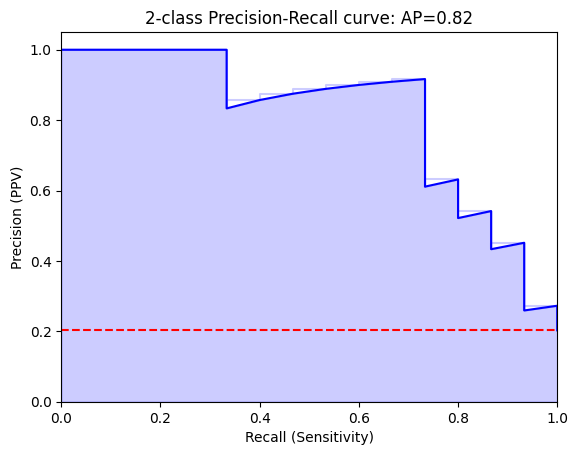

Threshold for best F1:
-0.26771396
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[58  1]
 [ 4 11]]


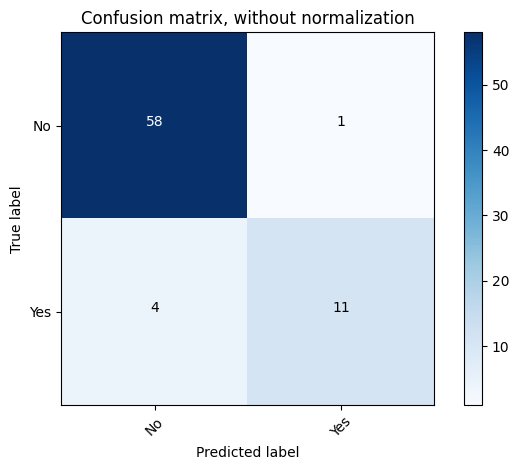

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.98      0.96        59
         Yes       0.92      0.73      0.81        15

    accuracy                           0.93        74
   macro avg       0.93      0.86      0.89        74
weighted avg       0.93      0.93      0.93        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[58  1]
 [10  5]]


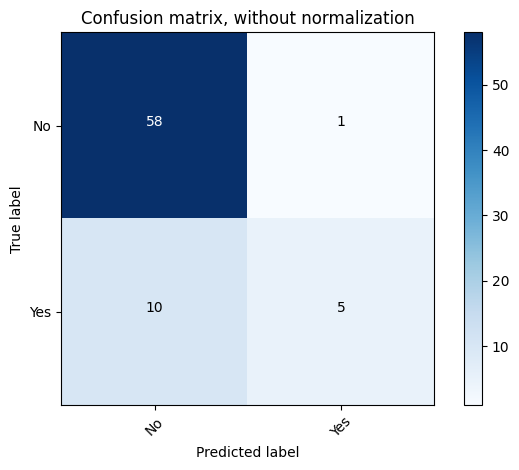

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.98      0.91        59
         Yes       0.83      0.33      0.48        15

    accuracy                           0.85        74
   macro avg       0.84      0.66      0.69        74
weighted avg       0.85      0.85      0.82        74



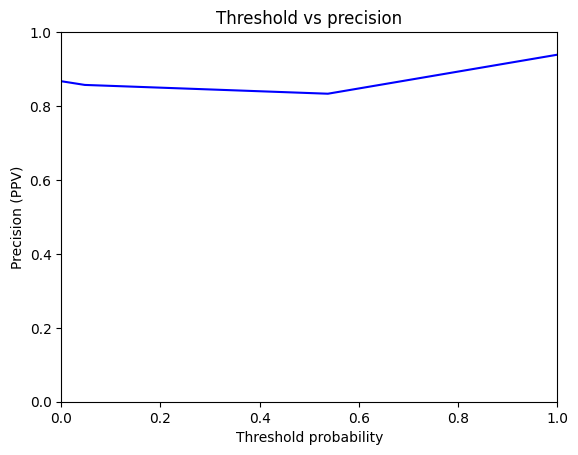

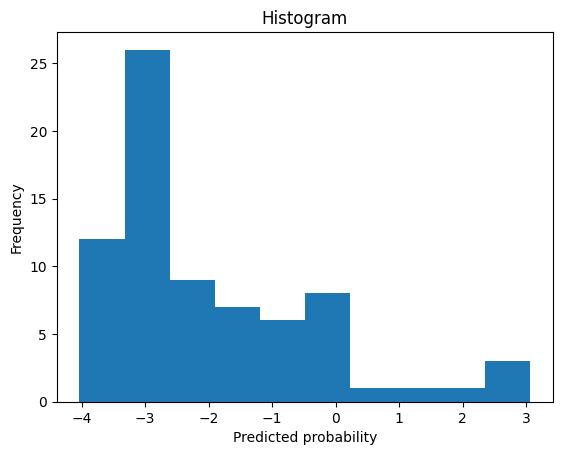

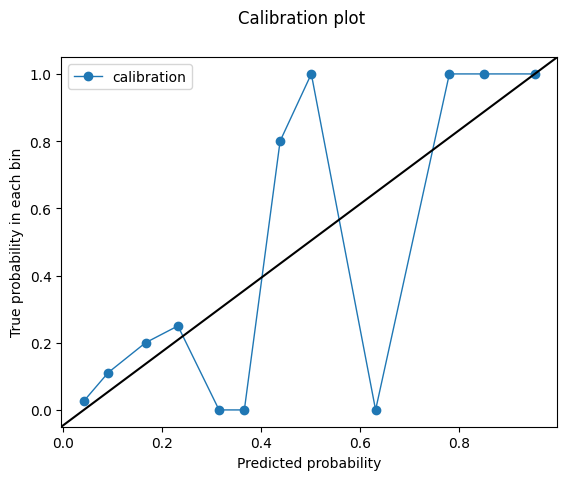

-0.26771396
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1805409880.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.896045197740113
Outcome probability: 0.20270270270270271
Average precision score: 0.77
Best F1: 0.7272727272727272


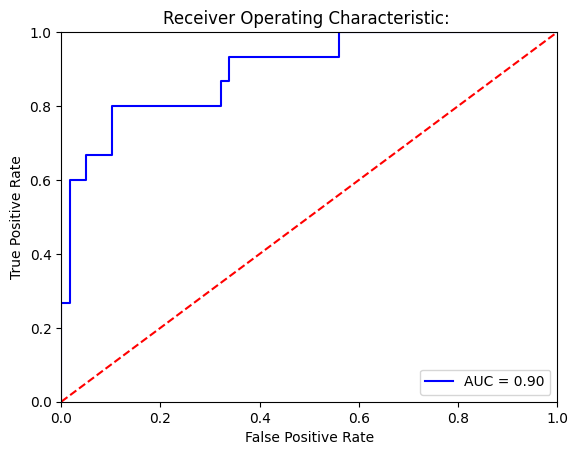

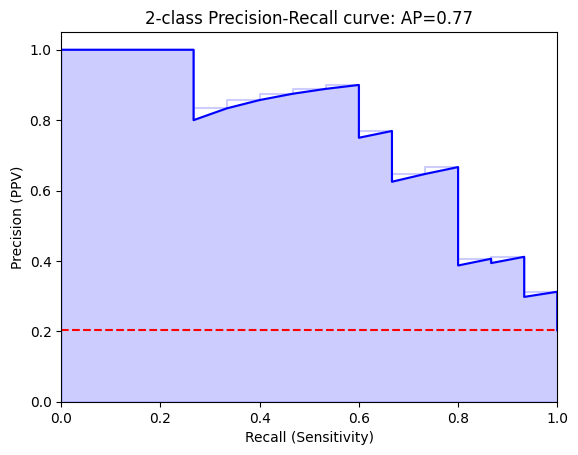

Threshold for best F1:
-1.5681472
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[53  6]
 [ 3 12]]


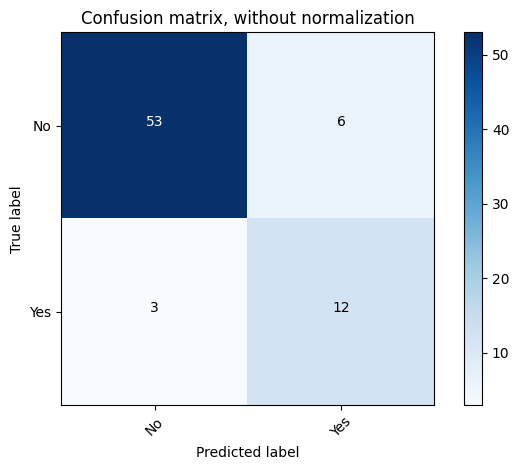

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.90      0.92        59
         Yes       0.67      0.80      0.73        15

    accuracy                           0.88        74
   macro avg       0.81      0.85      0.82        74
weighted avg       0.89      0.88      0.88        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[59  0]
 [11  4]]


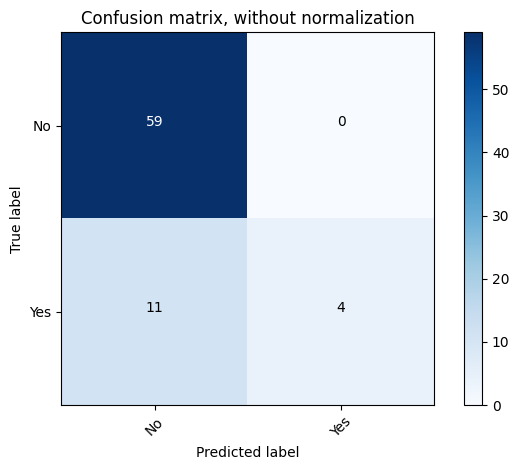

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      1.00      0.91        59
         Yes       1.00      0.27      0.42        15

    accuracy                           0.85        74
   macro avg       0.92      0.63      0.67        74
weighted avg       0.87      0.85      0.81        74



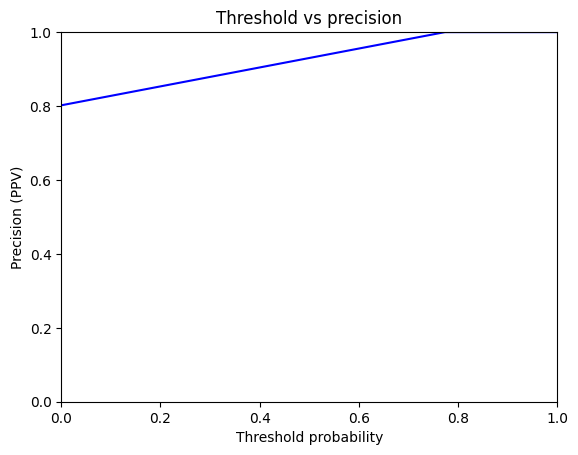

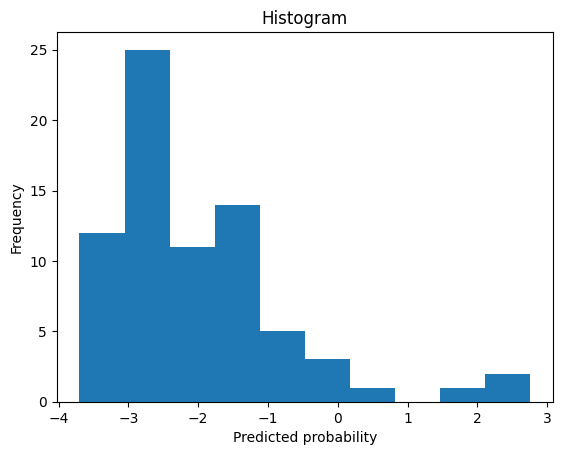

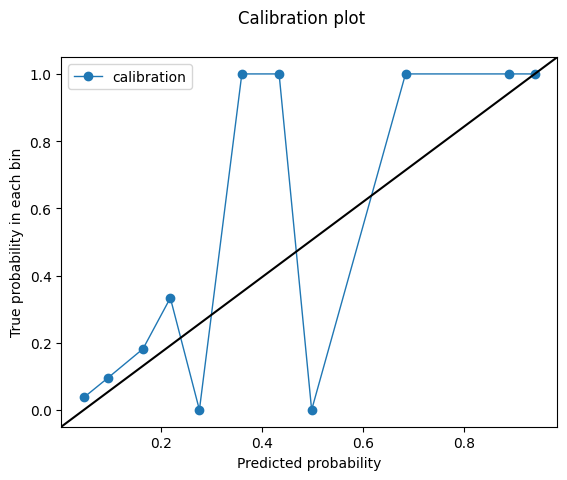

-1.5681472
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1805409880.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.9039548022598869
Outcome probability: 0.20270270270270271
Average precision score: 0.80
Best F1: 0.7407407407407408


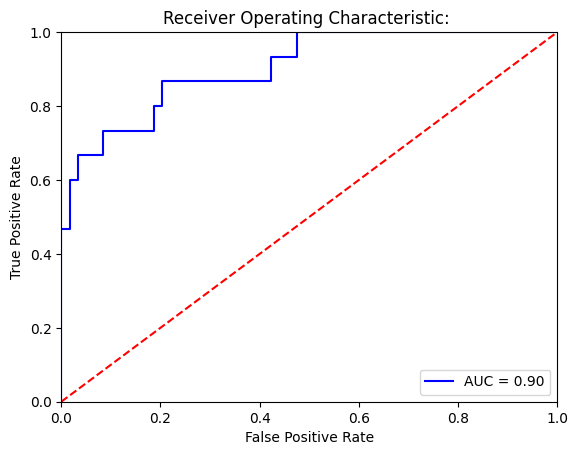

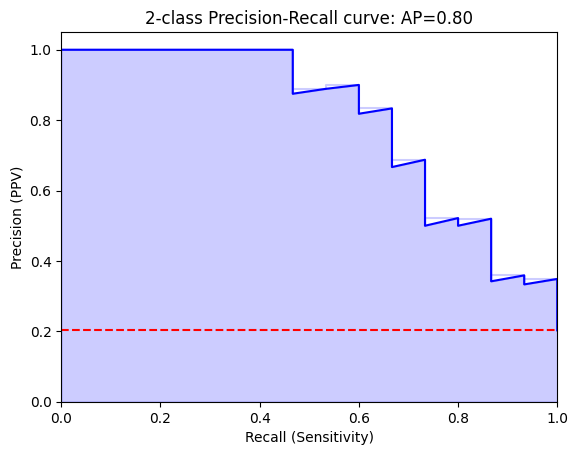

Threshold for best F1:
2.6182969
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[57  2]
 [ 5 10]]


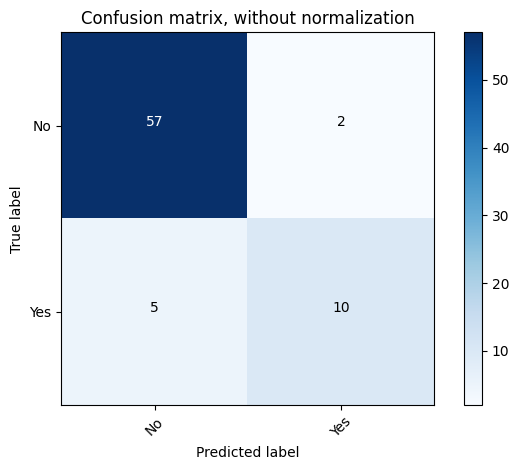

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.97      0.94        59
         Yes       0.83      0.67      0.74        15

    accuracy                           0.91        74
   macro avg       0.88      0.82      0.84        74
weighted avg       0.90      0.91      0.90        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[54  5]
 [ 4 11]]


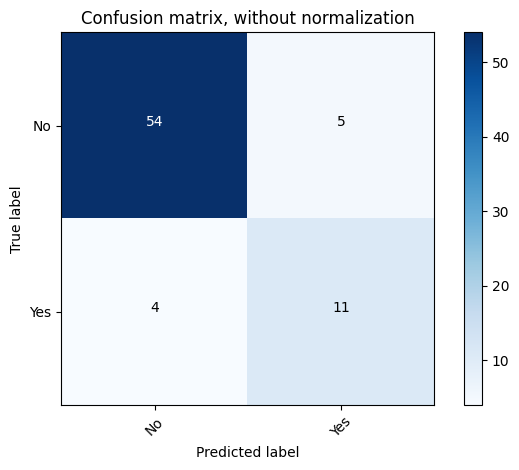

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.92      0.92        59
         Yes       0.69      0.73      0.71        15

    accuracy                           0.88        74
   macro avg       0.81      0.82      0.82        74
weighted avg       0.88      0.88      0.88        74



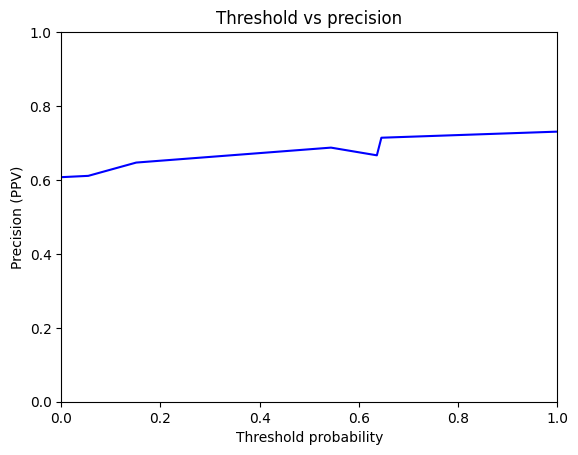

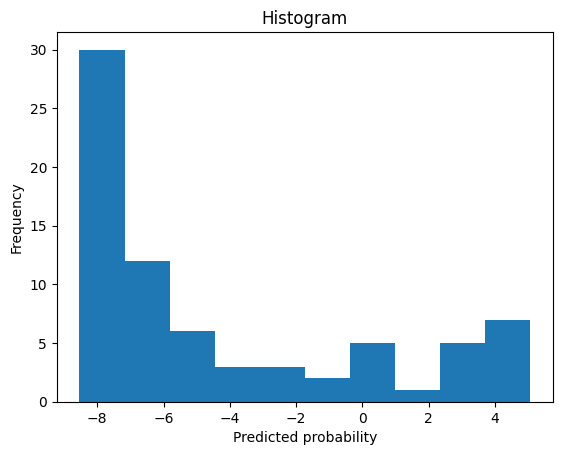

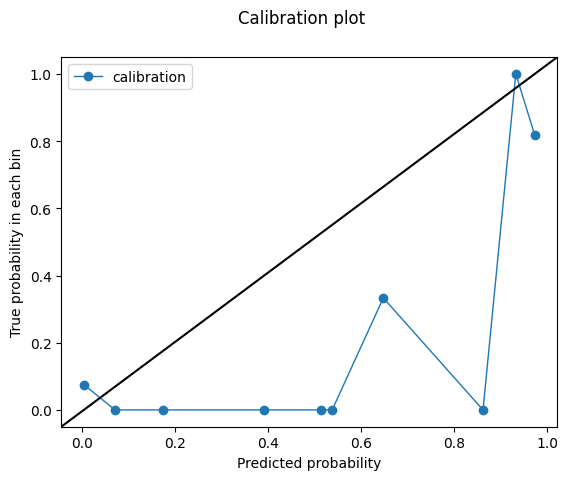

2.6182969
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1805409880.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Hispanic patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.92090395480226
Outcome probability: 0.20270270270270271
Average precision score: 0.76
Best F1: 0.7647058823529413


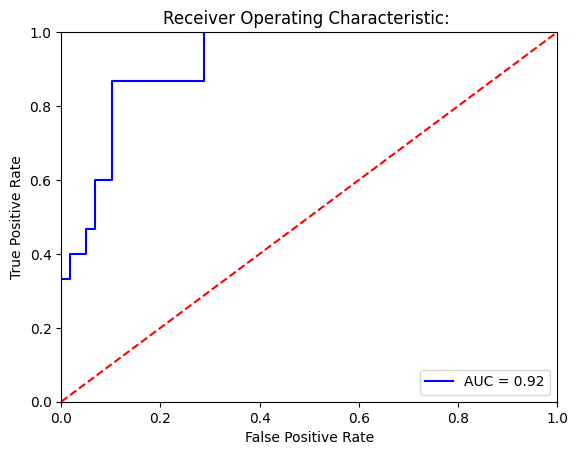

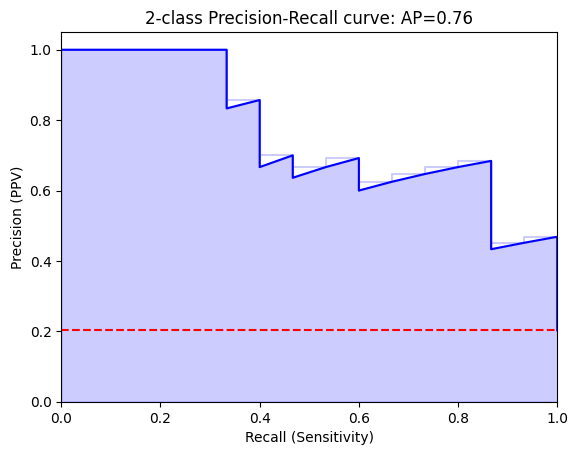

Threshold for best F1:
-0.9048126
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[53  6]
 [ 2 13]]


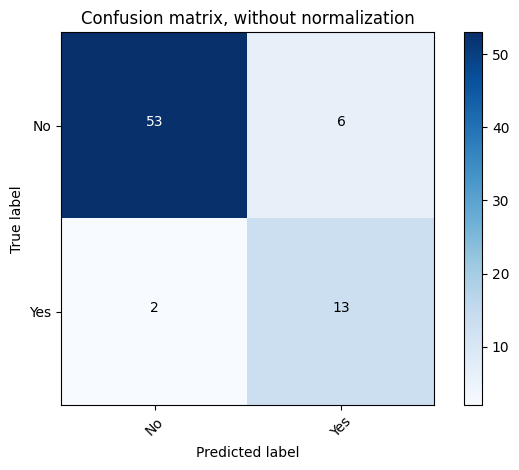

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.96      0.90      0.93        59
         Yes       0.68      0.87      0.76        15

    accuracy                           0.89        74
   macro avg       0.82      0.88      0.85        74
weighted avg       0.91      0.89      0.90        74

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[59  0]
 [10  5]]


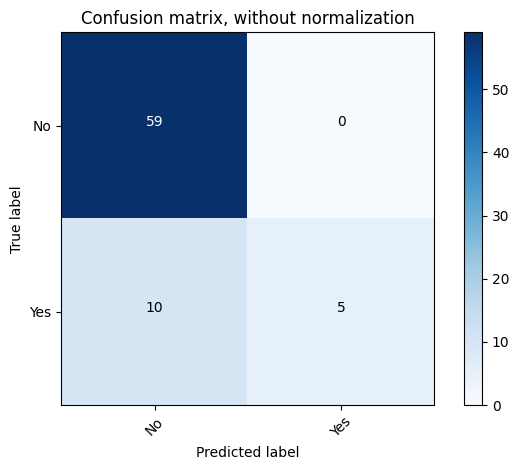

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      1.00      0.92        59
         Yes       1.00      0.33      0.50        15

    accuracy                           0.86        74
   macro avg       0.93      0.67      0.71        74
weighted avg       0.88      0.86      0.84        74



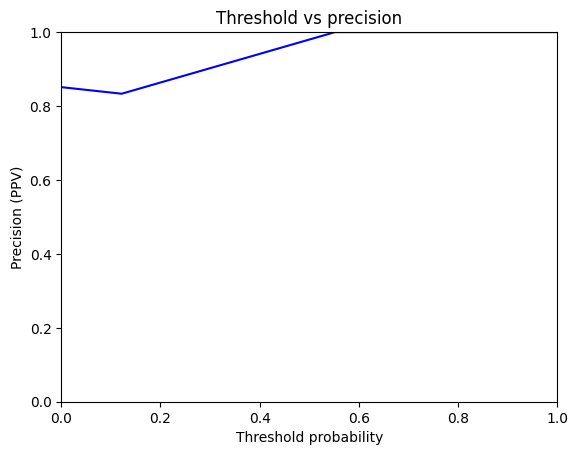

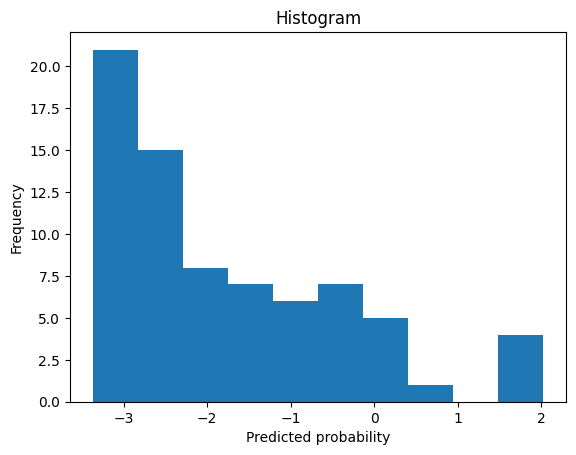

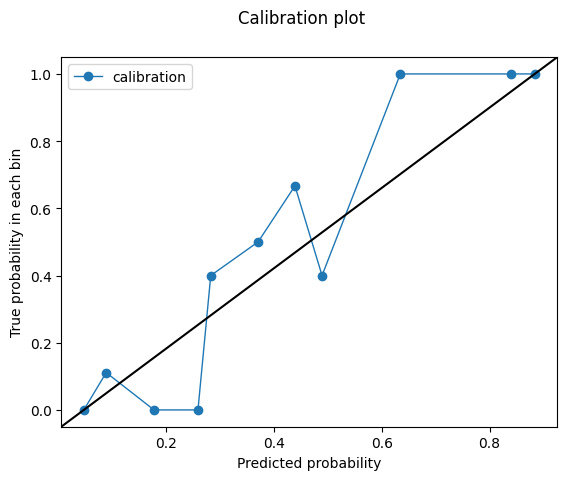

-0.9048126


In [36]:
print('model performance for Hispanic patients')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.HISPANIC_IND == 'Y' ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Hispanic patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.pd_pred, test_output.outcome, graph=True))


model performance for men
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/4154354151.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.890843179377014
Outcome probability: 0.2087912087912088
Average precision score: 0.72
Best F1: 0.6988847583643122


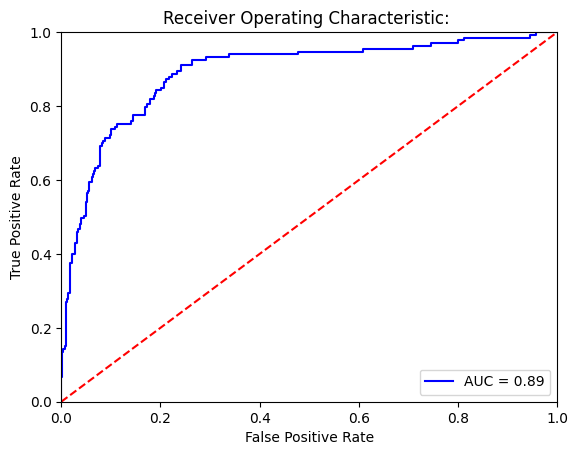

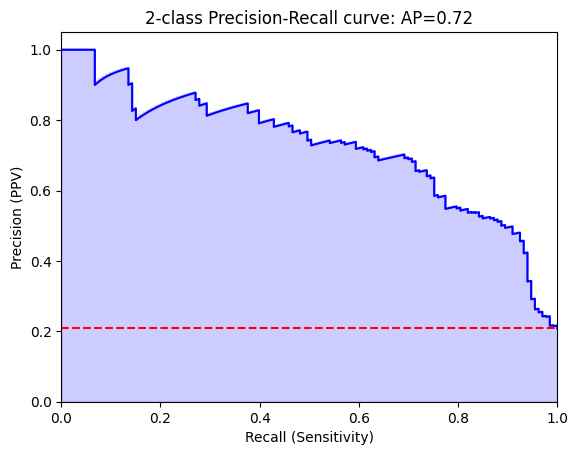

Threshold for best F1:
0.117290065
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[462  42]
 [ 39  94]]


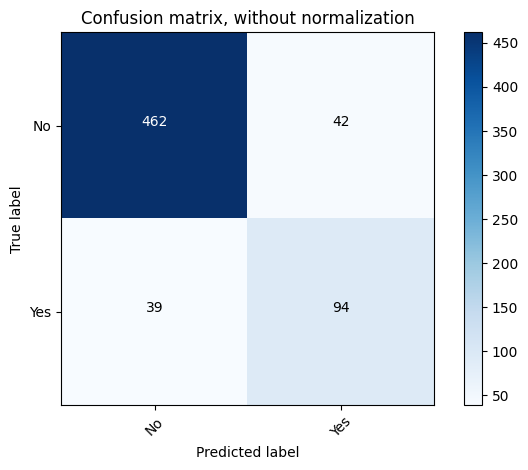

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.92      0.92       504
         Yes       0.69      0.71      0.70       133

    accuracy                           0.87       637
   macro avg       0.81      0.81      0.81       637
weighted avg       0.87      0.87      0.87       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[472  32]
 [ 51  82]]


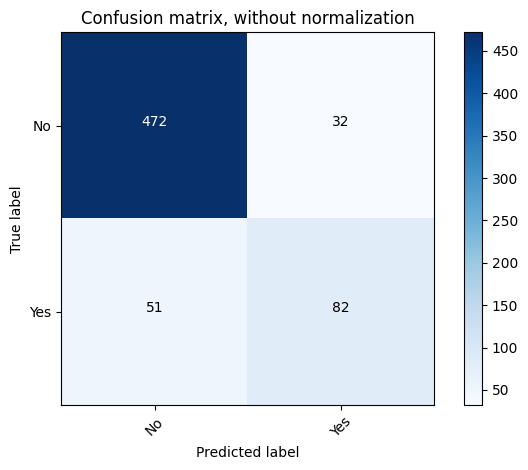

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.94      0.92       504
         Yes       0.72      0.62      0.66       133

    accuracy                           0.87       637
   macro avg       0.81      0.78      0.79       637
weighted avg       0.86      0.87      0.87       637



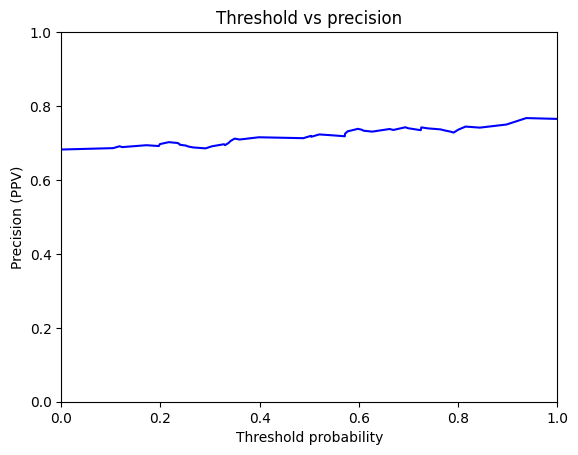

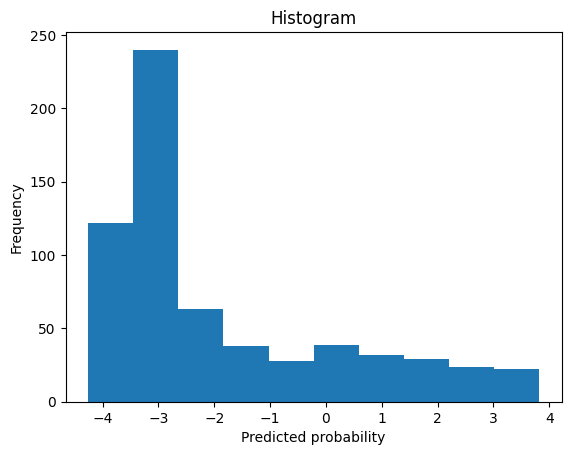

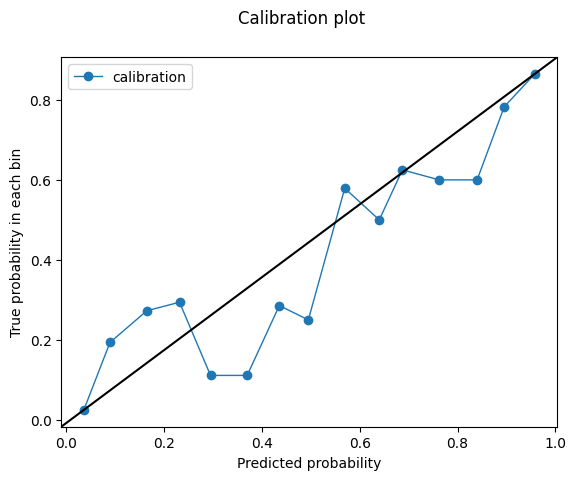

0.117290065
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/4154354151.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8869196801527628
Outcome probability: 0.2087912087912088
Average precision score: 0.68
Best F1: 0.6808510638297872


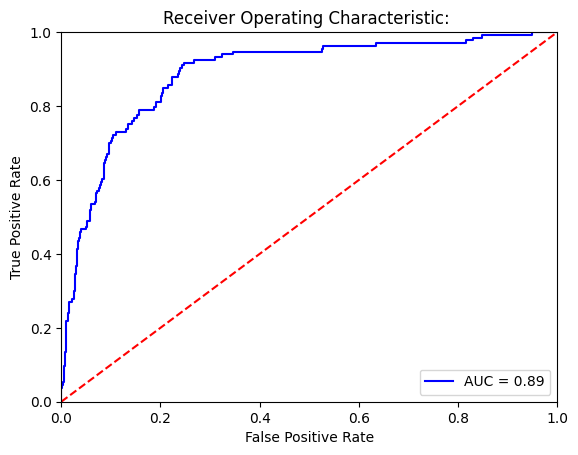

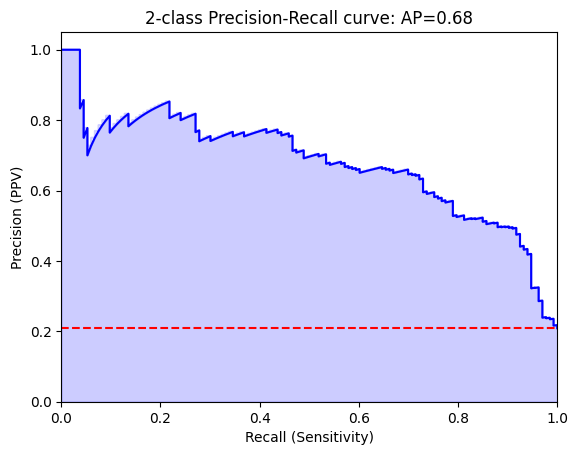

Threshold for best F1:
-0.68069464
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[451  53]
 [ 37  96]]


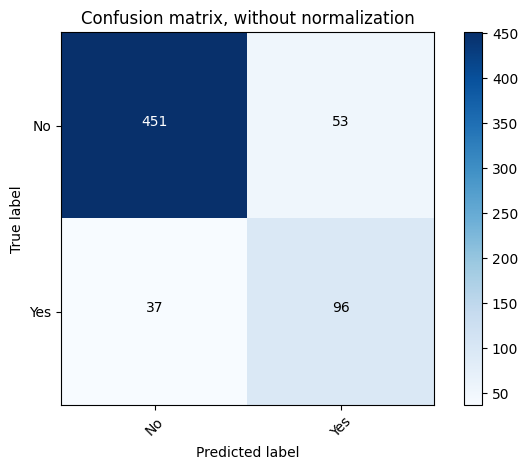

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.89      0.91       504
         Yes       0.64      0.72      0.68       133

    accuracy                           0.86       637
   macro avg       0.78      0.81      0.80       637
weighted avg       0.87      0.86      0.86       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[484  20]
 [ 72  61]]


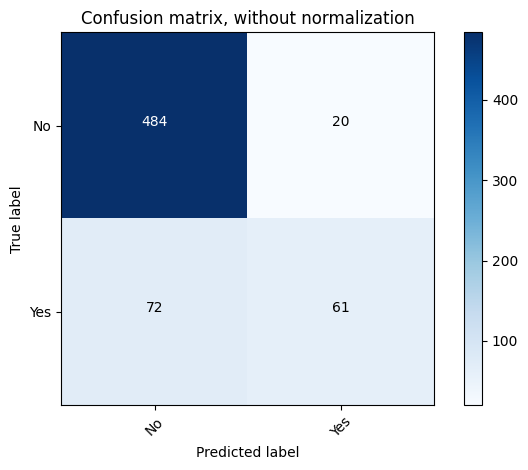

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.96      0.91       504
         Yes       0.75      0.46      0.57       133

    accuracy                           0.86       637
   macro avg       0.81      0.71      0.74       637
weighted avg       0.85      0.86      0.84       637



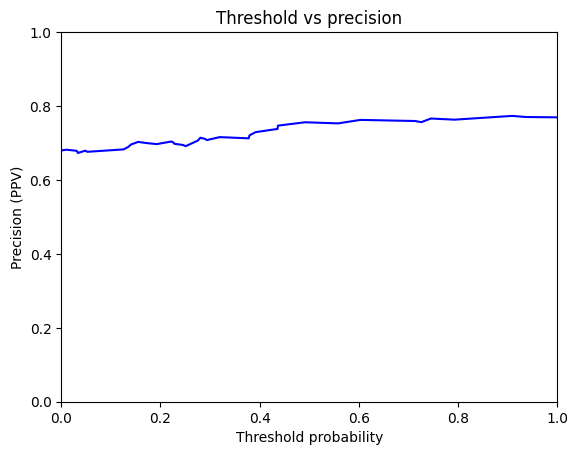

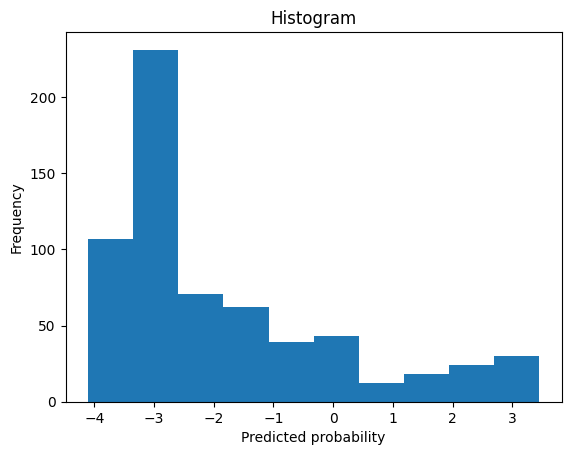

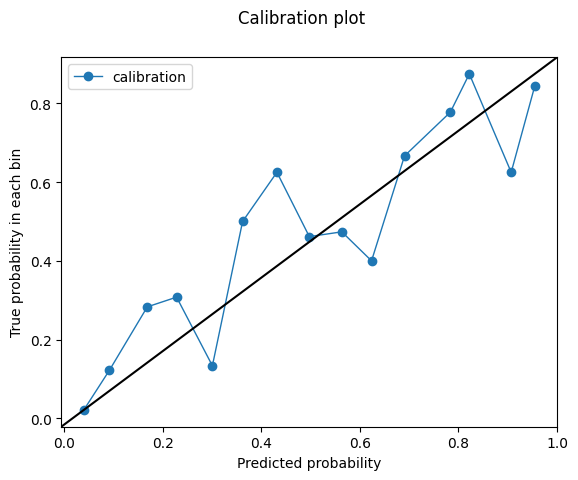

-0.68069464
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/4154354151.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.855188566654732
Outcome probability: 0.2087912087912088
Average precision score: 0.64
Best F1: 0.6109324758842444


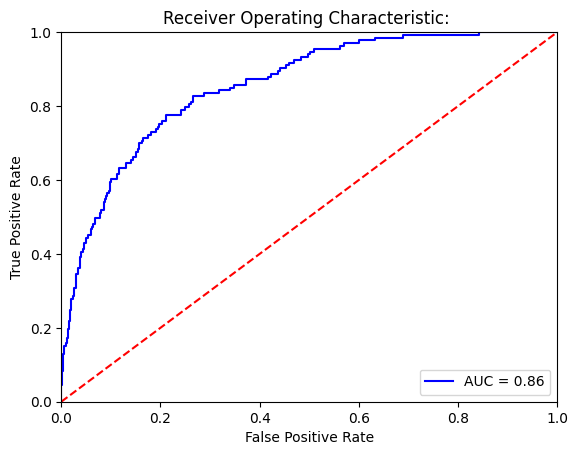

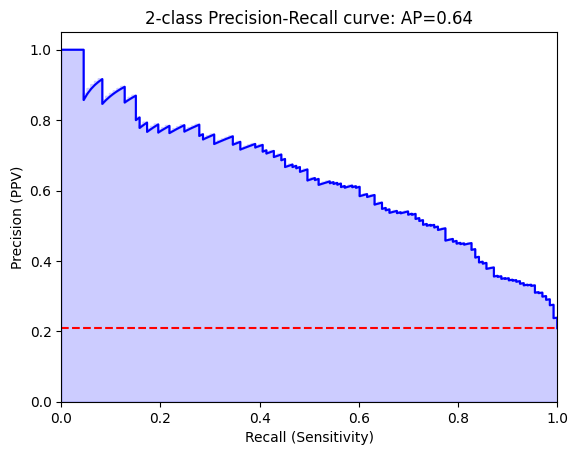

Threshold for best F1:
-1.8142602
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[421  83]
 [ 38  95]]


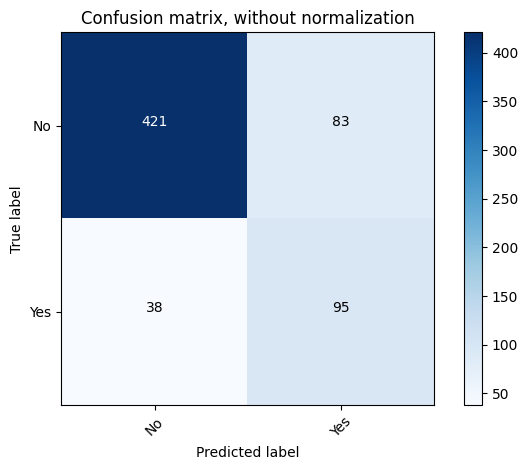

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.84      0.87       504
         Yes       0.53      0.71      0.61       133

    accuracy                           0.81       637
   macro avg       0.73      0.77      0.74       637
weighted avg       0.84      0.81      0.82       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[494  10]
 [ 97  36]]


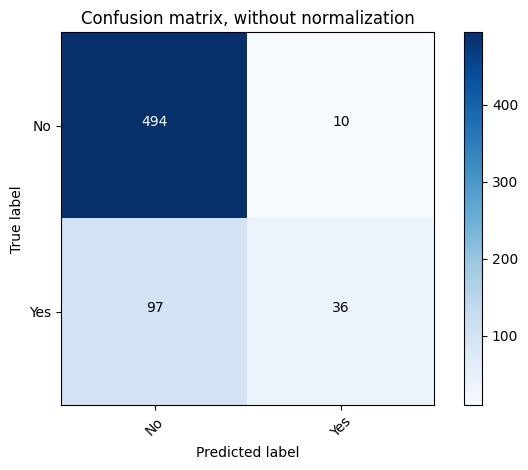

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.98      0.90       504
         Yes       0.78      0.27      0.40       133

    accuracy                           0.83       637
   macro avg       0.81      0.63      0.65       637
weighted avg       0.82      0.83      0.80       637



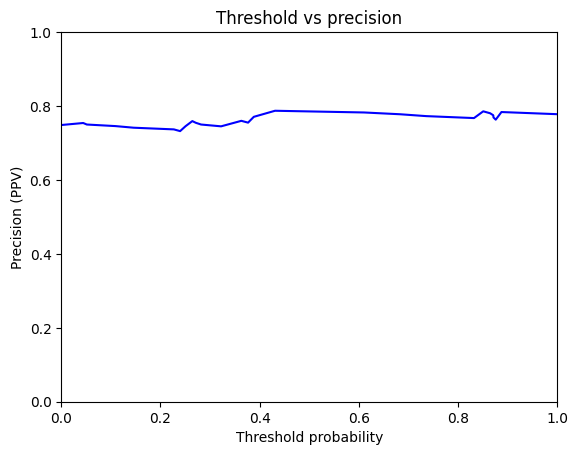

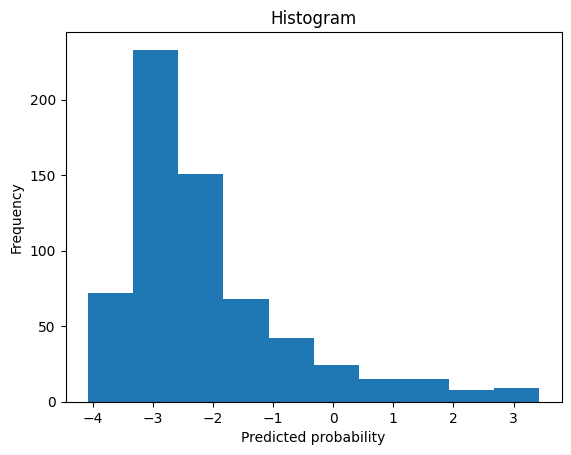

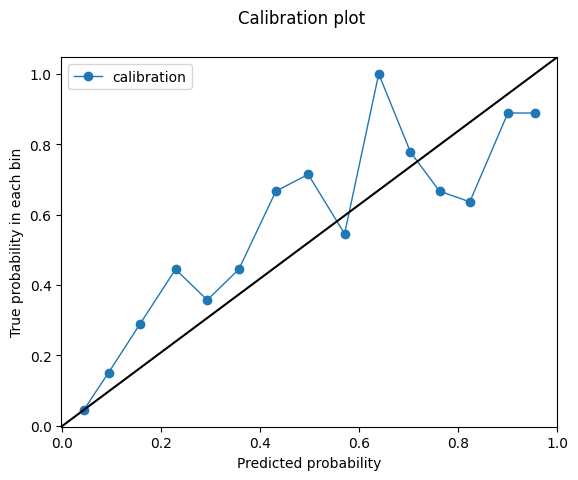

-1.8142602
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/4154354151.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8346610574054182
Outcome probability: 0.2087912087912088
Average precision score: 0.63
Best F1: 0.5928338762214983


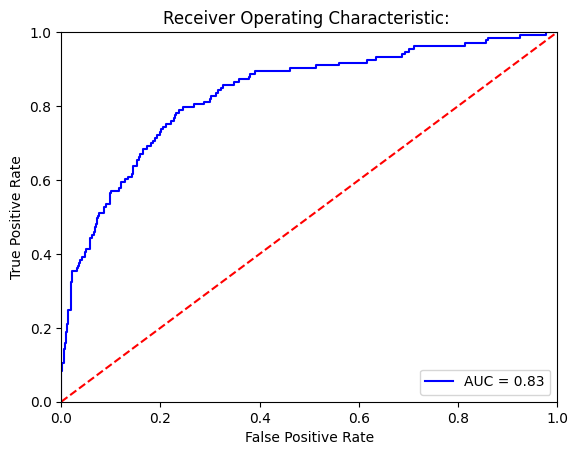

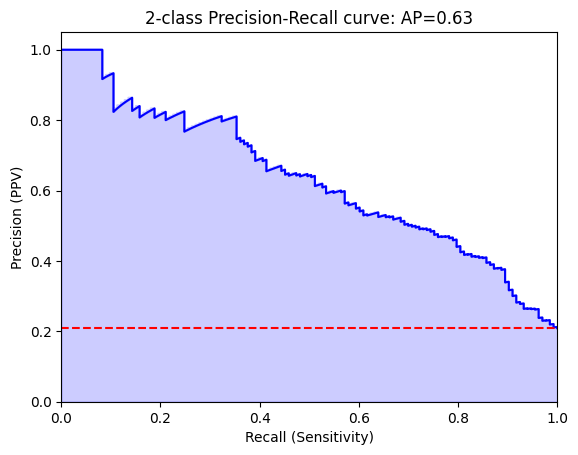

Threshold for best F1:
-1.638176
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[421  83]
 [ 42  91]]


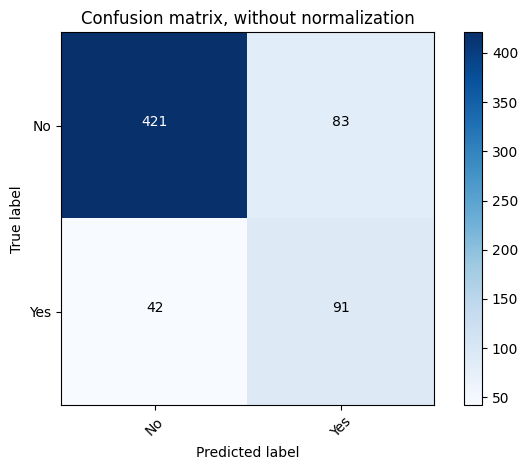

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.84      0.87       504
         Yes       0.52      0.68      0.59       133

    accuracy                           0.80       637
   macro avg       0.72      0.76      0.73       637
weighted avg       0.83      0.80      0.81       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[443  61]
 [ 56  77]]


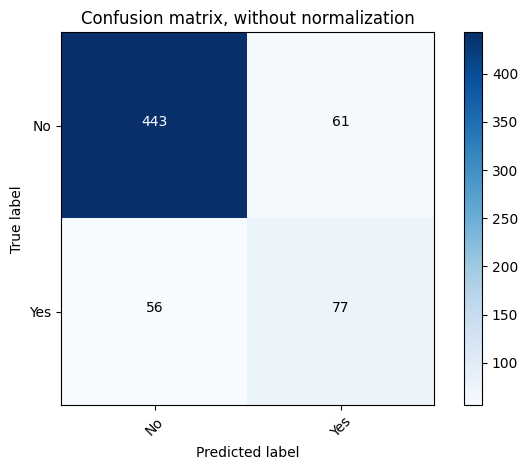

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.88      0.88       504
         Yes       0.56      0.58      0.57       133

    accuracy                           0.82       637
   macro avg       0.72      0.73      0.73       637
weighted avg       0.82      0.82      0.82       637



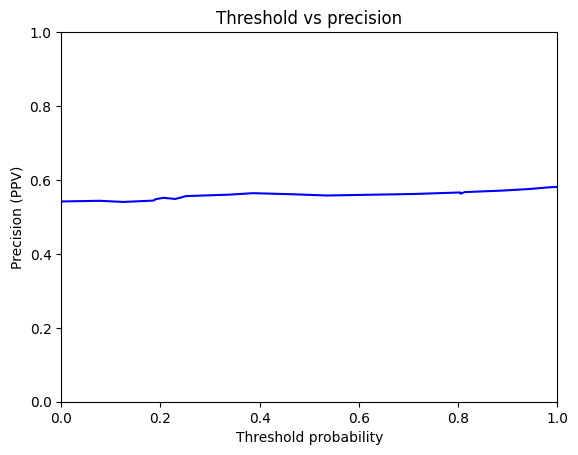

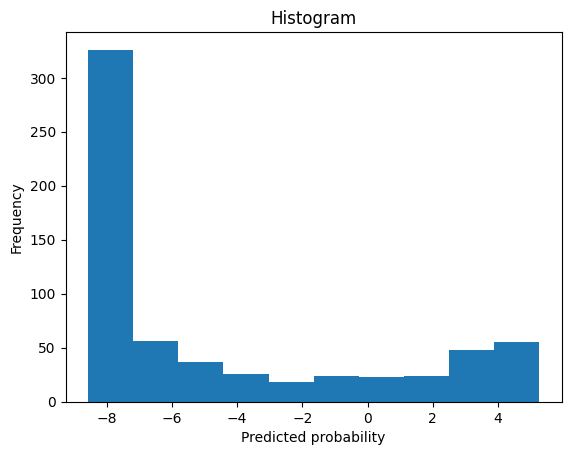

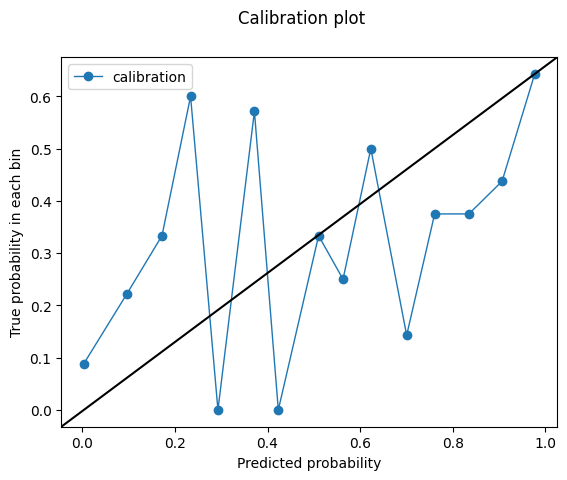

-1.638176
validation set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/4154354151.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8760442773600668
Outcome probability: 0.2087912087912088
Average precision score: 0.65
Best F1: 0.6712802768166091


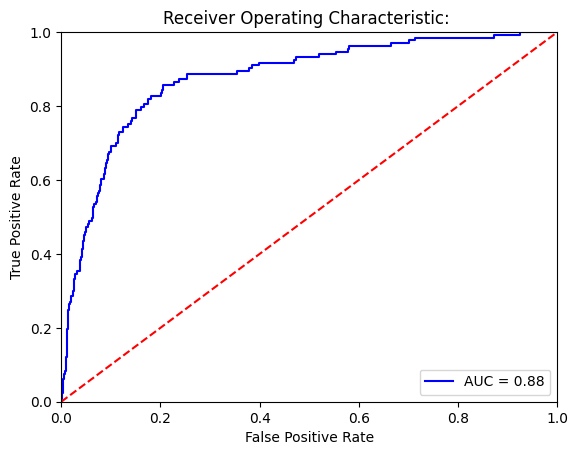

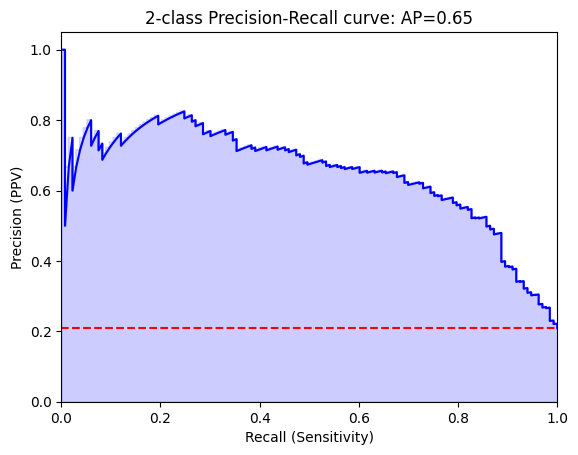

Threshold for best F1:
-1.1112647
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[445  59]
 [ 36  97]]


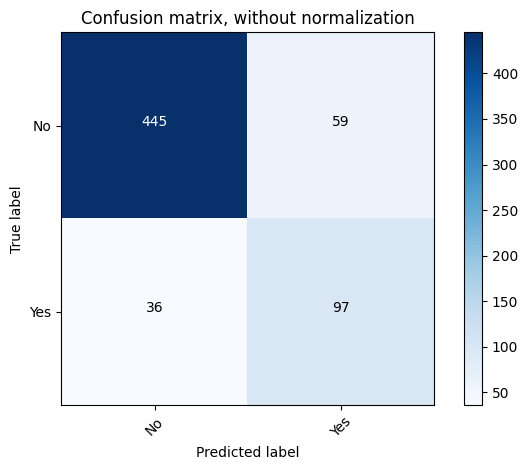

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.88      0.90       504
         Yes       0.62      0.73      0.67       133

    accuracy                           0.85       637
   macro avg       0.77      0.81      0.79       637
weighted avg       0.86      0.85      0.86       637

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[483  21]
 [ 81  52]]


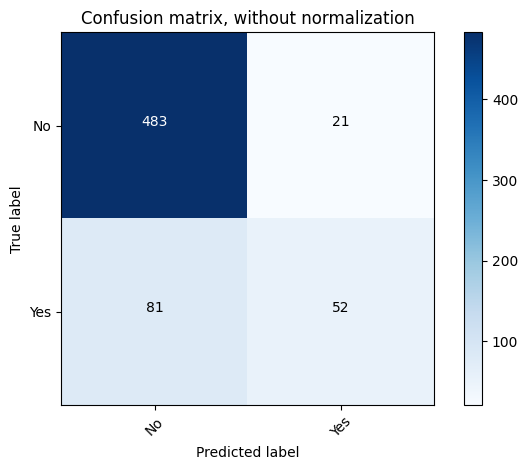

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.96      0.90       504
         Yes       0.71      0.39      0.50       133

    accuracy                           0.84       637
   macro avg       0.78      0.67      0.70       637
weighted avg       0.83      0.84      0.82       637



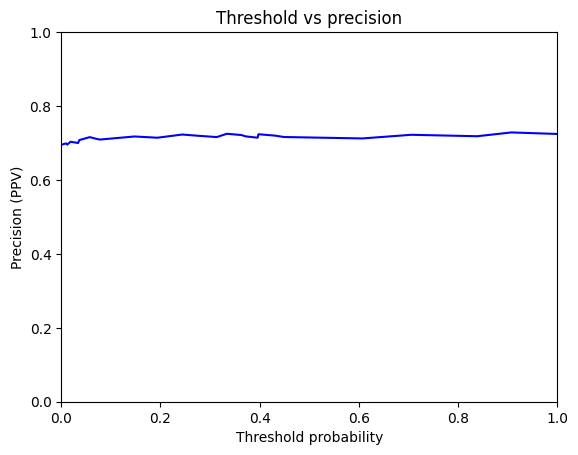

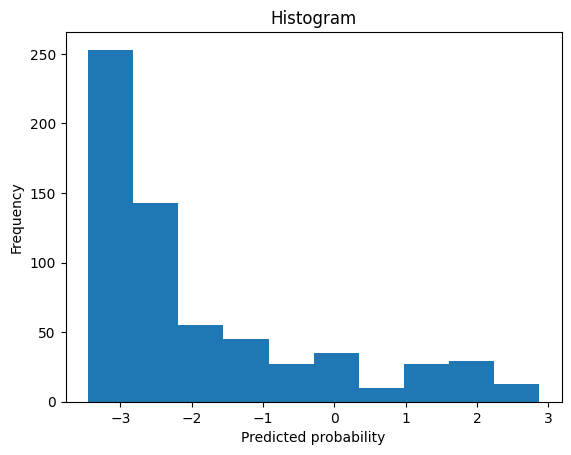

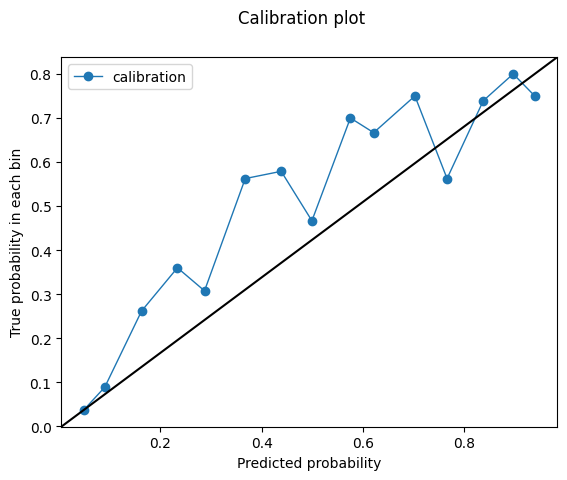

-1.1112647


In [37]:
print('model performance for men')

for model_type in model_paths:

    print('validation set')
    print('model type')
    print(model_type)
    validation = validation_full[validation_full.GENDER_NM == 'MALE' ].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Male patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.pd_pred, valid_output.outcome, graph=True))


model performance for men
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/2292643327.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9031250000000001
Outcome probability: 0.20249221183800623
Average precision score: 0.72
Best F1: 0.6810551558752997


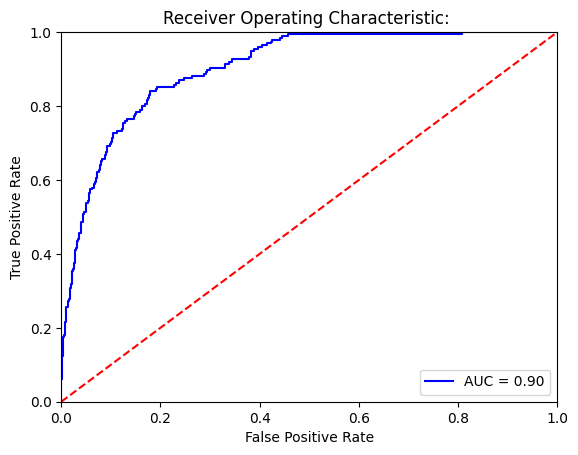

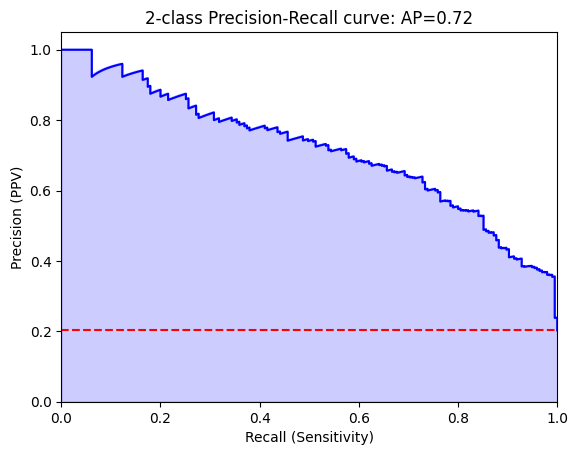

Threshold for best F1:
0.004692193
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[688  80]
 [ 53 142]]


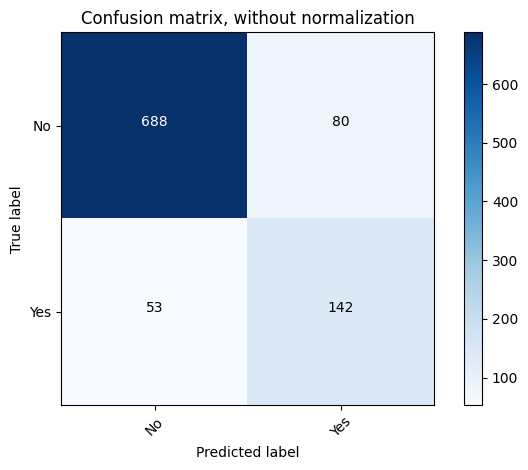

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.90      0.91       768
         Yes       0.64      0.73      0.68       195

    accuracy                           0.86       963
   macro avg       0.78      0.81      0.80       963
weighted avg       0.87      0.86      0.87       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[714  54]
 [ 77 118]]


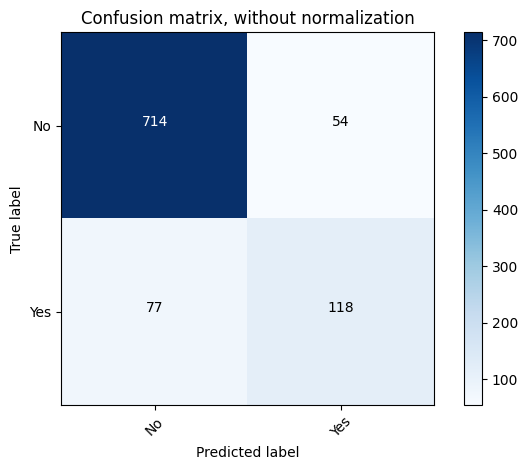

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.93      0.92       768
         Yes       0.69      0.61      0.64       195

    accuracy                           0.86       963
   macro avg       0.79      0.77      0.78       963
weighted avg       0.86      0.86      0.86       963



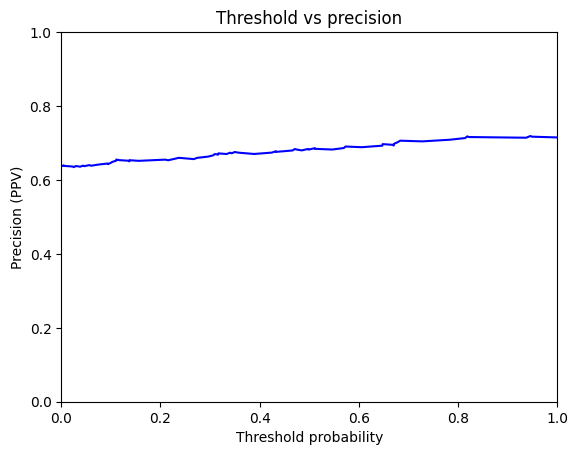

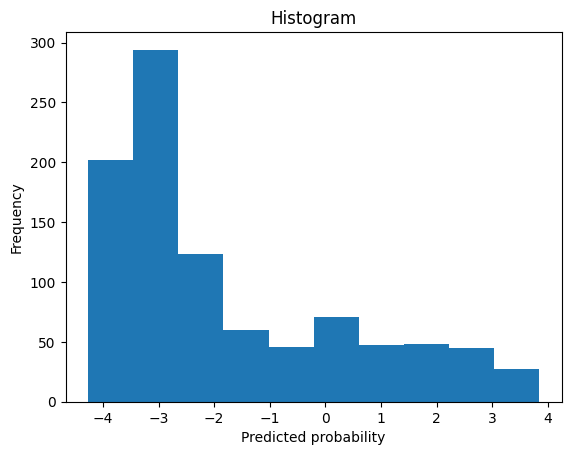

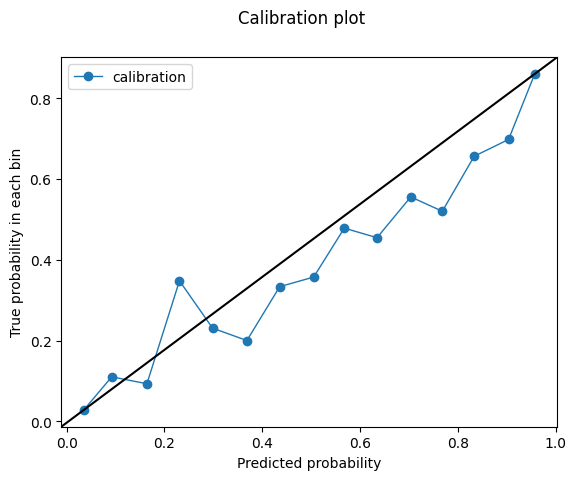

0.004692193
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/2292643327.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8848090277777778
Outcome probability: 0.20249221183800623
Average precision score: 0.68
Best F1: 0.6597938144329897


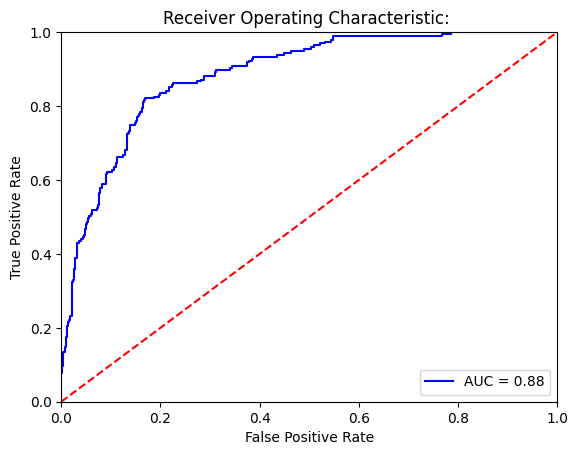

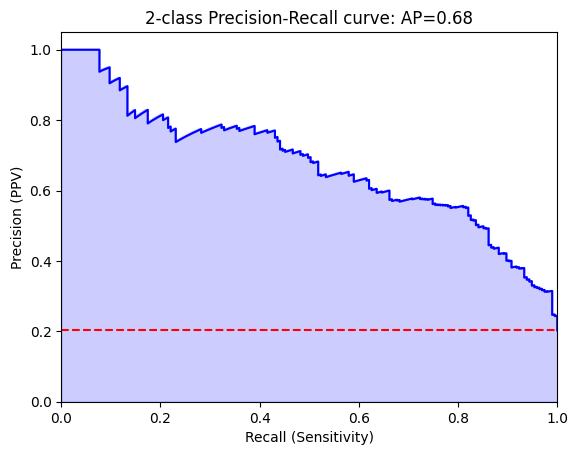

Threshold for best F1:
-1.2203305
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[638 130]
 [ 35 160]]


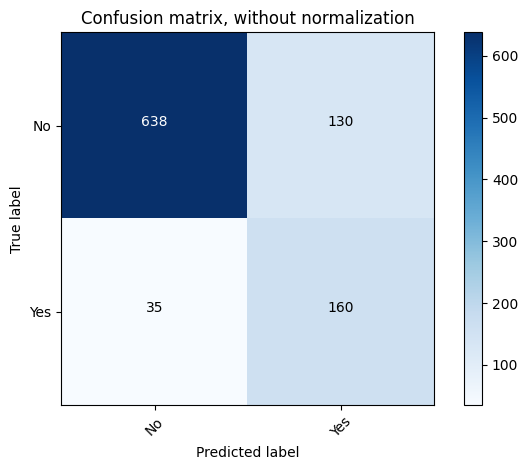

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.95      0.83      0.89       768
         Yes       0.55      0.82      0.66       195

    accuracy                           0.83       963
   macro avg       0.75      0.83      0.77       963
weighted avg       0.87      0.83      0.84       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[740  28]
 [110  85]]


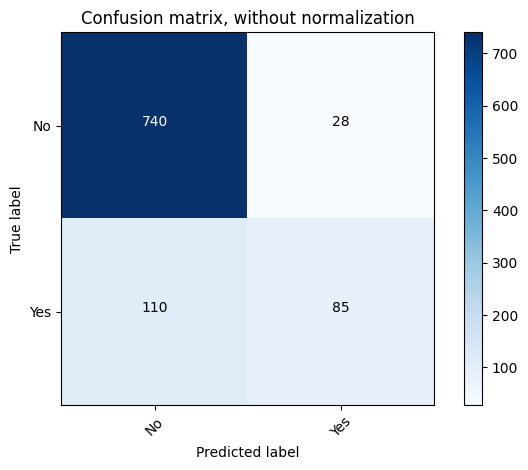

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.96      0.91       768
         Yes       0.75      0.44      0.55       195

    accuracy                           0.86       963
   macro avg       0.81      0.70      0.73       963
weighted avg       0.85      0.86      0.84       963



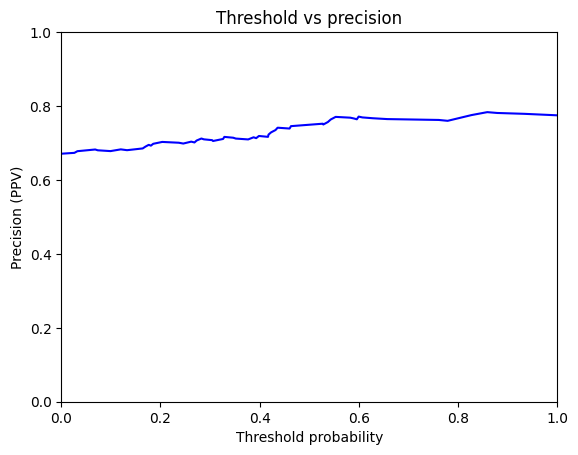

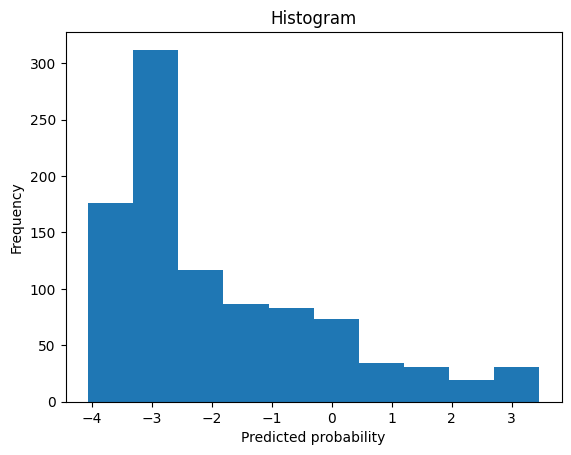

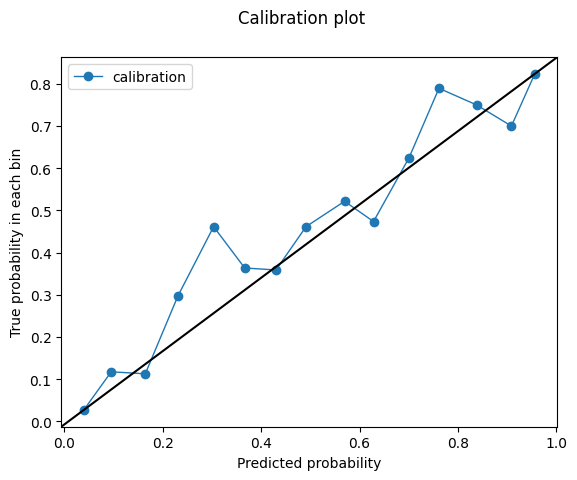

-1.2203305
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/2292643327.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8279714209401711
Outcome probability: 0.20249221183800623
Average precision score: 0.57
Best F1: 0.5734597156398106


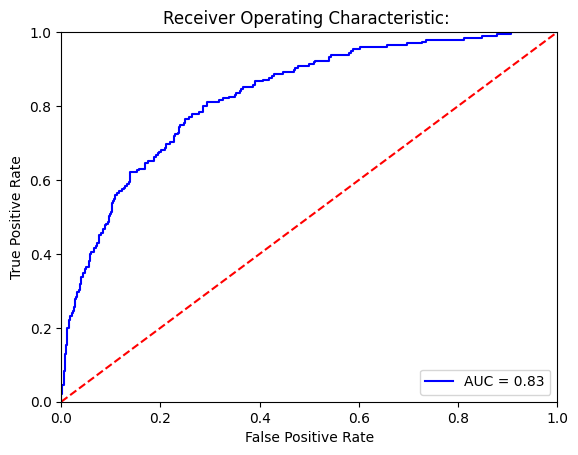

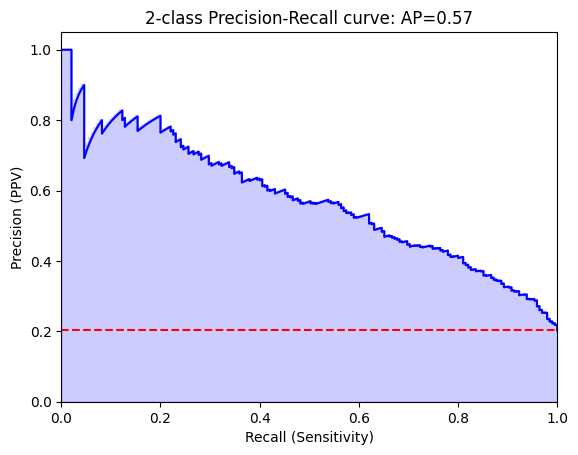

Threshold for best F1:
-1.3074305
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[662 106]
 [ 74 121]]


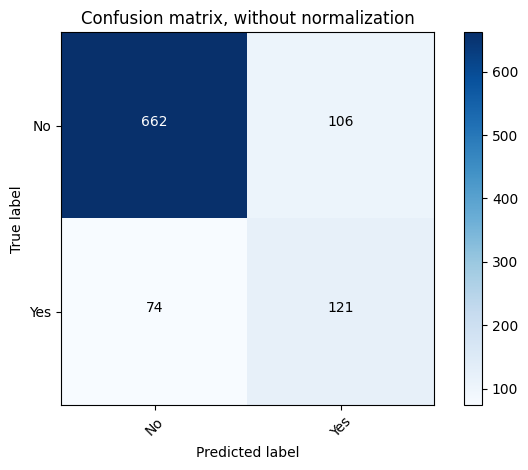

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.86      0.88       768
         Yes       0.53      0.62      0.57       195

    accuracy                           0.81       963
   macro avg       0.72      0.74      0.73       963
weighted avg       0.83      0.81      0.82       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[756  12]
 [156  39]]


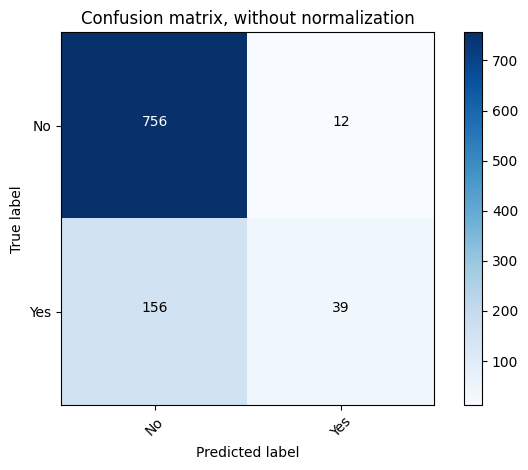

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.98      0.90       768
         Yes       0.76      0.20      0.32       195

    accuracy                           0.83       963
   macro avg       0.80      0.59      0.61       963
weighted avg       0.82      0.83      0.78       963



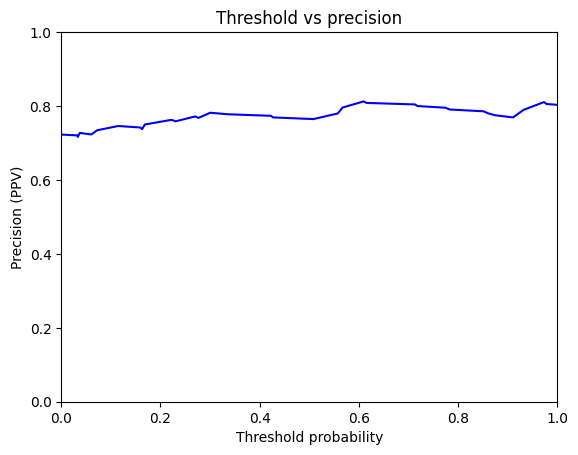

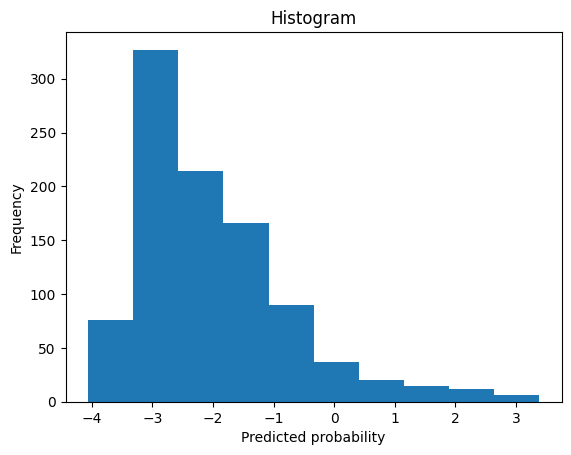

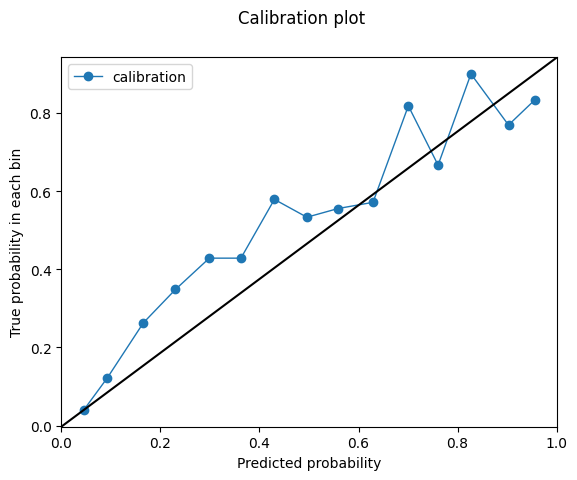

-1.3074305
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/2292643327.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8110777243589743
Outcome probability: 0.20249221183800623
Average precision score: 0.53
Best F1: 0.5607064017660045


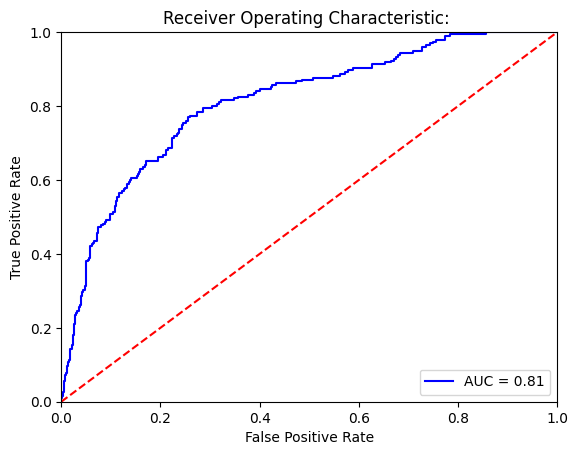

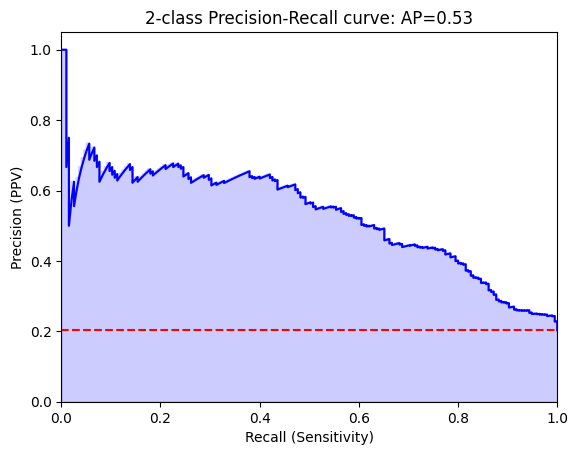

Threshold for best F1:
-0.7873024
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[637 131]
 [ 68 127]]


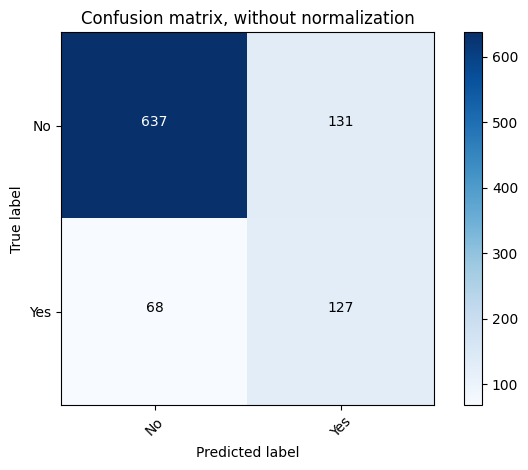

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.83      0.86       768
         Yes       0.49      0.65      0.56       195

    accuracy                           0.79       963
   macro avg       0.70      0.74      0.71       963
weighted avg       0.82      0.79      0.80       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[666 102]
 [ 81 114]]


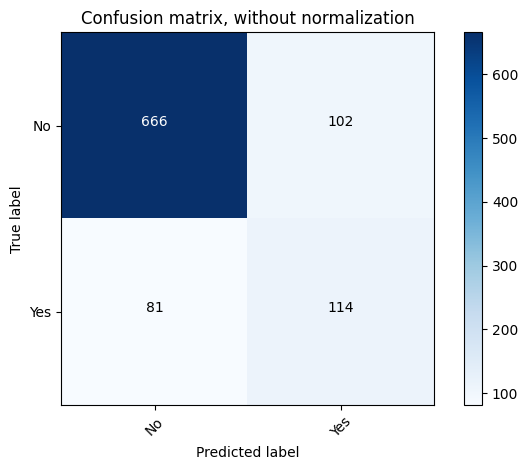

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.87      0.88       768
         Yes       0.53      0.58      0.55       195

    accuracy                           0.81       963
   macro avg       0.71      0.73      0.72       963
weighted avg       0.82      0.81      0.81       963



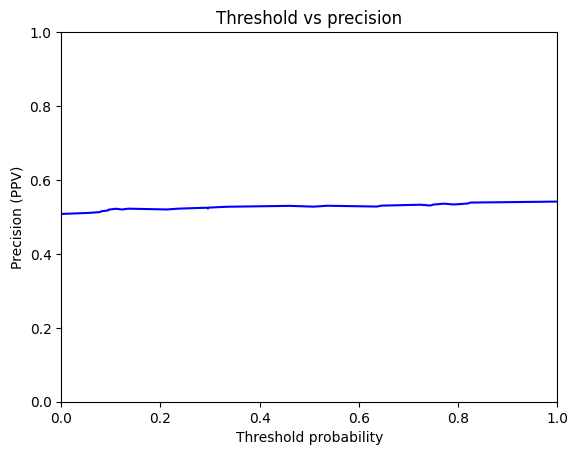

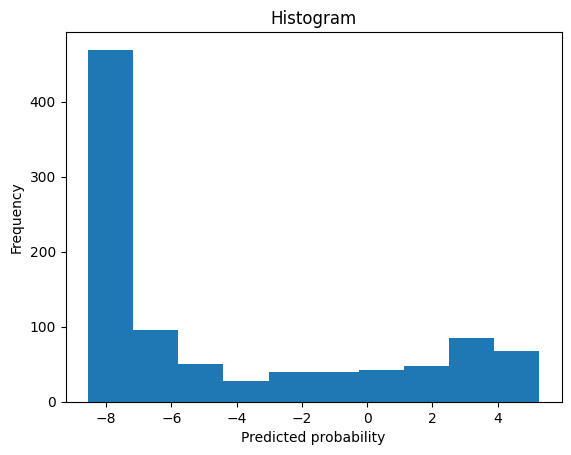

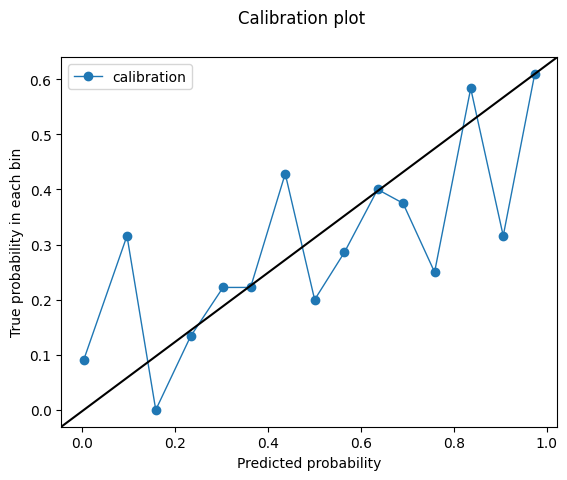

-0.7873024
test set
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/2292643327.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Male patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8668870192307693
Outcome probability: 0.20249221183800623
Average precision score: 0.64
Best F1: 0.634920634920635


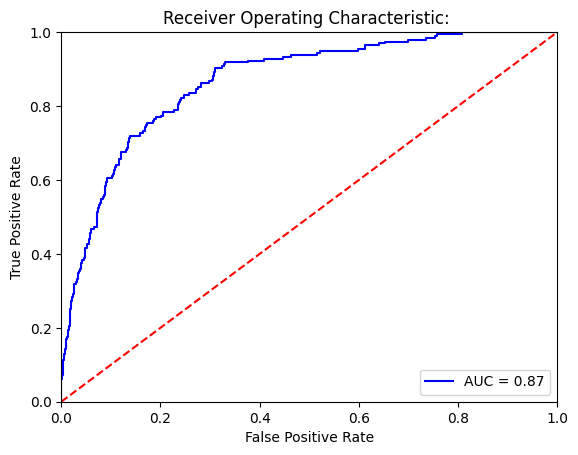

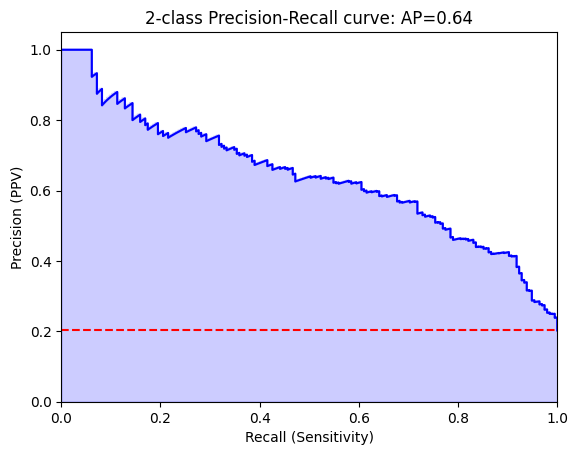

Threshold for best F1:
-0.92206955
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[662 106]
 [ 55 140]]


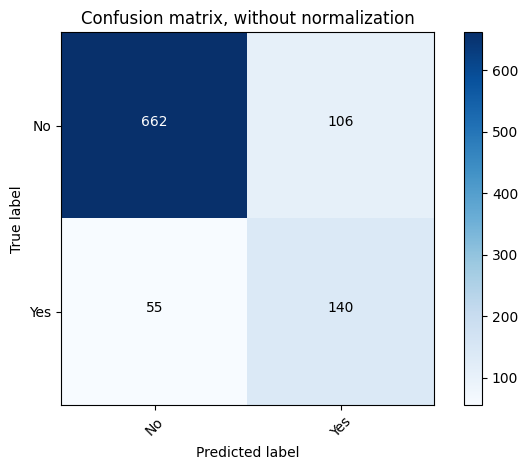

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.86      0.89       768
         Yes       0.57      0.72      0.63       195

    accuracy                           0.83       963
   macro avg       0.75      0.79      0.76       963
weighted avg       0.85      0.83      0.84       963

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[743  25]
 [131  64]]


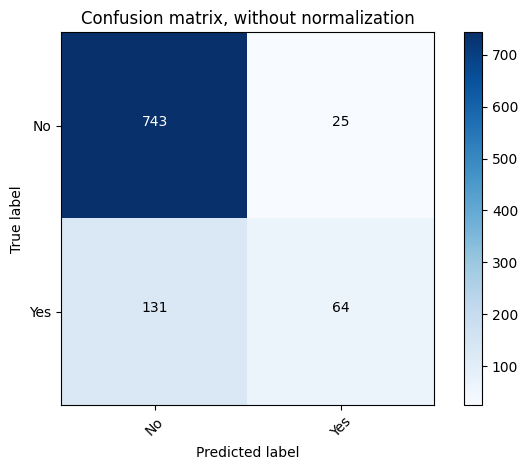

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.97      0.90       768
         Yes       0.72      0.33      0.45       195

    accuracy                           0.84       963
   macro avg       0.78      0.65      0.68       963
weighted avg       0.82      0.84      0.81       963



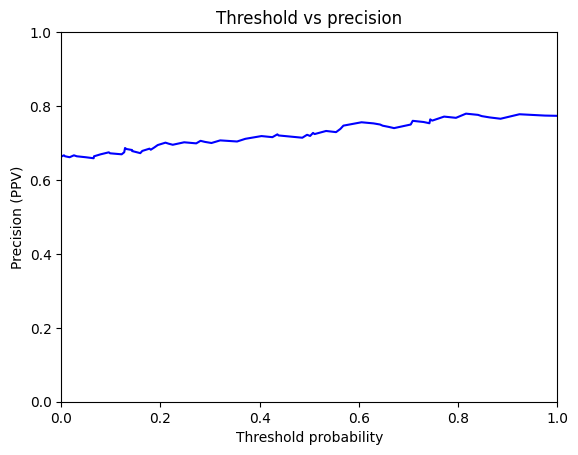

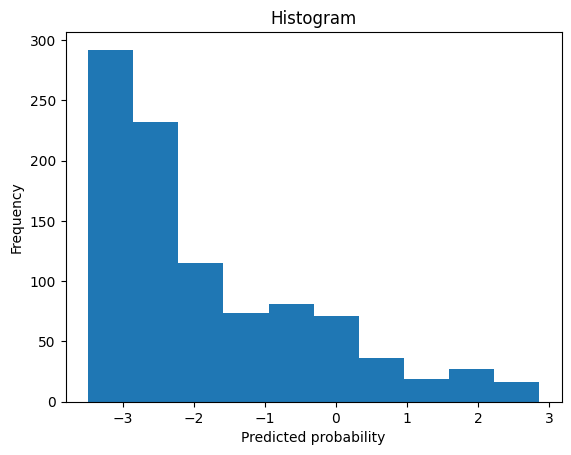

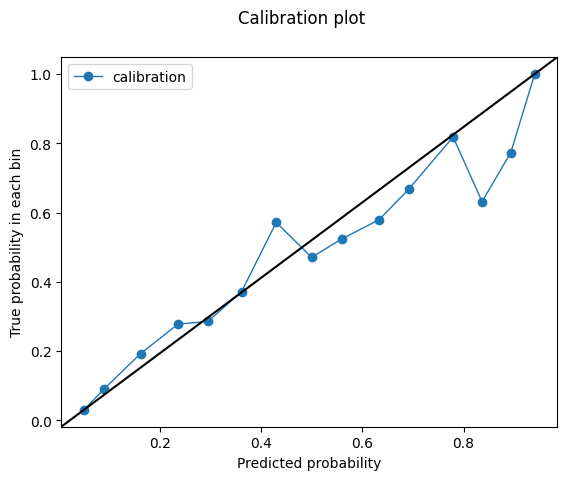

-0.92206955


In [38]:
print('model performance for men')

for model_type in model_paths:

    print('test set')
    print('model type')
    print(model_type)
    test = test_full[test_full.GENDER_NM == 'MALE' ].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Male patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.pd_pred, test_output.outcome, graph=True))


model performance for women
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/3137745674.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.9079984943712893
Outcome probability: 0.21355685131195334
Average precision score: 0.75
Best F1: 0.7099841521394612


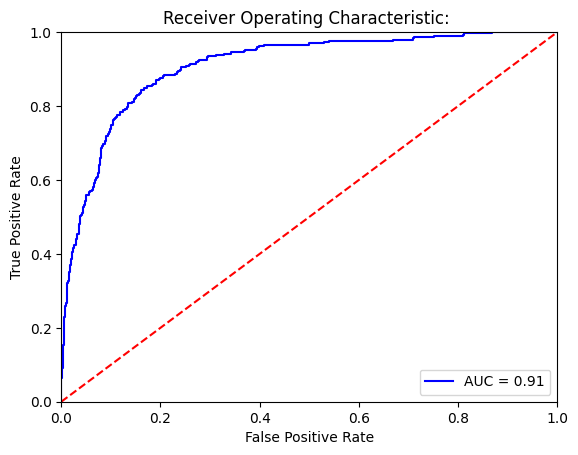

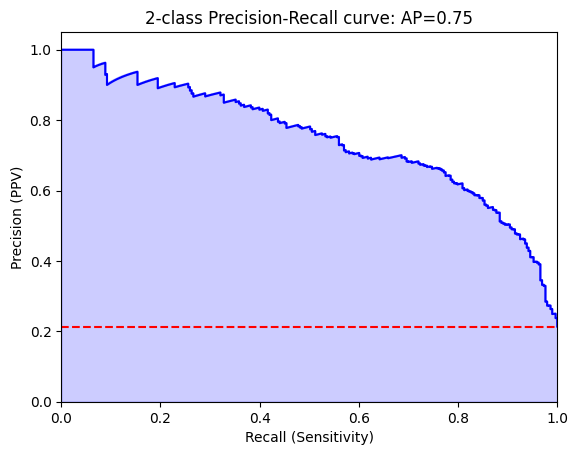

Threshold for best F1:
-0.43858612
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[965 114]
 [ 69 224]]


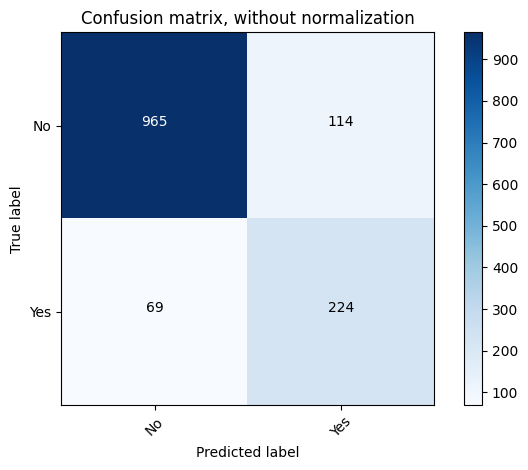

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.93      0.89      0.91      1079
         Yes       0.66      0.76      0.71       293

    accuracy                           0.87      1372
   macro avg       0.80      0.83      0.81      1372
weighted avg       0.88      0.87      0.87      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[1007   72]
 [ 121  172]]


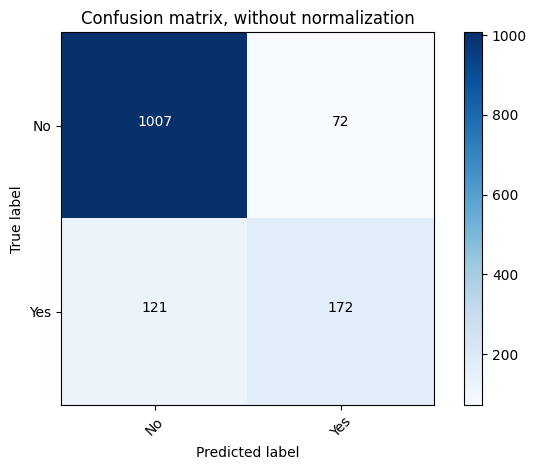

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.93      0.91      1079
         Yes       0.70      0.59      0.64       293

    accuracy                           0.86      1372
   macro avg       0.80      0.76      0.78      1372
weighted avg       0.85      0.86      0.85      1372



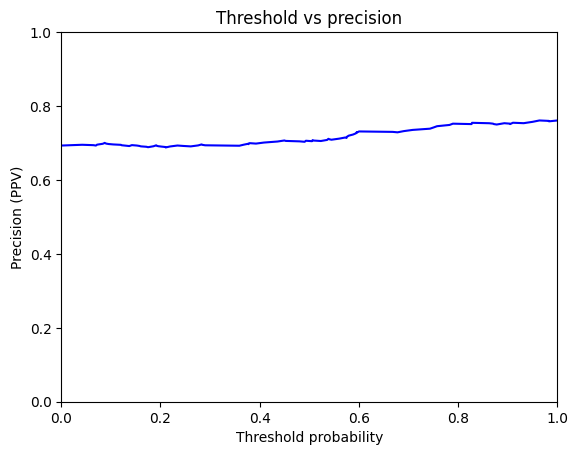

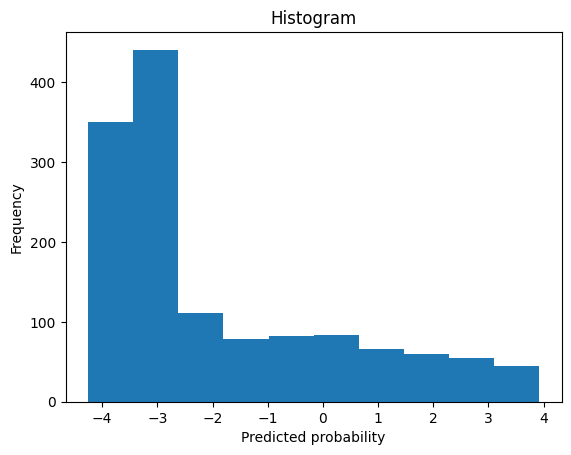

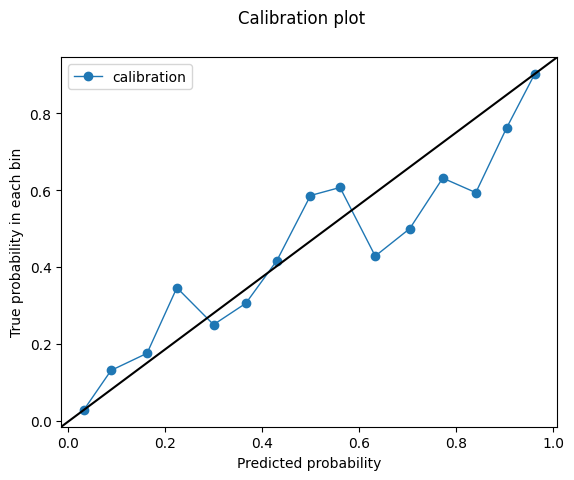

-0.43858612
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/3137745674.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.9034468142984118
Outcome probability: 0.21355685131195334
Average precision score: 0.74
Best F1: 0.6943521594684384


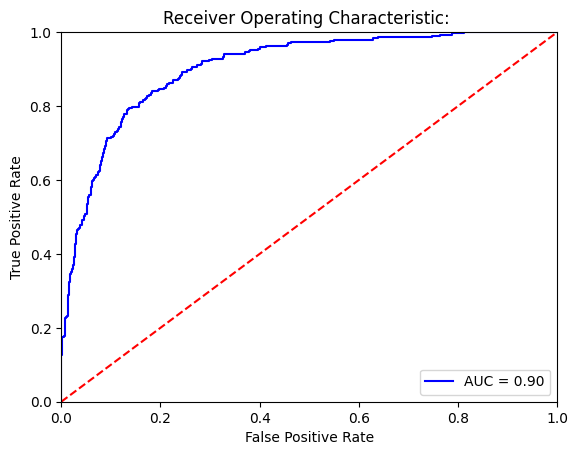

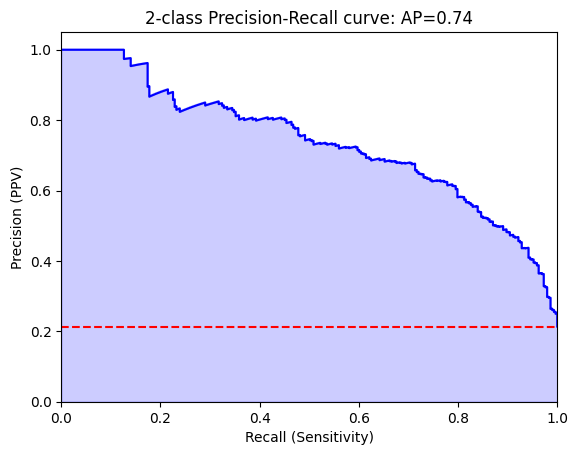

Threshold for best F1:
-0.6069133
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[979 100]
 [ 84 209]]


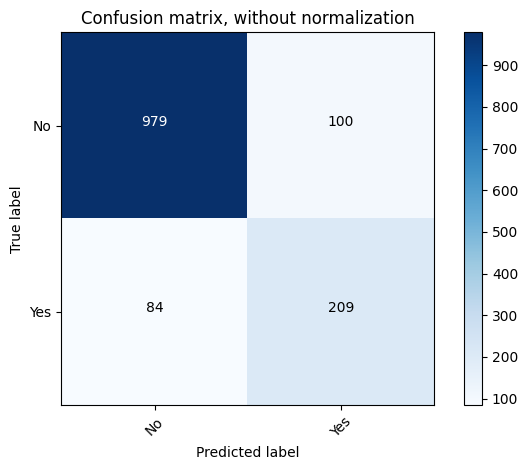

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.91      0.91      1079
         Yes       0.68      0.71      0.69       293

    accuracy                           0.87      1372
   macro avg       0.80      0.81      0.80      1372
weighted avg       0.87      0.87      0.87      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[1047   32]
 [ 161  132]]


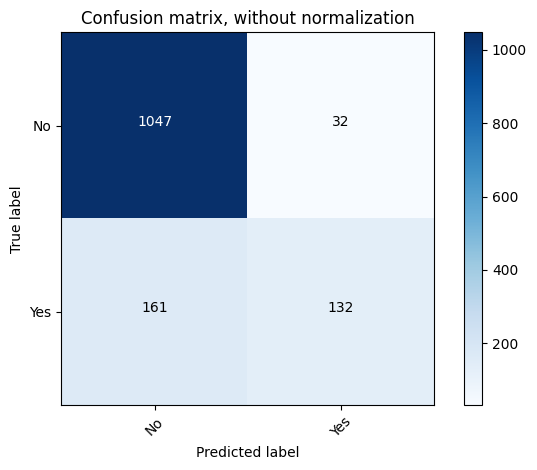

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.87      0.97      0.92      1079
         Yes       0.80      0.45      0.58       293

    accuracy                           0.86      1372
   macro avg       0.84      0.71      0.75      1372
weighted avg       0.85      0.86      0.84      1372



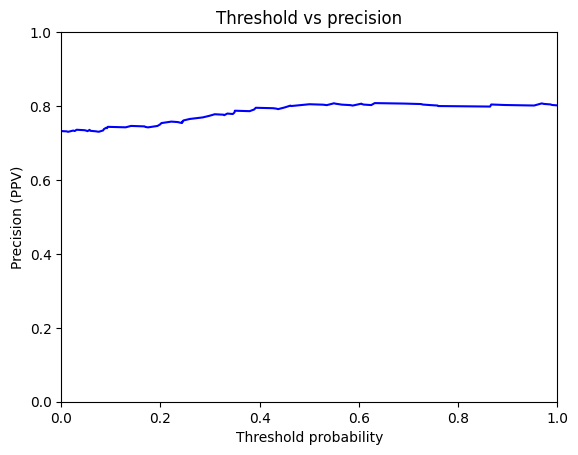

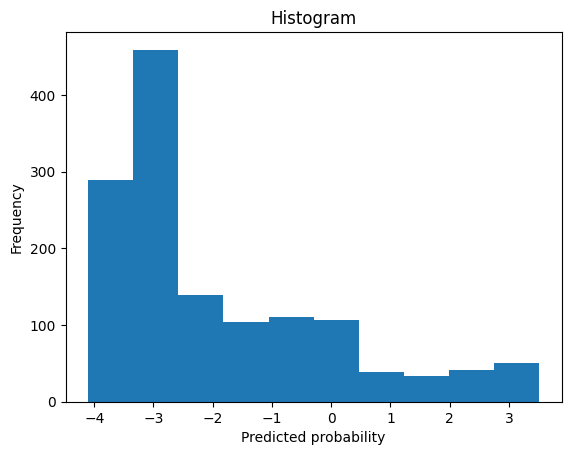

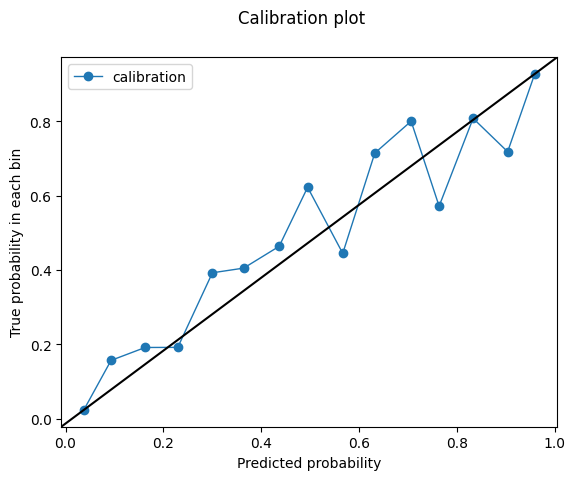

-0.6069133
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/3137745674.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8454801089366657
Outcome probability: 0.21355685131195334
Average precision score: 0.62
Best F1: 0.6003016591251885


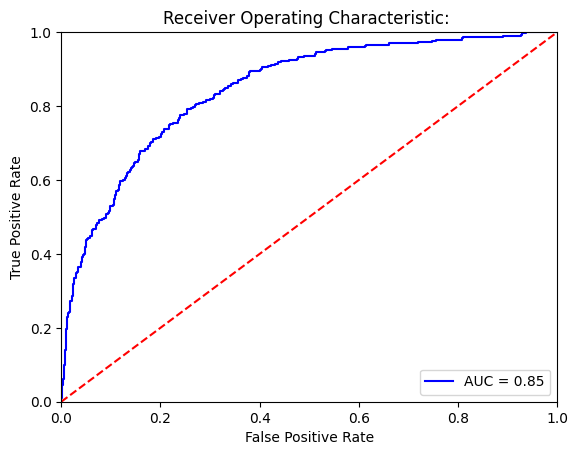

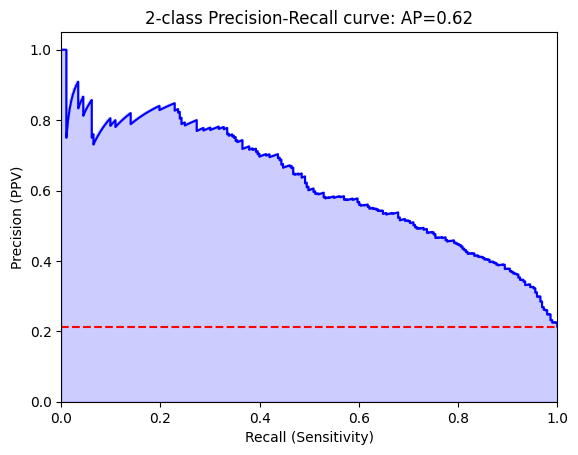

Threshold for best F1:
-1.6393487
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[908 171]
 [ 94 199]]


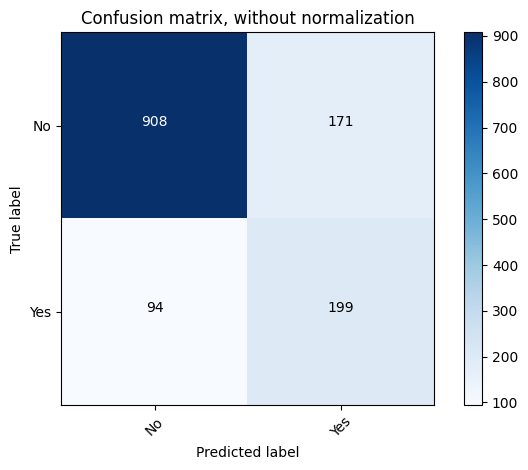

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.84      0.87      1079
         Yes       0.54      0.68      0.60       293

    accuracy                           0.81      1372
   macro avg       0.72      0.76      0.74      1372
weighted avg       0.83      0.81      0.81      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[1062   17]
 [ 223   70]]


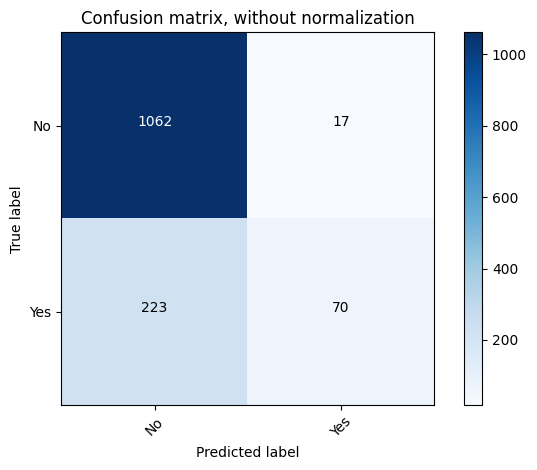

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.83      0.98      0.90      1079
         Yes       0.80      0.24      0.37       293

    accuracy                           0.83      1372
   macro avg       0.82      0.61      0.63      1372
weighted avg       0.82      0.83      0.79      1372



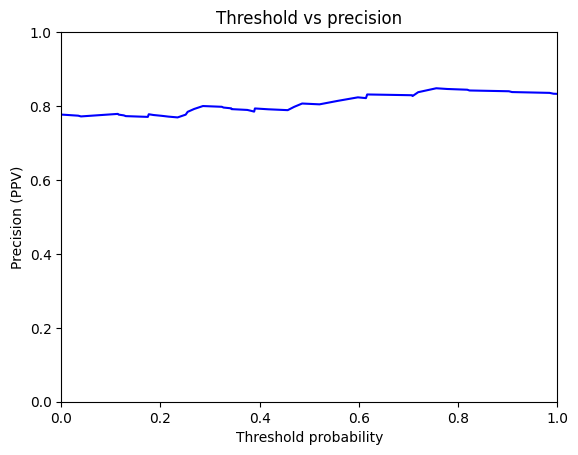

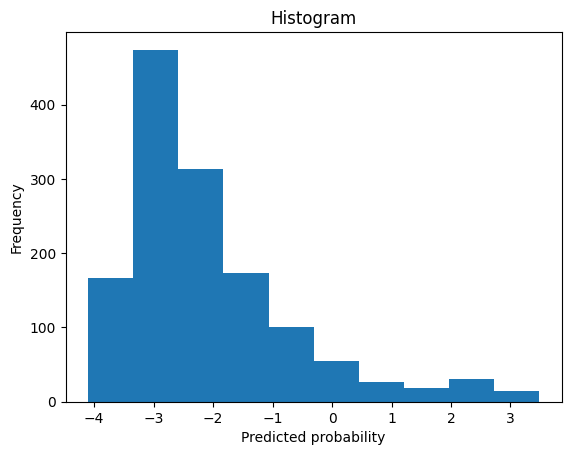

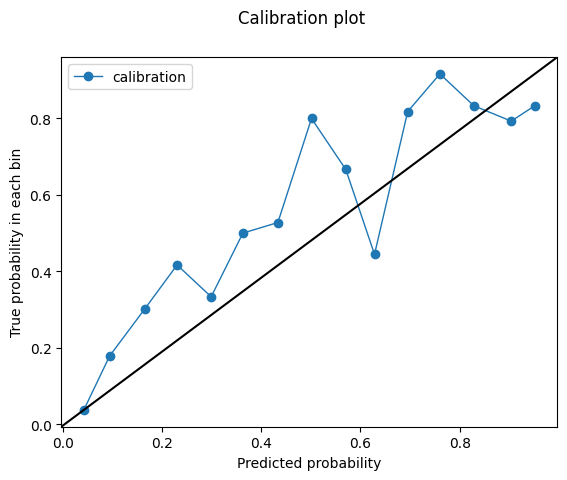

-1.6393487
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/3137745674.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.8115560166631346
Outcome probability: 0.21355685131195334
Average precision score: 0.58
Best F1: 0.559228650137741


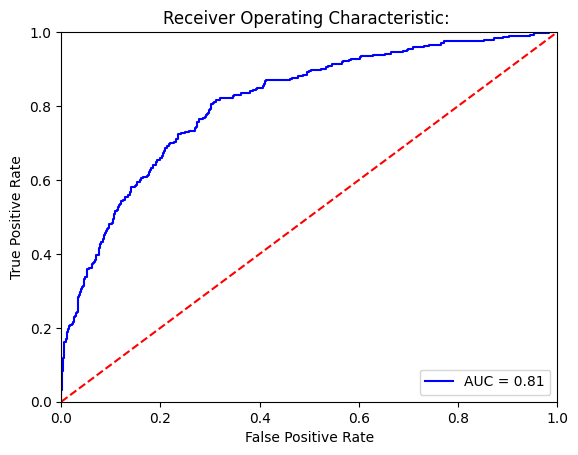

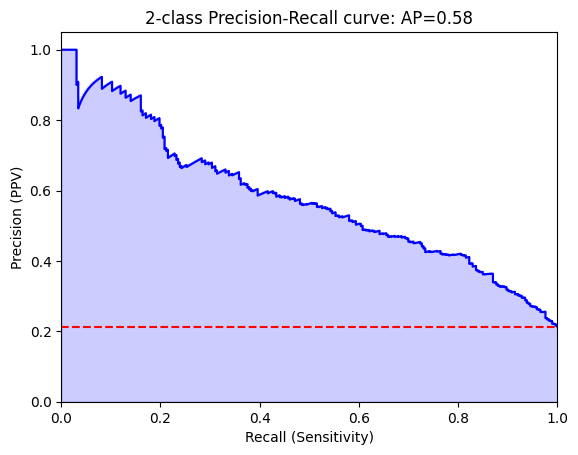

Threshold for best F1:
-3.1575682
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[849 230]
 [ 90 203]]


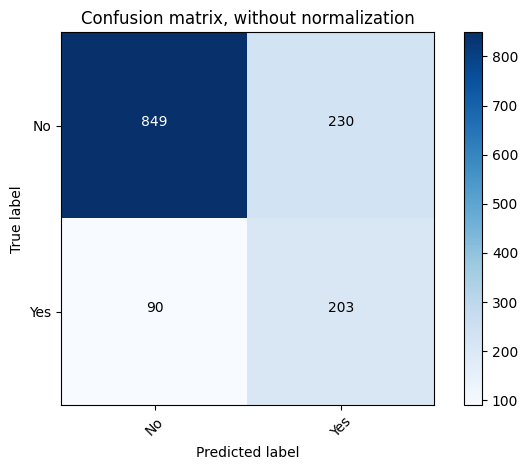

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.79      0.84      1079
         Yes       0.47      0.69      0.56       293

    accuracy                           0.77      1372
   macro avg       0.69      0.74      0.70      1372
weighted avg       0.81      0.77      0.78      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[930 149]
 [128 165]]


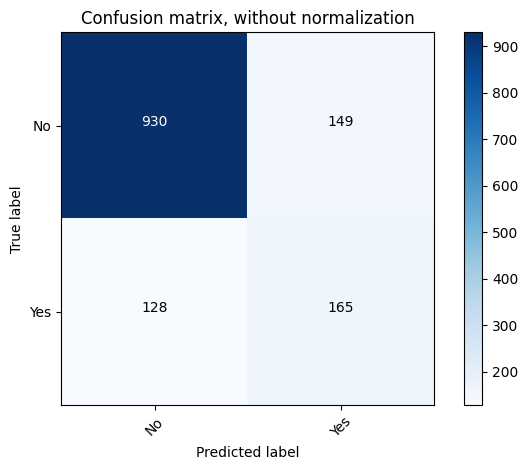

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.86      0.87      1079
         Yes       0.53      0.56      0.54       293

    accuracy                           0.80      1372
   macro avg       0.70      0.71      0.71      1372
weighted avg       0.80      0.80      0.80      1372



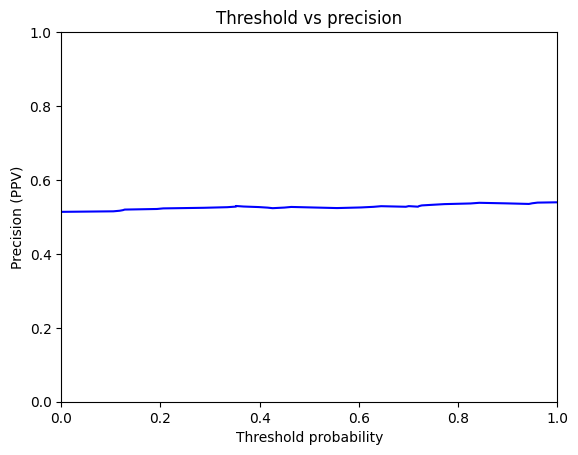

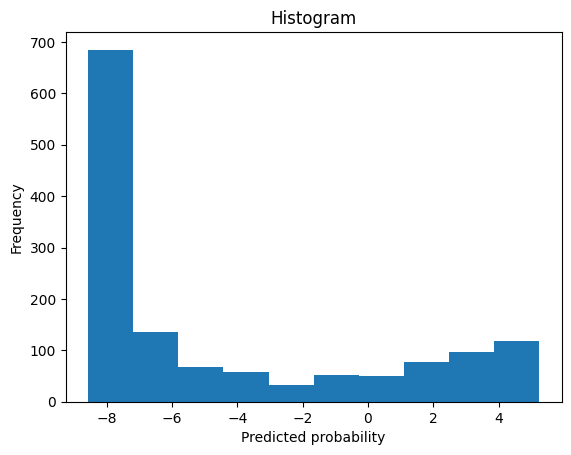

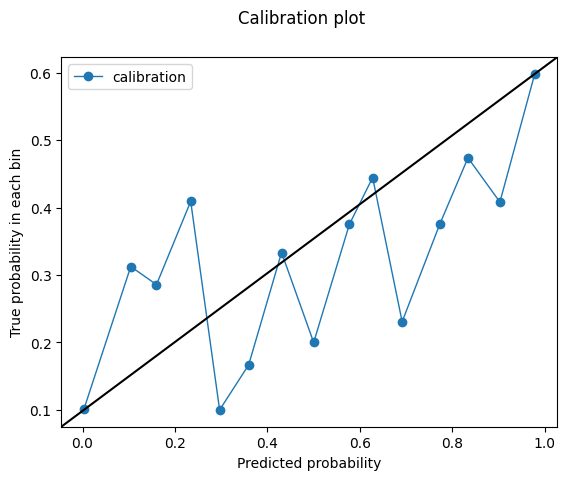

-3.1575682
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/3137745674.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8710125353079422
Outcome probability: 0.21355685131195334
Average precision score: 0.69
Best F1: 0.6506410256410255


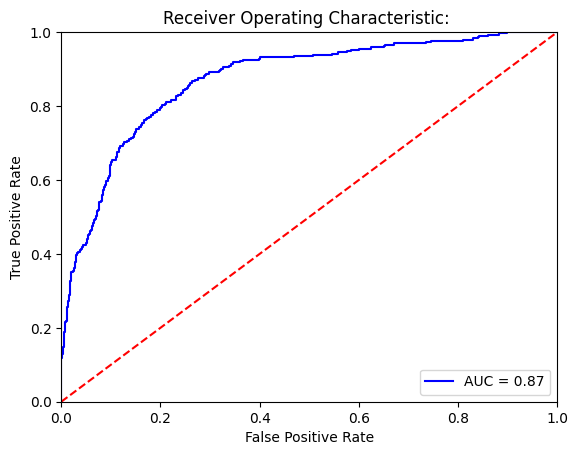

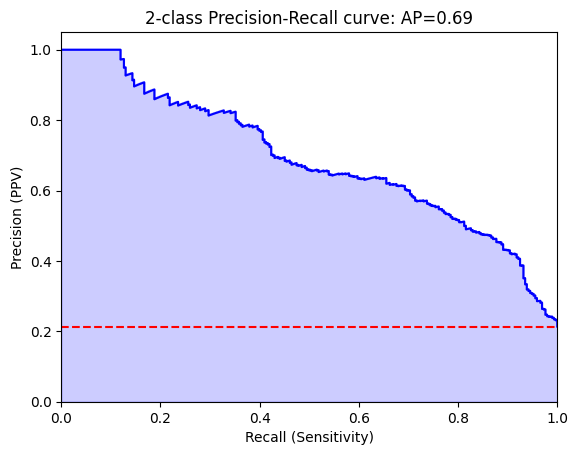

Threshold for best F1:
-0.98287296
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[951 128]
 [ 90 203]]


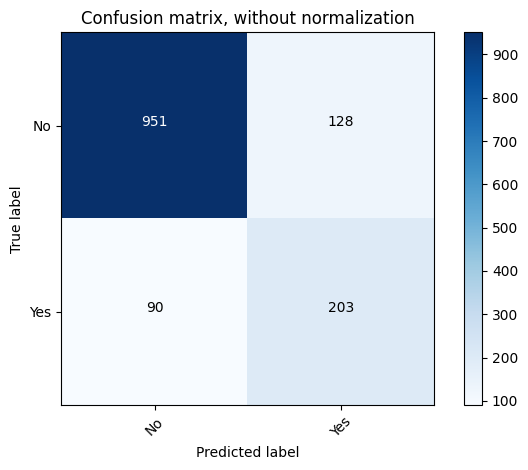

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.88      0.90      1079
         Yes       0.61      0.69      0.65       293

    accuracy                           0.84      1372
   macro avg       0.76      0.79      0.77      1372
weighted avg       0.85      0.84      0.84      1372

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[1048   31]
 [ 182  111]]


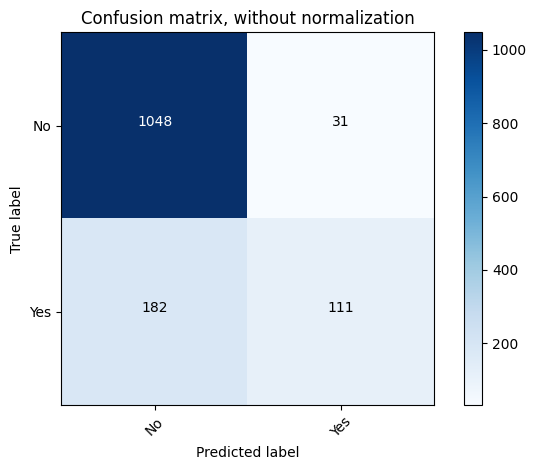

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.85      0.97      0.91      1079
         Yes       0.78      0.38      0.51       293

    accuracy                           0.84      1372
   macro avg       0.82      0.68      0.71      1372
weighted avg       0.84      0.84      0.82      1372



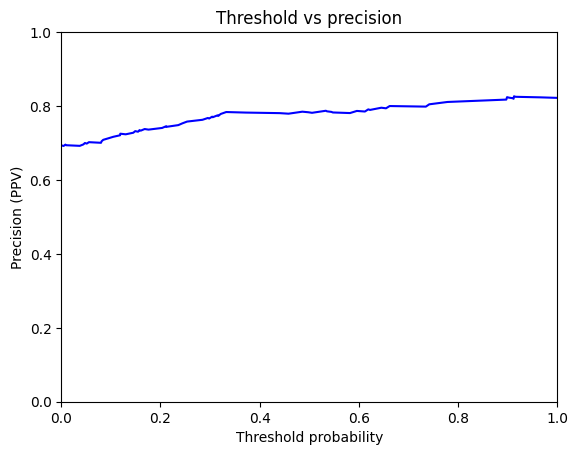

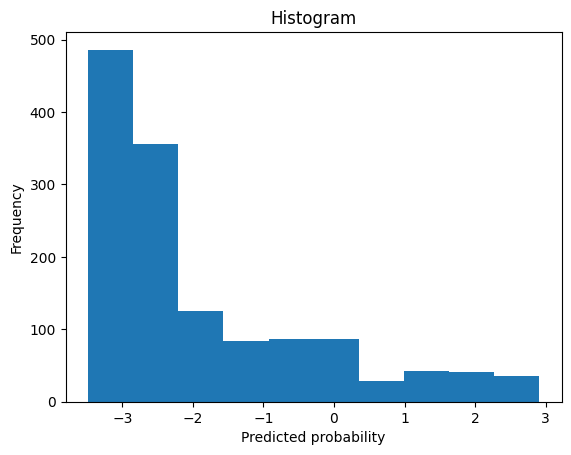

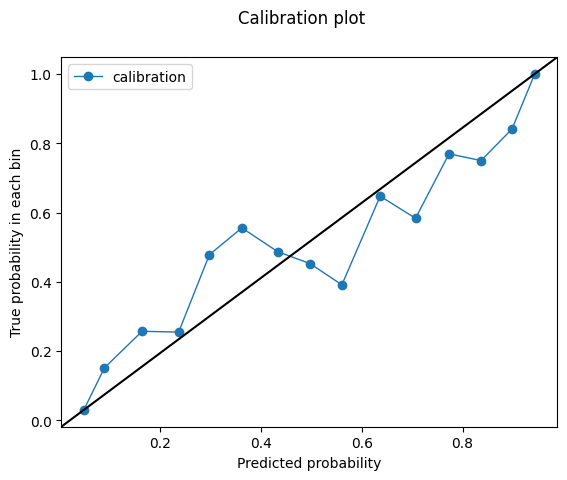

-0.98287296


In [39]:
print('model performance for women')

for model_type in model_paths:

    print('model type')
    print(model_type)
    validation = validation_full[validation_full.GENDER_NM == 'FEMALE'].copy()
    validation_day_text = validation
    validation_day_text['text'] = validation_day_text.text.astype(str)

    validation_day_text = validation_day_text.sort_values(by=['obs','dfci_mrn','time'])

    validation_day_text['text'] = validation_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    validation_day_text = validation_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #validation_day_text.info()

    # write out actual validation dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_valid_dataset = data.DataLoader(RecistDataset(validation.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_valid_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = validation_day_text.reset_index(drop=True)



    valid_output = pd.concat([output, resultframe], axis=1)
    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    valid_output = valid_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    valid_output= valid_output[valid_output.overall_response != 'BL']
    print('Female patients')
    print('model type')
    print(model_type)
    print(eval_model(valid_output.pd_pred, valid_output.outcome, graph=True))


model performance for women
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt


/tmp/ipykernel_1594248/1975655426.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_bert_htransformer_pd.pt
AUC 0.8816897347174164
Outcome probability: 0.2112676056338028
Average precision score: 0.70
Best F1: 0.6496062992125984


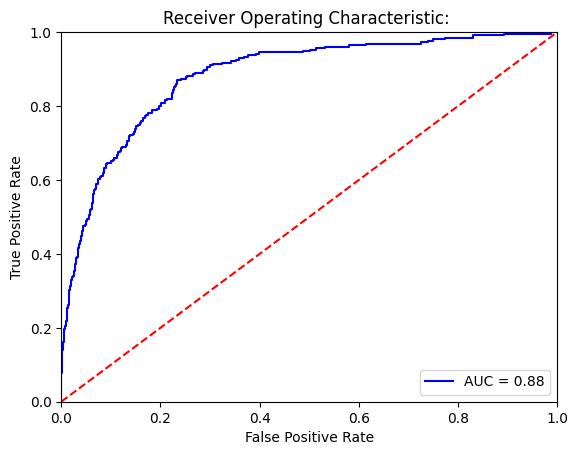

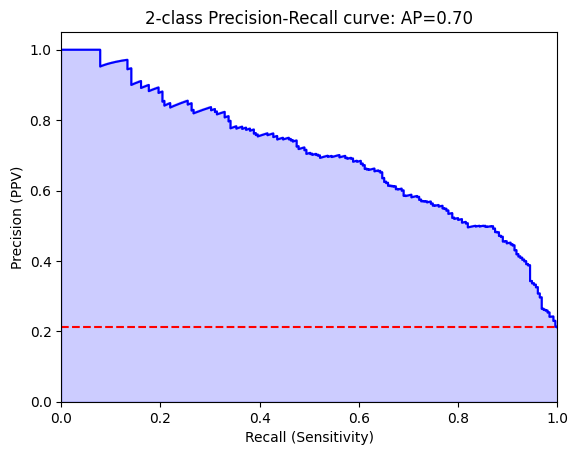

Threshold for best F1:
0.044531953
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[864  88]
 [ 90 165]]


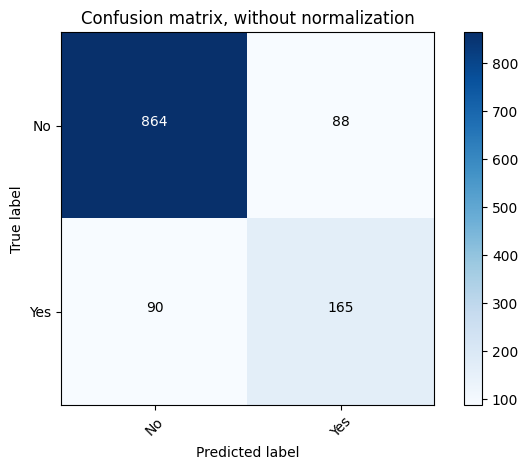

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.91      0.91      0.91       952
         Yes       0.65      0.65      0.65       255

    accuracy                           0.85      1207
   macro avg       0.78      0.78      0.78      1207
weighted avg       0.85      0.85      0.85      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[890  62]
 [112 143]]


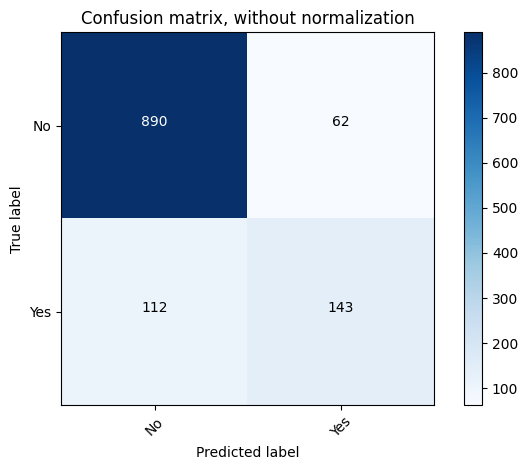

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.89      0.93      0.91       952
         Yes       0.70      0.56      0.62       255

    accuracy                           0.86      1207
   macro avg       0.79      0.75      0.77      1207
weighted avg       0.85      0.86      0.85      1207



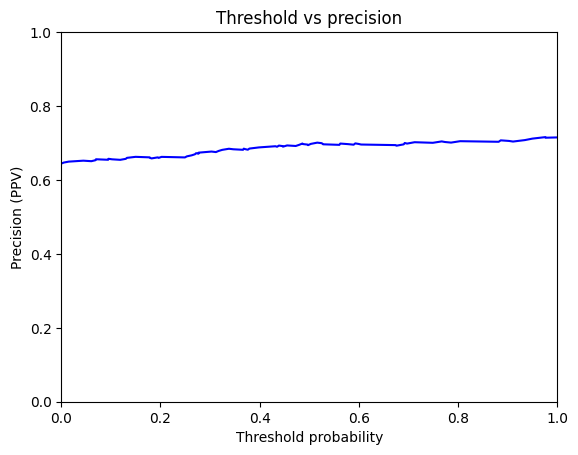

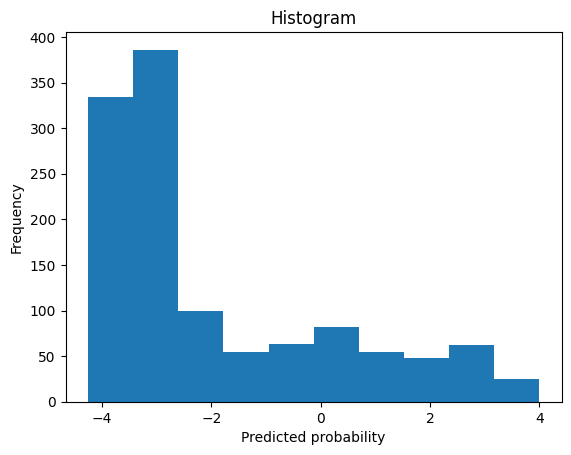

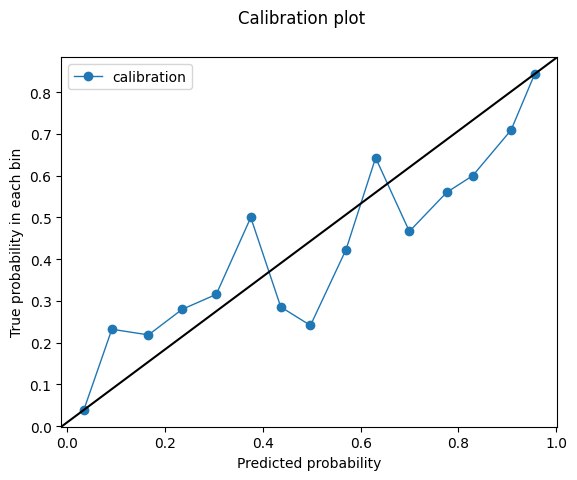

0.044531953
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt


/tmp/ipykernel_1594248/1975655426.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_mimic_htransformer_pd.pt
AUC 0.8768619212390839
Outcome probability: 0.2112676056338028
Average precision score: 0.67
Best F1: 0.6611842105263158


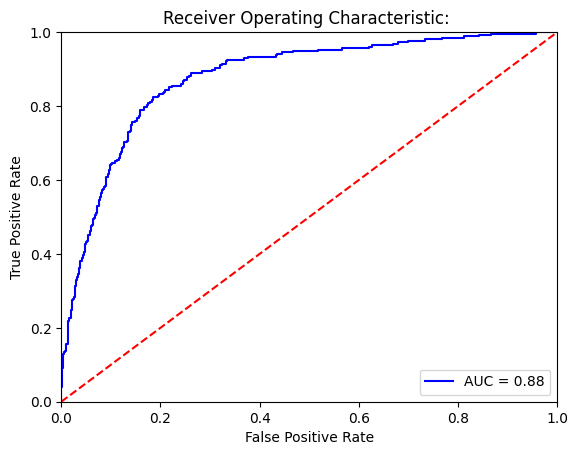

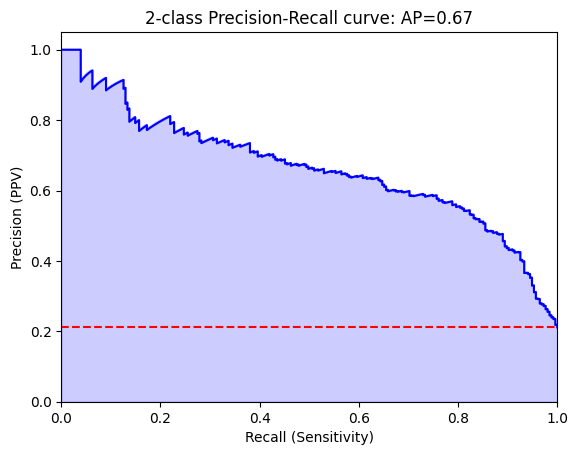

Threshold for best F1:
-1.2770283
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[800 152]
 [ 54 201]]


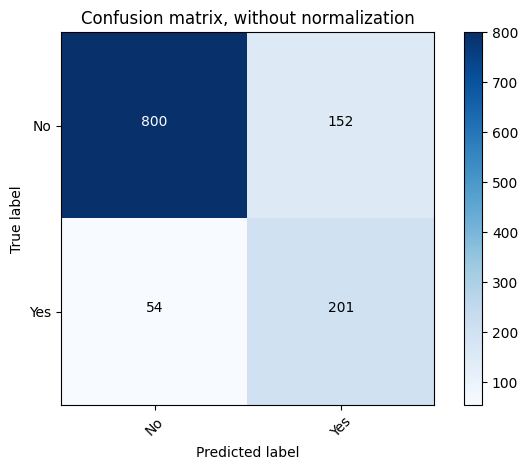

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.94      0.84      0.89       952
         Yes       0.57      0.79      0.66       255

    accuracy                           0.83      1207
   macro avg       0.75      0.81      0.77      1207
weighted avg       0.86      0.83      0.84      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[906  46]
 [147 108]]


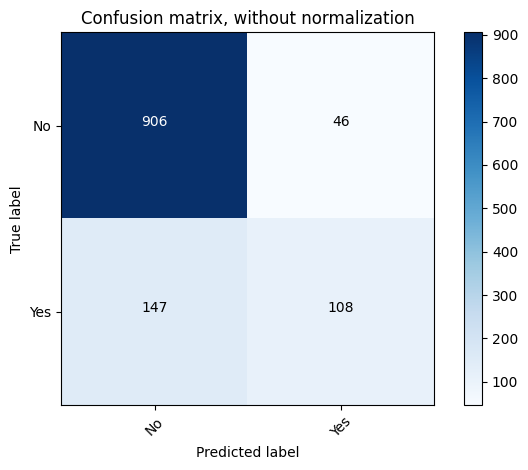

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.86      0.95      0.90       952
         Yes       0.70      0.42      0.53       255

    accuracy                           0.84      1207
   macro avg       0.78      0.69      0.72      1207
weighted avg       0.83      0.84      0.82      1207



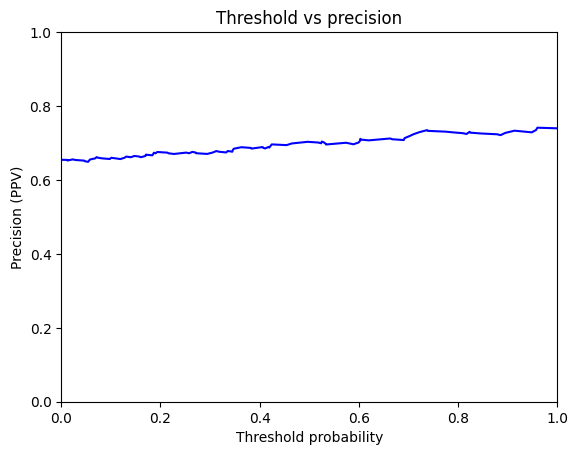

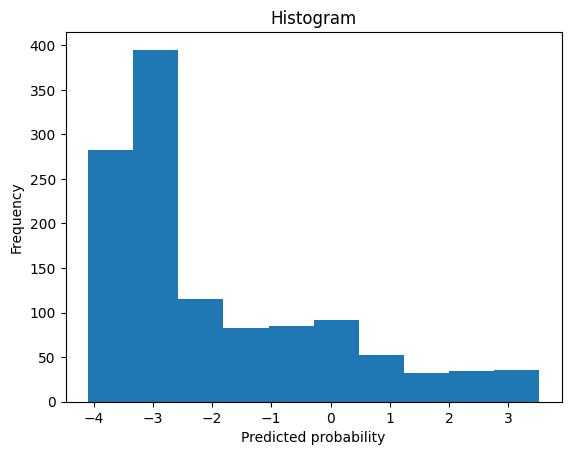

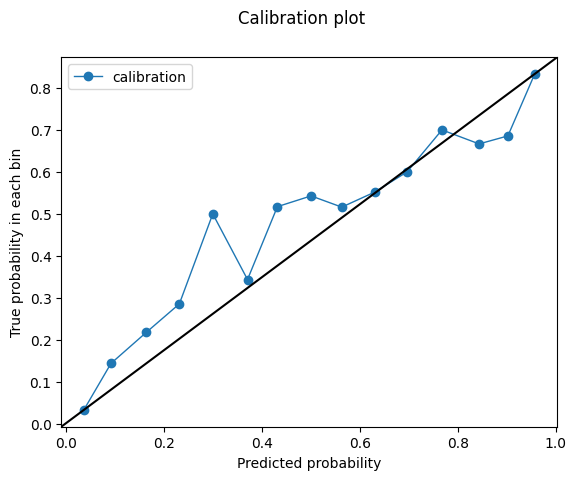

-1.2770283
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt


/tmp/ipykernel_1594248/1975655426.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_synthetic_htransformer_pd.pt
AUC 0.8307628933926512
Outcome probability: 0.2112676056338028
Average precision score: 0.55
Best F1: 0.5728476821192054


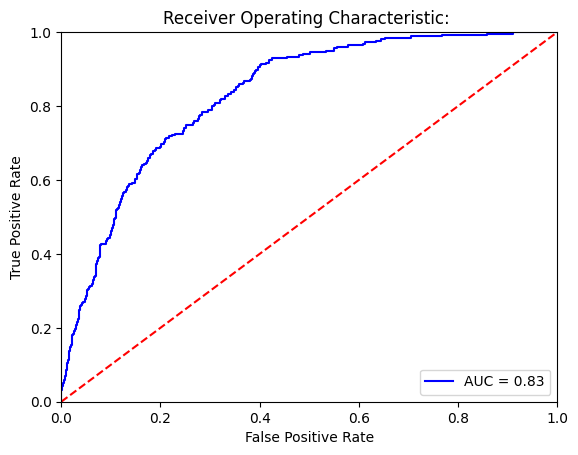

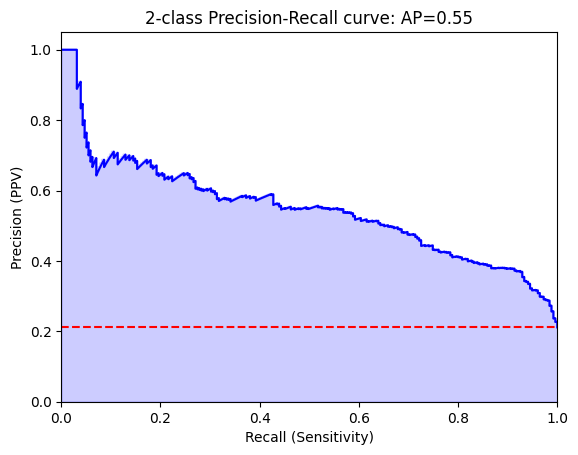

Threshold for best F1:
-1.746341
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[776 176]
 [ 82 173]]


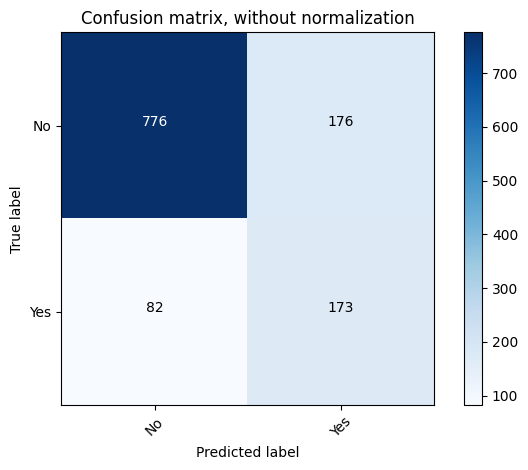

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.82      0.86       952
         Yes       0.50      0.68      0.57       255

    accuracy                           0.79      1207
   macro avg       0.70      0.75      0.72      1207
weighted avg       0.82      0.79      0.80      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[923  29]
 [202  53]]


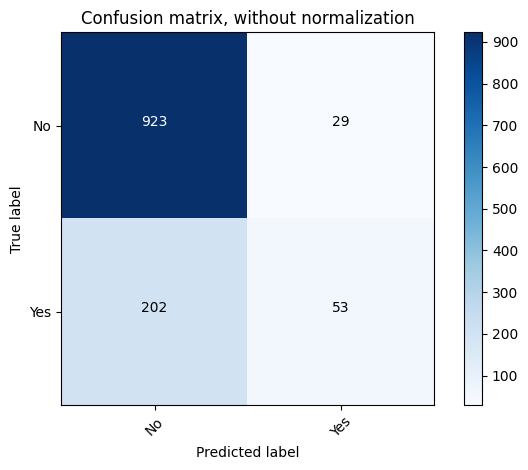

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.82      0.97      0.89       952
         Yes       0.65      0.21      0.31       255

    accuracy                           0.81      1207
   macro avg       0.73      0.59      0.60      1207
weighted avg       0.78      0.81      0.77      1207



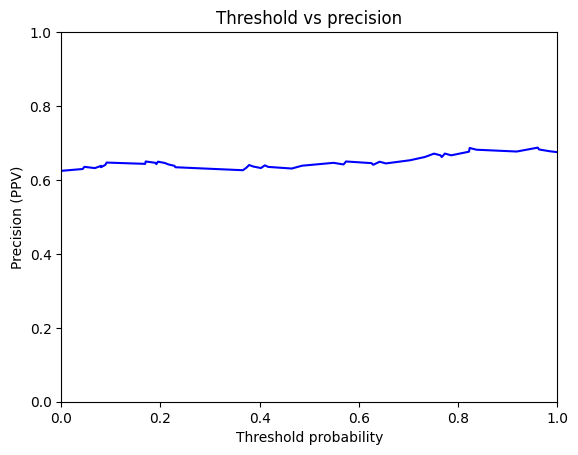

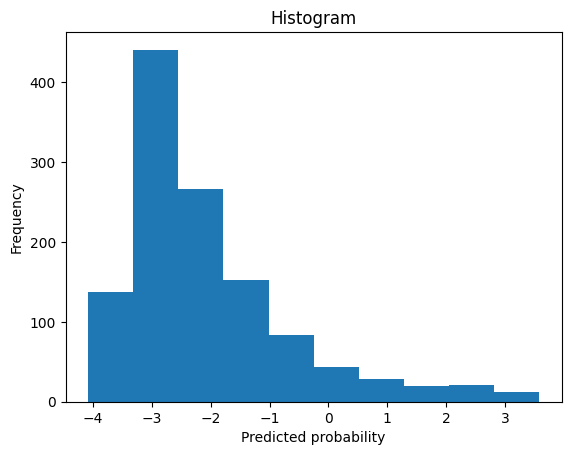

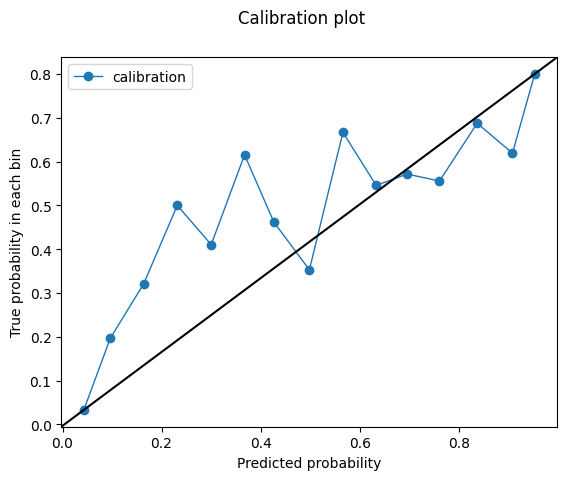

-1.746341
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt


/tmp/ipykernel_1594248/1975655426.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_noPHISyntheticBERT_htransformer_pd.pt
AUC 0.806417861262152
Outcome probability: 0.2112676056338028
Average precision score: 0.51
Best F1: 0.5648604269293924


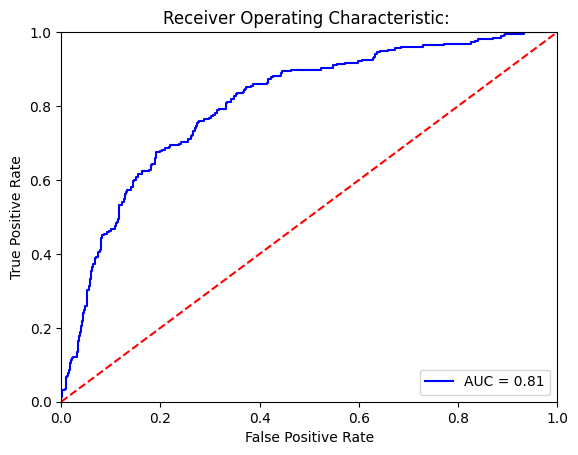

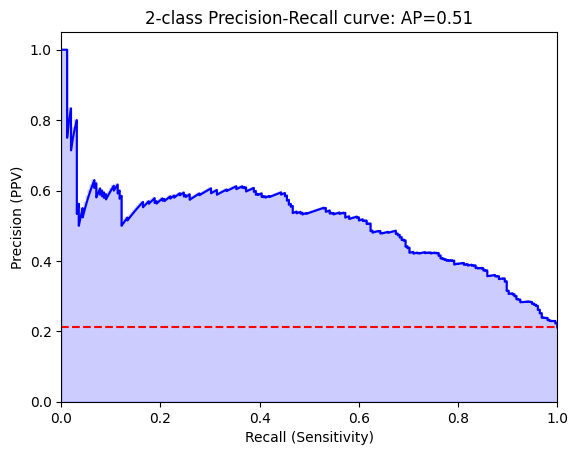

Threshold for best F1:
-2.0672581
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[770 182]
 [ 83 172]]


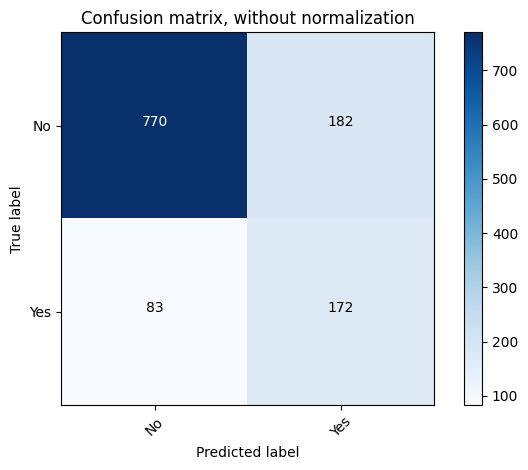

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.90      0.81      0.85       952
         Yes       0.49      0.67      0.56       255

    accuracy                           0.78      1207
   macro avg       0.69      0.74      0.71      1207
weighted avg       0.81      0.78      0.79      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[829 123]
 [113 142]]


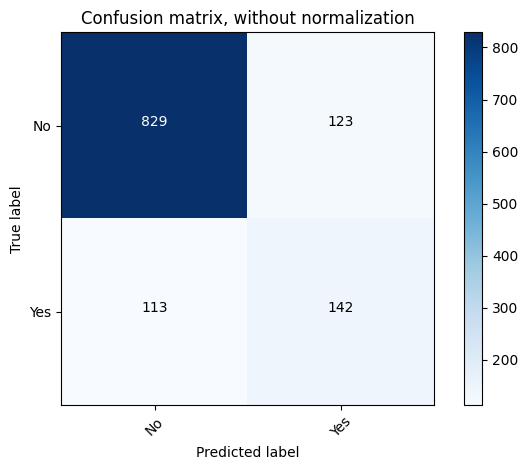

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.88      0.87      0.88       952
         Yes       0.54      0.56      0.55       255

    accuracy                           0.80      1207
   macro avg       0.71      0.71      0.71      1207
weighted avg       0.81      0.80      0.81      1207



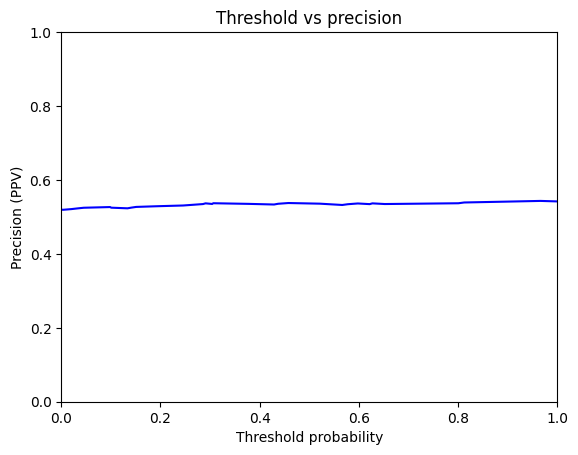

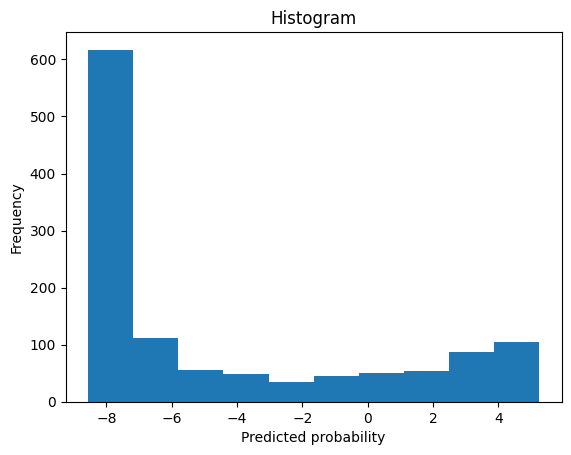

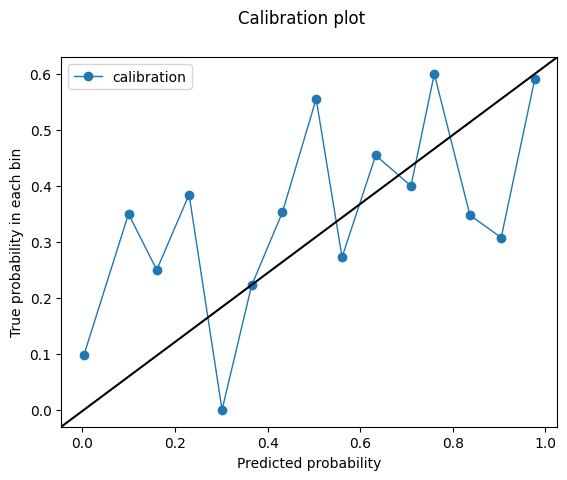

-2.0672581
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt


/tmp/ipykernel_1594248/1975655426.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  themodel.load_state_dict(torch.load(model_type))


Female patients
model type
/data/clin_notes_outcomes/impression_bert/recist/recist_wiki_htransformer_pd.pt
AUC 0.8582633053221289
Outcome probability: 0.2112676056338028
Average precision score: 0.63
Best F1: 0.6408450704225354


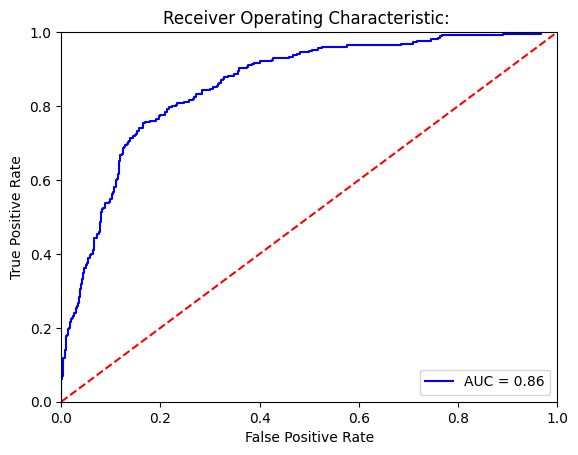

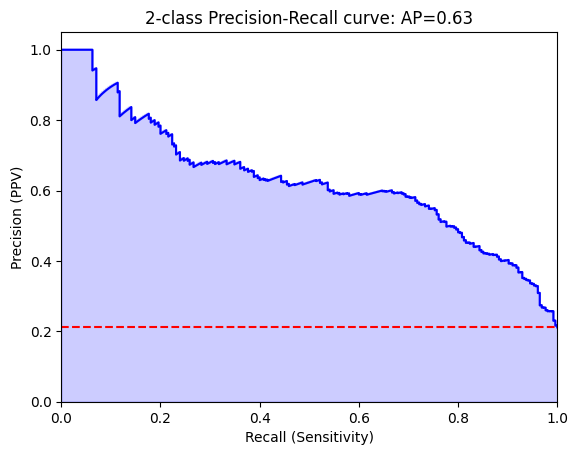

Threshold for best F1:
-1.2429765
Confusion matrix at best F1 thresh:
Confusion matrix, without normalization
[[821 131]
 [ 73 182]]


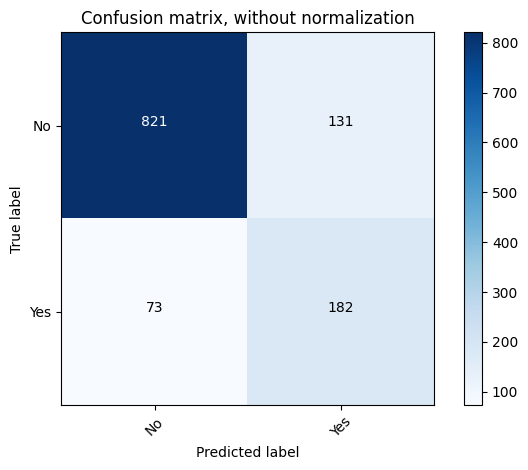

Metrics at best F1 thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.92      0.86      0.89       952
         Yes       0.58      0.71      0.64       255

    accuracy                           0.83      1207
   macro avg       0.75      0.79      0.77      1207
weighted avg       0.85      0.83      0.84      1207

Confusion matrix at 0.5 thresh:
Confusion matrix, without normalization
[[913  39]
 [171  84]]


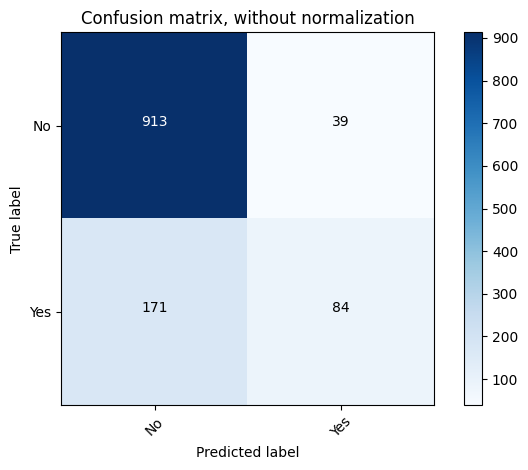

Metrics at 0.5 thresh thresh (specificity is recall for negative class):
              precision    recall  f1-score   support

          No       0.84      0.96      0.90       952
         Yes       0.68      0.33      0.44       255

    accuracy                           0.83      1207
   macro avg       0.76      0.64      0.67      1207
weighted avg       0.81      0.83      0.80      1207



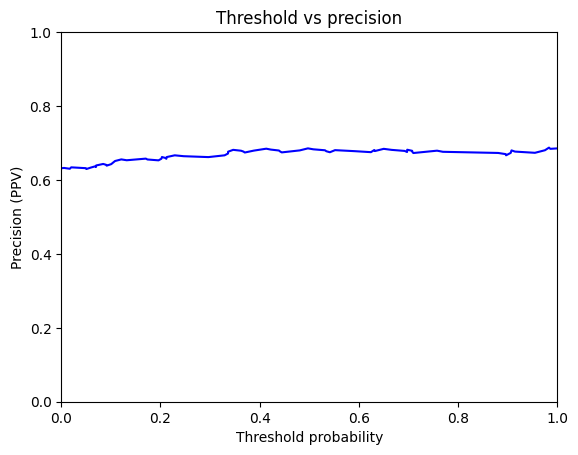

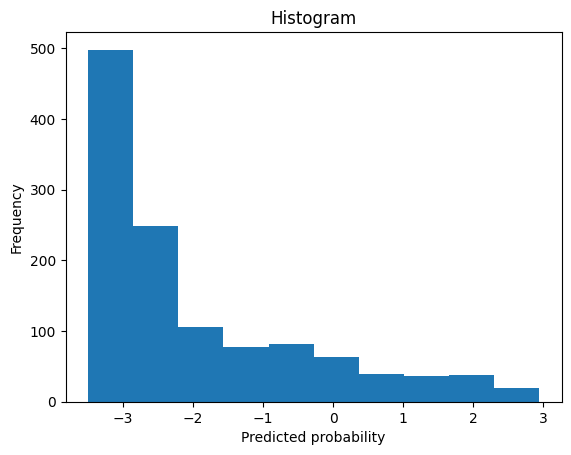

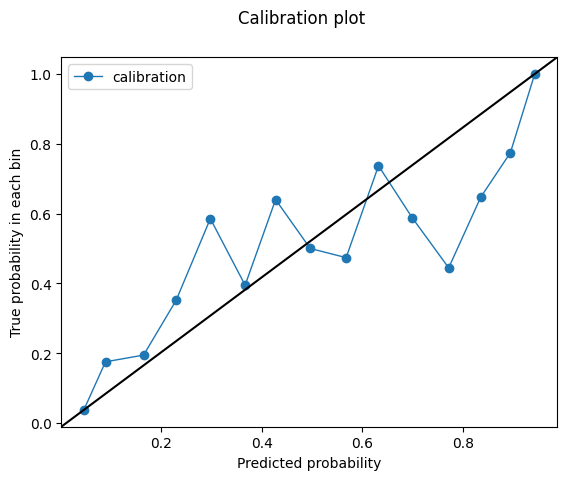

-1.2429765


In [40]:
print('model performance for women')

for model_type in model_paths:

    print('model type')
    print(model_type)
    test = test_full[test_full.GENDER_NM == 'FEMALE'].copy()
    test_day_text = test
    test_day_text['text'] = test_day_text.text.astype(str)

    test_day_text = test_day_text.sort_values(by=['obs','dfci_mrn','time'])

    test_day_text['text'] = test_day_text.groupby(['obs','dfci_mrn','time'])['text'].transform(lambda x: ' '.join(x))
    test_day_text = test_day_text.groupby(['obs','dfci_mrn','time']).first().reset_index()
    #test_day_text.info()

    # write out actual test dataset
    themodel = RecistModel()
    themodel.load_state_dict(torch.load(model_type))
    themodel.to(device)

    no_shuffle_test_dataset = data.DataLoader(RecistDataset(test.sort_values(by=['obs','time'])), batch_size=1, shuffle=False, num_workers=0)

    dflist = []
    for ids, mask, s_times, y_true in no_shuffle_test_dataset:
        thisframe = pd.DataFrame()

        with torch.no_grad():
            y_pred = themodel(ids.to(device), mask.to(device), s_times.to(device))

        thisframe = pd.DataFrame(y_pred.cpu().detach().numpy(), columns=['pd_pred'])

        dflist.append(thisframe)

    resultframe = pd.concat(dflist, axis=0)
    resultframe = resultframe.reset_index(drop=True)


    output = test_day_text.reset_index(drop=True)



    test_output = pd.concat([output, resultframe], axis=1)
    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)






    test_output = test_output.sort_values(by=['obs','dfci_mrn', 'date']).reset_index(drop=True)


    test_output= test_output[test_output.overall_response != 'BL']
    print('Female patients')
    print('model type')
    print(model_type)
    print(eval_model(test_output.pd_pred, test_output.outcome, graph=True))
